In [1]:
# import os
# import random
import numpy
import pandas
import seaborn as sns

from matplotlib import pyplot

# def set_seeds(seed: int):
#     assert seed > 0
#     random.seed(seed)
#     os.environ['PYTHONHASHSEED'] = str(seed)
#     numpy.random.seed(seed)
# set_seeds(seed=42)

sns.set_theme(font="IPAexGothic", font_scale=2)

pyplot.rcParams["figure.figsize"] = (20, 10)


In [2]:
from ipynb.fs.full.prediction_common import build_prophet_model, Evaluator, Limitter, BestEstimator, setup_df_index, setup_limit


In [3]:
from datetime import datetime


g_start_date = datetime.now()
g_start_date

datetime.datetime(2023, 10, 19, 2, 50, 14, 761963)

In [4]:
csv_file = "../data/loan.csv"
_df = pandas.read_csv(csv_file)

In [5]:
_df.head(3)

,年月,変動金利,5年固定,10年固定,35年固定
0,2023年8月,0.32%,1.11%,1.25%,1.72%
1,2023年7月,0.32%,1.06%,1.20%,1.73%
2,2023年6月,0.32%,1.06%,1.25%,1.76%


In [6]:
_df.tail(3)

,年月,変動金利,5年固定,10年固定,35年固定
83,2016年9月,0.50%,0.81%,1.15%,1.37%
84,2016年8月,0.50%,0.72%,1.10%,1.25%
85,2016年7月,0.50%,-,1.20%,1.28%


In [7]:
_df.replace('-', float('nan'), inplace=True)

# パーセンテージを数値に変換
for column in ["変動金利", "5年固定", "10年固定", "35年固定"]:
    _df[column] = _df[column].str.rstrip('%').astype('float')   # / 100.0

# 年月をdatetime型に変換
_df['年月'] = pandas.to_datetime(_df['年月'].str.replace('年', '-').str.replace('月', ''))

# データを年月でソート
_df = _df.sort_values(by='年月')


In [8]:
_df.head(3)

,年月,変動金利,5年固定,10年固定,35年固定
85,2016-07-01,0.5,NaN,1.20,1.28
84,2016-08-01,0.5,0.72,1.10,1.25
83,2016-09-01,0.5,0.81,1.15,1.37


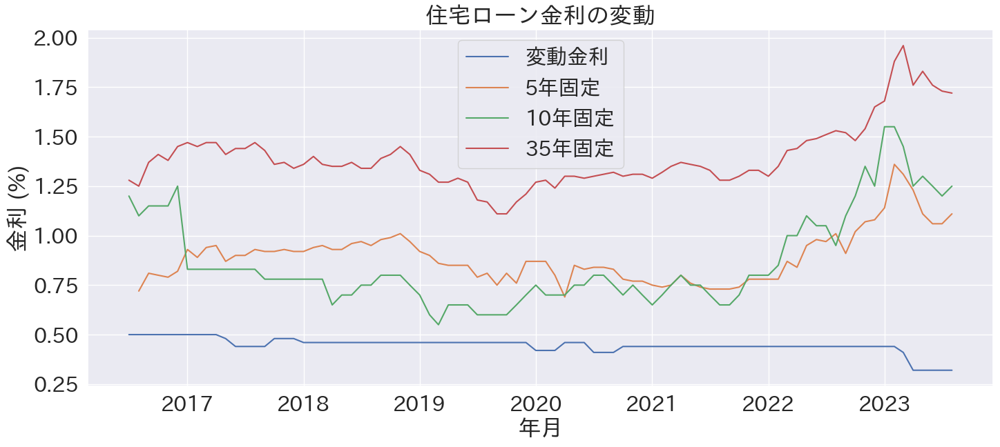

In [9]:
# グラフを再描画
pyplot.figure(figsize=(15, 7))
for column in ["変動金利", "5年固定", "10年固定", "35年固定"]:
    pyplot.plot(_df['年月'], _df[column], label=column)

pyplot.title("住宅ローン金利の変動")
pyplot.xlabel("年月")
pyplot.ylabel("金利 (%)")
pyplot.legend()
pyplot.grid(True)
pyplot.tight_layout()
pyplot.show()


In [10]:
import optuna

from prophet import Prophet
from prophet.diagnostics import cross_validation
from prophet.diagnostics import performance_metrics


In [11]:
# def build_prophet_model(is_longterm=True, **params) -> Prophet:
#    print(f"build_prophet_model: {is_longterm=} {params}")
#    model = Prophet(**params, yearly_seasonality=4)
#    model.add_seasonality(name='triennial', period=365.25*3, fourier_order=1)
#    model.add_seasonality(name='kitchen', period=365.25/12*40, fourier_order=1)
#    if is_longterm:
#       model.add_seasonality(name='quinquennial', period=365.25*5, fourier_order=1)
#       model.add_seasonality(name='decennial_09', period=365.25*9, fourier_order=1)
#       model.add_seasonality(name='decennial_10', period=365.25*10, fourier_order=1)
#    return model


In [12]:
# class Evaluator(object):
#    def __init__(self, df: pandas.DataFrame, n_horizon: int=31*12, freq="3MS") -> None:
#       self.df: pandas.DataFrame = df
#       self.n_horizon: int = n_horizon  # cv prediction range
#       self.freq = freq     # cutoff freq
#       self.max_changepoints = self.df.shape[0]
# 
#    def objective_value(self, trial: optuna.Trial) -> float:
#       params = {
#                "growth" : 
#                   trial.suggest_categorical("growth", ["linear", "logistic", "flat"]),
#                "changepoint_range" : 
#                   trial.suggest_float("changepoint_range", 0.8, 1.0),
#                "n_changepoints" : 
#                   trial.suggest_int("n_changepoints", 1, self.max_changepoints),
#                "changepoint_prior_scale" : 
#                   trial.suggest_float("changepoint_prior_scale", 0.001, 5),
#                "seasonality_prior_scale" : 
#                   trial.suggest_float("seasonality_prior_scale", 0.01, 10),
#                "seasonality_mode" : 
#                   trial.suggest_categorical("seasonality_mode", ["additive", "multiplicative"])
#                }
# 
#       model: Prophet = build_prophet_model(**params)
#       model.fit(self.df)
#       __df_cv, df_pm = self.run_cross_validation(model=model, horizon_scaler=3)
#       n = df_pm.shape[0]
#       # NOTE: 
#       #     - rmse: horizon が長くなる(index が後になる)とエラー幅が増加するので、
#       #             差に敏感な rmse の後半を多めに評価するように逆順で累積する
#       #     - mae : rmse と同じく、horizon が短い間も精度が高くないと困るので、
#       #             前半を多めに評価するように mae を累積する
#       score = numpy.cumsum(df_pm['rmse'].values[::-1]).mean() + numpy.cumsum(df_pm['mae'].values).mean()
#       score /= n     # for intepretability of `score` in optuna.visualizaion
# 
#       return score
# 
#    def run_cross_validation(self, model: Prophet, horizon_scaler: int=2) -> tuple[pandas.DataFrame, pandas.DataFrame]:
#       n_horizon = self.n_horizon
#       date_start = self.df.ds.max() - pandas.Timedelta(days=n_horizon * horizon_scaler)
#       date_end = self.df.ds.max() - pandas.Timedelta(days=n_horizon)
#       cutoffs = pandas.date_range(start=date_start, end=date_end, freq=self.freq)
# 
#       # run cv and metrics
#       df_cv = cross_validation(model, cutoffs=cutoffs, horizon=f"{n_horizon} days", parallel="processes")
#       df_pm = performance_metrics(df_cv)
# 
#       # store context
#       self.date_start = date_start
#       self.date_end = date_end
#       self.cutoffs = cutoffs
# 
#       return df_cv, df_pm
# 

In [13]:
# from dataclasses import dataclass


In [14]:
# @dataclass
# class Limitter(object):
#     df: pandas.DataFrame
# 
#     def __post_init__(self):
#         df = self.df
#         self.floor = df.y.min() - 3 * df.y.std()
#         self.cap = df.y.max() + 3 * df.y.std()
# 
# 
# def setup_limit(df: pandas.DataFrame, lmt: Limitter, inplace=False) -> pandas.DataFrame:
#     _df = df
#     if not inplace:
#         _df = df.copy()
#     _df["floor"] = lmt.floor
#     _df["cap"] = lmt.cap
#     return _df
# 

In [15]:
# @dataclass
# class BestEstimator(object):
#     df: pandas.DataFrame
#     model: Prophet
#     evaluator: Evaluator
#     study: optuna.Study
#     df_cv: dict
#     df_pm: dict
#     future: pandas.DataFrame | None = None
#     forecast: pandas.DataFrame | None = None
# 

In [16]:
g_rate_types = ["変動金利", "5年固定", "10年固定", "35年固定"]
g_rate_types

['変動金利', '5年固定', '10年固定', '35年固定']

# Setup the Bests

In [17]:
n_years = 2
n_predicts = 12 * n_years

bests = {}
for rate_type in g_rate_types:
    # setup
    df = _df.rename({"年月": "ds", rate_type: "y"}, axis=1)[["ds", "y"]]
    lmt = Limitter(df)
    df = setup_limit(df, lmt)
    evl = Evaluator(df=df, n_horizon=31*12)

    # optimize hyper params
    study: optuna.Study = optuna.create_study(direction="minimize")
    study.optimize(evl.objective_value, n_trials=100)

    # rerun cv
    model: Prophet = build_prophet_model(**study.best_params)
    model.fit(df)
    df_cv, df_pm = evl.run_cross_validation(model=model, horizon_scaler=3)

    # predict
    future = model.make_future_dataframe(periods=n_predicts, freq="MS")
    future = setup_limit(future, lmt)
    forecast = model.predict(future)

    # store estimator
    bst = BestEstimator(df=df, model=model, evaluator=evl, study=study, df_cv=df_cv, df_pm=df_pm)
    bst.future = future
    bst.forecast = forecast
    bests[rate_type] = bst


[I 2023-10-19 02:50:17,332] A new study created in memory with name: no-name-76912099-30e7-4a95-b801-692a23f5fafc
02:50:17 - cmdstanpy - INFO - Chain [1] start processing
02:50:17 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.


build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8627943279489719, 'n_changepoints': 20, 'changepoint_prior_scale': 3.7784854509322896, 'seasonality_prior_scale': 9.681310319727148, 'seasonality_mode': 'additive'}


02:50:17 - cmdstanpy - INFO - Chain [1] start processing
02:50:17 - cmdstanpy - INFO - Chain [1] start processing
02:50:17 - cmdstanpy - INFO - Chain [1] start processing
02:50:17 - cmdstanpy - INFO - Chain [1] start processing
02:50:17 - cmdstanpy - INFO - Chain [1] start processing
02:50:17 - cmdstanpy - INFO - Chain [1] start processing
02:50:17 - cmdstanpy - INFO - Chain [1] start processing
02:50:17 - cmdstanpy - INFO - Chain [1] start processing
02:50:17 - cmdstanpy - INFO - Chain [1] done processing
02:50:17 - cmdstanpy - INFO - Chain [1] done processing
02:50:17 - cmdstanpy - INFO - Chain [1] done processing
02:50:17 - cmdstanpy - INFO - Chain [1] done processing
02:50:17 - cmdstanpy - INFO - Chain [1] done processing
02:50:17 - cmdstanpy - INFO - Chain [1] done processing
02:50:17 - cmdstanpy - INFO - Chain [1] done processing
02:50:17 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 02:50:17,887] Trial 0 finished with value: 0.11883727190221023 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9673226824175818, 'n_changepoints': 46, 'changepoint_prior_scale': 4.017679710634351, 'seasonality_prior_scale': 1.644342698371897, 'seasonality_mode': 'additive'}


02:50:18 - cmdstanpy - INFO - Chain [1] start processing
02:50:18 - cmdstanpy - INFO - Chain [1] start processing
02:50:18 - cmdstanpy - INFO - Chain [1] start processing
02:50:18 - cmdstanpy - INFO - Chain [1] start processing
02:50:18 - cmdstanpy - INFO - Chain [1] start processing
02:50:18 - cmdstanpy - INFO - Chain [1] start processing
02:50:18 - cmdstanpy - INFO - Chain [1] start processing
02:50:18 - cmdstanpy - INFO - Chain [1] start processing
02:50:18 - cmdstanpy - INFO - Chain [1] done processing
02:50:18 - cmdstanpy - INFO - Chain [1] done processing
02:50:18 - cmdstanpy - INFO - Chain [1] done processing
02:50:18 - cmdstanpy - INFO - Chain [1] done processing
02:50:18 - cmdstanpy - INFO - Chain [1] done processing
02:50:18 - cmdstanpy - INFO - Chain [1] done processing
02:50:18 - cmdstanpy - INFO - Chain [1] done processing
02:50:18 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 02:50:18,818] Trial 1 finished with value: 0.07778825279788236 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.894938058960212, 'n_changepoints': 64, 'changepoint_prior_scale': 3.9562712049507347, 'seasonality_prior_scale': 3.6216163378416857, 'seasonality_mode': 'multiplicative'}


02:50:20 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:50:20 - cmdstanpy - INFO - Chain [1] start processing
02:50:20 - cmdstanpy - INFO - Chain [1] start processing
02:50:20 - cmdstanpy - INFO - Chain [1] start processing
02:50:20 - cmdstanpy - INFO - Chain [1] start processing
02:50:20 - cmdstanpy - INFO - Chain [1] start processing
02:50:20 - cmdstanpy - INFO - Chain [1] start processing
02:50:20 - cmdstanpy - INFO - Chain [1] start processing
02:50:20 - cmdstanpy - INFO - Chain [1] start processing
02:50:57 - cmdstanpy - INFO - Chain [1] done processing
02:51:02 - cmdstanpy - INFO - Chain [1] done processing
02:51:06 - cmdstanpy - INFO - Chain [1] done processing
02:51:08 - cmdstanpy - INFO - Chain [1] done processing
02:51:11 - cmdstanpy - INFO - Chain [1] done processing
02:51:13 - cmdstanpy - INFO - Chain [1] done processing
02:51:15 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.8619476591540283, 'n_changepoints': 64, 'changepoint_prior_scale': 1.9339504067630486, 'seasonality_prior_scale': 1.4281029731396462, 'seasonality_mode': 'additive'}


02:51:19 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:51:19 - cmdstanpy - INFO - Chain [1] start processing
02:51:19 - cmdstanpy - INFO - Chain [1] start processing
02:51:19 - cmdstanpy - INFO - Chain [1] start processing
02:51:19 - cmdstanpy - INFO - Chain [1] start processing
02:51:19 - cmdstanpy - INFO - Chain [1] start processing
02:51:19 - cmdstanpy - INFO - Chain [1] start processing
02:51:19 - cmdstanpy - INFO - Chain [1] start processing
02:51:19 - cmdstanpy - INFO - Chain [1] start processing
02:51:21 - cmdstanpy - INFO - Chain [1] done processing
02:51:21 - cmdstanpy - INFO - Chain [1] done processing
02:51:21 - cmdstanpy - INFO - Chain [1] done processing
02:51:21 - cmdstanpy - INFO - Chain [1] done processing
02:51:21 - cmdstanpy - INFO - Chain [1] done processing
02:51:21 - cmdstanpy - INFO - Chain [1] done processing
02:51:22 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.9378457638433523, 'n_changepoints': 64, 'changepoint_prior_scale': 1.2849935145889848, 'seasonality_prior_scale': 0.7920166542801717, 'seasonality_mode': 'multiplicative'}


02:51:25 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:51:25 - cmdstanpy - INFO - Chain [1] start processing
02:51:25 - cmdstanpy - INFO - Chain [1] start processing
02:51:25 - cmdstanpy - INFO - Chain [1] start processing
02:51:25 - cmdstanpy - INFO - Chain [1] start processing
02:51:25 - cmdstanpy - INFO - Chain [1] start processing
02:51:25 - cmdstanpy - INFO - Chain [1] start processing
02:51:25 - cmdstanpy - INFO - Chain [1] start processing
02:51:25 - cmdstanpy - INFO - Chain [1] start processing
02:51:27 - cmdstanpy - INFO - Chain [1] done processing
02:51:27 - cmdstanpy - INFO - Chain [1] done processing
02:51:28 - cmdstanpy - INFO - Chain [1] done processing
02:51:28 - cmdstanpy - INFO - Chain [1] done processing
02:51:29 - cmdstanpy - INFO - Chain [1] done processing
02:51:29 - cmdstanpy - INFO - Chain [1] done processing
02:51:29 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.8458111631901771, 'n_changepoints': 85, 'changepoint_prior_scale': 2.2262779958672883, 'seasonality_prior_scale': 8.921538834399573, 'seasonality_mode': 'multiplicative'}


02:51:32 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:51:32 - cmdstanpy - INFO - Chain [1] start processing
02:51:32 - cmdstanpy - INFO - Chain [1] start processing
02:51:32 - cmdstanpy - INFO - Chain [1] start processing
02:51:32 - cmdstanpy - INFO - Chain [1] start processing
02:51:32 - cmdstanpy - INFO - Chain [1] start processing
02:51:32 - cmdstanpy - INFO - Chain [1] start processing
02:51:32 - cmdstanpy - INFO - Chain [1] start processing
02:51:32 - cmdstanpy - INFO - Chain [1] start processing
02:52:09 - cmdstanpy - INFO - Chain [1] done processing
02:52:10 - cmdstanpy - INFO - Chain [1] done processing
02:52:15 - cmdstanpy - INFO - Chain [1] done processing
02:52:15 - cmdstanpy - INFO - Chain [1] done processing
02:52:18 - cmdstanpy - INFO - Chain [1] done processing
02:52:19 - cmdstanpy - INFO - Chain [1] done processing
02:52:20 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.8416578340652181, 'n_changepoints': 83, 'changepoint_prior_scale': 3.1080937572582124, 'seasonality_prior_scale': 5.32158902110133, 'seasonality_mode': 'multiplicative'}


02:52:37 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:52:37 - cmdstanpy - INFO - Chain [1] start processing
02:52:37 - cmdstanpy - INFO - Chain [1] start processing
02:52:37 - cmdstanpy - INFO - Chain [1] start processing
02:52:37 - cmdstanpy - INFO - Chain [1] start processing
02:52:37 - cmdstanpy - INFO - Chain [1] start processing
02:52:37 - cmdstanpy - INFO - Chain [1] start processing
02:52:37 - cmdstanpy - INFO - Chain [1] start processing
02:52:37 - cmdstanpy - INFO - Chain [1] start processing
02:52:39 - cmdstanpy - INFO - Chain [1] done processing
02:53:16 - cmdstanpy - INFO - Chain [1] done processing
02:53:26 - cmdstanpy - INFO - Chain [1] done processing
02:53:31 - cmdstanpy - INFO - Chain [1] done processing
02:53:32 - cmdstanpy - INFO - Chain [1] done processing
02:53:34 - cmdstanpy - INFO - Chain [1] done processing
02:53:37 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.8788605452653142, 'n_changepoints': 86, 'changepoint_prior_scale': 3.951462272056453, 'seasonality_prior_scale': 0.9761200895542465, 'seasonality_mode': 'additive'}


02:53:41 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:53:41 - cmdstanpy - INFO - Chain [1] start processing
02:53:41 - cmdstanpy - INFO - Chain [1] start processing
02:53:41 - cmdstanpy - INFO - Chain [1] start processing
02:53:41 - cmdstanpy - INFO - Chain [1] start processing
02:53:41 - cmdstanpy - INFO - Chain [1] start processing
02:53:41 - cmdstanpy - INFO - Chain [1] start processing
02:53:41 - cmdstanpy - INFO - Chain [1] start processing
02:53:41 - cmdstanpy - INFO - Chain [1] start processing
02:53:42 - cmdstanpy - INFO - Chain [1] done processing
02:54:16 - cmdstanpy - INFO - Chain [1] done processing
02:54:21 - cmdstanpy - INFO - Chain [1] done processing
02:54:22 - cmdstanpy - INFO - Chain [1] done processing
02:54:23 - cmdstanpy - INFO - Chain [1] done processing
02:54:30 - cmdstanpy - INFO - Chain [1] done processing
02:54:30 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.99896120199337, 'n_changepoints': 25, 'changepoint_prior_scale': 2.1878781564287557, 'seasonality_prior_scale': 6.7305873624954184, 'seasonality_mode': 'additive'}


02:54:34 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:54:34 - cmdstanpy - INFO - Chain [1] start processing
02:54:34 - cmdstanpy - INFO - Chain [1] start processing
02:54:34 - cmdstanpy - INFO - Chain [1] start processing
02:54:34 - cmdstanpy - INFO - Chain [1] start processing
02:54:34 - cmdstanpy - INFO - Chain [1] start processing
02:54:34 - cmdstanpy - INFO - Chain [1] start processing
02:54:34 - cmdstanpy - INFO - Chain [1] start processing
02:54:34 - cmdstanpy - INFO - Chain [1] start processing
02:54:35 - cmdstanpy - INFO - Chain [1] done processing
02:54:35 - cmdstanpy - INFO - Chain [1] done processing
02:54:35 - cmdstanpy - INFO - Chain [1] done processing
02:54:35 - cmdstanpy - INFO - Chain [1] done processing
02:54:35 - cmdstanpy - INFO - Chain [1] done processing
02:54:35 - cmdstanpy - INFO - Chain [1] done processing
02:54:35 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.9362369406582323, 'n_changepoints': 4, 'changepoint_prior_scale': 2.8305562991973177, 'seasonality_prior_scale': 1.5027937099785103, 'seasonality_mode': 'multiplicative'}


02:54:36 - cmdstanpy - INFO - Chain [1] start processing
02:54:36 - cmdstanpy - INFO - Chain [1] start processing
02:54:36 - cmdstanpy - INFO - Chain [1] start processing
02:54:36 - cmdstanpy - INFO - Chain [1] start processing
02:54:36 - cmdstanpy - INFO - Chain [1] start processing
02:54:36 - cmdstanpy - INFO - Chain [1] start processing
02:54:36 - cmdstanpy - INFO - Chain [1] start processing
02:54:36 - cmdstanpy - INFO - Chain [1] start processing
02:54:36 - cmdstanpy - INFO - Chain [1] done processing
02:54:36 - cmdstanpy - INFO - Chain [1] done processing
02:54:36 - cmdstanpy - INFO - Chain [1] done processing
02:54:36 - cmdstanpy - INFO - Chain [1] done processing
02:54:36 - cmdstanpy - INFO - Chain [1] done processing
02:54:36 - cmdstanpy - INFO - Chain [1] done processing
02:54:36 - cmdstanpy - INFO - Chain [1] done processing
02:54:36 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 02:54:36,732] Trial 9 finished with value: 0.4030943298687773 and parameters: {'gr

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.815019702458362, 'n_changepoints': 41, 'changepoint_prior_scale': 4.740839079514526, 'seasonality_prior_scale': 3.569322285555007, 'seasonality_mode': 'additive'}


02:54:37 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:54:37 - cmdstanpy - INFO - Chain [1] start processing
02:54:37 - cmdstanpy - INFO - Chain [1] start processing
02:54:37 - cmdstanpy - INFO - Chain [1] start processing
02:54:37 - cmdstanpy - INFO - Chain [1] start processing
02:54:37 - cmdstanpy - INFO - Chain [1] start processing
02:54:37 - cmdstanpy - INFO - Chain [1] start processing
02:54:37 - cmdstanpy - INFO - Chain [1] start processing
02:54:37 - cmdstanpy - INFO - Chain [1] start processing
02:54:37 - cmdstanpy - INFO - Chain [1] done processing
02:54:37 - cmdstanpy - INFO - Chain [1] done processing
02:54:37 - cmdstanpy - INFO - Chain [1] done processing
02:54:37 - cmdstanpy - INFO - Chain [1] done processing
02:54:37 - cmdstanpy - INFO - Chain [1] done processing
02:54:37 - cmdstanpy - INFO - Chain [1] done processing
02:54:37 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9216952242765805, 'n_changepoints': 54, 'changepoint_prior_scale': 0.08389349654960077, 'seasonality_prior_scale': 0.14295889334980916, 'seasonality_mode': 'additive'}


02:54:37 - cmdstanpy - INFO - Chain [1] start processing
02:54:37 - cmdstanpy - INFO - Chain [1] start processing
02:54:37 - cmdstanpy - INFO - Chain [1] start processing
02:54:37 - cmdstanpy - INFO - Chain [1] start processing
02:54:37 - cmdstanpy - INFO - Chain [1] start processing
02:54:37 - cmdstanpy - INFO - Chain [1] start processing
02:54:37 - cmdstanpy - INFO - Chain [1] start processing
02:54:37 - cmdstanpy - INFO - Chain [1] start processing
02:54:37 - cmdstanpy - INFO - Chain [1] done processing
02:54:37 - cmdstanpy - INFO - Chain [1] done processing
02:54:37 - cmdstanpy - INFO - Chain [1] done processing
02:54:37 - cmdstanpy - INFO - Chain [1] done processing
02:54:37 - cmdstanpy - INFO - Chain [1] done processing
02:54:37 - cmdstanpy - INFO - Chain [1] done processing
02:54:37 - cmdstanpy - INFO - Chain [1] done processing
02:54:38 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 02:54:38,120] Trial 11 finished with value: 0.02334053813354244 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9477138809643362, 'n_changepoints': 45, 'changepoint_prior_scale': 0.1688507259126794, 'seasonality_prior_scale': 0.1825789945713554, 'seasonality_mode': 'additive'}


02:54:38 - cmdstanpy - INFO - Chain [1] start processing
02:54:38 - cmdstanpy - INFO - Chain [1] start processing
02:54:38 - cmdstanpy - INFO - Chain [1] start processing
02:54:38 - cmdstanpy - INFO - Chain [1] start processing
02:54:38 - cmdstanpy - INFO - Chain [1] start processing
02:54:38 - cmdstanpy - INFO - Chain [1] start processing
02:54:38 - cmdstanpy - INFO - Chain [1] start processing
02:54:38 - cmdstanpy - INFO - Chain [1] start processing
02:54:38 - cmdstanpy - INFO - Chain [1] done processing
02:54:38 - cmdstanpy - INFO - Chain [1] done processing
02:54:38 - cmdstanpy - INFO - Chain [1] done processing
02:54:38 - cmdstanpy - INFO - Chain [1] done processing
02:54:38 - cmdstanpy - INFO - Chain [1] done processing
02:54:38 - cmdstanpy - INFO - Chain [1] done processing
02:54:38 - cmdstanpy - INFO - Chain [1] done processing
02:54:40 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 02:54:40,613] Trial 12 finished with value: 0.025468603588973553 and parameters: {

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9184031832204345, 'n_changepoints': 40, 'changepoint_prior_scale': 0.1352923011156073, 'seasonality_prior_scale': 0.017013843886193453, 'seasonality_mode': 'additive'}


02:54:40 - cmdstanpy - INFO - Chain [1] start processing
02:54:40 - cmdstanpy - INFO - Chain [1] start processing
02:54:40 - cmdstanpy - INFO - Chain [1] start processing
02:54:40 - cmdstanpy - INFO - Chain [1] start processing
02:54:40 - cmdstanpy - INFO - Chain [1] start processing
02:54:40 - cmdstanpy - INFO - Chain [1] start processing
02:54:40 - cmdstanpy - INFO - Chain [1] start processing
02:54:40 - cmdstanpy - INFO - Chain [1] start processing
02:54:40 - cmdstanpy - INFO - Chain [1] done processing
02:54:40 - cmdstanpy - INFO - Chain [1] done processing
02:54:40 - cmdstanpy - INFO - Chain [1] done processing
02:54:40 - cmdstanpy - INFO - Chain [1] done processing
02:54:40 - cmdstanpy - INFO - Chain [1] done processing
02:54:40 - cmdstanpy - INFO - Chain [1] done processing
02:54:40 - cmdstanpy - INFO - Chain [1] done processing
02:54:41 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 02:54:41,311] Trial 13 finished with value: 0.01832473324032764 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9087875870264694, 'n_changepoints': 32, 'changepoint_prior_scale': 0.16240031885381642, 'seasonality_prior_scale': 0.08065590690430913, 'seasonality_mode': 'additive'}


02:54:41 - cmdstanpy - INFO - Chain [1] start processing
02:54:41 - cmdstanpy - INFO - Chain [1] start processing
02:54:41 - cmdstanpy - INFO - Chain [1] start processing
02:54:41 - cmdstanpy - INFO - Chain [1] start processing
02:54:41 - cmdstanpy - INFO - Chain [1] start processing
02:54:41 - cmdstanpy - INFO - Chain [1] start processing
02:54:41 - cmdstanpy - INFO - Chain [1] start processing
02:54:41 - cmdstanpy - INFO - Chain [1] start processing
02:54:41 - cmdstanpy - INFO - Chain [1] done processing
02:54:41 - cmdstanpy - INFO - Chain [1] done processing
02:54:41 - cmdstanpy - INFO - Chain [1] done processing
02:54:41 - cmdstanpy - INFO - Chain [1] done processing
02:54:41 - cmdstanpy - INFO - Chain [1] done processing
02:54:41 - cmdstanpy - INFO - Chain [1] done processing
02:54:48 - cmdstanpy - INFO - Chain [1] done processing
02:54:50 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 02:54:50,767] Trial 14 finished with value: 0.020021090042556585 and parameters: {

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9037824116889446, 'n_changepoints': 25, 'changepoint_prior_scale': 0.7910160615982643, 'seasonality_prior_scale': 2.891362873365463, 'seasonality_mode': 'additive'}


02:54:51 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:54:51 - cmdstanpy - INFO - Chain [1] start processing
02:54:51 - cmdstanpy - INFO - Chain [1] start processing
02:54:51 - cmdstanpy - INFO - Chain [1] start processing
02:54:51 - cmdstanpy - INFO - Chain [1] start processing
02:54:51 - cmdstanpy - INFO - Chain [1] start processing
02:54:51 - cmdstanpy - INFO - Chain [1] start processing
02:54:51 - cmdstanpy - INFO - Chain [1] start processing
02:54:51 - cmdstanpy - INFO - Chain [1] start processing
02:54:51 - cmdstanpy - INFO - Chain [1] done processing
02:54:51 - cmdstanpy - INFO - Chain [1] done processing
02:54:51 - cmdstanpy - INFO - Chain [1] done processing
02:54:51 - cmdstanpy - INFO - Chain [1] done processing
02:54:51 - cmdstanpy - INFO - Chain [1] done processing
02:54:51 - cmdstanpy - INFO - Chain [1] done processing
02:54:51 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9085552264689098, 'n_changepoints': 34, 'changepoint_prior_scale': 0.8913123276511564, 'seasonality_prior_scale': 2.4131537410168153, 'seasonality_mode': 'additive'}


02:54:52 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:54:52 - cmdstanpy - INFO - Chain [1] start processing
02:54:52 - cmdstanpy - INFO - Chain [1] start processing
02:54:52 - cmdstanpy - INFO - Chain [1] start processing
02:54:52 - cmdstanpy - INFO - Chain [1] start processing
02:54:52 - cmdstanpy - INFO - Chain [1] start processing
02:54:52 - cmdstanpy - INFO - Chain [1] start processing
02:54:52 - cmdstanpy - INFO - Chain [1] start processing
02:54:52 - cmdstanpy - INFO - Chain [1] start processing
02:54:52 - cmdstanpy - INFO - Chain [1] done processing
02:54:52 - cmdstanpy - INFO - Chain [1] done processing
02:54:52 - cmdstanpy - INFO - Chain [1] done processing
02:54:52 - cmdstanpy - INFO - Chain [1] done processing
02:54:52 - cmdstanpy - INFO - Chain [1] done processing
02:54:52 - cmdstanpy - INFO - Chain [1] done processing
02:54:52 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.893704221744334, 'n_changepoints': 9, 'changepoint_prior_scale': 1.515661318891899, 'seasonality_prior_scale': 2.422565070276243, 'seasonality_mode': 'additive'}


02:54:52 - cmdstanpy - INFO - Chain [1] start processing
02:54:52 - cmdstanpy - INFO - Chain [1] start processing
02:54:52 - cmdstanpy - INFO - Chain [1] start processing
02:54:52 - cmdstanpy - INFO - Chain [1] start processing
02:54:52 - cmdstanpy - INFO - Chain [1] start processing
02:54:52 - cmdstanpy - INFO - Chain [1] start processing
02:54:52 - cmdstanpy - INFO - Chain [1] start processing
02:54:52 - cmdstanpy - INFO - Chain [1] start processing
02:54:52 - cmdstanpy - INFO - Chain [1] done processing
02:54:52 - cmdstanpy - INFO - Chain [1] done processing
02:54:52 - cmdstanpy - INFO - Chain [1] done processing
02:54:52 - cmdstanpy - INFO - Chain [1] done processing
02:54:52 - cmdstanpy - INFO - Chain [1] done processing
02:54:52 - cmdstanpy - INFO - Chain [1] done processing
02:54:52 - cmdstanpy - INFO - Chain [1] done processing
02:54:52 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 02:54:53,012] Trial 17 finished with value: 0.09115548502781821 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.917380955266954, 'n_changepoints': 34, 'changepoint_prior_scale': 0.5034287550715086, 'seasonality_prior_scale': 0.08663703099505375, 'seasonality_mode': 'additive'}


02:54:53 - cmdstanpy - INFO - Chain [1] start processing
02:54:53 - cmdstanpy - INFO - Chain [1] start processing
02:54:53 - cmdstanpy - INFO - Chain [1] start processing
02:54:53 - cmdstanpy - INFO - Chain [1] start processing
02:54:53 - cmdstanpy - INFO - Chain [1] start processing
02:54:53 - cmdstanpy - INFO - Chain [1] start processing
02:54:53 - cmdstanpy - INFO - Chain [1] start processing
02:54:53 - cmdstanpy - INFO - Chain [1] start processing
02:54:53 - cmdstanpy - INFO - Chain [1] done processing
02:54:53 - cmdstanpy - INFO - Chain [1] done processing
02:54:53 - cmdstanpy - INFO - Chain [1] done processing
02:54:53 - cmdstanpy - INFO - Chain [1] done processing
02:54:53 - cmdstanpy - INFO - Chain [1] done processing
02:54:53 - cmdstanpy - INFO - Chain [1] done processing
02:54:53 - cmdstanpy - INFO - Chain [1] done processing
02:54:54 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 02:54:55,007] Trial 18 finished with value: 0.020357519164924908 and parameters: {

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8825687821254053, 'n_changepoints': 12, 'changepoint_prior_scale': 0.02166742209836832, 'seasonality_prior_scale': 4.746617211474754, 'seasonality_mode': 'additive'}


02:54:55 - cmdstanpy - INFO - Chain [1] start processing
02:54:55 - cmdstanpy - INFO - Chain [1] start processing
02:54:55 - cmdstanpy - INFO - Chain [1] start processing
02:54:55 - cmdstanpy - INFO - Chain [1] start processing
02:54:55 - cmdstanpy - INFO - Chain [1] start processing
02:54:55 - cmdstanpy - INFO - Chain [1] start processing
02:54:55 - cmdstanpy - INFO - Chain [1] start processing
02:54:55 - cmdstanpy - INFO - Chain [1] start processing
02:54:55 - cmdstanpy - INFO - Chain [1] done processing
02:54:55 - cmdstanpy - INFO - Chain [1] done processing
02:54:55 - cmdstanpy - INFO - Chain [1] done processing
02:54:55 - cmdstanpy - INFO - Chain [1] done processing
02:54:55 - cmdstanpy - INFO - Chain [1] done processing
02:54:55 - cmdstanpy - INFO - Chain [1] done processing
02:54:55 - cmdstanpy - INFO - Chain [1] done processing
02:54:55 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 02:54:55,533] Trial 19 finished with value: 0.11033527621538698 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9620379823133856, 'n_changepoints': 56, 'changepoint_prior_scale': 1.2133410598403482, 'seasonality_prior_scale': 0.028209720165463373, 'seasonality_mode': 'additive'}


02:54:55 - cmdstanpy - INFO - Chain [1] start processing
02:54:55 - cmdstanpy - INFO - Chain [1] start processing
02:54:55 - cmdstanpy - INFO - Chain [1] start processing
02:54:55 - cmdstanpy - INFO - Chain [1] start processing
02:54:55 - cmdstanpy - INFO - Chain [1] start processing
02:54:55 - cmdstanpy - INFO - Chain [1] start processing
02:54:55 - cmdstanpy - INFO - Chain [1] start processing
02:54:55 - cmdstanpy - INFO - Chain [1] start processing
02:54:55 - cmdstanpy - INFO - Chain [1] done processing
02:54:55 - cmdstanpy - INFO - Chain [1] done processing
02:54:55 - cmdstanpy - INFO - Chain [1] done processing
02:54:55 - cmdstanpy - INFO - Chain [1] done processing
02:54:55 - cmdstanpy - INFO - Chain [1] done processing
02:54:55 - cmdstanpy - INFO - Chain [1] done processing
02:54:55 - cmdstanpy - INFO - Chain [1] done processing
02:54:55 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 02:54:56,037] Trial 20 finished with value: 0.01797750288326108 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.960189745712823, 'n_changepoints': 54, 'changepoint_prior_scale': 0.5440272485976898, 'seasonality_prior_scale': 0.01195179479597461, 'seasonality_mode': 'additive'}


02:54:56 - cmdstanpy - INFO - Chain [1] start processing
02:54:56 - cmdstanpy - INFO - Chain [1] start processing
02:54:56 - cmdstanpy - INFO - Chain [1] start processing
02:54:56 - cmdstanpy - INFO - Chain [1] start processing
02:54:56 - cmdstanpy - INFO - Chain [1] start processing
02:54:56 - cmdstanpy - INFO - Chain [1] start processing
02:54:56 - cmdstanpy - INFO - Chain [1] start processing
02:54:56 - cmdstanpy - INFO - Chain [1] start processing
02:54:56 - cmdstanpy - INFO - Chain [1] done processing
02:54:56 - cmdstanpy - INFO - Chain [1] done processing
02:54:56 - cmdstanpy - INFO - Chain [1] done processing
02:54:56 - cmdstanpy - INFO - Chain [1] done processing
02:54:56 - cmdstanpy - INFO - Chain [1] done processing
02:54:56 - cmdstanpy - INFO - Chain [1] done processing
02:54:56 - cmdstanpy - INFO - Chain [1] done processing
02:54:56 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 02:54:56,554] Trial 21 finished with value: 0.018762617797569114 and parameters: {

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9658008149087437, 'n_changepoints': 53, 'changepoint_prior_scale': 0.8132323761547505, 'seasonality_prior_scale': 1.2831577848180398, 'seasonality_mode': 'additive'}


02:54:56 - cmdstanpy - INFO - Chain [1] start processing
02:54:56 - cmdstanpy - INFO - Chain [1] start processing
02:54:56 - cmdstanpy - INFO - Chain [1] start processing
02:54:56 - cmdstanpy - INFO - Chain [1] start processing
02:54:56 - cmdstanpy - INFO - Chain [1] start processing
02:54:56 - cmdstanpy - INFO - Chain [1] start processing
02:54:56 - cmdstanpy - INFO - Chain [1] start processing
02:54:56 - cmdstanpy - INFO - Chain [1] start processing
02:54:56 - cmdstanpy - INFO - Chain [1] done processing
02:54:56 - cmdstanpy - INFO - Chain [1] done processing
02:54:56 - cmdstanpy - INFO - Chain [1] done processing
02:54:56 - cmdstanpy - INFO - Chain [1] done processing
02:54:57 - cmdstanpy - INFO - Chain [1] done processing
02:54:57 - cmdstanpy - INFO - Chain [1] done processing
02:54:57 - cmdstanpy - INFO - Chain [1] done processing
02:54:57 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 02:54:57,440] Trial 22 finished with value: 0.051959956694904476 and parameters: {

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9584312435555805, 'n_changepoints': 72, 'changepoint_prior_scale': 1.2965446423940465, 'seasonality_prior_scale': 0.7371948588056134, 'seasonality_mode': 'additive'}


02:54:57 - cmdstanpy - INFO - Chain [1] start processing
02:54:57 - cmdstanpy - INFO - Chain [1] start processing
02:54:57 - cmdstanpy - INFO - Chain [1] start processing
02:54:57 - cmdstanpy - INFO - Chain [1] start processing
02:54:57 - cmdstanpy - INFO - Chain [1] start processing
02:54:57 - cmdstanpy - INFO - Chain [1] start processing
02:54:57 - cmdstanpy - INFO - Chain [1] start processing
02:54:57 - cmdstanpy - INFO - Chain [1] start processing
02:54:57 - cmdstanpy - INFO - Chain [1] done processing
02:54:57 - cmdstanpy - INFO - Chain [1] done processing
02:54:57 - cmdstanpy - INFO - Chain [1] done processing
02:54:57 - cmdstanpy - INFO - Chain [1] done processing
02:54:57 - cmdstanpy - INFO - Chain [1] done processing
02:54:57 - cmdstanpy - INFO - Chain [1] done processing
02:54:57 - cmdstanpy - INFO - Chain [1] done processing
02:54:57 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 02:54:58,056] Trial 23 finished with value: 0.05062254782688838 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9763329707994474, 'n_changepoints': 57, 'changepoint_prior_scale': 0.5259686286654881, 'seasonality_prior_scale': 2.35748566990072, 'seasonality_mode': 'additive'}


02:54:59 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:54:59 - cmdstanpy - INFO - Chain [1] start processing
02:54:59 - cmdstanpy - INFO - Chain [1] start processing
02:54:59 - cmdstanpy - INFO - Chain [1] start processing
02:54:59 - cmdstanpy - INFO - Chain [1] start processing
02:54:59 - cmdstanpy - INFO - Chain [1] start processing
02:54:59 - cmdstanpy - INFO - Chain [1] start processing
02:54:59 - cmdstanpy - INFO - Chain [1] start processing
02:54:59 - cmdstanpy - INFO - Chain [1] start processing
02:54:59 - cmdstanpy - INFO - Chain [1] done processing
02:54:59 - cmdstanpy - INFO - Chain [1] done processing
02:54:59 - cmdstanpy - INFO - Chain [1] done processing
02:54:59 - cmdstanpy - INFO - Chain [1] done processing
02:54:59 - cmdstanpy - INFO - Chain [1] done processing
02:54:59 - cmdstanpy - INFO - Chain [1] done processing
02:54:59 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9844627520967911, 'n_changepoints': 40, 'changepoint_prior_scale': 1.539453198527583, 'seasonality_prior_scale': 1.7113559966110194, 'seasonality_mode': 'additive'}


02:55:05 - cmdstanpy - INFO - Chain [1] start processing
02:55:05 - cmdstanpy - INFO - Chain [1] start processing
02:55:05 - cmdstanpy - INFO - Chain [1] start processing
02:55:05 - cmdstanpy - INFO - Chain [1] start processing
02:55:05 - cmdstanpy - INFO - Chain [1] start processing
02:55:05 - cmdstanpy - INFO - Chain [1] start processing
02:55:05 - cmdstanpy - INFO - Chain [1] start processing
02:55:05 - cmdstanpy - INFO - Chain [1] start processing
02:55:05 - cmdstanpy - INFO - Chain [1] done processing
02:55:05 - cmdstanpy - INFO - Chain [1] done processing
02:55:05 - cmdstanpy - INFO - Chain [1] done processing
02:55:05 - cmdstanpy - INFO - Chain [1] done processing
02:55:05 - cmdstanpy - INFO - Chain [1] done processing
02:55:05 - cmdstanpy - INFO - Chain [1] done processing
02:55:05 - cmdstanpy - INFO - Chain [1] done processing
02:55:06 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 02:55:06,495] Trial 25 finished with value: 0.07788726975171929 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9514107881490723, 'n_changepoints': 75, 'changepoint_prior_scale': 1.0365141434359189, 'seasonality_prior_scale': 0.7523134868285644, 'seasonality_mode': 'multiplicative'}


02:55:07 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:55:07 - cmdstanpy - INFO - Chain [1] start processing
02:55:07 - cmdstanpy - INFO - Chain [1] start processing
02:55:07 - cmdstanpy - INFO - Chain [1] start processing
02:55:07 - cmdstanpy - INFO - Chain [1] start processing
02:55:07 - cmdstanpy - INFO - Chain [1] start processing
02:55:07 - cmdstanpy - INFO - Chain [1] start processing
02:55:07 - cmdstanpy - INFO - Chain [1] start processing
02:55:07 - cmdstanpy - INFO - Chain [1] start processing
02:55:07 - cmdstanpy - INFO - Chain [1] done processing
02:55:07 - cmdstanpy - INFO - Chain [1] done processing
02:55:07 - cmdstanpy - INFO - Chain [1] done processing
02:55:07 - cmdstanpy - INFO - Chain [1] done processing
02:55:07 - cmdstanpy - INFO - Chain [1] done processing
02:55:07 - cmdstanpy - INFO - Chain [1] done processing
02:55:07 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9306740804346996, 'n_changepoints': 50, 'changepoint_prior_scale': 0.489453915291802, 'seasonality_prior_scale': 1.9673483526562832, 'seasonality_mode': 'additive'}


02:55:07 - cmdstanpy - INFO - Chain [1] start processing
02:55:07 - cmdstanpy - INFO - Chain [1] start processing
02:55:07 - cmdstanpy - INFO - Chain [1] start processing
02:55:07 - cmdstanpy - INFO - Chain [1] start processing
02:55:07 - cmdstanpy - INFO - Chain [1] start processing
02:55:07 - cmdstanpy - INFO - Chain [1] start processing
02:55:07 - cmdstanpy - INFO - Chain [1] start processing
02:55:07 - cmdstanpy - INFO - Chain [1] start processing
02:55:07 - cmdstanpy - INFO - Chain [1] done processing
02:55:07 - cmdstanpy - INFO - Chain [1] done processing
02:55:07 - cmdstanpy - INFO - Chain [1] done processing
02:55:07 - cmdstanpy - INFO - Chain [1] done processing
02:55:07 - cmdstanpy - INFO - Chain [1] done processing
02:55:08 - cmdstanpy - INFO - Chain [1] done processing
02:55:08 - cmdstanpy - INFO - Chain [1] done processing
02:55:18 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 02:55:18,334] Trial 27 finished with value: 0.0839556130857237 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.949080347701886, 'n_changepoints': 60, 'changepoint_prior_scale': 0.41180012734268595, 'seasonality_prior_scale': 0.8935721207437511, 'seasonality_mode': 'additive'}


02:55:21 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:55:21 - cmdstanpy - INFO - Chain [1] start processing
02:55:21 - cmdstanpy - INFO - Chain [1] start processing
02:55:21 - cmdstanpy - INFO - Chain [1] start processing
02:55:21 - cmdstanpy - INFO - Chain [1] start processing
02:55:21 - cmdstanpy - INFO - Chain [1] start processing
02:55:21 - cmdstanpy - INFO - Chain [1] start processing
02:55:21 - cmdstanpy - INFO - Chain [1] start processing
02:55:21 - cmdstanpy - INFO - Chain [1] start processing
02:55:21 - cmdstanpy - INFO - Chain [1] done processing
02:55:21 - cmdstanpy - INFO - Chain [1] done processing
02:55:22 - cmdstanpy - INFO - Chain [1] done processing
02:55:22 - cmdstanpy - INFO - Chain [1] done processing
02:55:22 - cmdstanpy - INFO - Chain [1] done processing
02:55:22 - cmdstanpy - INFO - Chain [1] done processing
02:55:22 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.9236854318618043, 'n_changepoints': 70, 'changepoint_prior_scale': 1.0971100472102355, 'seasonality_prior_scale': 0.10008122951459553, 'seasonality_mode': 'additive'}


02:55:23 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:55:23 - cmdstanpy - INFO - Chain [1] start processing
02:55:23 - cmdstanpy - INFO - Chain [1] start processing
02:55:23 - cmdstanpy - INFO - Chain [1] start processing
02:55:23 - cmdstanpy - INFO - Chain [1] start processing
02:55:23 - cmdstanpy - INFO - Chain [1] start processing
02:55:23 - cmdstanpy - INFO - Chain [1] start processing
02:55:23 - cmdstanpy - INFO - Chain [1] start processing
02:55:23 - cmdstanpy - INFO - Chain [1] start processing
02:55:24 - cmdstanpy - INFO - Chain [1] done processing
02:56:02 - cmdstanpy - INFO - Chain [1] done processing
02:56:04 - cmdstanpy - INFO - Chain [1] done processing
02:56:05 - cmdstanpy - INFO - Chain [1] done processing
02:56:09 - cmdstanpy - INFO - Chain [1] done processing
02:56:10 - cmdstanpy - INFO - Chain [1] done processing
02:56:17 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9394052628330654, 'n_changepoints': 49, 'changepoint_prior_scale': 0.6970138341365244, 'seasonality_prior_scale': 0.8622603298843262, 'seasonality_mode': 'additive'}


02:56:21 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:56:21 - cmdstanpy - INFO - Chain [1] start processing
02:56:21 - cmdstanpy - INFO - Chain [1] start processing
02:56:21 - cmdstanpy - INFO - Chain [1] start processing
02:56:21 - cmdstanpy - INFO - Chain [1] start processing
02:56:21 - cmdstanpy - INFO - Chain [1] start processing
02:56:21 - cmdstanpy - INFO - Chain [1] start processing
02:56:21 - cmdstanpy - INFO - Chain [1] start processing
02:56:21 - cmdstanpy - INFO - Chain [1] start processing
02:56:21 - cmdstanpy - INFO - Chain [1] done processing
02:56:21 - cmdstanpy - INFO - Chain [1] done processing
02:56:21 - cmdstanpy - INFO - Chain [1] done processing
02:56:21 - cmdstanpy - INFO - Chain [1] done processing
02:56:21 - cmdstanpy - INFO - Chain [1] done processing
02:56:21 - cmdstanpy - INFO - Chain [1] done processing
02:56:21 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9131814275908932, 'n_changepoints': 35, 'changepoint_prior_scale': 0.004924111944799192, 'seasonality_prior_scale': 0.05716125380338923, 'seasonality_mode': 'additive'}


02:56:22 - cmdstanpy - INFO - Chain [1] start processing
02:56:22 - cmdstanpy - INFO - Chain [1] start processing
02:56:22 - cmdstanpy - INFO - Chain [1] start processing
02:56:22 - cmdstanpy - INFO - Chain [1] start processing
02:56:22 - cmdstanpy - INFO - Chain [1] start processing
02:56:22 - cmdstanpy - INFO - Chain [1] start processing
02:56:22 - cmdstanpy - INFO - Chain [1] start processing
02:56:22 - cmdstanpy - INFO - Chain [1] start processing
02:56:22 - cmdstanpy - INFO - Chain [1] done processing
02:56:22 - cmdstanpy - INFO - Chain [1] done processing
02:56:22 - cmdstanpy - INFO - Chain [1] done processing
02:56:22 - cmdstanpy - INFO - Chain [1] done processing
02:56:22 - cmdstanpy - INFO - Chain [1] done processing
02:56:22 - cmdstanpy - INFO - Chain [1] done processing
02:56:22 - cmdstanpy - INFO - Chain [1] done processing
02:56:22 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 02:56:22,871] Trial 31 finished with value: 0.018791999894545934 and parameters: {

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.961543987224648, 'n_changepoints': 39, 'changepoint_prior_scale': 0.328099242609837, 'seasonality_prior_scale': 1.5847302207860459, 'seasonality_mode': 'additive'}


02:56:23 - cmdstanpy - INFO - Chain [1] start processing
02:56:23 - cmdstanpy - INFO - Chain [1] start processing
02:56:23 - cmdstanpy - INFO - Chain [1] start processing
02:56:23 - cmdstanpy - INFO - Chain [1] start processing
02:56:23 - cmdstanpy - INFO - Chain [1] start processing
02:56:23 - cmdstanpy - INFO - Chain [1] start processing
02:56:23 - cmdstanpy - INFO - Chain [1] start processing
02:56:23 - cmdstanpy - INFO - Chain [1] start processing
02:56:23 - cmdstanpy - INFO - Chain [1] done processing
02:56:23 - cmdstanpy - INFO - Chain [1] done processing
02:56:23 - cmdstanpy - INFO - Chain [1] done processing
02:56:23 - cmdstanpy - INFO - Chain [1] done processing
02:56:23 - cmdstanpy - INFO - Chain [1] done processing
02:56:23 - cmdstanpy - INFO - Chain [1] done processing
02:56:23 - cmdstanpy - INFO - Chain [1] done processing
02:56:23 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 02:56:23,860] Trial 32 finished with value: 0.0766921385280161 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9767672550356896, 'n_changepoints': 28, 'changepoint_prior_scale': 0.06532133583887495, 'seasonality_prior_scale': 0.7812545319832903, 'seasonality_mode': 'additive'}


02:56:24 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:56:24 - cmdstanpy - INFO - Chain [1] start processing
02:56:24 - cmdstanpy - INFO - Chain [1] start processing
02:56:24 - cmdstanpy - INFO - Chain [1] start processing
02:56:24 - cmdstanpy - INFO - Chain [1] start processing
02:56:24 - cmdstanpy - INFO - Chain [1] start processing
02:56:24 - cmdstanpy - INFO - Chain [1] start processing
02:56:24 - cmdstanpy - INFO - Chain [1] start processing
02:56:24 - cmdstanpy - INFO - Chain [1] start processing
02:56:24 - cmdstanpy - INFO - Chain [1] done processing
02:56:24 - cmdstanpy - INFO - Chain [1] done processing
02:56:24 - cmdstanpy - INFO - Chain [1] done processing
02:56:24 - cmdstanpy - INFO - Chain [1] done processing
02:56:24 - cmdstanpy - INFO - Chain [1] done processing
02:56:24 - cmdstanpy - INFO - Chain [1] done processing
02:56:24 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.927999961038903, 'n_changepoints': 17, 'changepoint_prior_scale': 0.6232508707993801, 'seasonality_prior_scale': 2.0172921436867597, 'seasonality_mode': 'additive'}


02:56:24 - cmdstanpy - INFO - Chain [1] start processing
02:56:24 - cmdstanpy - INFO - Chain [1] start processing
02:56:24 - cmdstanpy - INFO - Chain [1] start processing
02:56:24 - cmdstanpy - INFO - Chain [1] start processing
02:56:24 - cmdstanpy - INFO - Chain [1] start processing
02:56:24 - cmdstanpy - INFO - Chain [1] start processing
02:56:24 - cmdstanpy - INFO - Chain [1] start processing
02:56:24 - cmdstanpy - INFO - Chain [1] start processing
02:56:24 - cmdstanpy - INFO - Chain [1] done processing
02:56:24 - cmdstanpy - INFO - Chain [1] done processing
02:56:24 - cmdstanpy - INFO - Chain [1] done processing
02:56:24 - cmdstanpy - INFO - Chain [1] done processing
02:56:24 - cmdstanpy - INFO - Chain [1] done processing
02:56:24 - cmdstanpy - INFO - Chain [1] done processing
02:56:24 - cmdstanpy - INFO - Chain [1] done processing
02:56:26 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 02:56:26,744] Trial 34 finished with value: 0.0848131179864043 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9458925474029081, 'n_changepoints': 46, 'changepoint_prior_scale': 0.3542227388299057, 'seasonality_prior_scale': 1.3129063712281792, 'seasonality_mode': 'additive'}


02:56:26 - cmdstanpy - INFO - Chain [1] start processing
02:56:26 - cmdstanpy - INFO - Chain [1] start processing
02:56:26 - cmdstanpy - INFO - Chain [1] start processing
02:56:26 - cmdstanpy - INFO - Chain [1] start processing
02:56:26 - cmdstanpy - INFO - Chain [1] start processing
02:56:26 - cmdstanpy - INFO - Chain [1] start processing
02:56:26 - cmdstanpy - INFO - Chain [1] start processing
02:56:26 - cmdstanpy - INFO - Chain [1] start processing
02:56:27 - cmdstanpy - INFO - Chain [1] done processing
02:56:27 - cmdstanpy - INFO - Chain [1] done processing
02:56:27 - cmdstanpy - INFO - Chain [1] done processing
02:56:27 - cmdstanpy - INFO - Chain [1] done processing
02:56:27 - cmdstanpy - INFO - Chain [1] done processing
02:56:27 - cmdstanpy - INFO - Chain [1] done processing
02:56:27 - cmdstanpy - INFO - Chain [1] done processing
02:56:27 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 02:56:27,281] Trial 35 finished with value: 0.06846006874742046 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9151136854486325, 'n_changepoints': 61, 'changepoint_prior_scale': 1.0306085824571887, 'seasonality_prior_scale': 0.4587703259050553, 'seasonality_mode': 'multiplicative'}


02:56:27 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:56:27 - cmdstanpy - INFO - Chain [1] start processing
02:56:27 - cmdstanpy - INFO - Chain [1] start processing
02:56:27 - cmdstanpy - INFO - Chain [1] start processing
02:56:27 - cmdstanpy - INFO - Chain [1] start processing
02:56:27 - cmdstanpy - INFO - Chain [1] start processing
02:56:27 - cmdstanpy - INFO - Chain [1] start processing
02:56:27 - cmdstanpy - INFO - Chain [1] start processing
02:56:27 - cmdstanpy - INFO - Chain [1] start processing
02:56:28 - cmdstanpy - INFO - Chain [1] done processing
02:56:28 - cmdstanpy - INFO - Chain [1] done processing
02:56:28 - cmdstanpy - INFO - Chain [1] done processing
02:56:28 - cmdstanpy - INFO - Chain [1] done processing
02:56:28 - cmdstanpy - INFO - Chain [1] done processing
02:56:28 - cmdstanpy - INFO - Chain [1] done processing
02:56:28 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.9375283678139725, 'n_changepoints': 68, 'changepoint_prior_scale': 0.7222944137662133, 'seasonality_prior_scale': 1.209710935789008, 'seasonality_mode': 'additive'}


02:56:32 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:56:32 - cmdstanpy - INFO - Chain [1] start processing
02:56:32 - cmdstanpy - INFO - Chain [1] start processing
02:56:32 - cmdstanpy - INFO - Chain [1] start processing
02:56:32 - cmdstanpy - INFO - Chain [1] start processing
02:56:32 - cmdstanpy - INFO - Chain [1] start processing
02:56:32 - cmdstanpy - INFO - Chain [1] start processing
02:56:32 - cmdstanpy - INFO - Chain [1] start processing
02:56:32 - cmdstanpy - INFO - Chain [1] start processing
02:56:32 - cmdstanpy - INFO - Chain [1] done processing
02:56:32 - cmdstanpy - INFO - Chain [1] done processing
02:56:33 - cmdstanpy - INFO - Chain [1] done processing
02:56:33 - cmdstanpy - INFO - Chain [1] done processing
02:56:33 - cmdstanpy - INFO - Chain [1] done processing
02:56:33 - cmdstanpy - INFO - Chain [1] done processing
02:56:33 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.8957223084216479, 'n_changepoints': 50, 'changepoint_prior_scale': 0.009153262974857218, 'seasonality_prior_scale': 0.5397711146744166, 'seasonality_mode': 'multiplicative'}


02:56:34 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:56:34 - cmdstanpy - INFO - Chain [1] start processing
02:56:34 - cmdstanpy - INFO - Chain [1] start processing
02:56:34 - cmdstanpy - INFO - Chain [1] start processing
02:56:34 - cmdstanpy - INFO - Chain [1] start processing
02:56:34 - cmdstanpy - INFO - Chain [1] start processing
02:56:34 - cmdstanpy - INFO - Chain [1] start processing
02:56:34 - cmdstanpy - INFO - Chain [1] start processing
02:56:34 - cmdstanpy - INFO - Chain [1] start processing
02:56:34 - cmdstanpy - INFO - Chain [1] done processing
02:56:34 - cmdstanpy - INFO - Chain [1] done processing
02:56:34 - cmdstanpy - INFO - Chain [1] done processing
02:56:34 - cmdstanpy - INFO - Chain [1] done processing
02:56:35 - cmdstanpy - INFO - Chain [1] done processing
02:56:35 - cmdstanpy - INFO - Chain [1] done processing
02:56:35 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.9573634769804418, 'n_changepoints': 79, 'changepoint_prior_scale': 0.3354163771137624, 'seasonality_prior_scale': 0.044800664144516666, 'seasonality_mode': 'additive'}


02:56:36 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:56:36 - cmdstanpy - INFO - Chain [1] start processing
02:56:36 - cmdstanpy - INFO - Chain [1] start processing
02:56:36 - cmdstanpy - INFO - Chain [1] start processing
02:56:36 - cmdstanpy - INFO - Chain [1] start processing
02:56:36 - cmdstanpy - INFO - Chain [1] start processing
02:56:36 - cmdstanpy - INFO - Chain [1] start processing
02:56:36 - cmdstanpy - INFO - Chain [1] start processing
02:56:36 - cmdstanpy - INFO - Chain [1] start processing
02:56:36 - cmdstanpy - INFO - Chain [1] done processing
02:56:37 - cmdstanpy - INFO - Chain [1] done processing
02:56:37 - cmdstanpy - INFO - Chain [1] done processing
02:56:37 - cmdstanpy - INFO - Chain [1] done processing
02:56:37 - cmdstanpy - INFO - Chain [1] done processing
02:56:37 - cmdstanpy - INFO - Chain [1] done processing
02:56:38 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.9563753101189265, 'n_changepoints': 81, 'changepoint_prior_scale': 1.5868543021120658, 'seasonality_prior_scale': 1.1386622232922727, 'seasonality_mode': 'multiplicative'}


02:56:42 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:56:42 - cmdstanpy - INFO - Chain [1] start processing
02:56:42 - cmdstanpy - INFO - Chain [1] start processing
02:56:42 - cmdstanpy - INFO - Chain [1] start processing
02:56:42 - cmdstanpy - INFO - Chain [1] start processing
02:56:42 - cmdstanpy - INFO - Chain [1] start processing
02:56:42 - cmdstanpy - INFO - Chain [1] start processing
02:56:42 - cmdstanpy - INFO - Chain [1] start processing
02:56:42 - cmdstanpy - INFO - Chain [1] start processing
02:56:46 - cmdstanpy - INFO - Chain [1] done processing
02:56:46 - cmdstanpy - INFO - Chain [1] done processing
02:56:47 - cmdstanpy - INFO - Chain [1] done processing
02:56:48 - cmdstanpy - INFO - Chain [1] done processing
02:56:48 - cmdstanpy - INFO - Chain [1] done processing
02:56:49 - cmdstanpy - INFO - Chain [1] done processing
02:57:33 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.9688135771198257, 'n_changepoints': 77, 'changepoint_prior_scale': 0.333022772815568, 'seasonality_prior_scale': 0.28886956160192445, 'seasonality_mode': 'additive'}


02:57:36 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:57:37 - cmdstanpy - INFO - Chain [1] start processing
02:57:37 - cmdstanpy - INFO - Chain [1] start processing
02:57:37 - cmdstanpy - INFO - Chain [1] start processing
02:57:37 - cmdstanpy - INFO - Chain [1] start processing
02:57:37 - cmdstanpy - INFO - Chain [1] start processing
02:57:37 - cmdstanpy - INFO - Chain [1] start processing
02:57:37 - cmdstanpy - INFO - Chain [1] start processing
02:57:37 - cmdstanpy - INFO - Chain [1] start processing
02:57:37 - cmdstanpy - INFO - Chain [1] done processing
02:57:37 - cmdstanpy - INFO - Chain [1] done processing
02:57:37 - cmdstanpy - INFO - Chain [1] done processing
02:57:37 - cmdstanpy - INFO - Chain [1] done processing
02:57:37 - cmdstanpy - INFO - Chain [1] done processing
02:57:37 - cmdstanpy - INFO - Chain [1] done processing
02:57:37 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.9301503733437269, 'n_changepoints': 64, 'changepoint_prior_scale': 0.6092135668496266, 'seasonality_prior_scale': 0.5872324855533444, 'seasonality_mode': 'additive'}


02:57:41 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:57:41 - cmdstanpy - INFO - Chain [1] start processing
02:57:41 - cmdstanpy - INFO - Chain [1] start processing
02:57:41 - cmdstanpy - INFO - Chain [1] start processing
02:57:41 - cmdstanpy - INFO - Chain [1] start processing
02:57:41 - cmdstanpy - INFO - Chain [1] start processing
02:57:41 - cmdstanpy - INFO - Chain [1] start processing
02:57:41 - cmdstanpy - INFO - Chain [1] start processing
02:57:41 - cmdstanpy - INFO - Chain [1] start processing
02:57:42 - cmdstanpy - INFO - Chain [1] done processing
02:57:42 - cmdstanpy - INFO - Chain [1] done processing
02:57:42 - cmdstanpy - INFO - Chain [1] done processing
02:57:42 - cmdstanpy - INFO - Chain [1] done processing
02:57:42 - cmdstanpy - INFO - Chain [1] done processing
02:57:42 - cmdstanpy - INFO - Chain [1] done processing
02:57:42 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.9407978238123323, 'n_changepoints': 36, 'changepoint_prior_scale': 0.2775750645092212, 'seasonality_prior_scale': 0.45730414648939977, 'seasonality_mode': 'additive'}


02:57:43 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:57:43 - cmdstanpy - INFO - Chain [1] start processing
02:57:43 - cmdstanpy - INFO - Chain [1] start processing
02:57:43 - cmdstanpy - INFO - Chain [1] start processing
02:57:43 - cmdstanpy - INFO - Chain [1] start processing
02:57:43 - cmdstanpy - INFO - Chain [1] start processing
02:57:43 - cmdstanpy - INFO - Chain [1] start processing
02:57:43 - cmdstanpy - INFO - Chain [1] start processing
02:57:43 - cmdstanpy - INFO - Chain [1] start processing
02:57:44 - cmdstanpy - INFO - Chain [1] done processing
02:57:44 - cmdstanpy - INFO - Chain [1] done processing
02:57:44 - cmdstanpy - INFO - Chain [1] done processing
02:57:44 - cmdstanpy - INFO - Chain [1] done processing
02:57:44 - cmdstanpy - INFO - Chain [1] done processing
02:57:44 - cmdstanpy - INFO - Chain [1] done processing
02:57:44 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.957024647147995, 'n_changepoints': 43, 'changepoint_prior_scale': 0.2651822946794268, 'seasonality_prior_scale': 1.09971684924839, 'seasonality_mode': 'additive'}


02:57:45 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:57:45 - cmdstanpy - INFO - Chain [1] start processing
02:57:45 - cmdstanpy - INFO - Chain [1] start processing
02:57:45 - cmdstanpy - INFO - Chain [1] start processing
02:57:45 - cmdstanpy - INFO - Chain [1] start processing
02:57:45 - cmdstanpy - INFO - Chain [1] start processing
02:57:45 - cmdstanpy - INFO - Chain [1] start processing
02:57:45 - cmdstanpy - INFO - Chain [1] start processing
02:57:45 - cmdstanpy - INFO - Chain [1] start processing
02:57:45 - cmdstanpy - INFO - Chain [1] done processing
02:57:45 - cmdstanpy - INFO - Chain [1] done processing
02:57:45 - cmdstanpy - INFO - Chain [1] done processing
02:57:45 - cmdstanpy - INFO - Chain [1] done processing
02:57:45 - cmdstanpy - INFO - Chain [1] done processing
02:57:45 - cmdstanpy - INFO - Chain [1] done processing
02:57:45 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.9870375291539639, 'n_changepoints': 21, 'changepoint_prior_scale': 0.7988076559702783, 'seasonality_prior_scale': 0.03804264116044978, 'seasonality_mode': 'additive'}


02:57:46 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:57:46 - cmdstanpy - INFO - Chain [1] start processing
02:57:46 - cmdstanpy - INFO - Chain [1] start processing
02:57:46 - cmdstanpy - INFO - Chain [1] start processing
02:57:46 - cmdstanpy - INFO - Chain [1] start processing
02:57:46 - cmdstanpy - INFO - Chain [1] start processing
02:57:46 - cmdstanpy - INFO - Chain [1] start processing
02:57:46 - cmdstanpy - INFO - Chain [1] start processing
02:57:46 - cmdstanpy - INFO - Chain [1] start processing
02:57:46 - cmdstanpy - INFO - Chain [1] done processing
02:57:47 - cmdstanpy - INFO - Chain [1] done processing
02:57:47 - cmdstanpy - INFO - Chain [1] done processing
02:57:47 - cmdstanpy - INFO - Chain [1] done processing
02:57:47 - cmdstanpy - INFO - Chain [1] done processing
02:57:47 - cmdstanpy - INFO - Chain [1] done processing
02:57:47 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.9970892643083509, 'n_changepoints': 18, 'changepoint_prior_scale': 1.2241424498967475, 'seasonality_prior_scale': 1.443780147019814, 'seasonality_mode': 'additive'}


02:57:47 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:57:48 - cmdstanpy - INFO - Chain [1] start processing
02:57:48 - cmdstanpy - INFO - Chain [1] start processing
02:57:48 - cmdstanpy - INFO - Chain [1] start processing
02:57:48 - cmdstanpy - INFO - Chain [1] start processing
02:57:48 - cmdstanpy - INFO - Chain [1] start processing
02:57:48 - cmdstanpy - INFO - Chain [1] start processing
02:57:48 - cmdstanpy - INFO - Chain [1] start processing
02:57:48 - cmdstanpy - INFO - Chain [1] start processing
02:57:48 - cmdstanpy - INFO - Chain [1] done processing
02:57:48 - cmdstanpy - INFO - Chain [1] done processing
02:57:48 - cmdstanpy - INFO - Chain [1] done processing
02:57:48 - cmdstanpy - INFO - Chain [1] done processing
02:57:48 - cmdstanpy - INFO - Chain [1] done processing
02:57:48 - cmdstanpy - INFO - Chain [1] done processing
02:57:49 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.9899327805987983, 'n_changepoints': 2, 'changepoint_prior_scale': 0.8609982496871663, 'seasonality_prior_scale': 0.4728659250420522, 'seasonality_mode': 'additive'}


02:57:49 - cmdstanpy - INFO - Chain [1] start processing
02:57:49 - cmdstanpy - INFO - Chain [1] start processing
02:57:49 - cmdstanpy - INFO - Chain [1] start processing
02:57:49 - cmdstanpy - INFO - Chain [1] start processing
02:57:49 - cmdstanpy - INFO - Chain [1] start processing
02:57:49 - cmdstanpy - INFO - Chain [1] start processing
02:57:49 - cmdstanpy - INFO - Chain [1] start processing
02:57:49 - cmdstanpy - INFO - Chain [1] start processing
02:57:49 - cmdstanpy - INFO - Chain [1] done processing
02:57:49 - cmdstanpy - INFO - Chain [1] done processing
02:57:49 - cmdstanpy - INFO - Chain [1] done processing
02:57:49 - cmdstanpy - INFO - Chain [1] done processing
02:57:49 - cmdstanpy - INFO - Chain [1] done processing
02:57:49 - cmdstanpy - INFO - Chain [1] done processing
02:57:49 - cmdstanpy - INFO - Chain [1] done processing
02:57:49 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 02:57:49,771] Trial 47 finished with value: 0.032139736027274296 and parameters: {

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.9726895115441038, 'n_changepoints': 28, 'changepoint_prior_scale': 1.8809338637520225, 'seasonality_prior_scale': 1.7831901904965848, 'seasonality_mode': 'additive'}


02:57:50 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:57:50 - cmdstanpy - INFO - Chain [1] start processing
02:57:50 - cmdstanpy - INFO - Chain [1] start processing
02:57:50 - cmdstanpy - INFO - Chain [1] start processing
02:57:50 - cmdstanpy - INFO - Chain [1] start processing
02:57:50 - cmdstanpy - INFO - Chain [1] start processing
02:57:50 - cmdstanpy - INFO - Chain [1] start processing
02:57:50 - cmdstanpy - INFO - Chain [1] start processing
02:57:50 - cmdstanpy - INFO - Chain [1] start processing
02:57:51 - cmdstanpy - INFO - Chain [1] done processing
02:57:51 - cmdstanpy - INFO - Chain [1] done processing
02:57:51 - cmdstanpy - INFO - Chain [1] done processing
02:57:51 - cmdstanpy - INFO - Chain [1] done processing
02:57:51 - cmdstanpy - INFO - Chain [1] done processing
02:57:52 - cmdstanpy - INFO - Chain [1] done processing
02:57:52 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.9821758225248103, 'n_changepoints': 55, 'changepoint_prior_scale': 0.9086400089273066, 'seasonality_prior_scale': 0.9688473828138844, 'seasonality_mode': 'multiplicative'}


02:57:53 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:57:53 - cmdstanpy - INFO - Chain [1] start processing
02:57:53 - cmdstanpy - INFO - Chain [1] start processing
02:57:53 - cmdstanpy - INFO - Chain [1] start processing
02:57:53 - cmdstanpy - INFO - Chain [1] start processing
02:57:53 - cmdstanpy - INFO - Chain [1] start processing
02:57:53 - cmdstanpy - INFO - Chain [1] start processing
02:57:53 - cmdstanpy - INFO - Chain [1] start processing
02:57:53 - cmdstanpy - INFO - Chain [1] start processing
02:57:54 - cmdstanpy - INFO - Chain [1] done processing
02:57:55 - cmdstanpy - INFO - Chain [1] done processing
02:57:55 - cmdstanpy - INFO - Chain [1] done processing
02:57:55 - cmdstanpy - INFO - Chain [1] done processing
02:57:55 - cmdstanpy - INFO - Chain [1] done processing
02:57:55 - cmdstanpy - INFO - Chain [1] done processing
02:57:55 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.9672120343182631, 'n_changepoints': 80, 'changepoint_prior_scale': 0.6109239429299835, 'seasonality_prior_scale': 0.09664498578119739, 'seasonality_mode': 'additive'}


02:57:59 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:57:59 - cmdstanpy - INFO - Chain [1] start processing
02:57:59 - cmdstanpy - INFO - Chain [1] start processing
02:57:59 - cmdstanpy - INFO - Chain [1] start processing
02:57:59 - cmdstanpy - INFO - Chain [1] start processing
02:57:59 - cmdstanpy - INFO - Chain [1] start processing
02:57:59 - cmdstanpy - INFO - Chain [1] start processing
02:57:59 - cmdstanpy - INFO - Chain [1] start processing
02:57:59 - cmdstanpy - INFO - Chain [1] start processing
02:57:59 - cmdstanpy - INFO - Chain [1] done processing
02:58:00 - cmdstanpy - INFO - Chain [1] done processing
02:58:00 - cmdstanpy - INFO - Chain [1] done processing
02:58:00 - cmdstanpy - INFO - Chain [1] done processing
02:58:00 - cmdstanpy - INFO - Chain [1] done processing
02:58:01 - cmdstanpy - INFO - Chain [1] done processing
02:58:01 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9895909501015183, 'n_changepoints': 24, 'changepoint_prior_scale': 0.1987783212086654, 'seasonality_prior_scale': 0.047238450886960257, 'seasonality_mode': 'additive'}


02:58:01 - cmdstanpy - INFO - Chain [1] start processing
02:58:01 - cmdstanpy - INFO - Chain [1] start processing
02:58:01 - cmdstanpy - INFO - Chain [1] start processing
02:58:01 - cmdstanpy - INFO - Chain [1] start processing
02:58:01 - cmdstanpy - INFO - Chain [1] start processing
02:58:01 - cmdstanpy - INFO - Chain [1] start processing
02:58:01 - cmdstanpy - INFO - Chain [1] start processing
02:58:01 - cmdstanpy - INFO - Chain [1] start processing
02:58:01 - cmdstanpy - INFO - Chain [1] done processing
02:58:01 - cmdstanpy - INFO - Chain [1] done processing
02:58:01 - cmdstanpy - INFO - Chain [1] done processing
02:58:01 - cmdstanpy - INFO - Chain [1] done processing
02:58:01 - cmdstanpy - INFO - Chain [1] done processing
02:58:01 - cmdstanpy - INFO - Chain [1] done processing
02:58:01 - cmdstanpy - INFO - Chain [1] done processing
02:58:04 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 02:58:04,183] Trial 51 finished with value: 0.018395575802981776 and parameters: {

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.99146280291761, 'n_changepoints': 23, 'changepoint_prior_scale': 0.24299689671893648, 'seasonality_prior_scale': 0.4977275101841303, 'seasonality_mode': 'additive'}


02:58:04 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:58:04 - cmdstanpy - INFO - Chain [1] start processing
02:58:04 - cmdstanpy - INFO - Chain [1] start processing
02:58:04 - cmdstanpy - INFO - Chain [1] start processing
02:58:04 - cmdstanpy - INFO - Chain [1] start processing
02:58:04 - cmdstanpy - INFO - Chain [1] start processing
02:58:04 - cmdstanpy - INFO - Chain [1] start processing
02:58:04 - cmdstanpy - INFO - Chain [1] start processing
02:58:04 - cmdstanpy - INFO - Chain [1] start processing
02:58:04 - cmdstanpy - INFO - Chain [1] done processing
02:58:04 - cmdstanpy - INFO - Chain [1] done processing
02:58:04 - cmdstanpy - INFO - Chain [1] done processing
02:58:04 - cmdstanpy - INFO - Chain [1] done processing
02:58:04 - cmdstanpy - INFO - Chain [1] done processing
02:58:04 - cmdstanpy - INFO - Chain [1] done processing
02:58:04 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.9812709469580376, 'n_changepoints': 13, 'changepoint_prior_scale': 0.43675607929578064, 'seasonality_prior_scale': 0.3991353418770438, 'seasonality_mode': 'additive'}


02:58:05 - cmdstanpy - INFO - Chain [1] start processing
02:58:05 - cmdstanpy - INFO - Chain [1] start processing
02:58:05 - cmdstanpy - INFO - Chain [1] start processing
02:58:05 - cmdstanpy - INFO - Chain [1] start processing
02:58:05 - cmdstanpy - INFO - Chain [1] start processing
02:58:05 - cmdstanpy - INFO - Chain [1] start processing
02:58:05 - cmdstanpy - INFO - Chain [1] start processing
02:58:05 - cmdstanpy - INFO - Chain [1] start processing
02:58:05 - cmdstanpy - INFO - Chain [1] done processing
02:58:05 - cmdstanpy - INFO - Chain [1] done processing
02:58:05 - cmdstanpy - INFO - Chain [1] done processing
02:58:05 - cmdstanpy - INFO - Chain [1] done processing
02:58:05 - cmdstanpy - INFO - Chain [1] done processing
02:58:05 - cmdstanpy - INFO - Chain [1] done processing
02:58:05 - cmdstanpy - INFO - Chain [1] done processing
02:58:05 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 02:58:05,483] Trial 53 finished with value: 0.052916433351393115 and parameters: {

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.964776002788287, 'n_changepoints': 22, 'changepoint_prior_scale': 0.7265028316738469, 'seasonality_prior_scale': 0.03125777349817731, 'seasonality_mode': 'additive'}


02:58:05 - cmdstanpy - INFO - Chain [1] start processing
02:58:05 - cmdstanpy - INFO - Chain [1] start processing
02:58:05 - cmdstanpy - INFO - Chain [1] start processing
02:58:05 - cmdstanpy - INFO - Chain [1] start processing
02:58:05 - cmdstanpy - INFO - Chain [1] start processing
02:58:05 - cmdstanpy - INFO - Chain [1] start processing
02:58:05 - cmdstanpy - INFO - Chain [1] start processing
02:58:05 - cmdstanpy - INFO - Chain [1] start processing
02:58:05 - cmdstanpy - INFO - Chain [1] done processing
02:58:05 - cmdstanpy - INFO - Chain [1] done processing
02:58:05 - cmdstanpy - INFO - Chain [1] done processing
02:58:05 - cmdstanpy - INFO - Chain [1] done processing
02:58:05 - cmdstanpy - INFO - Chain [1] done processing
02:58:05 - cmdstanpy - INFO - Chain [1] done processing
02:58:05 - cmdstanpy - INFO - Chain [1] done processing
02:58:05 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 02:58:05,899] Trial 54 finished with value: 0.01800140329062917 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.9992154724338974, 'n_changepoints': 24, 'changepoint_prior_scale': 0.794047852132364, 'seasonality_prior_scale': 1.1736755429963512, 'seasonality_mode': 'additive'}


02:58:06 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:58:06 - cmdstanpy - INFO - Chain [1] start processing
02:58:06 - cmdstanpy - INFO - Chain [1] start processing
02:58:06 - cmdstanpy - INFO - Chain [1] start processing
02:58:06 - cmdstanpy - INFO - Chain [1] start processing
02:58:06 - cmdstanpy - INFO - Chain [1] start processing
02:58:06 - cmdstanpy - INFO - Chain [1] start processing
02:58:06 - cmdstanpy - INFO - Chain [1] start processing
02:58:06 - cmdstanpy - INFO - Chain [1] start processing
02:58:07 - cmdstanpy - INFO - Chain [1] done processing
02:58:07 - cmdstanpy - INFO - Chain [1] done processing
02:58:07 - cmdstanpy - INFO - Chain [1] done processing
02:58:07 - cmdstanpy - INFO - Chain [1] done processing
02:58:07 - cmdstanpy - INFO - Chain [1] done processing
02:58:07 - cmdstanpy - INFO - Chain [1] done processing
02:58:07 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9725466694767946, 'n_changepoints': 29, 'changepoint_prior_scale': 0.2436324232176601, 'seasonality_prior_scale': 0.8111061759436096, 'seasonality_mode': 'additive'}


02:58:17 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:58:18 - cmdstanpy - INFO - Chain [1] start processing
02:58:18 - cmdstanpy - INFO - Chain [1] start processing
02:58:18 - cmdstanpy - INFO - Chain [1] start processing
02:58:18 - cmdstanpy - INFO - Chain [1] start processing
02:58:18 - cmdstanpy - INFO - Chain [1] start processing
02:58:18 - cmdstanpy - INFO - Chain [1] start processing
02:58:18 - cmdstanpy - INFO - Chain [1] start processing
02:58:18 - cmdstanpy - INFO - Chain [1] start processing
02:58:18 - cmdstanpy - INFO - Chain [1] done processing
02:58:18 - cmdstanpy - INFO - Chain [1] done processing
02:58:18 - cmdstanpy - INFO - Chain [1] done processing
02:58:18 - cmdstanpy - INFO - Chain [1] done processing
02:58:18 - cmdstanpy - INFO - Chain [1] done processing
02:58:18 - cmdstanpy - INFO - Chain [1] done processing
02:58:18 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.98443756162062, 'n_changepoints': 21, 'changepoint_prior_scale': 1.2203751929797222, 'seasonality_prior_scale': 1.516294844434045, 'seasonality_mode': 'additive'}


02:58:18 - cmdstanpy - INFO - Chain [1] start processing
02:58:18 - cmdstanpy - INFO - Chain [1] start processing
02:58:18 - cmdstanpy - INFO - Chain [1] start processing
02:58:18 - cmdstanpy - INFO - Chain [1] start processing
02:58:18 - cmdstanpy - INFO - Chain [1] start processing
02:58:18 - cmdstanpy - INFO - Chain [1] start processing
02:58:18 - cmdstanpy - INFO - Chain [1] start processing
02:58:18 - cmdstanpy - INFO - Chain [1] start processing
02:58:18 - cmdstanpy - INFO - Chain [1] done processing
02:58:18 - cmdstanpy - INFO - Chain [1] done processing
02:58:18 - cmdstanpy - INFO - Chain [1] done processing
02:58:18 - cmdstanpy - INFO - Chain [1] done processing
02:58:18 - cmdstanpy - INFO - Chain [1] done processing
02:58:18 - cmdstanpy - INFO - Chain [1] done processing
02:58:18 - cmdstanpy - INFO - Chain [1] done processing
02:58:18 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 02:58:18,627] Trial 57 finished with value: 0.07504094361804567 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9635398888218911, 'n_changepoints': 8, 'changepoint_prior_scale': 0.940404428095067, 'seasonality_prior_scale': 0.02126149728058498, 'seasonality_mode': 'additive'}


02:58:18 - cmdstanpy - INFO - Chain [1] start processing
02:58:18 - cmdstanpy - INFO - Chain [1] start processing
02:58:18 - cmdstanpy - INFO - Chain [1] start processing
02:58:18 - cmdstanpy - INFO - Chain [1] start processing
02:58:18 - cmdstanpy - INFO - Chain [1] start processing
02:58:18 - cmdstanpy - INFO - Chain [1] start processing
02:58:18 - cmdstanpy - INFO - Chain [1] start processing
02:58:18 - cmdstanpy - INFO - Chain [1] start processing
02:58:18 - cmdstanpy - INFO - Chain [1] done processing
02:58:18 - cmdstanpy - INFO - Chain [1] done processing
02:58:18 - cmdstanpy - INFO - Chain [1] done processing
02:58:18 - cmdstanpy - INFO - Chain [1] done processing
02:58:18 - cmdstanpy - INFO - Chain [1] done processing
02:58:18 - cmdstanpy - INFO - Chain [1] done processing
02:58:18 - cmdstanpy - INFO - Chain [1] done processing
02:58:18 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 02:58:18,935] Trial 58 finished with value: 0.01808462204447929 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.9672251567193039, 'n_changepoints': 5, 'changepoint_prior_scale': 0.9469433027796514, 'seasonality_prior_scale': 0.44476307878805393, 'seasonality_mode': 'additive'}


02:58:19 - cmdstanpy - INFO - Chain [1] start processing
02:58:19 - cmdstanpy - INFO - Chain [1] start processing
02:58:19 - cmdstanpy - INFO - Chain [1] start processing
02:58:19 - cmdstanpy - INFO - Chain [1] start processing
02:58:19 - cmdstanpy - INFO - Chain [1] start processing
02:58:19 - cmdstanpy - INFO - Chain [1] start processing
02:58:19 - cmdstanpy - INFO - Chain [1] start processing
02:58:19 - cmdstanpy - INFO - Chain [1] start processing
02:58:19 - cmdstanpy - INFO - Chain [1] done processing
02:58:19 - cmdstanpy - INFO - Chain [1] done processing
02:58:19 - cmdstanpy - INFO - Chain [1] done processing
02:58:19 - cmdstanpy - INFO - Chain [1] done processing
02:58:19 - cmdstanpy - INFO - Chain [1] done processing
02:58:19 - cmdstanpy - INFO - Chain [1] done processing
02:58:19 - cmdstanpy - INFO - Chain [1] done processing
02:58:19 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 02:58:19,519] Trial 59 finished with value: 0.03137669446265692 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9527128339635852, 'n_changepoints': 7, 'changepoint_prior_scale': 1.395141550365947, 'seasonality_prior_scale': 0.8523630130091364, 'seasonality_mode': 'additive'}


02:58:19 - cmdstanpy - INFO - Chain [1] start processing
02:58:19 - cmdstanpy - INFO - Chain [1] start processing
02:58:19 - cmdstanpy - INFO - Chain [1] start processing
02:58:19 - cmdstanpy - INFO - Chain [1] start processing
02:58:19 - cmdstanpy - INFO - Chain [1] start processing
02:58:19 - cmdstanpy - INFO - Chain [1] start processing
02:58:19 - cmdstanpy - INFO - Chain [1] start processing
02:58:19 - cmdstanpy - INFO - Chain [1] start processing
02:58:19 - cmdstanpy - INFO - Chain [1] done processing
02:58:19 - cmdstanpy - INFO - Chain [1] done processing
02:58:19 - cmdstanpy - INFO - Chain [1] done processing
02:58:19 - cmdstanpy - INFO - Chain [1] done processing
02:58:19 - cmdstanpy - INFO - Chain [1] done processing
02:58:19 - cmdstanpy - INFO - Chain [1] done processing
02:58:19 - cmdstanpy - INFO - Chain [1] done processing
02:58:19 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 02:58:19,961] Trial 60 finished with value: 0.05504848323554199 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9628648864663896, 'n_changepoints': 14, 'changepoint_prior_scale': 0.6989344799672849, 'seasonality_prior_scale': 0.028495698876408043, 'seasonality_mode': 'additive'}


02:58:20 - cmdstanpy - INFO - Chain [1] start processing
02:58:20 - cmdstanpy - INFO - Chain [1] start processing
02:58:20 - cmdstanpy - INFO - Chain [1] start processing
02:58:20 - cmdstanpy - INFO - Chain [1] start processing
02:58:20 - cmdstanpy - INFO - Chain [1] start processing
02:58:20 - cmdstanpy - INFO - Chain [1] start processing
02:58:20 - cmdstanpy - INFO - Chain [1] start processing
02:58:20 - cmdstanpy - INFO - Chain [1] start processing
02:58:20 - cmdstanpy - INFO - Chain [1] done processing
02:58:20 - cmdstanpy - INFO - Chain [1] done processing
02:58:20 - cmdstanpy - INFO - Chain [1] done processing
02:58:20 - cmdstanpy - INFO - Chain [1] done processing
02:58:20 - cmdstanpy - INFO - Chain [1] done processing
02:58:20 - cmdstanpy - INFO - Chain [1] done processing
02:58:20 - cmdstanpy - INFO - Chain [1] done processing
02:58:20 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 02:58:20,339] Trial 61 finished with value: 0.017977689925716564 and parameters: {

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9613414313190802, 'n_changepoints': 15, 'changepoint_prior_scale': 0.7316312293451227, 'seasonality_prior_scale': 0.07709168251292277, 'seasonality_mode': 'additive'}


02:58:20 - cmdstanpy - INFO - Chain [1] start processing
02:58:20 - cmdstanpy - INFO - Chain [1] start processing
02:58:20 - cmdstanpy - INFO - Chain [1] start processing
02:58:20 - cmdstanpy - INFO - Chain [1] start processing
02:58:20 - cmdstanpy - INFO - Chain [1] start processing
02:58:20 - cmdstanpy - INFO - Chain [1] start processing
02:58:20 - cmdstanpy - INFO - Chain [1] start processing
02:58:20 - cmdstanpy - INFO - Chain [1] start processing
02:58:20 - cmdstanpy - INFO - Chain [1] done processing
02:58:20 - cmdstanpy - INFO - Chain [1] done processing
02:58:20 - cmdstanpy - INFO - Chain [1] done processing
02:58:20 - cmdstanpy - INFO - Chain [1] done processing
02:58:20 - cmdstanpy - INFO - Chain [1] done processing
02:58:20 - cmdstanpy - INFO - Chain [1] done processing
02:58:20 - cmdstanpy - INFO - Chain [1] done processing
02:58:20 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 02:58:20,750] Trial 62 finished with value: 0.019817331394172955 and parameters: {

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9490382552015558, 'n_changepoints': 10, 'changepoint_prior_scale': 0.9448636842460107, 'seasonality_prior_scale': 0.41058710078145194, 'seasonality_mode': 'additive'}


02:58:20 - cmdstanpy - INFO - Chain [1] start processing
02:58:20 - cmdstanpy - INFO - Chain [1] start processing
02:58:20 - cmdstanpy - INFO - Chain [1] start processing
02:58:20 - cmdstanpy - INFO - Chain [1] start processing
02:58:20 - cmdstanpy - INFO - Chain [1] start processing
02:58:20 - cmdstanpy - INFO - Chain [1] start processing
02:58:20 - cmdstanpy - INFO - Chain [1] start processing
02:58:20 - cmdstanpy - INFO - Chain [1] start processing
02:58:20 - cmdstanpy - INFO - Chain [1] done processing
02:58:20 - cmdstanpy - INFO - Chain [1] done processing
02:58:20 - cmdstanpy - INFO - Chain [1] done processing
02:58:20 - cmdstanpy - INFO - Chain [1] done processing
02:58:20 - cmdstanpy - INFO - Chain [1] done processing
02:58:20 - cmdstanpy - INFO - Chain [1] done processing
02:58:20 - cmdstanpy - INFO - Chain [1] done processing
02:58:21 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 02:58:21,092] Trial 63 finished with value: 0.036805061766617825 and parameters: {

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9641820856922487, 'n_changepoints': 20, 'changepoint_prior_scale': 1.1280299264854017, 'seasonality_prior_scale': 1.1160011149371192, 'seasonality_mode': 'additive'}


02:58:21 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:58:21 - cmdstanpy - INFO - Chain [1] start processing
02:58:21 - cmdstanpy - INFO - Chain [1] start processing
02:58:21 - cmdstanpy - INFO - Chain [1] start processing
02:58:21 - cmdstanpy - INFO - Chain [1] start processing
02:58:21 - cmdstanpy - INFO - Chain [1] start processing
02:58:21 - cmdstanpy - INFO - Chain [1] start processing
02:58:21 - cmdstanpy - INFO - Chain [1] start processing
02:58:21 - cmdstanpy - INFO - Chain [1] start processing
02:58:21 - cmdstanpy - INFO - Chain [1] done processing
02:58:21 - cmdstanpy - INFO - Chain [1] done processing
02:58:21 - cmdstanpy - INFO - Chain [1] done processing
02:58:21 - cmdstanpy - INFO - Chain [1] done processing
02:58:21 - cmdstanpy - INFO - Chain [1] done processing
02:58:21 - cmdstanpy - INFO - Chain [1] done processing
02:58:21 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9763757798092717, 'n_changepoints': 12, 'changepoint_prior_scale': 0.5664288705208891, 'seasonality_prior_scale': 0.7592625500919474, 'seasonality_mode': 'additive'}


02:58:22 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:58:22 - cmdstanpy - INFO - Chain [1] start processing
02:58:22 - cmdstanpy - INFO - Chain [1] start processing
02:58:22 - cmdstanpy - INFO - Chain [1] start processing
02:58:22 - cmdstanpy - INFO - Chain [1] start processing
02:58:22 - cmdstanpy - INFO - Chain [1] start processing
02:58:22 - cmdstanpy - INFO - Chain [1] start processing
02:58:22 - cmdstanpy - INFO - Chain [1] start processing
02:58:22 - cmdstanpy - INFO - Chain [1] start processing
02:58:22 - cmdstanpy - INFO - Chain [1] done processing
02:58:22 - cmdstanpy - INFO - Chain [1] done processing
02:58:22 - cmdstanpy - INFO - Chain [1] done processing
02:58:22 - cmdstanpy - INFO - Chain [1] done processing
02:58:22 - cmdstanpy - INFO - Chain [1] done processing
02:58:22 - cmdstanpy - INFO - Chain [1] done processing
02:58:22 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9712009687785765, 'n_changepoints': 7, 'changepoint_prior_scale': 0.4694978299389395, 'seasonality_prior_scale': 0.022154379965221755, 'seasonality_mode': 'additive'}


02:58:22 - cmdstanpy - INFO - Chain [1] start processing
02:58:22 - cmdstanpy - INFO - Chain [1] start processing
02:58:22 - cmdstanpy - INFO - Chain [1] start processing
02:58:22 - cmdstanpy - INFO - Chain [1] start processing
02:58:22 - cmdstanpy - INFO - Chain [1] start processing
02:58:22 - cmdstanpy - INFO - Chain [1] start processing
02:58:22 - cmdstanpy - INFO - Chain [1] start processing
02:58:22 - cmdstanpy - INFO - Chain [1] start processing
02:58:22 - cmdstanpy - INFO - Chain [1] done processing
02:58:22 - cmdstanpy - INFO - Chain [1] done processing
02:58:22 - cmdstanpy - INFO - Chain [1] done processing
02:58:22 - cmdstanpy - INFO - Chain [1] done processing
02:58:22 - cmdstanpy - INFO - Chain [1] done processing
02:58:22 - cmdstanpy - INFO - Chain [1] done processing
02:58:22 - cmdstanpy - INFO - Chain [1] done processing
02:58:22 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 02:58:22,740] Trial 66 finished with value: 0.018040767296995067 and parameters: {

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9710589142025824, 'n_changepoints': 2, 'changepoint_prior_scale': 1.0515627323183545, 'seasonality_prior_scale': 0.3208987260066538, 'seasonality_mode': 'additive'}


02:58:22 - cmdstanpy - INFO - Chain [1] start processing
02:58:22 - cmdstanpy - INFO - Chain [1] start processing
02:58:22 - cmdstanpy - INFO - Chain [1] start processing
02:58:22 - cmdstanpy - INFO - Chain [1] start processing
02:58:22 - cmdstanpy - INFO - Chain [1] start processing
02:58:22 - cmdstanpy - INFO - Chain [1] start processing
02:58:22 - cmdstanpy - INFO - Chain [1] start processing
02:58:22 - cmdstanpy - INFO - Chain [1] start processing
02:58:22 - cmdstanpy - INFO - Chain [1] done processing
02:58:22 - cmdstanpy - INFO - Chain [1] done processing
02:58:22 - cmdstanpy - INFO - Chain [1] done processing
02:58:22 - cmdstanpy - INFO - Chain [1] done processing
02:58:22 - cmdstanpy - INFO - Chain [1] done processing
02:58:22 - cmdstanpy - INFO - Chain [1] done processing
02:58:22 - cmdstanpy - INFO - Chain [1] done processing
02:58:23 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 02:58:23,104] Trial 67 finished with value: 0.03255678272445034 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9574283435592784, 'n_changepoints': 7, 'changepoint_prior_scale': 0.46238980147894965, 'seasonality_prior_scale': 0.6746860495140998, 'seasonality_mode': 'multiplicative'}


02:58:23 - cmdstanpy - INFO - Chain [1] start processing
02:58:23 - cmdstanpy - INFO - Chain [1] start processing
02:58:23 - cmdstanpy - INFO - Chain [1] start processing
02:58:23 - cmdstanpy - INFO - Chain [1] start processing
02:58:23 - cmdstanpy - INFO - Chain [1] start processing
02:58:23 - cmdstanpy - INFO - Chain [1] start processing
02:58:23 - cmdstanpy - INFO - Chain [1] start processing
02:58:23 - cmdstanpy - INFO - Chain [1] start processing
02:58:23 - cmdstanpy - INFO - Chain [1] done processing
02:58:23 - cmdstanpy - INFO - Chain [1] done processing
02:58:23 - cmdstanpy - INFO - Chain [1] done processing
02:58:23 - cmdstanpy - INFO - Chain [1] done processing
02:58:23 - cmdstanpy - INFO - Chain [1] done processing
02:58:23 - cmdstanpy - INFO - Chain [1] done processing
02:58:23 - cmdstanpy - INFO - Chain [1] done processing
02:58:23 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 02:58:23,904] Trial 68 finished with value: 0.04428773634250938 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.9445810575074068, 'n_changepoints': 16, 'changepoint_prior_scale': 0.7449890087845633, 'seasonality_prior_scale': 1.5225692240005102, 'seasonality_mode': 'additive'}


02:58:24 - cmdstanpy - INFO - Chain [1] start processing
02:58:24 - cmdstanpy - INFO - Chain [1] start processing
02:58:24 - cmdstanpy - INFO - Chain [1] start processing
02:58:24 - cmdstanpy - INFO - Chain [1] start processing
02:58:24 - cmdstanpy - INFO - Chain [1] start processing
02:58:24 - cmdstanpy - INFO - Chain [1] start processing
02:58:24 - cmdstanpy - INFO - Chain [1] start processing
02:58:24 - cmdstanpy - INFO - Chain [1] start processing
02:58:24 - cmdstanpy - INFO - Chain [1] done processing
02:58:24 - cmdstanpy - INFO - Chain [1] done processing
02:58:24 - cmdstanpy - INFO - Chain [1] done processing
02:58:24 - cmdstanpy - INFO - Chain [1] done processing
02:58:24 - cmdstanpy - INFO - Chain [1] done processing
02:58:24 - cmdstanpy - INFO - Chain [1] done processing
02:58:24 - cmdstanpy - INFO - Chain [1] done processing
02:58:24 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 02:58:24,534] Trial 69 finished with value: 0.1644492694581415 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9792154404404314, 'n_changepoints': 10, 'changepoint_prior_scale': 1.3556529282800471, 'seasonality_prior_scale': 0.02216971340671401, 'seasonality_mode': 'additive'}


02:58:24 - cmdstanpy - INFO - Chain [1] start processing
02:58:24 - cmdstanpy - INFO - Chain [1] start processing
02:58:24 - cmdstanpy - INFO - Chain [1] start processing
02:58:24 - cmdstanpy - INFO - Chain [1] start processing
02:58:24 - cmdstanpy - INFO - Chain [1] start processing
02:58:24 - cmdstanpy - INFO - Chain [1] start processing
02:58:24 - cmdstanpy - INFO - Chain [1] start processing
02:58:24 - cmdstanpy - INFO - Chain [1] start processing
02:58:24 - cmdstanpy - INFO - Chain [1] done processing
02:58:24 - cmdstanpy - INFO - Chain [1] done processing
02:58:24 - cmdstanpy - INFO - Chain [1] done processing
02:58:24 - cmdstanpy - INFO - Chain [1] done processing
02:58:24 - cmdstanpy - INFO - Chain [1] done processing
02:58:24 - cmdstanpy - INFO - Chain [1] done processing
02:58:24 - cmdstanpy - INFO - Chain [1] done processing
02:58:24 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 02:58:24,997] Trial 70 finished with value: 0.018038952389963562 and parameters: {

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9792255424158588, 'n_changepoints': 9, 'changepoint_prior_scale': 0.8571972518292901, 'seasonality_prior_scale': 0.2962945241745427, 'seasonality_mode': 'additive'}


02:58:25 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:58:25 - cmdstanpy - INFO - Chain [1] start processing
02:58:25 - cmdstanpy - INFO - Chain [1] start processing
02:58:25 - cmdstanpy - INFO - Chain [1] start processing
02:58:25 - cmdstanpy - INFO - Chain [1] start processing
02:58:25 - cmdstanpy - INFO - Chain [1] start processing
02:58:25 - cmdstanpy - INFO - Chain [1] start processing
02:58:25 - cmdstanpy - INFO - Chain [1] start processing
02:58:25 - cmdstanpy - INFO - Chain [1] start processing
02:58:25 - cmdstanpy - INFO - Chain [1] done processing
02:58:25 - cmdstanpy - INFO - Chain [1] done processing
02:58:25 - cmdstanpy - INFO - Chain [1] done processing
02:58:25 - cmdstanpy - INFO - Chain [1] done processing
02:58:25 - cmdstanpy - INFO - Chain [1] done processing
02:58:25 - cmdstanpy - INFO - Chain [1] done processing
02:58:25 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9743170674396725, 'n_changepoints': 5, 'changepoint_prior_scale': 1.3207048733253297, 'seasonality_prior_scale': 0.0684073184040273, 'seasonality_mode': 'additive'}


02:58:25 - cmdstanpy - INFO - Chain [1] start processing
02:58:25 - cmdstanpy - INFO - Chain [1] start processing
02:58:25 - cmdstanpy - INFO - Chain [1] start processing
02:58:25 - cmdstanpy - INFO - Chain [1] start processing
02:58:25 - cmdstanpy - INFO - Chain [1] start processing
02:58:25 - cmdstanpy - INFO - Chain [1] start processing
02:58:25 - cmdstanpy - INFO - Chain [1] start processing
02:58:25 - cmdstanpy - INFO - Chain [1] start processing
02:58:25 - cmdstanpy - INFO - Chain [1] done processing
02:58:25 - cmdstanpy - INFO - Chain [1] done processing
02:58:25 - cmdstanpy - INFO - Chain [1] done processing
02:58:25 - cmdstanpy - INFO - Chain [1] done processing
02:58:25 - cmdstanpy - INFO - Chain [1] done processing
02:58:25 - cmdstanpy - INFO - Chain [1] done processing
02:58:25 - cmdstanpy - INFO - Chain [1] done processing
02:58:25 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 02:58:25,857] Trial 72 finished with value: 0.0193377922910446 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9644975441036857, 'n_changepoints': 14, 'changepoint_prior_scale': 1.0947197910161919, 'seasonality_prior_scale': 0.7034633755961269, 'seasonality_mode': 'additive'}


02:58:26 - cmdstanpy - INFO - Chain [1] start processing
02:58:26 - cmdstanpy - INFO - Chain [1] start processing
02:58:26 - cmdstanpy - INFO - Chain [1] start processing
02:58:26 - cmdstanpy - INFO - Chain [1] start processing
02:58:26 - cmdstanpy - INFO - Chain [1] start processing
02:58:26 - cmdstanpy - INFO - Chain [1] start processing
02:58:26 - cmdstanpy - INFO - Chain [1] start processing
02:58:26 - cmdstanpy - INFO - Chain [1] start processing
02:58:26 - cmdstanpy - INFO - Chain [1] done processing
02:58:26 - cmdstanpy - INFO - Chain [1] done processing
02:58:26 - cmdstanpy - INFO - Chain [1] done processing
02:58:26 - cmdstanpy - INFO - Chain [1] done processing
02:58:26 - cmdstanpy - INFO - Chain [1] done processing
02:58:26 - cmdstanpy - INFO - Chain [1] done processing
02:58:26 - cmdstanpy - INFO - Chain [1] done processing
02:58:26 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 02:58:26,286] Trial 73 finished with value: 0.049256164639479905 and parameters: {

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9545218077443088, 'n_changepoints': 11, 'changepoint_prior_scale': 0.6121138811330463, 'seasonality_prior_scale': 0.2838249046778238, 'seasonality_mode': 'additive'}


02:58:26 - cmdstanpy - INFO - Chain [1] start processing
02:58:26 - cmdstanpy - INFO - Chain [1] start processing
02:58:26 - cmdstanpy - INFO - Chain [1] start processing
02:58:26 - cmdstanpy - INFO - Chain [1] start processing
02:58:26 - cmdstanpy - INFO - Chain [1] start processing
02:58:26 - cmdstanpy - INFO - Chain [1] start processing
02:58:26 - cmdstanpy - INFO - Chain [1] start processing
02:58:26 - cmdstanpy - INFO - Chain [1] start processing
02:58:26 - cmdstanpy - INFO - Chain [1] done processing
02:58:26 - cmdstanpy - INFO - Chain [1] done processing
02:58:26 - cmdstanpy - INFO - Chain [1] done processing
02:58:26 - cmdstanpy - INFO - Chain [1] done processing
02:58:26 - cmdstanpy - INFO - Chain [1] done processing
02:58:26 - cmdstanpy - INFO - Chain [1] done processing
02:58:26 - cmdstanpy - INFO - Chain [1] done processing
02:58:26 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 02:58:26,700] Trial 74 finished with value: 0.03071193055946304 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9688304685437675, 'n_changepoints': 18, 'changepoint_prior_scale': 0.3902503441414734, 'seasonality_prior_scale': 1.0068891717808122, 'seasonality_mode': 'additive'}


02:58:26 - cmdstanpy - INFO - Chain [1] start processing
02:58:26 - cmdstanpy - INFO - Chain [1] start processing
02:58:26 - cmdstanpy - INFO - Chain [1] start processing
02:58:26 - cmdstanpy - INFO - Chain [1] start processing
02:58:26 - cmdstanpy - INFO - Chain [1] start processing
02:58:26 - cmdstanpy - INFO - Chain [1] start processing
02:58:26 - cmdstanpy - INFO - Chain [1] start processing
02:58:26 - cmdstanpy - INFO - Chain [1] start processing
02:58:26 - cmdstanpy - INFO - Chain [1] done processing
02:58:26 - cmdstanpy - INFO - Chain [1] done processing
02:58:26 - cmdstanpy - INFO - Chain [1] done processing
02:58:26 - cmdstanpy - INFO - Chain [1] done processing
02:58:26 - cmdstanpy - INFO - Chain [1] done processing
02:58:26 - cmdstanpy - INFO - Chain [1] done processing
02:58:26 - cmdstanpy - INFO - Chain [1] done processing
02:58:26 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 02:58:27,093] Trial 75 finished with value: 0.0606333204764987 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9858880144135858, 'n_changepoints': 7, 'changepoint_prior_scale': 0.6916686096470597, 'seasonality_prior_scale': 0.6155674392748776, 'seasonality_mode': 'additive'}


02:58:27 - cmdstanpy - INFO - Chain [1] start processing
02:58:27 - cmdstanpy - INFO - Chain [1] start processing
02:58:27 - cmdstanpy - INFO - Chain [1] start processing
02:58:27 - cmdstanpy - INFO - Chain [1] start processing
02:58:27 - cmdstanpy - INFO - Chain [1] start processing
02:58:27 - cmdstanpy - INFO - Chain [1] start processing
02:58:27 - cmdstanpy - INFO - Chain [1] start processing
02:58:27 - cmdstanpy - INFO - Chain [1] start processing
02:58:27 - cmdstanpy - INFO - Chain [1] done processing
02:58:27 - cmdstanpy - INFO - Chain [1] done processing
02:58:27 - cmdstanpy - INFO - Chain [1] done processing
02:58:27 - cmdstanpy - INFO - Chain [1] done processing
02:58:27 - cmdstanpy - INFO - Chain [1] done processing
02:58:27 - cmdstanpy - INFO - Chain [1] done processing
02:58:27 - cmdstanpy - INFO - Chain [1] done processing
02:58:27 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 02:58:27,414] Trial 76 finished with value: 0.04568993081951625 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.978312687841187, 'n_changepoints': 1, 'changepoint_prior_scale': 1.3846691746979785, 'seasonality_prior_scale': 1.30400170612121, 'seasonality_mode': 'additive'}


02:58:27 - cmdstanpy - INFO - Chain [1] start processing
02:58:27 - cmdstanpy - INFO - Chain [1] start processing
02:58:27 - cmdstanpy - INFO - Chain [1] start processing
02:58:27 - cmdstanpy - INFO - Chain [1] start processing
02:58:27 - cmdstanpy - INFO - Chain [1] start processing
02:58:27 - cmdstanpy - INFO - Chain [1] start processing
02:58:27 - cmdstanpy - INFO - Chain [1] start processing
02:58:27 - cmdstanpy - INFO - Chain [1] start processing
02:58:27 - cmdstanpy - INFO - Chain [1] done processing
02:58:27 - cmdstanpy - INFO - Chain [1] done processing
02:58:27 - cmdstanpy - INFO - Chain [1] done processing
02:58:27 - cmdstanpy - INFO - Chain [1] done processing
02:58:27 - cmdstanpy - INFO - Chain [1] done processing
02:58:27 - cmdstanpy - INFO - Chain [1] done processing
02:58:27 - cmdstanpy - INFO - Chain [1] done processing
02:58:27 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 02:58:27,874] Trial 77 finished with value: 0.04831386592678094 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9610870902327795, 'n_changepoints': 85, 'changepoint_prior_scale': 0.9291718079938877, 'seasonality_prior_scale': 0.9673081742559797, 'seasonality_mode': 'additive'}


02:58:28 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:58:28 - cmdstanpy - INFO - Chain [1] start processing
02:58:28 - cmdstanpy - INFO - Chain [1] start processing
02:58:28 - cmdstanpy - INFO - Chain [1] start processing
02:58:28 - cmdstanpy - INFO - Chain [1] start processing
02:58:28 - cmdstanpy - INFO - Chain [1] start processing
02:58:28 - cmdstanpy - INFO - Chain [1] start processing
02:58:28 - cmdstanpy - INFO - Chain [1] start processing
02:58:28 - cmdstanpy - INFO - Chain [1] start processing
02:58:28 - cmdstanpy - INFO - Chain [1] done processing
02:58:28 - cmdstanpy - INFO - Chain [1] done processing
02:58:28 - cmdstanpy - INFO - Chain [1] done processing
02:58:28 - cmdstanpy - INFO - Chain [1] done processing
02:58:28 - cmdstanpy - INFO - Chain [1] done processing
02:58:28 - cmdstanpy - INFO - Chain [1] done processing
02:58:28 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9517436122205755, 'n_changepoints': 22, 'changepoint_prior_scale': 0.4911703556151852, 'seasonality_prior_scale': 0.32893530433400453, 'seasonality_mode': 'multiplicative'}


02:58:29 - cmdstanpy - INFO - Chain [1] start processing
02:58:29 - cmdstanpy - INFO - Chain [1] start processing
02:58:29 - cmdstanpy - INFO - Chain [1] start processing
02:58:29 - cmdstanpy - INFO - Chain [1] start processing
02:58:29 - cmdstanpy - INFO - Chain [1] start processing
02:58:29 - cmdstanpy - INFO - Chain [1] start processing
02:58:29 - cmdstanpy - INFO - Chain [1] start processing
02:58:29 - cmdstanpy - INFO - Chain [1] start processing
02:58:29 - cmdstanpy - INFO - Chain [1] done processing
02:58:29 - cmdstanpy - INFO - Chain [1] done processing
02:58:29 - cmdstanpy - INFO - Chain [1] done processing
02:58:29 - cmdstanpy - INFO - Chain [1] done processing
02:58:29 - cmdstanpy - INFO - Chain [1] done processing
02:58:29 - cmdstanpy - INFO - Chain [1] done processing
02:58:29 - cmdstanpy - INFO - Chain [1] done processing
02:58:29 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 02:58:29,481] Trial 79 finished with value: 0.03109343464605031 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.9713205796509359, 'n_changepoints': 19, 'changepoint_prior_scale': 1.196436954553179, 'seasonality_prior_scale': 0.24029370332266659, 'seasonality_mode': 'additive'}


02:58:29 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:58:29 - cmdstanpy - INFO - Chain [1] start processing
02:58:29 - cmdstanpy - INFO - Chain [1] start processing
02:58:29 - cmdstanpy - INFO - Chain [1] start processing
02:58:29 - cmdstanpy - INFO - Chain [1] start processing
02:58:29 - cmdstanpy - INFO - Chain [1] start processing
02:58:29 - cmdstanpy - INFO - Chain [1] start processing
02:58:29 - cmdstanpy - INFO - Chain [1] start processing
02:58:29 - cmdstanpy - INFO - Chain [1] start processing
02:58:30 - cmdstanpy - INFO - Chain [1] done processing
02:58:30 - cmdstanpy - INFO - Chain [1] done processing
02:58:30 - cmdstanpy - INFO - Chain [1] done processing
02:58:30 - cmdstanpy - INFO - Chain [1] done processing
02:58:30 - cmdstanpy - INFO - Chain [1] done processing
02:58:30 - cmdstanpy - INFO - Chain [1] done processing
02:58:30 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9418328647567336, 'n_changepoints': 31, 'changepoint_prior_scale': 0.09124790109286984, 'seasonality_prior_scale': 0.042154618070960326, 'seasonality_mode': 'additive'}


02:58:30 - cmdstanpy - INFO - Chain [1] start processing
02:58:30 - cmdstanpy - INFO - Chain [1] start processing
02:58:30 - cmdstanpy - INFO - Chain [1] start processing
02:58:30 - cmdstanpy - INFO - Chain [1] start processing
02:58:30 - cmdstanpy - INFO - Chain [1] start processing
02:58:30 - cmdstanpy - INFO - Chain [1] start processing
02:58:30 - cmdstanpy - INFO - Chain [1] start processing
02:58:30 - cmdstanpy - INFO - Chain [1] start processing
02:58:30 - cmdstanpy - INFO - Chain [1] done processing
02:58:30 - cmdstanpy - INFO - Chain [1] done processing
02:58:30 - cmdstanpy - INFO - Chain [1] done processing
02:58:30 - cmdstanpy - INFO - Chain [1] done processing
02:58:31 - cmdstanpy - INFO - Chain [1] done processing
02:58:31 - cmdstanpy - INFO - Chain [1] done processing
02:58:31 - cmdstanpy - INFO - Chain [1] done processing
02:58:31 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 02:58:31,151] Trial 81 finished with value: 0.01822282780633869 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9583121272594947, 'n_changepoints': 32, 'changepoint_prior_scale': 0.11227802751150642, 'seasonality_prior_scale': 0.5741436713765136, 'seasonality_mode': 'additive'}


02:58:31 - cmdstanpy - INFO - Chain [1] start processing
02:58:31 - cmdstanpy - INFO - Chain [1] start processing
02:58:31 - cmdstanpy - INFO - Chain [1] start processing
02:58:31 - cmdstanpy - INFO - Chain [1] start processing
02:58:31 - cmdstanpy - INFO - Chain [1] start processing
02:58:31 - cmdstanpy - INFO - Chain [1] start processing
02:58:31 - cmdstanpy - INFO - Chain [1] start processing
02:58:31 - cmdstanpy - INFO - Chain [1] start processing
02:58:31 - cmdstanpy - INFO - Chain [1] done processing
02:58:31 - cmdstanpy - INFO - Chain [1] done processing
02:58:31 - cmdstanpy - INFO - Chain [1] done processing
02:58:31 - cmdstanpy - INFO - Chain [1] done processing
02:58:31 - cmdstanpy - INFO - Chain [1] done processing
02:58:31 - cmdstanpy - INFO - Chain [1] done processing
02:58:31 - cmdstanpy - INFO - Chain [1] done processing
02:58:31 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 02:58:31,515] Trial 82 finished with value: 0.044406450870158216 and parameters: {

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9473439473344879, 'n_changepoints': 26, 'changepoint_prior_scale': 0.3836181479011761, 'seasonality_prior_scale': 0.018598847372926094, 'seasonality_mode': 'additive'}


02:58:31 - cmdstanpy - INFO - Chain [1] start processing
02:58:31 - cmdstanpy - INFO - Chain [1] start processing
02:58:31 - cmdstanpy - INFO - Chain [1] start processing
02:58:31 - cmdstanpy - INFO - Chain [1] start processing
02:58:31 - cmdstanpy - INFO - Chain [1] start processing
02:58:31 - cmdstanpy - INFO - Chain [1] start processing
02:58:31 - cmdstanpy - INFO - Chain [1] start processing
02:58:31 - cmdstanpy - INFO - Chain [1] start processing
02:58:31 - cmdstanpy - INFO - Chain [1] done processing
02:58:31 - cmdstanpy - INFO - Chain [1] done processing
02:58:31 - cmdstanpy - INFO - Chain [1] done processing
02:58:31 - cmdstanpy - INFO - Chain [1] done processing
02:58:31 - cmdstanpy - INFO - Chain [1] done processing
02:58:31 - cmdstanpy - INFO - Chain [1] done processing
02:58:31 - cmdstanpy - INFO - Chain [1] done processing
02:58:31 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 02:58:31,938] Trial 83 finished with value: 0.01822441177186988 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9448104504080633, 'n_changepoints': 30, 'changepoint_prior_scale': 0.1374353887121876, 'seasonality_prior_scale': 0.027246831111456114, 'seasonality_mode': 'additive'}


02:58:32 - cmdstanpy - INFO - Chain [1] start processing
02:58:32 - cmdstanpy - INFO - Chain [1] start processing
02:58:32 - cmdstanpy - INFO - Chain [1] start processing
02:58:32 - cmdstanpy - INFO - Chain [1] start processing
02:58:32 - cmdstanpy - INFO - Chain [1] start processing
02:58:32 - cmdstanpy - INFO - Chain [1] start processing
02:58:32 - cmdstanpy - INFO - Chain [1] start processing
02:58:32 - cmdstanpy - INFO - Chain [1] start processing
02:58:32 - cmdstanpy - INFO - Chain [1] done processing
02:58:32 - cmdstanpy - INFO - Chain [1] done processing
02:58:32 - cmdstanpy - INFO - Chain [1] done processing
02:58:32 - cmdstanpy - INFO - Chain [1] done processing
02:58:32 - cmdstanpy - INFO - Chain [1] done processing
02:58:32 - cmdstanpy - INFO - Chain [1] done processing
02:58:32 - cmdstanpy - INFO - Chain [1] done processing
02:58:32 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 02:58:32,340] Trial 84 finished with value: 0.017975902087814258 and parameters: {

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9351656315735453, 'n_changepoints': 30, 'changepoint_prior_scale': 0.7856795899420655, 'seasonality_prior_scale': 0.6327861562171623, 'seasonality_mode': 'additive'}


02:58:32 - cmdstanpy - INFO - Chain [1] start processing
02:58:32 - cmdstanpy - INFO - Chain [1] start processing
02:58:32 - cmdstanpy - INFO - Chain [1] start processing
02:58:32 - cmdstanpy - INFO - Chain [1] start processing
02:58:32 - cmdstanpy - INFO - Chain [1] start processing
02:58:32 - cmdstanpy - INFO - Chain [1] start processing
02:58:32 - cmdstanpy - INFO - Chain [1] start processing
02:58:32 - cmdstanpy - INFO - Chain [1] start processing
02:58:32 - cmdstanpy - INFO - Chain [1] done processing
02:58:32 - cmdstanpy - INFO - Chain [1] done processing
02:58:32 - cmdstanpy - INFO - Chain [1] done processing
02:58:32 - cmdstanpy - INFO - Chain [1] done processing
02:58:32 - cmdstanpy - INFO - Chain [1] done processing
02:58:32 - cmdstanpy - INFO - Chain [1] done processing
02:58:32 - cmdstanpy - INFO - Chain [1] done processing
02:58:32 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 02:58:32,776] Trial 85 finished with value: 0.046406542723487494 and parameters: {

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9428067339328905, 'n_changepoints': 38, 'changepoint_prior_scale': 0.150021764386003, 'seasonality_prior_scale': 0.3096144353110698, 'seasonality_mode': 'additive'}


02:58:32 - cmdstanpy - INFO - Chain [1] start processing
02:58:32 - cmdstanpy - INFO - Chain [1] start processing
02:58:32 - cmdstanpy - INFO - Chain [1] start processing
02:58:32 - cmdstanpy - INFO - Chain [1] start processing
02:58:32 - cmdstanpy - INFO - Chain [1] start processing
02:58:32 - cmdstanpy - INFO - Chain [1] start processing
02:58:32 - cmdstanpy - INFO - Chain [1] start processing
02:58:32 - cmdstanpy - INFO - Chain [1] start processing
02:58:33 - cmdstanpy - INFO - Chain [1] done processing
02:58:33 - cmdstanpy - INFO - Chain [1] done processing
02:58:33 - cmdstanpy - INFO - Chain [1] done processing
02:58:33 - cmdstanpy - INFO - Chain [1] done processing
02:58:33 - cmdstanpy - INFO - Chain [1] done processing
02:58:33 - cmdstanpy - INFO - Chain [1] done processing
02:58:33 - cmdstanpy - INFO - Chain [1] done processing
02:58:33 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 02:58:33,321] Trial 86 finished with value: 0.032012617878590804 and parameters: {

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9635058330894924, 'n_changepoints': 15, 'changepoint_prior_scale': 0.5274007362803471, 'seasonality_prior_scale': 0.9248382117999517, 'seasonality_mode': 'additive'}


02:58:33 - cmdstanpy - INFO - Chain [1] start processing
02:58:33 - cmdstanpy - INFO - Chain [1] start processing
02:58:33 - cmdstanpy - INFO - Chain [1] start processing
02:58:33 - cmdstanpy - INFO - Chain [1] start processing
02:58:33 - cmdstanpy - INFO - Chain [1] start processing
02:58:33 - cmdstanpy - INFO - Chain [1] start processing
02:58:33 - cmdstanpy - INFO - Chain [1] start processing
02:58:33 - cmdstanpy - INFO - Chain [1] start processing
02:58:33 - cmdstanpy - INFO - Chain [1] done processing
02:58:33 - cmdstanpy - INFO - Chain [1] done processing
02:58:33 - cmdstanpy - INFO - Chain [1] done processing
02:58:33 - cmdstanpy - INFO - Chain [1] done processing
02:58:33 - cmdstanpy - INFO - Chain [1] done processing
02:58:33 - cmdstanpy - INFO - Chain [1] done processing
02:58:33 - cmdstanpy - INFO - Chain [1] done processing
02:58:33 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 02:58:33,689] Trial 87 finished with value: 0.05774981203790267 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9771989786567651, 'n_changepoints': 27, 'changepoint_prior_scale': 0.011373885258388672, 'seasonality_prior_scale': 1.2838139133994735, 'seasonality_mode': 'additive'}


02:58:33 - cmdstanpy - INFO - Chain [1] start processing
02:58:33 - cmdstanpy - INFO - Chain [1] start processing
02:58:33 - cmdstanpy - INFO - Chain [1] start processing
02:58:33 - cmdstanpy - INFO - Chain [1] start processing
02:58:33 - cmdstanpy - INFO - Chain [1] start processing
02:58:33 - cmdstanpy - INFO - Chain [1] start processing
02:58:33 - cmdstanpy - INFO - Chain [1] start processing
02:58:33 - cmdstanpy - INFO - Chain [1] start processing
02:58:33 - cmdstanpy - INFO - Chain [1] done processing
02:58:33 - cmdstanpy - INFO - Chain [1] done processing
02:58:33 - cmdstanpy - INFO - Chain [1] done processing
02:58:33 - cmdstanpy - INFO - Chain [1] done processing
02:58:34 - cmdstanpy - INFO - Chain [1] done processing
02:58:34 - cmdstanpy - INFO - Chain [1] done processing
02:58:34 - cmdstanpy - INFO - Chain [1] done processing
02:58:34 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 02:58:34,718] Trial 88 finished with value: 0.06886498815929255 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9518289890255258, 'n_changepoints': 32, 'changepoint_prior_scale': 1.0035353723515485, 'seasonality_prior_scale': 0.24237322599260738, 'seasonality_mode': 'additive'}


02:58:34 - cmdstanpy - INFO - Chain [1] start processing
02:58:34 - cmdstanpy - INFO - Chain [1] start processing
02:58:34 - cmdstanpy - INFO - Chain [1] start processing
02:58:34 - cmdstanpy - INFO - Chain [1] start processing
02:58:34 - cmdstanpy - INFO - Chain [1] start processing
02:58:34 - cmdstanpy - INFO - Chain [1] start processing
02:58:34 - cmdstanpy - INFO - Chain [1] start processing
02:58:34 - cmdstanpy - INFO - Chain [1] start processing
02:58:34 - cmdstanpy - INFO - Chain [1] done processing
02:58:34 - cmdstanpy - INFO - Chain [1] done processing
02:58:34 - cmdstanpy - INFO - Chain [1] done processing
02:58:35 - cmdstanpy - INFO - Chain [1] done processing
02:58:35 - cmdstanpy - INFO - Chain [1] done processing
02:58:35 - cmdstanpy - INFO - Chain [1] done processing
02:58:35 - cmdstanpy - INFO - Chain [1] done processing
02:58:35 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 02:58:35,367] Trial 89 finished with value: 0.02862406608084543 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9666022039152307, 'n_changepoints': 9, 'changepoint_prior_scale': 0.6513534489550079, 'seasonality_prior_scale': 0.5906888788442453, 'seasonality_mode': 'additive'}


02:58:35 - cmdstanpy - INFO - Chain [1] start processing
02:58:35 - cmdstanpy - INFO - Chain [1] start processing
02:58:35 - cmdstanpy - INFO - Chain [1] start processing
02:58:35 - cmdstanpy - INFO - Chain [1] start processing
02:58:35 - cmdstanpy - INFO - Chain [1] start processing
02:58:35 - cmdstanpy - INFO - Chain [1] start processing
02:58:35 - cmdstanpy - INFO - Chain [1] start processing
02:58:35 - cmdstanpy - INFO - Chain [1] start processing
02:58:35 - cmdstanpy - INFO - Chain [1] done processing
02:58:35 - cmdstanpy - INFO - Chain [1] done processing
02:58:35 - cmdstanpy - INFO - Chain [1] done processing
02:58:35 - cmdstanpy - INFO - Chain [1] done processing
02:58:35 - cmdstanpy - INFO - Chain [1] done processing
02:58:35 - cmdstanpy - INFO - Chain [1] done processing
02:58:35 - cmdstanpy - INFO - Chain [1] done processing
02:58:35 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 02:58:35,733] Trial 90 finished with value: 0.044650541121180186 and parameters: {

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9493925610120334, 'n_changepoints': 26, 'changepoint_prior_scale': 0.4066721636516176, 'seasonality_prior_scale': 0.05171948900580054, 'seasonality_mode': 'additive'}


02:58:35 - cmdstanpy - INFO - Chain [1] start processing
02:58:35 - cmdstanpy - INFO - Chain [1] start processing
02:58:35 - cmdstanpy - INFO - Chain [1] start processing
02:58:35 - cmdstanpy - INFO - Chain [1] start processing
02:58:35 - cmdstanpy - INFO - Chain [1] start processing
02:58:35 - cmdstanpy - INFO - Chain [1] start processing
02:58:35 - cmdstanpy - INFO - Chain [1] start processing
02:58:35 - cmdstanpy - INFO - Chain [1] start processing
02:58:35 - cmdstanpy - INFO - Chain [1] done processing
02:58:35 - cmdstanpy - INFO - Chain [1] done processing
02:58:36 - cmdstanpy - INFO - Chain [1] done processing
02:58:36 - cmdstanpy - INFO - Chain [1] done processing
02:58:36 - cmdstanpy - INFO - Chain [1] done processing
02:58:36 - cmdstanpy - INFO - Chain [1] done processing
02:58:36 - cmdstanpy - INFO - Chain [1] done processing
02:58:36 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 02:58:36,163] Trial 91 finished with value: 0.018570447566381546 and parameters: {

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9410545370168014, 'n_changepoints': 21, 'changepoint_prior_scale': 0.15882932254471838, 'seasonality_prior_scale': 0.24200152802440436, 'seasonality_mode': 'additive'}


02:58:36 - cmdstanpy - INFO - Chain [1] start processing
02:58:36 - cmdstanpy - INFO - Chain [1] start processing
02:58:36 - cmdstanpy - INFO - Chain [1] start processing
02:58:36 - cmdstanpy - INFO - Chain [1] start processing
02:58:36 - cmdstanpy - INFO - Chain [1] start processing
02:58:36 - cmdstanpy - INFO - Chain [1] start processing
02:58:36 - cmdstanpy - INFO - Chain [1] start processing
02:58:36 - cmdstanpy - INFO - Chain [1] start processing
02:58:36 - cmdstanpy - INFO - Chain [1] done processing
02:58:36 - cmdstanpy - INFO - Chain [1] done processing
02:58:36 - cmdstanpy - INFO - Chain [1] done processing
02:58:36 - cmdstanpy - INFO - Chain [1] done processing
02:58:36 - cmdstanpy - INFO - Chain [1] done processing
02:58:36 - cmdstanpy - INFO - Chain [1] done processing
02:58:36 - cmdstanpy - INFO - Chain [1] done processing
02:58:36 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 02:58:36,561] Trial 92 finished with value: 0.028596712329476127 and parameters: {

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9466912980125499, 'n_changepoints': 17, 'changepoint_prior_scale': 0.8401553695544003, 'seasonality_prior_scale': 0.05207698908710778, 'seasonality_mode': 'additive'}


02:58:36 - cmdstanpy - INFO - Chain [1] start processing
02:58:36 - cmdstanpy - INFO - Chain [1] start processing
02:58:36 - cmdstanpy - INFO - Chain [1] start processing
02:58:36 - cmdstanpy - INFO - Chain [1] start processing
02:58:36 - cmdstanpy - INFO - Chain [1] start processing
02:58:36 - cmdstanpy - INFO - Chain [1] start processing
02:58:36 - cmdstanpy - INFO - Chain [1] start processing
02:58:36 - cmdstanpy - INFO - Chain [1] done processing
02:58:36 - cmdstanpy - INFO - Chain [1] start processing
02:58:36 - cmdstanpy - INFO - Chain [1] done processing
02:58:36 - cmdstanpy - INFO - Chain [1] done processing
02:58:36 - cmdstanpy - INFO - Chain [1] done processing
02:58:36 - cmdstanpy - INFO - Chain [1] done processing
02:58:36 - cmdstanpy - INFO - Chain [1] done processing
02:58:36 - cmdstanpy - INFO - Chain [1] done processing
02:58:36 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 02:58:37,023] Trial 93 finished with value: 0.01858298870637404 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9736569308621127, 'n_changepoints': 31, 'changepoint_prior_scale': 0.32988121165551076, 'seasonality_prior_scale': 0.019752376218286835, 'seasonality_mode': 'additive'}


02:58:37 - cmdstanpy - INFO - Chain [1] start processing
02:58:37 - cmdstanpy - INFO - Chain [1] start processing
02:58:37 - cmdstanpy - INFO - Chain [1] start processing
02:58:37 - cmdstanpy - INFO - Chain [1] start processing
02:58:37 - cmdstanpy - INFO - Chain [1] start processing
02:58:37 - cmdstanpy - INFO - Chain [1] start processing
02:58:37 - cmdstanpy - INFO - Chain [1] start processing
02:58:37 - cmdstanpy - INFO - Chain [1] start processing
02:58:37 - cmdstanpy - INFO - Chain [1] done processing
02:58:37 - cmdstanpy - INFO - Chain [1] done processing
02:58:37 - cmdstanpy - INFO - Chain [1] done processing
02:58:37 - cmdstanpy - INFO - Chain [1] done processing
02:58:37 - cmdstanpy - INFO - Chain [1] done processing
02:58:37 - cmdstanpy - INFO - Chain [1] done processing
02:58:37 - cmdstanpy - INFO - Chain [1] done processing
02:58:37 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 02:58:37,497] Trial 94 finished with value: 0.018163426231571543 and parameters: {

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9736733675603321, 'n_changepoints': 32, 'changepoint_prior_scale': 0.5373704922951937, 'seasonality_prior_scale': 0.48189826611773107, 'seasonality_mode': 'additive'}


02:58:37 - cmdstanpy - INFO - Chain [1] start processing
02:58:37 - cmdstanpy - INFO - Chain [1] start processing
02:58:37 - cmdstanpy - INFO - Chain [1] start processing
02:58:37 - cmdstanpy - INFO - Chain [1] start processing
02:58:37 - cmdstanpy - INFO - Chain [1] start processing
02:58:37 - cmdstanpy - INFO - Chain [1] start processing
02:58:37 - cmdstanpy - INFO - Chain [1] start processing
02:58:37 - cmdstanpy - INFO - Chain [1] start processing
02:58:37 - cmdstanpy - INFO - Chain [1] done processing
02:58:37 - cmdstanpy - INFO - Chain [1] done processing
02:58:37 - cmdstanpy - INFO - Chain [1] done processing
02:58:37 - cmdstanpy - INFO - Chain [1] done processing
02:58:37 - cmdstanpy - INFO - Chain [1] done processing
02:58:37 - cmdstanpy - INFO - Chain [1] done processing
02:58:37 - cmdstanpy - INFO - Chain [1] done processing
02:58:39 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 02:58:39,569] Trial 95 finished with value: 0.040064872084630464 and parameters: {

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.9828150758304149, 'n_changepoints': 47, 'changepoint_prior_scale': 0.2634802731882444, 'seasonality_prior_scale': 0.8049749681025049, 'seasonality_mode': 'additive'}


02:58:40 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:58:40 - cmdstanpy - INFO - Chain [1] start processing
02:58:40 - cmdstanpy - INFO - Chain [1] start processing
02:58:40 - cmdstanpy - INFO - Chain [1] start processing
02:58:40 - cmdstanpy - INFO - Chain [1] start processing
02:58:40 - cmdstanpy - INFO - Chain [1] start processing
02:58:40 - cmdstanpy - INFO - Chain [1] start processing
02:58:40 - cmdstanpy - INFO - Chain [1] start processing
02:58:40 - cmdstanpy - INFO - Chain [1] start processing
02:58:40 - cmdstanpy - INFO - Chain [1] done processing
02:58:40 - cmdstanpy - INFO - Chain [1] done processing
02:58:40 - cmdstanpy - INFO - Chain [1] done processing
02:58:40 - cmdstanpy - INFO - Chain [1] done processing
02:58:40 - cmdstanpy - INFO - Chain [1] done processing
02:58:40 - cmdstanpy - INFO - Chain [1] done processing
02:58:40 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9697055392436819, 'n_changepoints': 43, 'changepoint_prior_scale': 0.6437765712454265, 'seasonality_prior_scale': 0.29820666189262046, 'seasonality_mode': 'multiplicative'}


02:58:41 - cmdstanpy - INFO - Chain [1] start processing
02:58:41 - cmdstanpy - INFO - Chain [1] start processing
02:58:41 - cmdstanpy - INFO - Chain [1] start processing
02:58:41 - cmdstanpy - INFO - Chain [1] start processing
02:58:41 - cmdstanpy - INFO - Chain [1] start processing
02:58:41 - cmdstanpy - INFO - Chain [1] start processing
02:58:41 - cmdstanpy - INFO - Chain [1] start processing
02:58:41 - cmdstanpy - INFO - Chain [1] start processing
02:58:41 - cmdstanpy - INFO - Chain [1] done processing
02:58:41 - cmdstanpy - INFO - Chain [1] done processing
02:58:41 - cmdstanpy - INFO - Chain [1] done processing
02:58:41 - cmdstanpy - INFO - Chain [1] done processing
02:58:41 - cmdstanpy - INFO - Chain [1] done processing
02:58:41 - cmdstanpy - INFO - Chain [1] done processing
02:58:41 - cmdstanpy - INFO - Chain [1] done processing
02:58:41 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 02:58:41,830] Trial 97 finished with value: 0.026354909592291587 and parameters: {

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9613308294124167, 'n_changepoints': 36, 'changepoint_prior_scale': 0.307024723021585, 'seasonality_prior_scale': 1.06965092885499, 'seasonality_mode': 'additive'}


02:58:42 - cmdstanpy - INFO - Chain [1] start processing
02:58:42 - cmdstanpy - INFO - Chain [1] start processing
02:58:42 - cmdstanpy - INFO - Chain [1] start processing
02:58:42 - cmdstanpy - INFO - Chain [1] start processing
02:58:42 - cmdstanpy - INFO - Chain [1] start processing
02:58:42 - cmdstanpy - INFO - Chain [1] start processing
02:58:42 - cmdstanpy - INFO - Chain [1] start processing
02:58:42 - cmdstanpy - INFO - Chain [1] start processing
02:58:42 - cmdstanpy - INFO - Chain [1] done processing
02:58:42 - cmdstanpy - INFO - Chain [1] done processing
02:58:42 - cmdstanpy - INFO - Chain [1] done processing
02:58:42 - cmdstanpy - INFO - Chain [1] done processing
02:58:42 - cmdstanpy - INFO - Chain [1] done processing
02:58:42 - cmdstanpy - INFO - Chain [1] done processing
02:58:42 - cmdstanpy - INFO - Chain [1] done processing
02:58:42 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 02:58:42,706] Trial 98 finished with value: 0.06251374548148093 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9545545730980802, 'n_changepoints': 13, 'changepoint_prior_scale': 0.11610169782960764, 'seasonality_prior_scale': 0.6174840531463252, 'seasonality_mode': 'additive'}


02:58:42 - cmdstanpy - INFO - Chain [1] start processing
02:58:42 - cmdstanpy - INFO - Chain [1] start processing
02:58:42 - cmdstanpy - INFO - Chain [1] start processing
02:58:42 - cmdstanpy - INFO - Chain [1] start processing
02:58:42 - cmdstanpy - INFO - Chain [1] start processing
02:58:42 - cmdstanpy - INFO - Chain [1] start processing
02:58:42 - cmdstanpy - INFO - Chain [1] start processing
02:58:42 - cmdstanpy - INFO - Chain [1] start processing
02:58:42 - cmdstanpy - INFO - Chain [1] done processing
02:58:42 - cmdstanpy - INFO - Chain [1] done processing
02:58:42 - cmdstanpy - INFO - Chain [1] done processing
02:58:42 - cmdstanpy - INFO - Chain [1] done processing
02:58:42 - cmdstanpy - INFO - Chain [1] done processing
02:58:42 - cmdstanpy - INFO - Chain [1] done processing
02:58:42 - cmdstanpy - INFO - Chain [1] done processing
02:58:43 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 02:58:43,093] Trial 99 finished with value: 0.04577751917369204 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.9870375291539639, 'n_changepoints': 21, 'changepoint_prior_scale': 0.7988076559702783, 'seasonality_prior_scale': 0.03804264116044978, 'seasonality_mode': 'additive'}


02:58:43 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:58:43 - cmdstanpy - INFO - Chain [1] start processing
02:58:43 - cmdstanpy - INFO - Chain [1] start processing
02:58:43 - cmdstanpy - INFO - Chain [1] start processing
02:58:43 - cmdstanpy - INFO - Chain [1] start processing
02:58:43 - cmdstanpy - INFO - Chain [1] start processing
02:58:43 - cmdstanpy - INFO - Chain [1] start processing
02:58:43 - cmdstanpy - INFO - Chain [1] start processing
02:58:43 - cmdstanpy - INFO - Chain [1] start processing
02:58:44 - cmdstanpy - INFO - Chain [1] done processing
02:58:44 - cmdstanpy - INFO - Chain [1] done processing
02:58:44 - cmdstanpy - INFO - Chain [1] done processing
02:58:44 - cmdstanpy - INFO - Chain [1] done processing
02:58:44 - cmdstanpy - INFO - Chain [1] done processing
02:58:44 - cmdstanpy - INFO - Chain [1] done processing
02:58:44 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9078588953684761, 'n_changepoints': 34, 'changepoint_prior_scale': 3.7566107349407867, 'seasonality_prior_scale': 1.2754942305934736, 'seasonality_mode': 'multiplicative'}


02:58:44 - cmdstanpy - INFO - Chain [1] start processing
02:58:44 - cmdstanpy - INFO - Chain [1] start processing
02:58:44 - cmdstanpy - INFO - Chain [1] start processing
02:58:44 - cmdstanpy - INFO - Chain [1] start processing
02:58:44 - cmdstanpy - INFO - Chain [1] start processing
02:58:44 - cmdstanpy - INFO - Chain [1] start processing
02:58:44 - cmdstanpy - INFO - Chain [1] start processing
02:58:44 - cmdstanpy - INFO - Chain [1] start processing
02:58:45 - cmdstanpy - INFO - Chain [1] done processing
02:58:45 - cmdstanpy - INFO - Chain [1] done processing
02:58:45 - cmdstanpy - INFO - Chain [1] done processing
02:58:45 - cmdstanpy - INFO - Chain [1] done processing
02:58:45 - cmdstanpy - INFO - Chain [1] done processing
02:58:45 - cmdstanpy - INFO - Chain [1] done processing
02:58:45 - cmdstanpy - INFO - Chain [1] done processing
02:58:45 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 02:58:45,713] Trial 0 finished with value: 0.38762073408517583 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.9444098249566717, 'n_changepoints': 3, 'changepoint_prior_scale': 1.233639711935726, 'seasonality_prior_scale': 9.939404234874818, 'seasonality_mode': 'multiplicative'}


02:58:45 - cmdstanpy - INFO - Chain [1] start processing
02:58:45 - cmdstanpy - INFO - Chain [1] start processing
02:58:45 - cmdstanpy - INFO - Chain [1] start processing
02:58:45 - cmdstanpy - INFO - Chain [1] start processing
02:58:45 - cmdstanpy - INFO - Chain [1] start processing
02:58:45 - cmdstanpy - INFO - Chain [1] start processing
02:58:45 - cmdstanpy - INFO - Chain [1] start processing
02:58:45 - cmdstanpy - INFO - Chain [1] start processing
02:58:46 - cmdstanpy - INFO - Chain [1] done processing
02:58:46 - cmdstanpy - INFO - Chain [1] done processing
02:58:46 - cmdstanpy - INFO - Chain [1] done processing
02:58:46 - cmdstanpy - INFO - Chain [1] done processing
02:58:46 - cmdstanpy - INFO - Chain [1] done processing
02:58:46 - cmdstanpy - INFO - Chain [1] done processing
02:58:46 - cmdstanpy - INFO - Chain [1] done processing
02:58:46 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 02:58:46,487] Trial 1 finished with value: 1.7016660905180097 and parameters: {'gr

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.8492213758048294, 'n_changepoints': 23, 'changepoint_prior_scale': 2.3457891682301657, 'seasonality_prior_scale': 9.767578226731935, 'seasonality_mode': 'additive'}


02:58:47 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:58:47 - cmdstanpy - INFO - Chain [1] start processing
02:58:47 - cmdstanpy - INFO - Chain [1] start processing
02:58:47 - cmdstanpy - INFO - Chain [1] start processing
02:58:47 - cmdstanpy - INFO - Chain [1] start processing
02:58:47 - cmdstanpy - INFO - Chain [1] start processing
02:58:47 - cmdstanpy - INFO - Chain [1] start processing
02:58:47 - cmdstanpy - INFO - Chain [1] start processing
02:58:47 - cmdstanpy - INFO - Chain [1] start processing
02:58:48 - cmdstanpy - INFO - Chain [1] done processing
02:58:48 - cmdstanpy - INFO - Chain [1] done processing
02:58:48 - cmdstanpy - INFO - Chain [1] done processing
02:58:48 - cmdstanpy - INFO - Chain [1] done processing
02:58:48 - cmdstanpy - INFO - Chain [1] done processing
02:58:48 - cmdstanpy - INFO - Chain [1] done processing
02:58:48 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.9502967903741364, 'n_changepoints': 5, 'changepoint_prior_scale': 2.0256737852853846, 'seasonality_prior_scale': 5.883952249076841, 'seasonality_mode': 'multiplicative'}


02:58:49 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:58:49 - cmdstanpy - INFO - Chain [1] start processing
02:58:49 - cmdstanpy - INFO - Chain [1] start processing
02:58:49 - cmdstanpy - INFO - Chain [1] start processing
02:58:49 - cmdstanpy - INFO - Chain [1] start processing
02:58:49 - cmdstanpy - INFO - Chain [1] start processing
02:58:49 - cmdstanpy - INFO - Chain [1] start processing
02:58:49 - cmdstanpy - INFO - Chain [1] start processing
02:58:49 - cmdstanpy - INFO - Chain [1] start processing
02:58:50 - cmdstanpy - INFO - Chain [1] done processing
02:58:50 - cmdstanpy - INFO - Chain [1] done processing
02:58:50 - cmdstanpy - INFO - Chain [1] done processing
02:58:50 - cmdstanpy - INFO - Chain [1] done processing
02:58:50 - cmdstanpy - INFO - Chain [1] done processing
02:58:50 - cmdstanpy - INFO - Chain [1] done processing
02:58:50 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8781980077827743, 'n_changepoints': 63, 'changepoint_prior_scale': 2.772621362427707, 'seasonality_prior_scale': 3.091532850469942, 'seasonality_mode': 'multiplicative'}


02:58:50 - cmdstanpy - INFO - Chain [1] start processing
02:58:50 - cmdstanpy - INFO - Chain [1] start processing
02:58:50 - cmdstanpy - INFO - Chain [1] start processing
02:58:50 - cmdstanpy - INFO - Chain [1] start processing
02:58:50 - cmdstanpy - INFO - Chain [1] start processing
02:58:50 - cmdstanpy - INFO - Chain [1] start processing
02:58:50 - cmdstanpy - INFO - Chain [1] start processing
02:58:50 - cmdstanpy - INFO - Chain [1] start processing
02:58:51 - cmdstanpy - INFO - Chain [1] done processing
02:58:51 - cmdstanpy - INFO - Chain [1] done processing
02:58:51 - cmdstanpy - INFO - Chain [1] done processing
02:58:51 - cmdstanpy - INFO - Chain [1] done processing
02:58:51 - cmdstanpy - INFO - Chain [1] done processing
02:58:51 - cmdstanpy - INFO - Chain [1] done processing
02:58:51 - cmdstanpy - INFO - Chain [1] done processing
02:58:52 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 02:58:52,424] Trial 4 finished with value: 0.6556733692935429 and parameters: {'gr

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.9688563383865068, 'n_changepoints': 58, 'changepoint_prior_scale': 1.9433083939550468, 'seasonality_prior_scale': 5.1883922544473196, 'seasonality_mode': 'multiplicative'}


02:58:53 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:58:53 - cmdstanpy - INFO - Chain [1] start processing
02:58:53 - cmdstanpy - INFO - Chain [1] start processing
02:58:53 - cmdstanpy - INFO - Chain [1] start processing
02:58:53 - cmdstanpy - INFO - Chain [1] start processing
02:58:53 - cmdstanpy - INFO - Chain [1] start processing
02:58:53 - cmdstanpy - INFO - Chain [1] start processing
02:58:53 - cmdstanpy - INFO - Chain [1] start processing
02:58:53 - cmdstanpy - INFO - Chain [1] start processing
02:59:34 - cmdstanpy - INFO - Chain [1] done processing
02:59:36 - cmdstanpy - INFO - Chain [1] done processing
02:59:42 - cmdstanpy - INFO - Chain [1] done processing
02:59:45 - cmdstanpy - INFO - Chain [1] done processing
02:59:47 - cmdstanpy - INFO - Chain [1] done processing
02:59:47 - cmdstanpy - INFO - Chain [1] done processing
02:59:47 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.8534663078857743, 'n_changepoints': 83, 'changepoint_prior_scale': 3.225067035010459, 'seasonality_prior_scale': 5.72121339371003, 'seasonality_mode': 'additive'}


02:59:54 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:59:54 - cmdstanpy - INFO - Chain [1] start processing
02:59:54 - cmdstanpy - INFO - Chain [1] start processing
02:59:54 - cmdstanpy - INFO - Chain [1] start processing
02:59:54 - cmdstanpy - INFO - Chain [1] start processing
02:59:54 - cmdstanpy - INFO - Chain [1] start processing
02:59:54 - cmdstanpy - INFO - Chain [1] start processing
02:59:54 - cmdstanpy - INFO - Chain [1] start processing
02:59:54 - cmdstanpy - INFO - Chain [1] start processing
02:59:56 - cmdstanpy - INFO - Chain [1] done processing
02:59:56 - cmdstanpy - INFO - Chain [1] done processing
02:59:58 - cmdstanpy - INFO - Chain [1] done processing
02:59:59 - cmdstanpy - INFO - Chain [1] done processing
02:59:59 - cmdstanpy - INFO - Chain [1] done processing
03:00:00 - cmdstanpy - INFO - Chain [1] done processing
03:00:00 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8644721802302486, 'n_changepoints': 48, 'changepoint_prior_scale': 3.937329273688974, 'seasonality_prior_scale': 6.559348779225917, 'seasonality_mode': 'additive'}


03:00:00 - cmdstanpy - INFO - Chain [1] start processing
03:00:00 - cmdstanpy - INFO - Chain [1] start processing
03:00:00 - cmdstanpy - INFO - Chain [1] start processing
03:00:00 - cmdstanpy - INFO - Chain [1] start processing
03:00:00 - cmdstanpy - INFO - Chain [1] start processing
03:00:00 - cmdstanpy - INFO - Chain [1] start processing
03:00:00 - cmdstanpy - INFO - Chain [1] start processing
03:00:00 - cmdstanpy - INFO - Chain [1] start processing
03:00:00 - cmdstanpy - INFO - Chain [1] done processing
03:00:00 - cmdstanpy - INFO - Chain [1] done processing
03:00:00 - cmdstanpy - INFO - Chain [1] done processing
03:00:00 - cmdstanpy - INFO - Chain [1] done processing
03:00:00 - cmdstanpy - INFO - Chain [1] done processing
03:00:00 - cmdstanpy - INFO - Chain [1] done processing
03:00:00 - cmdstanpy - INFO - Chain [1] done processing
03:00:00 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:00:00,886] Trial 7 finished with value: 0.6389772235687802 and parameters: {'gr

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.9018983527347437, 'n_changepoints': 49, 'changepoint_prior_scale': 3.910898460638329, 'seasonality_prior_scale': 5.071322137295325, 'seasonality_mode': 'additive'}


03:00:03 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:00:03 - cmdstanpy - INFO - Chain [1] start processing
03:00:03 - cmdstanpy - INFO - Chain [1] start processing
03:00:03 - cmdstanpy - INFO - Chain [1] start processing
03:00:03 - cmdstanpy - INFO - Chain [1] start processing
03:00:03 - cmdstanpy - INFO - Chain [1] start processing
03:00:03 - cmdstanpy - INFO - Chain [1] start processing
03:00:03 - cmdstanpy - INFO - Chain [1] start processing
03:00:03 - cmdstanpy - INFO - Chain [1] start processing
03:00:05 - cmdstanpy - INFO - Chain [1] done processing
03:00:06 - cmdstanpy - INFO - Chain [1] done processing
03:00:06 - cmdstanpy - INFO - Chain [1] done processing
03:00:07 - cmdstanpy - INFO - Chain [1] done processing
03:00:07 - cmdstanpy - INFO - Chain [1] done processing
03:00:07 - cmdstanpy - INFO - Chain [1] done processing
03:00:34 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8689128208446215, 'n_changepoints': 63, 'changepoint_prior_scale': 0.9115961025703098, 'seasonality_prior_scale': 1.9861510887835538, 'seasonality_mode': 'additive'}


03:00:38 - cmdstanpy - INFO - Chain [1] start processing
03:00:38 - cmdstanpy - INFO - Chain [1] start processing
03:00:38 - cmdstanpy - INFO - Chain [1] start processing
03:00:38 - cmdstanpy - INFO - Chain [1] start processing
03:00:38 - cmdstanpy - INFO - Chain [1] start processing
03:00:38 - cmdstanpy - INFO - Chain [1] start processing
03:00:38 - cmdstanpy - INFO - Chain [1] start processing
03:00:38 - cmdstanpy - INFO - Chain [1] start processing
03:00:38 - cmdstanpy - INFO - Chain [1] done processing
03:00:38 - cmdstanpy - INFO - Chain [1] done processing
03:00:38 - cmdstanpy - INFO - Chain [1] done processing
03:00:38 - cmdstanpy - INFO - Chain [1] done processing
03:00:38 - cmdstanpy - INFO - Chain [1] done processing
03:00:38 - cmdstanpy - INFO - Chain [1] done processing
03:00:38 - cmdstanpy - INFO - Chain [1] done processing
03:00:39 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:00:39,133] Trial 9 finished with value: 0.418096742715555 and parameters: {'gro

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.8036757650528237, 'n_changepoints': 25, 'changepoint_prior_scale': 4.9957497866389495, 'seasonality_prior_scale': 0.42920951989844236, 'seasonality_mode': 'multiplicative'}


03:00:39 - cmdstanpy - INFO - Chain [1] start processing
03:00:39 - cmdstanpy - INFO - Chain [1] start processing
03:00:39 - cmdstanpy - INFO - Chain [1] start processing
03:00:39 - cmdstanpy - INFO - Chain [1] start processing
03:00:39 - cmdstanpy - INFO - Chain [1] start processing
03:00:39 - cmdstanpy - INFO - Chain [1] start processing
03:00:39 - cmdstanpy - INFO - Chain [1] start processing
03:00:39 - cmdstanpy - INFO - Chain [1] start processing
03:00:39 - cmdstanpy - INFO - Chain [1] done processing
03:00:39 - cmdstanpy - INFO - Chain [1] done processing
03:00:39 - cmdstanpy - INFO - Chain [1] done processing
03:00:39 - cmdstanpy - INFO - Chain [1] done processing
03:00:39 - cmdstanpy - INFO - Chain [1] done processing
03:00:39 - cmdstanpy - INFO - Chain [1] done processing
03:00:39 - cmdstanpy - INFO - Chain [1] done processing
03:00:40 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:00:40,339] Trial 10 finished with value: 1.2640002844239717 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9147220295385629, 'n_changepoints': 77, 'changepoint_prior_scale': 0.29423508702198653, 'seasonality_prior_scale': 0.1516924193842979, 'seasonality_mode': 'additive'}


03:00:40 - cmdstanpy - INFO - Chain [1] start processing
03:00:40 - cmdstanpy - INFO - Chain [1] start processing
03:00:40 - cmdstanpy - INFO - Chain [1] start processing
03:00:40 - cmdstanpy - INFO - Chain [1] start processing
03:00:40 - cmdstanpy - INFO - Chain [1] start processing
03:00:40 - cmdstanpy - INFO - Chain [1] start processing
03:00:40 - cmdstanpy - INFO - Chain [1] start processing
03:00:40 - cmdstanpy - INFO - Chain [1] start processing
03:00:40 - cmdstanpy - INFO - Chain [1] done processing
03:00:40 - cmdstanpy - INFO - Chain [1] done processing
03:00:40 - cmdstanpy - INFO - Chain [1] done processing
03:00:40 - cmdstanpy - INFO - Chain [1] done processing
03:00:40 - cmdstanpy - INFO - Chain [1] done processing
03:00:40 - cmdstanpy - INFO - Chain [1] done processing
03:00:40 - cmdstanpy - INFO - Chain [1] done processing
03:00:40 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:00:40,855] Trial 11 finished with value: 0.17528932761271496 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9204970441462051, 'n_changepoints': 80, 'changepoint_prior_scale': 0.24020474631175948, 'seasonality_prior_scale': 0.2091251774690721, 'seasonality_mode': 'additive'}


03:00:41 - cmdstanpy - INFO - Chain [1] start processing
03:00:41 - cmdstanpy - INFO - Chain [1] start processing
03:00:41 - cmdstanpy - INFO - Chain [1] start processing
03:00:41 - cmdstanpy - INFO - Chain [1] start processing
03:00:41 - cmdstanpy - INFO - Chain [1] start processing
03:00:41 - cmdstanpy - INFO - Chain [1] start processing
03:00:41 - cmdstanpy - INFO - Chain [1] start processing
03:00:41 - cmdstanpy - INFO - Chain [1] start processing
03:00:41 - cmdstanpy - INFO - Chain [1] done processing
03:00:41 - cmdstanpy - INFO - Chain [1] done processing
03:00:41 - cmdstanpy - INFO - Chain [1] done processing
03:00:41 - cmdstanpy - INFO - Chain [1] done processing
03:00:41 - cmdstanpy - INFO - Chain [1] done processing
03:00:41 - cmdstanpy - INFO - Chain [1] done processing
03:00:41 - cmdstanpy - INFO - Chain [1] done processing
03:00:41 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:00:41,341] Trial 12 finished with value: 0.19682979886129479 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9278717427950095, 'n_changepoints': 82, 'changepoint_prior_scale': 0.24810201084488082, 'seasonality_prior_scale': 0.3791984574825502, 'seasonality_mode': 'additive'}


03:00:41 - cmdstanpy - INFO - Chain [1] start processing
03:00:41 - cmdstanpy - INFO - Chain [1] start processing
03:00:41 - cmdstanpy - INFO - Chain [1] start processing
03:00:41 - cmdstanpy - INFO - Chain [1] start processing
03:00:41 - cmdstanpy - INFO - Chain [1] start processing
03:00:41 - cmdstanpy - INFO - Chain [1] start processing
03:00:41 - cmdstanpy - INFO - Chain [1] start processing
03:00:41 - cmdstanpy - INFO - Chain [1] start processing
03:00:41 - cmdstanpy - INFO - Chain [1] done processing
03:00:41 - cmdstanpy - INFO - Chain [1] done processing
03:00:41 - cmdstanpy - INFO - Chain [1] done processing
03:00:41 - cmdstanpy - INFO - Chain [1] done processing
03:00:41 - cmdstanpy - INFO - Chain [1] done processing
03:00:41 - cmdstanpy - INFO - Chain [1] done processing
03:00:41 - cmdstanpy - INFO - Chain [1] done processing
03:00:41 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:00:41,768] Trial 13 finished with value: 0.24691190204927002 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9988574470422419, 'n_changepoints': 72, 'changepoint_prior_scale': 0.1477213443332352, 'seasonality_prior_scale': 0.010264807588226676, 'seasonality_mode': 'additive'}


03:00:41 - cmdstanpy - INFO - Chain [1] start processing
03:00:41 - cmdstanpy - INFO - Chain [1] start processing
03:00:41 - cmdstanpy - INFO - Chain [1] start processing
03:00:41 - cmdstanpy - INFO - Chain [1] start processing
03:00:41 - cmdstanpy - INFO - Chain [1] start processing
03:00:41 - cmdstanpy - INFO - Chain [1] start processing
03:00:41 - cmdstanpy - INFO - Chain [1] start processing
03:00:41 - cmdstanpy - INFO - Chain [1] start processing
03:00:42 - cmdstanpy - INFO - Chain [1] done processing
03:00:42 - cmdstanpy - INFO - Chain [1] done processing
03:00:42 - cmdstanpy - INFO - Chain [1] done processing
03:00:42 - cmdstanpy - INFO - Chain [1] done processing
03:00:42 - cmdstanpy - INFO - Chain [1] done processing
03:00:42 - cmdstanpy - INFO - Chain [1] done processing
03:00:42 - cmdstanpy - INFO - Chain [1] done processing
03:00:42 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:00:42,228] Trial 14 finished with value: 0.15275027230122157 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9785778168827786, 'n_changepoints': 71, 'changepoint_prior_scale': 0.05028614548218989, 'seasonality_prior_scale': 2.3984993964069106, 'seasonality_mode': 'additive'}


03:00:42 - cmdstanpy - INFO - Chain [1] start processing
03:00:42 - cmdstanpy - INFO - Chain [1] start processing
03:00:42 - cmdstanpy - INFO - Chain [1] start processing
03:00:42 - cmdstanpy - INFO - Chain [1] start processing
03:00:42 - cmdstanpy - INFO - Chain [1] start processing
03:00:42 - cmdstanpy - INFO - Chain [1] start processing
03:00:42 - cmdstanpy - INFO - Chain [1] start processing
03:00:42 - cmdstanpy - INFO - Chain [1] start processing
03:00:42 - cmdstanpy - INFO - Chain [1] done processing
03:00:42 - cmdstanpy - INFO - Chain [1] done processing
03:00:42 - cmdstanpy - INFO - Chain [1] done processing
03:00:42 - cmdstanpy - INFO - Chain [1] done processing
03:00:42 - cmdstanpy - INFO - Chain [1] done processing
03:00:42 - cmdstanpy - INFO - Chain [1] done processing
03:00:42 - cmdstanpy - INFO - Chain [1] done processing
03:00:43 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:00:43,299] Trial 15 finished with value: 0.4470033025620547 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.9948480833987223, 'n_changepoints': 74, 'changepoint_prior_scale': 1.042859224325417, 'seasonality_prior_scale': 3.469257006181955, 'seasonality_mode': 'additive'}


03:00:44 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:00:44 - cmdstanpy - INFO - Chain [1] start processing
03:00:44 - cmdstanpy - INFO - Chain [1] start processing
03:00:44 - cmdstanpy - INFO - Chain [1] start processing
03:00:44 - cmdstanpy - INFO - Chain [1] start processing
03:00:44 - cmdstanpy - INFO - Chain [1] start processing
03:00:44 - cmdstanpy - INFO - Chain [1] start processing
03:00:44 - cmdstanpy - INFO - Chain [1] start processing
03:00:44 - cmdstanpy - INFO - Chain [1] start processing
03:00:45 - cmdstanpy - INFO - Chain [1] done processing
03:00:45 - cmdstanpy - INFO - Chain [1] done processing
03:00:45 - cmdstanpy - INFO - Chain [1] done processing
03:00:45 - cmdstanpy - INFO - Chain [1] done processing
03:00:45 - cmdstanpy - INFO - Chain [1] done processing
03:00:45 - cmdstanpy - INFO - Chain [1] done processing
03:00:46 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9957371523604498, 'n_changepoints': 70, 'changepoint_prior_scale': 0.6884299093639086, 'seasonality_prior_scale': 1.361861179956652, 'seasonality_mode': 'additive'}


03:00:46 - cmdstanpy - INFO - Chain [1] start processing
03:00:46 - cmdstanpy - INFO - Chain [1] start processing
03:00:46 - cmdstanpy - INFO - Chain [1] start processing
03:00:46 - cmdstanpy - INFO - Chain [1] start processing
03:00:46 - cmdstanpy - INFO - Chain [1] start processing
03:00:46 - cmdstanpy - INFO - Chain [1] start processing
03:00:46 - cmdstanpy - INFO - Chain [1] start processing
03:00:46 - cmdstanpy - INFO - Chain [1] start processing
03:00:46 - cmdstanpy - INFO - Chain [1] done processing
03:00:46 - cmdstanpy - INFO - Chain [1] done processing
03:00:46 - cmdstanpy - INFO - Chain [1] done processing
03:00:46 - cmdstanpy - INFO - Chain [1] done processing
03:00:46 - cmdstanpy - INFO - Chain [1] done processing
03:00:46 - cmdstanpy - INFO - Chain [1] done processing
03:00:46 - cmdstanpy - INFO - Chain [1] done processing
03:00:47 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:00:47,154] Trial 17 finished with value: 0.3591250572247886 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9642841969428274, 'n_changepoints': 55, 'changepoint_prior_scale': 1.4066403216539476, 'seasonality_prior_scale': 3.8263561632330982, 'seasonality_mode': 'additive'}


03:00:47 - cmdstanpy - INFO - Chain [1] start processing
03:00:47 - cmdstanpy - INFO - Chain [1] start processing
03:00:47 - cmdstanpy - INFO - Chain [1] start processing
03:00:47 - cmdstanpy - INFO - Chain [1] start processing
03:00:47 - cmdstanpy - INFO - Chain [1] start processing
03:00:47 - cmdstanpy - INFO - Chain [1] start processing
03:00:47 - cmdstanpy - INFO - Chain [1] start processing
03:00:47 - cmdstanpy - INFO - Chain [1] start processing
03:00:47 - cmdstanpy - INFO - Chain [1] done processing
03:00:47 - cmdstanpy - INFO - Chain [1] done processing
03:00:47 - cmdstanpy - INFO - Chain [1] done processing
03:00:47 - cmdstanpy - INFO - Chain [1] done processing
03:00:47 - cmdstanpy - INFO - Chain [1] done processing
03:00:47 - cmdstanpy - INFO - Chain [1] done processing
03:00:47 - cmdstanpy - INFO - Chain [1] done processing
03:00:49 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:00:49,597] Trial 18 finished with value: 0.5239863698277538 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9325916582306711, 'n_changepoints': 86, 'changepoint_prior_scale': 0.5417827623312087, 'seasonality_prior_scale': 0.06858318954106046, 'seasonality_mode': 'additive'}


03:00:49 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:00:49 - cmdstanpy - INFO - Chain [1] start processing
03:00:49 - cmdstanpy - INFO - Chain [1] start processing
03:00:49 - cmdstanpy - INFO - Chain [1] start processing
03:00:49 - cmdstanpy - INFO - Chain [1] start processing
03:00:49 - cmdstanpy - INFO - Chain [1] start processing
03:00:49 - cmdstanpy - INFO - Chain [1] start processing
03:00:49 - cmdstanpy - INFO - Chain [1] start processing
03:00:49 - cmdstanpy - INFO - Chain [1] start processing
03:00:50 - cmdstanpy - INFO - Chain [1] done processing
03:00:50 - cmdstanpy - INFO - Chain [1] done processing
03:00:50 - cmdstanpy - INFO - Chain [1] done processing
03:00:50 - cmdstanpy - INFO - Chain [1] done processing
03:00:50 - cmdstanpy - INFO - Chain [1] done processing
03:00:50 - cmdstanpy - INFO - Chain [1] done processing
03:00:50 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.9419951847063913, 'n_changepoints': 86, 'changepoint_prior_scale': 0.7921778420469652, 'seasonality_prior_scale': 1.5362695232430852, 'seasonality_mode': 'additive'}


03:00:51 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:00:51 - cmdstanpy - INFO - Chain [1] start processing
03:00:51 - cmdstanpy - INFO - Chain [1] start processing
03:00:51 - cmdstanpy - INFO - Chain [1] start processing
03:00:51 - cmdstanpy - INFO - Chain [1] start processing
03:00:51 - cmdstanpy - INFO - Chain [1] start processing
03:00:51 - cmdstanpy - INFO - Chain [1] start processing
03:00:51 - cmdstanpy - INFO - Chain [1] start processing
03:00:51 - cmdstanpy - INFO - Chain [1] start processing
03:00:51 - cmdstanpy - INFO - Chain [1] done processing
03:00:51 - cmdstanpy - INFO - Chain [1] done processing
03:00:52 - cmdstanpy - INFO - Chain [1] done processing
03:00:52 - cmdstanpy - INFO - Chain [1] done processing
03:00:52 - cmdstanpy - INFO - Chain [1] done processing
03:00:52 - cmdstanpy - INFO - Chain [1] done processing
03:00:52 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9219831818107757, 'n_changepoints': 75, 'changepoint_prior_scale': 0.03972711355822922, 'seasonality_prior_scale': 0.4060871645708025, 'seasonality_mode': 'additive'}


03:00:53 - cmdstanpy - INFO - Chain [1] start processing
03:00:53 - cmdstanpy - INFO - Chain [1] start processing
03:00:53 - cmdstanpy - INFO - Chain [1] start processing
03:00:53 - cmdstanpy - INFO - Chain [1] start processing
03:00:53 - cmdstanpy - INFO - Chain [1] start processing
03:00:53 - cmdstanpy - INFO - Chain [1] start processing
03:00:53 - cmdstanpy - INFO - Chain [1] start processing
03:00:53 - cmdstanpy - INFO - Chain [1] start processing
03:00:53 - cmdstanpy - INFO - Chain [1] done processing
03:00:53 - cmdstanpy - INFO - Chain [1] done processing
03:00:53 - cmdstanpy - INFO - Chain [1] done processing
03:00:53 - cmdstanpy - INFO - Chain [1] done processing
03:00:53 - cmdstanpy - INFO - Chain [1] done processing
03:00:53 - cmdstanpy - INFO - Chain [1] done processing
03:00:53 - cmdstanpy - INFO - Chain [1] done processing
03:00:53 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:00:53,561] Trial 21 finished with value: 0.2525666762255134 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9812359042298688, 'n_changepoints': 66, 'changepoint_prior_scale': 0.42973667500145823, 'seasonality_prior_scale': 0.061443734436252825, 'seasonality_mode': 'additive'}


03:00:53 - cmdstanpy - INFO - Chain [1] start processing
03:00:53 - cmdstanpy - INFO - Chain [1] start processing
03:00:53 - cmdstanpy - INFO - Chain [1] start processing
03:00:53 - cmdstanpy - INFO - Chain [1] start processing
03:00:53 - cmdstanpy - INFO - Chain [1] start processing
03:00:53 - cmdstanpy - INFO - Chain [1] start processing
03:00:53 - cmdstanpy - INFO - Chain [1] start processing
03:00:53 - cmdstanpy - INFO - Chain [1] start processing
03:00:53 - cmdstanpy - INFO - Chain [1] done processing
03:00:53 - cmdstanpy - INFO - Chain [1] done processing
03:00:53 - cmdstanpy - INFO - Chain [1] done processing
03:00:53 - cmdstanpy - INFO - Chain [1] done processing
03:00:53 - cmdstanpy - INFO - Chain [1] done processing
03:00:53 - cmdstanpy - INFO - Chain [1] done processing
03:00:53 - cmdstanpy - INFO - Chain [1] done processing
03:00:53 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:00:54,049] Trial 22 finished with value: 0.14191768746948677 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9772438381374821, 'n_changepoints': 67, 'changepoint_prior_scale': 0.5781480441339844, 'seasonality_prior_scale': 1.2891461549033791, 'seasonality_mode': 'additive'}


03:00:54 - cmdstanpy - INFO - Chain [1] start processing
03:00:54 - cmdstanpy - INFO - Chain [1] start processing
03:00:54 - cmdstanpy - INFO - Chain [1] start processing
03:00:54 - cmdstanpy - INFO - Chain [1] start processing
03:00:54 - cmdstanpy - INFO - Chain [1] start processing
03:00:54 - cmdstanpy - INFO - Chain [1] start processing
03:00:54 - cmdstanpy - INFO - Chain [1] start processing
03:00:54 - cmdstanpy - INFO - Chain [1] start processing
03:00:54 - cmdstanpy - INFO - Chain [1] done processing
03:00:54 - cmdstanpy - INFO - Chain [1] done processing
03:00:54 - cmdstanpy - INFO - Chain [1] done processing
03:00:54 - cmdstanpy - INFO - Chain [1] done processing
03:00:54 - cmdstanpy - INFO - Chain [1] done processing
03:00:54 - cmdstanpy - INFO - Chain [1] done processing
03:00:54 - cmdstanpy - INFO - Chain [1] done processing
03:00:54 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:00:54,582] Trial 23 finished with value: 0.3507608160675359 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9981460548471878, 'n_changepoints': 54, 'changepoint_prior_scale': 1.4376306616533445, 'seasonality_prior_scale': 2.5316825377551426, 'seasonality_mode': 'additive'}


03:00:54 - cmdstanpy - INFO - Chain [1] start processing
03:00:54 - cmdstanpy - INFO - Chain [1] start processing
03:00:54 - cmdstanpy - INFO - Chain [1] start processing
03:00:54 - cmdstanpy - INFO - Chain [1] start processing
03:00:54 - cmdstanpy - INFO - Chain [1] start processing
03:00:54 - cmdstanpy - INFO - Chain [1] start processing
03:00:54 - cmdstanpy - INFO - Chain [1] start processing
03:00:54 - cmdstanpy - INFO - Chain [1] start processing
03:00:54 - cmdstanpy - INFO - Chain [1] done processing
03:00:54 - cmdstanpy - INFO - Chain [1] done processing
03:00:55 - cmdstanpy - INFO - Chain [1] done processing
03:00:55 - cmdstanpy - INFO - Chain [1] done processing
03:00:55 - cmdstanpy - INFO - Chain [1] done processing
03:00:55 - cmdstanpy - INFO - Chain [1] done processing
03:00:55 - cmdstanpy - INFO - Chain [1] done processing
03:00:55 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:00:55,211] Trial 24 finished with value: 0.4563211427365232 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9656831770319256, 'n_changepoints': 39, 'changepoint_prior_scale': 0.5351118738810986, 'seasonality_prior_scale': 0.999348559220608, 'seasonality_mode': 'additive'}


03:00:55 - cmdstanpy - INFO - Chain [1] start processing
03:00:55 - cmdstanpy - INFO - Chain [1] start processing
03:00:55 - cmdstanpy - INFO - Chain [1] start processing
03:00:55 - cmdstanpy - INFO - Chain [1] start processing
03:00:55 - cmdstanpy - INFO - Chain [1] start processing
03:00:55 - cmdstanpy - INFO - Chain [1] start processing
03:00:55 - cmdstanpy - INFO - Chain [1] start processing
03:00:55 - cmdstanpy - INFO - Chain [1] start processing
03:00:55 - cmdstanpy - INFO - Chain [1] done processing
03:00:55 - cmdstanpy - INFO - Chain [1] done processing
03:00:55 - cmdstanpy - INFO - Chain [1] done processing
03:00:55 - cmdstanpy - INFO - Chain [1] done processing
03:00:55 - cmdstanpy - INFO - Chain [1] done processing
03:00:55 - cmdstanpy - INFO - Chain [1] done processing
03:00:55 - cmdstanpy - INFO - Chain [1] done processing
03:00:55 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:00:55,818] Trial 25 finished with value: 0.3209062317735814 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9830192307888795, 'n_changepoints': 63, 'changepoint_prior_scale': 1.070979533023226, 'seasonality_prior_scale': 1.8985514394935408, 'seasonality_mode': 'additive'}


03:00:56 - cmdstanpy - INFO - Chain [1] start processing
03:00:56 - cmdstanpy - INFO - Chain [1] start processing
03:00:56 - cmdstanpy - INFO - Chain [1] start processing
03:00:56 - cmdstanpy - INFO - Chain [1] start processing
03:00:56 - cmdstanpy - INFO - Chain [1] start processing
03:00:56 - cmdstanpy - INFO - Chain [1] start processing
03:00:56 - cmdstanpy - INFO - Chain [1] start processing
03:00:56 - cmdstanpy - INFO - Chain [1] start processing
03:00:56 - cmdstanpy - INFO - Chain [1] done processing
03:00:56 - cmdstanpy - INFO - Chain [1] done processing
03:00:56 - cmdstanpy - INFO - Chain [1] done processing
03:00:56 - cmdstanpy - INFO - Chain [1] done processing
03:00:56 - cmdstanpy - INFO - Chain [1] done processing
03:00:56 - cmdstanpy - INFO - Chain [1] done processing
03:00:56 - cmdstanpy - INFO - Chain [1] done processing
03:00:56 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:00:56,494] Trial 26 finished with value: 0.4098656902839095 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9546209479111272, 'n_changepoints': 79, 'changepoint_prior_scale': 0.5812812470353986, 'seasonality_prior_scale': 0.9067038204661005, 'seasonality_mode': 'additive'}


03:00:56 - cmdstanpy - INFO - Chain [1] start processing
03:00:56 - cmdstanpy - INFO - Chain [1] start processing
03:00:56 - cmdstanpy - INFO - Chain [1] start processing
03:00:56 - cmdstanpy - INFO - Chain [1] start processing
03:00:56 - cmdstanpy - INFO - Chain [1] start processing
03:00:56 - cmdstanpy - INFO - Chain [1] start processing
03:00:56 - cmdstanpy - INFO - Chain [1] start processing
03:00:56 - cmdstanpy - INFO - Chain [1] start processing
03:00:56 - cmdstanpy - INFO - Chain [1] done processing
03:00:56 - cmdstanpy - INFO - Chain [1] done processing
03:00:56 - cmdstanpy - INFO - Chain [1] done processing
03:00:56 - cmdstanpy - INFO - Chain [1] done processing
03:00:56 - cmdstanpy - INFO - Chain [1] done processing
03:00:57 - cmdstanpy - INFO - Chain [1] done processing
03:00:57 - cmdstanpy - INFO - Chain [1] done processing
03:00:57 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:00:57,235] Trial 27 finished with value: 0.3107478060957934 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.93520100411032, 'n_changepoints': 67, 'changepoint_prior_scale': 1.4876687012529979, 'seasonality_prior_scale': 0.033756875913578725, 'seasonality_mode': 'additive'}


03:00:58 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:00:58 - cmdstanpy - INFO - Chain [1] start processing
03:00:58 - cmdstanpy - INFO - Chain [1] start processing
03:00:58 - cmdstanpy - INFO - Chain [1] start processing
03:00:58 - cmdstanpy - INFO - Chain [1] start processing
03:00:58 - cmdstanpy - INFO - Chain [1] start processing
03:00:58 - cmdstanpy - INFO - Chain [1] start processing
03:00:58 - cmdstanpy - INFO - Chain [1] start processing
03:00:58 - cmdstanpy - INFO - Chain [1] start processing
03:00:59 - cmdstanpy - INFO - Chain [1] done processing
03:01:00 - cmdstanpy - INFO - Chain [1] done processing
03:01:33 - cmdstanpy - INFO - Chain [1] done processing
03:01:34 - cmdstanpy - INFO - Chain [1] done processing
03:01:36 - cmdstanpy - INFO - Chain [1] done processing
03:01:40 - cmdstanpy - INFO - Chain [1] done processing
03:01:41 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9602344907915096, 'n_changepoints': 34, 'changepoint_prior_scale': 0.4765850221927525, 'seasonality_prior_scale': 0.9963017680684656, 'seasonality_mode': 'multiplicative'}


03:01:46 - cmdstanpy - INFO - Chain [1] start processing
03:01:46 - cmdstanpy - INFO - Chain [1] start processing
03:01:46 - cmdstanpy - INFO - Chain [1] start processing
03:01:46 - cmdstanpy - INFO - Chain [1] start processing
03:01:46 - cmdstanpy - INFO - Chain [1] start processing
03:01:46 - cmdstanpy - INFO - Chain [1] start processing
03:01:46 - cmdstanpy - INFO - Chain [1] start processing
03:01:46 - cmdstanpy - INFO - Chain [1] start processing
03:01:46 - cmdstanpy - INFO - Chain [1] done processing
03:01:46 - cmdstanpy - INFO - Chain [1] done processing
03:01:46 - cmdstanpy - INFO - Chain [1] done processing
03:01:46 - cmdstanpy - INFO - Chain [1] done processing
03:01:47 - cmdstanpy - INFO - Chain [1] done processing
03:01:47 - cmdstanpy - INFO - Chain [1] done processing
03:01:47 - cmdstanpy - INFO - Chain [1] done processing
03:01:49 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:01:49,739] Trial 29 finished with value: 0.8274876818968685 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9828187194646253, 'n_changepoints': 85, 'changepoint_prior_scale': 0.9579343659045098, 'seasonality_prior_scale': 1.806534929105428, 'seasonality_mode': 'additive'}


03:01:50 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:01:50 - cmdstanpy - INFO - Chain [1] start processing
03:01:50 - cmdstanpy - INFO - Chain [1] start processing
03:01:50 - cmdstanpy - INFO - Chain [1] start processing
03:01:50 - cmdstanpy - INFO - Chain [1] start processing
03:01:50 - cmdstanpy - INFO - Chain [1] start processing
03:01:50 - cmdstanpy - INFO - Chain [1] start processing
03:01:50 - cmdstanpy - INFO - Chain [1] start processing
03:01:50 - cmdstanpy - INFO - Chain [1] start processing
03:01:50 - cmdstanpy - INFO - Chain [1] done processing
03:01:50 - cmdstanpy - INFO - Chain [1] done processing
03:01:50 - cmdstanpy - INFO - Chain [1] done processing
03:01:50 - cmdstanpy - INFO - Chain [1] done processing
03:01:50 - cmdstanpy - INFO - Chain [1] done processing
03:01:50 - cmdstanpy - INFO - Chain [1] done processing
03:01:50 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9117047798289444, 'n_changepoints': 77, 'changepoint_prior_scale': 0.014560983997897015, 'seasonality_prior_scale': 0.15935697083613654, 'seasonality_mode': 'additive'}


03:01:50 - cmdstanpy - INFO - Chain [1] start processing
03:01:50 - cmdstanpy - INFO - Chain [1] start processing
03:01:50 - cmdstanpy - INFO - Chain [1] start processing
03:01:50 - cmdstanpy - INFO - Chain [1] start processing
03:01:50 - cmdstanpy - INFO - Chain [1] start processing
03:01:50 - cmdstanpy - INFO - Chain [1] start processing
03:01:50 - cmdstanpy - INFO - Chain [1] start processing
03:01:50 - cmdstanpy - INFO - Chain [1] start processing
03:01:50 - cmdstanpy - INFO - Chain [1] done processing
03:01:50 - cmdstanpy - INFO - Chain [1] done processing
03:01:50 - cmdstanpy - INFO - Chain [1] done processing
03:01:50 - cmdstanpy - INFO - Chain [1] done processing
03:01:50 - cmdstanpy - INFO - Chain [1] done processing
03:01:50 - cmdstanpy - INFO - Chain [1] done processing
03:01:50 - cmdstanpy - INFO - Chain [1] done processing
03:01:50 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:01:51,017] Trial 31 finished with value: 0.17785357024005669 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9437475888328647, 'n_changepoints': 75, 'changepoint_prior_scale': 0.7463714262561014, 'seasonality_prior_scale': 0.788771382351104, 'seasonality_mode': 'additive'}


03:01:51 - cmdstanpy - INFO - Chain [1] start processing
03:01:51 - cmdstanpy - INFO - Chain [1] start processing
03:01:51 - cmdstanpy - INFO - Chain [1] start processing
03:01:51 - cmdstanpy - INFO - Chain [1] start processing
03:01:51 - cmdstanpy - INFO - Chain [1] start processing
03:01:51 - cmdstanpy - INFO - Chain [1] start processing
03:01:51 - cmdstanpy - INFO - Chain [1] start processing
03:01:51 - cmdstanpy - INFO - Chain [1] start processing
03:01:51 - cmdstanpy - INFO - Chain [1] done processing
03:01:51 - cmdstanpy - INFO - Chain [1] done processing
03:01:51 - cmdstanpy - INFO - Chain [1] done processing
03:01:51 - cmdstanpy - INFO - Chain [1] done processing
03:01:51 - cmdstanpy - INFO - Chain [1] done processing
03:01:51 - cmdstanpy - INFO - Chain [1] done processing
03:01:51 - cmdstanpy - INFO - Chain [1] done processing
03:01:51 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:01:51,561] Trial 32 finished with value: 0.342268768796391 and parameters: {'gr

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9501103395525351, 'n_changepoints': 86, 'changepoint_prior_scale': 0.36922923816503483, 'seasonality_prior_scale': 0.10167647892598929, 'seasonality_mode': 'additive'}


03:01:51 - cmdstanpy - INFO - Chain [1] start processing
03:01:51 - cmdstanpy - INFO - Chain [1] start processing
03:01:51 - cmdstanpy - INFO - Chain [1] start processing
03:01:51 - cmdstanpy - INFO - Chain [1] start processing
03:01:51 - cmdstanpy - INFO - Chain [1] start processing
03:01:51 - cmdstanpy - INFO - Chain [1] start processing
03:01:51 - cmdstanpy - INFO - Chain [1] start processing
03:01:51 - cmdstanpy - INFO - Chain [1] start processing
03:01:51 - cmdstanpy - INFO - Chain [1] done processing
03:01:51 - cmdstanpy - INFO - Chain [1] done processing
03:01:51 - cmdstanpy - INFO - Chain [1] done processing
03:01:51 - cmdstanpy - INFO - Chain [1] done processing
03:01:51 - cmdstanpy - INFO - Chain [1] done processing
03:01:51 - cmdstanpy - INFO - Chain [1] done processing
03:01:51 - cmdstanpy - INFO - Chain [1] done processing
03:01:52 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:01:52,111] Trial 33 finished with value: 0.15553988334883986 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.9535750654115352, 'n_changepoints': 85, 'changepoint_prior_scale': 0.4236463289359217, 'seasonality_prior_scale': 0.914916331553185, 'seasonality_mode': 'multiplicative'}


03:01:56 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:01:56 - cmdstanpy - INFO - Chain [1] start processing
03:01:56 - cmdstanpy - INFO - Chain [1] start processing
03:01:56 - cmdstanpy - INFO - Chain [1] start processing
03:01:56 - cmdstanpy - INFO - Chain [1] start processing
03:01:56 - cmdstanpy - INFO - Chain [1] start processing
03:01:56 - cmdstanpy - INFO - Chain [1] start processing
03:01:56 - cmdstanpy - INFO - Chain [1] start processing
03:01:56 - cmdstanpy - INFO - Chain [1] start processing
03:01:58 - cmdstanpy - INFO - Chain [1] done processing
03:01:58 - cmdstanpy - INFO - Chain [1] done processing
03:01:58 - cmdstanpy - INFO - Chain [1] done processing
03:01:58 - cmdstanpy - INFO - Chain [1] done processing
03:01:58 - cmdstanpy - INFO - Chain [1] done processing
03:01:59 - cmdstanpy - INFO - Chain [1] done processing
03:01:59 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9427296323835959, 'n_changepoints': 12, 'changepoint_prior_scale': 0.291412060930634, 'seasonality_prior_scale': 1.2933878184523824, 'seasonality_mode': 'additive'}


03:02:00 - cmdstanpy - INFO - Chain [1] start processing
03:02:00 - cmdstanpy - INFO - Chain [1] start processing
03:02:00 - cmdstanpy - INFO - Chain [1] start processing
03:02:00 - cmdstanpy - INFO - Chain [1] start processing
03:02:00 - cmdstanpy - INFO - Chain [1] start processing
03:02:00 - cmdstanpy - INFO - Chain [1] start processing
03:02:00 - cmdstanpy - INFO - Chain [1] start processing
03:02:00 - cmdstanpy - INFO - Chain [1] start processing
03:02:00 - cmdstanpy - INFO - Chain [1] done processing
03:02:00 - cmdstanpy - INFO - Chain [1] done processing
03:02:00 - cmdstanpy - INFO - Chain [1] done processing
03:02:00 - cmdstanpy - INFO - Chain [1] done processing
03:02:00 - cmdstanpy - INFO - Chain [1] done processing
03:02:00 - cmdstanpy - INFO - Chain [1] done processing
03:02:00 - cmdstanpy - INFO - Chain [1] done processing
03:02:00 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:02:00,715] Trial 35 finished with value: 0.35217653293590107 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9708450243164607, 'n_changepoints': 70, 'changepoint_prior_scale': 1.2284302708215142, 'seasonality_prior_scale': 0.6542456748323514, 'seasonality_mode': 'multiplicative'}


03:02:00 - cmdstanpy - INFO - Chain [1] start processing
03:02:00 - cmdstanpy - INFO - Chain [1] start processing
03:02:00 - cmdstanpy - INFO - Chain [1] start processing
03:02:00 - cmdstanpy - INFO - Chain [1] start processing
03:02:00 - cmdstanpy - INFO - Chain [1] start processing
03:02:00 - cmdstanpy - INFO - Chain [1] start processing
03:02:00 - cmdstanpy - INFO - Chain [1] start processing
03:02:00 - cmdstanpy - INFO - Chain [1] start processing
03:02:01 - cmdstanpy - INFO - Chain [1] done processing
03:02:01 - cmdstanpy - INFO - Chain [1] done processing
03:02:01 - cmdstanpy - INFO - Chain [1] done processing
03:02:01 - cmdstanpy - INFO - Chain [1] done processing
03:02:01 - cmdstanpy - INFO - Chain [1] done processing
03:02:01 - cmdstanpy - INFO - Chain [1] done processing
03:02:01 - cmdstanpy - INFO - Chain [1] done processing
03:02:02 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:02:02,373] Trial 36 finished with value: 0.4400715893474798 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.9321268064286758, 'n_changepoints': 60, 'changepoint_prior_scale': 1.6455113398262995, 'seasonality_prior_scale': 1.6047985820878412, 'seasonality_mode': 'additive'}


03:02:03 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:02:03 - cmdstanpy - INFO - Chain [1] start processing
03:02:03 - cmdstanpy - INFO - Chain [1] start processing
03:02:03 - cmdstanpy - INFO - Chain [1] start processing
03:02:03 - cmdstanpy - INFO - Chain [1] start processing
03:02:03 - cmdstanpy - INFO - Chain [1] start processing
03:02:03 - cmdstanpy - INFO - Chain [1] start processing
03:02:03 - cmdstanpy - INFO - Chain [1] start processing
03:02:03 - cmdstanpy - INFO - Chain [1] start processing
03:02:05 - cmdstanpy - INFO - Chain [1] done processing
03:02:06 - cmdstanpy - INFO - Chain [1] done processing
03:02:06 - cmdstanpy - INFO - Chain [1] done processing
03:02:07 - cmdstanpy - INFO - Chain [1] done processing
03:02:07 - cmdstanpy - INFO - Chain [1] done processing
03:02:07 - cmdstanpy - INFO - Chain [1] done processing
03:02:08 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9873903150338399, 'n_changepoints': 67, 'changepoint_prior_scale': 0.8745782943727138, 'seasonality_prior_scale': 0.07836604825114138, 'seasonality_mode': 'additive'}


03:02:08 - cmdstanpy - INFO - Chain [1] start processing
03:02:08 - cmdstanpy - INFO - Chain [1] start processing
03:02:08 - cmdstanpy - INFO - Chain [1] start processing
03:02:08 - cmdstanpy - INFO - Chain [1] start processing
03:02:08 - cmdstanpy - INFO - Chain [1] start processing
03:02:08 - cmdstanpy - INFO - Chain [1] start processing
03:02:08 - cmdstanpy - INFO - Chain [1] start processing
03:02:08 - cmdstanpy - INFO - Chain [1] start processing
03:02:08 - cmdstanpy - INFO - Chain [1] done processing
03:02:08 - cmdstanpy - INFO - Chain [1] done processing
03:02:08 - cmdstanpy - INFO - Chain [1] done processing
03:02:08 - cmdstanpy - INFO - Chain [1] done processing
03:02:08 - cmdstanpy - INFO - Chain [1] done processing
03:02:08 - cmdstanpy - INFO - Chain [1] done processing
03:02:08 - cmdstanpy - INFO - Chain [1] done processing
03:02:08 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:02:08,594] Trial 38 finished with value: 0.14678304212435744 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.9888706006794199, 'n_changepoints': 47, 'changepoint_prior_scale': 1.1338960701895737, 'seasonality_prior_scale': 2.520991674916326, 'seasonality_mode': 'multiplicative'}


03:02:11 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:02:11 - cmdstanpy - INFO - Chain [1] start processing
03:02:11 - cmdstanpy - INFO - Chain [1] start processing
03:02:11 - cmdstanpy - INFO - Chain [1] start processing
03:02:11 - cmdstanpy - INFO - Chain [1] start processing
03:02:11 - cmdstanpy - INFO - Chain [1] start processing
03:02:11 - cmdstanpy - INFO - Chain [1] start processing
03:02:11 - cmdstanpy - INFO - Chain [1] start processing
03:02:11 - cmdstanpy - INFO - Chain [1] start processing
03:02:14 - cmdstanpy - INFO - Chain [1] done processing
03:02:14 - cmdstanpy - INFO - Chain [1] done processing
03:02:14 - cmdstanpy - INFO - Chain [1] done processing
03:02:14 - cmdstanpy - INFO - Chain [1] done processing
03:02:14 - cmdstanpy - INFO - Chain [1] done processing
03:02:16 - cmdstanpy - INFO - Chain [1] done processing
03:02:16 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9990682814472787, 'n_changepoints': 55, 'changepoint_prior_scale': 0.820966498395024, 'seasonality_prior_scale': 0.7261128115162662, 'seasonality_mode': 'additive'}


03:02:17 - cmdstanpy - INFO - Chain [1] start processing
03:02:17 - cmdstanpy - INFO - Chain [1] start processing
03:02:17 - cmdstanpy - INFO - Chain [1] start processing
03:02:17 - cmdstanpy - INFO - Chain [1] start processing
03:02:17 - cmdstanpy - INFO - Chain [1] start processing
03:02:17 - cmdstanpy - INFO - Chain [1] start processing
03:02:17 - cmdstanpy - INFO - Chain [1] start processing
03:02:17 - cmdstanpy - INFO - Chain [1] start processing
03:02:17 - cmdstanpy - INFO - Chain [1] done processing
03:02:17 - cmdstanpy - INFO - Chain [1] done processing
03:02:17 - cmdstanpy - INFO - Chain [1] done processing
03:02:17 - cmdstanpy - INFO - Chain [1] done processing
03:02:17 - cmdstanpy - INFO - Chain [1] done processing
03:02:17 - cmdstanpy - INFO - Chain [1] done processing
03:02:17 - cmdstanpy - INFO - Chain [1] done processing
03:02:17 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:02:17,595] Trial 40 finished with value: 0.2904857932701071 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9713324339908144, 'n_changepoints': 67, 'changepoint_prior_scale': 0.4346325745491567, 'seasonality_prior_scale': 0.04210061695134107, 'seasonality_mode': 'additive'}


03:02:17 - cmdstanpy - INFO - Chain [1] start processing
03:02:17 - cmdstanpy - INFO - Chain [1] start processing
03:02:17 - cmdstanpy - INFO - Chain [1] start processing
03:02:17 - cmdstanpy - INFO - Chain [1] start processing
03:02:17 - cmdstanpy - INFO - Chain [1] start processing
03:02:17 - cmdstanpy - INFO - Chain [1] start processing
03:02:17 - cmdstanpy - INFO - Chain [1] start processing
03:02:17 - cmdstanpy - INFO - Chain [1] start processing
03:02:17 - cmdstanpy - INFO - Chain [1] done processing
03:02:17 - cmdstanpy - INFO - Chain [1] done processing
03:02:17 - cmdstanpy - INFO - Chain [1] done processing
03:02:17 - cmdstanpy - INFO - Chain [1] done processing
03:02:17 - cmdstanpy - INFO - Chain [1] done processing
03:02:17 - cmdstanpy - INFO - Chain [1] done processing
03:02:17 - cmdstanpy - INFO - Chain [1] done processing
03:02:18 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:02:18,121] Trial 41 finished with value: 0.12944812094951189 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9717993751187604, 'n_changepoints': 64, 'changepoint_prior_scale': 0.7575713452553299, 'seasonality_prior_scale': 0.060725970087593714, 'seasonality_mode': 'additive'}


03:02:18 - cmdstanpy - INFO - Chain [1] start processing
03:02:18 - cmdstanpy - INFO - Chain [1] start processing
03:02:18 - cmdstanpy - INFO - Chain [1] start processing
03:02:18 - cmdstanpy - INFO - Chain [1] start processing
03:02:18 - cmdstanpy - INFO - Chain [1] start processing
03:02:18 - cmdstanpy - INFO - Chain [1] start processing
03:02:18 - cmdstanpy - INFO - Chain [1] start processing
03:02:18 - cmdstanpy - INFO - Chain [1] start processing
03:02:18 - cmdstanpy - INFO - Chain [1] done processing
03:02:18 - cmdstanpy - INFO - Chain [1] done processing
03:02:18 - cmdstanpy - INFO - Chain [1] done processing
03:02:18 - cmdstanpy - INFO - Chain [1] done processing
03:02:18 - cmdstanpy - INFO - Chain [1] done processing
03:02:18 - cmdstanpy - INFO - Chain [1] done processing
03:02:18 - cmdstanpy - INFO - Chain [1] done processing
03:02:18 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:02:18,608] Trial 42 finished with value: 0.14167339324567432 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9718887977417987, 'n_changepoints': 65, 'changepoint_prior_scale': 0.8489756516184293, 'seasonality_prior_scale': 0.6576682216291582, 'seasonality_mode': 'additive'}


03:02:18 - cmdstanpy - INFO - Chain [1] start processing
03:02:18 - cmdstanpy - INFO - Chain [1] start processing
03:02:18 - cmdstanpy - INFO - Chain [1] start processing
03:02:18 - cmdstanpy - INFO - Chain [1] start processing
03:02:18 - cmdstanpy - INFO - Chain [1] start processing
03:02:18 - cmdstanpy - INFO - Chain [1] start processing
03:02:18 - cmdstanpy - INFO - Chain [1] start processing
03:02:18 - cmdstanpy - INFO - Chain [1] start processing
03:02:18 - cmdstanpy - INFO - Chain [1] done processing
03:02:18 - cmdstanpy - INFO - Chain [1] done processing
03:02:18 - cmdstanpy - INFO - Chain [1] done processing
03:02:18 - cmdstanpy - INFO - Chain [1] done processing
03:02:18 - cmdstanpy - INFO - Chain [1] done processing
03:02:18 - cmdstanpy - INFO - Chain [1] done processing
03:02:18 - cmdstanpy - INFO - Chain [1] done processing
03:02:18 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:02:19,023] Trial 43 finished with value: 0.2910541145680617 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9875491699367022, 'n_changepoints': 52, 'changepoint_prior_scale': 0.6431876360551205, 'seasonality_prior_scale': 1.1428027069381328, 'seasonality_mode': 'additive'}


03:02:19 - cmdstanpy - INFO - Chain [1] start processing
03:02:19 - cmdstanpy - INFO - Chain [1] start processing
03:02:19 - cmdstanpy - INFO - Chain [1] start processing
03:02:19 - cmdstanpy - INFO - Chain [1] start processing
03:02:19 - cmdstanpy - INFO - Chain [1] start processing
03:02:19 - cmdstanpy - INFO - Chain [1] start processing
03:02:19 - cmdstanpy - INFO - Chain [1] done processing
03:02:19 - cmdstanpy - INFO - Chain [1] start processing
03:02:19 - cmdstanpy - INFO - Chain [1] start processing
03:02:19 - cmdstanpy - INFO - Chain [1] done processing
03:02:19 - cmdstanpy - INFO - Chain [1] done processing
03:02:19 - cmdstanpy - INFO - Chain [1] done processing
03:02:19 - cmdstanpy - INFO - Chain [1] done processing
03:02:19 - cmdstanpy - INFO - Chain [1] done processing
03:02:19 - cmdstanpy - INFO - Chain [1] done processing
03:02:20 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:02:20,147] Trial 44 finished with value: 0.33604178281153346 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.9734736985045487, 'n_changepoints': 60, 'changepoint_prior_scale': 1.780392358137433, 'seasonality_prior_scale': 2.017690788279756, 'seasonality_mode': 'additive'}


03:02:21 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:02:21 - cmdstanpy - INFO - Chain [1] start processing
03:02:21 - cmdstanpy - INFO - Chain [1] start processing
03:02:21 - cmdstanpy - INFO - Chain [1] start processing
03:02:21 - cmdstanpy - INFO - Chain [1] start processing
03:02:21 - cmdstanpy - INFO - Chain [1] start processing
03:02:21 - cmdstanpy - INFO - Chain [1] start processing
03:02:21 - cmdstanpy - INFO - Chain [1] start processing
03:02:21 - cmdstanpy - INFO - Chain [1] start processing
03:02:22 - cmdstanpy - INFO - Chain [1] done processing
03:02:54 - cmdstanpy - INFO - Chain [1] done processing
03:03:03 - cmdstanpy - INFO - Chain [1] done processing
03:03:03 - cmdstanpy - INFO - Chain [1] done processing
03:03:05 - cmdstanpy - INFO - Chain [1] done processing
03:03:09 - cmdstanpy - INFO - Chain [1] done processing
03:03:09 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9616702293876221, 'n_changepoints': 43, 'changepoint_prior_scale': 2.0910988242015005, 'seasonality_prior_scale': 0.6063092312935839, 'seasonality_mode': 'additive'}


03:03:12 - cmdstanpy - INFO - Chain [1] start processing
03:03:12 - cmdstanpy - INFO - Chain [1] start processing
03:03:12 - cmdstanpy - INFO - Chain [1] start processing
03:03:12 - cmdstanpy - INFO - Chain [1] start processing
03:03:12 - cmdstanpy - INFO - Chain [1] start processing
03:03:12 - cmdstanpy - INFO - Chain [1] start processing
03:03:12 - cmdstanpy - INFO - Chain [1] start processing
03:03:12 - cmdstanpy - INFO - Chain [1] start processing
03:03:12 - cmdstanpy - INFO - Chain [1] done processing
03:03:12 - cmdstanpy - INFO - Chain [1] done processing
03:03:12 - cmdstanpy - INFO - Chain [1] done processing
03:03:12 - cmdstanpy - INFO - Chain [1] done processing
03:03:12 - cmdstanpy - INFO - Chain [1] done processing
03:03:12 - cmdstanpy - INFO - Chain [1] done processing
03:03:12 - cmdstanpy - INFO - Chain [1] done processing
03:03:12 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:03:12,939] Trial 46 finished with value: 0.2793969767395694 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9800248668281548, 'n_changepoints': 57, 'changepoint_prior_scale': 1.023798633053805, 'seasonality_prior_scale': 0.5143119831359904, 'seasonality_mode': 'additive'}


03:03:13 - cmdstanpy - INFO - Chain [1] start processing
03:03:13 - cmdstanpy - INFO - Chain [1] start processing
03:03:13 - cmdstanpy - INFO - Chain [1] start processing
03:03:13 - cmdstanpy - INFO - Chain [1] start processing
03:03:13 - cmdstanpy - INFO - Chain [1] start processing
03:03:13 - cmdstanpy - INFO - Chain [1] start processing
03:03:13 - cmdstanpy - INFO - Chain [1] start processing
03:03:13 - cmdstanpy - INFO - Chain [1] start processing
03:03:13 - cmdstanpy - INFO - Chain [1] done processing
03:03:13 - cmdstanpy - INFO - Chain [1] done processing
03:03:13 - cmdstanpy - INFO - Chain [1] done processing
03:03:13 - cmdstanpy - INFO - Chain [1] done processing
03:03:13 - cmdstanpy - INFO - Chain [1] done processing
03:03:13 - cmdstanpy - INFO - Chain [1] done processing
03:03:13 - cmdstanpy - INFO - Chain [1] done processing
03:03:13 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:03:13,509] Trial 47 finished with value: 0.2684757906475266 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.9568585776082094, 'n_changepoints': 26, 'changepoint_prior_scale': 0.41772270131488864, 'seasonality_prior_scale': 0.06122557750779123, 'seasonality_mode': 'multiplicative'}


03:03:13 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:03:14 - cmdstanpy - INFO - Chain [1] start processing
03:03:14 - cmdstanpy - INFO - Chain [1] start processing
03:03:14 - cmdstanpy - INFO - Chain [1] start processing
03:03:14 - cmdstanpy - INFO - Chain [1] start processing
03:03:14 - cmdstanpy - INFO - Chain [1] start processing
03:03:14 - cmdstanpy - INFO - Chain [1] start processing
03:03:14 - cmdstanpy - INFO - Chain [1] start processing
03:03:14 - cmdstanpy - INFO - Chain [1] start processing
03:03:14 - cmdstanpy - INFO - Chain [1] done processing
03:03:14 - cmdstanpy - INFO - Chain [1] done processing
03:03:14 - cmdstanpy - INFO - Chain [1] done processing
03:03:14 - cmdstanpy - INFO - Chain [1] done processing
03:03:14 - cmdstanpy - INFO - Chain [1] done processing
03:03:14 - cmdstanpy - INFO - Chain [1] done processing
03:03:15 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9708633488199643, 'n_changepoints': 68, 'changepoint_prior_scale': 1.2362580619505055, 'seasonality_prior_scale': 1.3975430369263173, 'seasonality_mode': 'additive'}


03:03:15 - cmdstanpy - INFO - Chain [1] start processing
03:03:15 - cmdstanpy - INFO - Chain [1] start processing
03:03:15 - cmdstanpy - INFO - Chain [1] start processing
03:03:15 - cmdstanpy - INFO - Chain [1] start processing
03:03:15 - cmdstanpy - INFO - Chain [1] start processing
03:03:15 - cmdstanpy - INFO - Chain [1] start processing
03:03:15 - cmdstanpy - INFO - Chain [1] start processing
03:03:15 - cmdstanpy - INFO - Chain [1] start processing
03:03:15 - cmdstanpy - INFO - Chain [1] done processing
03:03:15 - cmdstanpy - INFO - Chain [1] done processing
03:03:15 - cmdstanpy - INFO - Chain [1] done processing
03:03:15 - cmdstanpy - INFO - Chain [1] done processing
03:03:15 - cmdstanpy - INFO - Chain [1] done processing
03:03:15 - cmdstanpy - INFO - Chain [1] done processing
03:03:15 - cmdstanpy - INFO - Chain [1] done processing
03:03:15 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:03:15,948] Trial 49 finished with value: 0.3626893298317217 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9886269259617129, 'n_changepoints': 62, 'changepoint_prior_scale': 0.2417700635815241, 'seasonality_prior_scale': 0.5250999522670968, 'seasonality_mode': 'additive'}


03:03:16 - cmdstanpy - INFO - Chain [1] start processing
03:03:16 - cmdstanpy - INFO - Chain [1] start processing
03:03:16 - cmdstanpy - INFO - Chain [1] start processing
03:03:16 - cmdstanpy - INFO - Chain [1] start processing
03:03:16 - cmdstanpy - INFO - Chain [1] start processing
03:03:16 - cmdstanpy - INFO - Chain [1] start processing
03:03:16 - cmdstanpy - INFO - Chain [1] start processing
03:03:16 - cmdstanpy - INFO - Chain [1] start processing
03:03:16 - cmdstanpy - INFO - Chain [1] done processing
03:03:16 - cmdstanpy - INFO - Chain [1] done processing
03:03:16 - cmdstanpy - INFO - Chain [1] done processing
03:03:16 - cmdstanpy - INFO - Chain [1] done processing
03:03:16 - cmdstanpy - INFO - Chain [1] done processing
03:03:16 - cmdstanpy - INFO - Chain [1] done processing
03:03:16 - cmdstanpy - INFO - Chain [1] done processing
03:03:16 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:03:16,464] Trial 50 finished with value: 0.2695989259363227 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9879772008353114, 'n_changepoints': 73, 'changepoint_prior_scale': 0.0027956846609729635, 'seasonality_prior_scale': 0.044588389141028376, 'seasonality_mode': 'additive'}


03:03:16 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:03:16 - cmdstanpy - INFO - Chain [1] start processing
03:03:16 - cmdstanpy - INFO - Chain [1] start processing
03:03:16 - cmdstanpy - INFO - Chain [1] start processing
03:03:16 - cmdstanpy - INFO - Chain [1] start processing
03:03:16 - cmdstanpy - INFO - Chain [1] start processing
03:03:16 - cmdstanpy - INFO - Chain [1] start processing
03:03:16 - cmdstanpy - INFO - Chain [1] start processing
03:03:16 - cmdstanpy - INFO - Chain [1] start processing
03:03:16 - cmdstanpy - INFO - Chain [1] done processing
03:03:16 - cmdstanpy - INFO - Chain [1] done processing
03:03:16 - cmdstanpy - INFO - Chain [1] done processing
03:03:16 - cmdstanpy - INFO - Chain [1] done processing
03:03:16 - cmdstanpy - INFO - Chain [1] done processing
03:03:16 - cmdstanpy - INFO - Chain [1] done processing
03:03:16 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9897834795071759, 'n_changepoints': 81, 'changepoint_prior_scale': 0.19185692736930782, 'seasonality_prior_scale': 0.3253541784273617, 'seasonality_mode': 'additive'}


03:03:17 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:03:17 - cmdstanpy - INFO - Chain [1] start processing
03:03:17 - cmdstanpy - INFO - Chain [1] start processing
03:03:17 - cmdstanpy - INFO - Chain [1] start processing
03:03:17 - cmdstanpy - INFO - Chain [1] start processing
03:03:17 - cmdstanpy - INFO - Chain [1] start processing
03:03:17 - cmdstanpy - INFO - Chain [1] start processing
03:03:17 - cmdstanpy - INFO - Chain [1] start processing
03:03:17 - cmdstanpy - INFO - Chain [1] start processing
03:03:17 - cmdstanpy - INFO - Chain [1] done processing
03:03:17 - cmdstanpy - INFO - Chain [1] done processing
03:03:17 - cmdstanpy - INFO - Chain [1] done processing
03:03:17 - cmdstanpy - INFO - Chain [1] done processing
03:03:17 - cmdstanpy - INFO - Chain [1] done processing
03:03:17 - cmdstanpy - INFO - Chain [1] done processing
03:03:17 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9774018613526005, 'n_changepoints': 73, 'changepoint_prior_scale': 0.6819524539408293, 'seasonality_prior_scale': 0.013585727304101583, 'seasonality_mode': 'additive'}


03:03:18 - cmdstanpy - INFO - Chain [1] start processing
03:03:18 - cmdstanpy - INFO - Chain [1] start processing
03:03:18 - cmdstanpy - INFO - Chain [1] start processing
03:03:18 - cmdstanpy - INFO - Chain [1] start processing
03:03:18 - cmdstanpy - INFO - Chain [1] start processing
03:03:18 - cmdstanpy - INFO - Chain [1] start processing
03:03:18 - cmdstanpy - INFO - Chain [1] start processing
03:03:18 - cmdstanpy - INFO - Chain [1] start processing
03:03:18 - cmdstanpy - INFO - Chain [1] done processing
03:03:18 - cmdstanpy - INFO - Chain [1] done processing
03:03:18 - cmdstanpy - INFO - Chain [1] done processing
03:03:18 - cmdstanpy - INFO - Chain [1] done processing
03:03:18 - cmdstanpy - INFO - Chain [1] done processing
03:03:18 - cmdstanpy - INFO - Chain [1] done processing
03:03:18 - cmdstanpy - INFO - Chain [1] done processing
03:03:20 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:03:21,068] Trial 53 finished with value: 0.15301279849531432 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9664852431044514, 'n_changepoints': 78, 'changepoint_prior_scale': 0.024282954530103096, 'seasonality_prior_scale': 1.089308286393446, 'seasonality_mode': 'additive'}


03:03:21 - cmdstanpy - INFO - Chain [1] start processing
03:03:21 - cmdstanpy - INFO - Chain [1] start processing
03:03:21 - cmdstanpy - INFO - Chain [1] start processing
03:03:21 - cmdstanpy - INFO - Chain [1] start processing
03:03:21 - cmdstanpy - INFO - Chain [1] start processing
03:03:21 - cmdstanpy - INFO - Chain [1] start processing
03:03:21 - cmdstanpy - INFO - Chain [1] start processing
03:03:21 - cmdstanpy - INFO - Chain [1] start processing
03:03:21 - cmdstanpy - INFO - Chain [1] done processing
03:03:21 - cmdstanpy - INFO - Chain [1] done processing
03:03:21 - cmdstanpy - INFO - Chain [1] done processing
03:03:21 - cmdstanpy - INFO - Chain [1] done processing
03:03:21 - cmdstanpy - INFO - Chain [1] done processing
03:03:21 - cmdstanpy - INFO - Chain [1] done processing
03:03:21 - cmdstanpy - INFO - Chain [1] done processing
03:03:21 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:03:21,717] Trial 54 finished with value: 0.3303970574566778 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9850162750230153, 'n_changepoints': 64, 'changepoint_prior_scale': 0.4017487328680467, 'seasonality_prior_scale': 0.44691735841417624, 'seasonality_mode': 'additive'}


03:03:21 - cmdstanpy - INFO - Chain [1] start processing
03:03:21 - cmdstanpy - INFO - Chain [1] start processing
03:03:21 - cmdstanpy - INFO - Chain [1] start processing
03:03:21 - cmdstanpy - INFO - Chain [1] start processing
03:03:21 - cmdstanpy - INFO - Chain [1] start processing
03:03:21 - cmdstanpy - INFO - Chain [1] start processing
03:03:21 - cmdstanpy - INFO - Chain [1] start processing
03:03:21 - cmdstanpy - INFO - Chain [1] start processing
03:03:21 - cmdstanpy - INFO - Chain [1] done processing
03:03:21 - cmdstanpy - INFO - Chain [1] done processing
03:03:21 - cmdstanpy - INFO - Chain [1] done processing
03:03:21 - cmdstanpy - INFO - Chain [1] done processing
03:03:22 - cmdstanpy - INFO - Chain [1] done processing
03:03:22 - cmdstanpy - INFO - Chain [1] done processing
03:03:22 - cmdstanpy - INFO - Chain [1] done processing
03:03:23 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:03:23,580] Trial 55 finished with value: 0.2685453743280258 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.9634806184063589, 'n_changepoints': 70, 'changepoint_prior_scale': 0.8118571356612847, 'seasonality_prior_scale': 1.5980057170894886, 'seasonality_mode': 'additive'}


03:03:24 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:03:24 - cmdstanpy - INFO - Chain [1] start processing
03:03:24 - cmdstanpy - INFO - Chain [1] start processing
03:03:24 - cmdstanpy - INFO - Chain [1] start processing
03:03:24 - cmdstanpy - INFO - Chain [1] start processing
03:03:24 - cmdstanpy - INFO - Chain [1] start processing
03:03:24 - cmdstanpy - INFO - Chain [1] start processing
03:03:24 - cmdstanpy - INFO - Chain [1] start processing
03:03:24 - cmdstanpy - INFO - Chain [1] start processing
03:03:25 - cmdstanpy - INFO - Chain [1] done processing
03:03:25 - cmdstanpy - INFO - Chain [1] done processing
03:03:25 - cmdstanpy - INFO - Chain [1] done processing
03:03:25 - cmdstanpy - INFO - Chain [1] done processing
03:03:25 - cmdstanpy - INFO - Chain [1] done processing
03:03:26 - cmdstanpy - INFO - Chain [1] done processing
03:03:26 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9921977834361999, 'n_changepoints': 59, 'changepoint_prior_scale': 0.22409084750919495, 'seasonality_prior_scale': 0.8193462031065663, 'seasonality_mode': 'additive'}


03:03:26 - cmdstanpy - INFO - Chain [1] start processing
03:03:26 - cmdstanpy - INFO - Chain [1] start processing
03:03:26 - cmdstanpy - INFO - Chain [1] start processing
03:03:26 - cmdstanpy - INFO - Chain [1] start processing
03:03:26 - cmdstanpy - INFO - Chain [1] start processing
03:03:26 - cmdstanpy - INFO - Chain [1] start processing
03:03:26 - cmdstanpy - INFO - Chain [1] start processing
03:03:26 - cmdstanpy - INFO - Chain [1] start processing
03:03:26 - cmdstanpy - INFO - Chain [1] done processing
03:03:26 - cmdstanpy - INFO - Chain [1] done processing
03:03:26 - cmdstanpy - INFO - Chain [1] done processing
03:03:26 - cmdstanpy - INFO - Chain [1] done processing
03:03:26 - cmdstanpy - INFO - Chain [1] done processing
03:03:26 - cmdstanpy - INFO - Chain [1] done processing
03:03:26 - cmdstanpy - INFO - Chain [1] done processing
03:03:26 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:03:27,067] Trial 57 finished with value: 0.32474430515093117 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9499874751798629, 'n_changepoints': 82, 'changepoint_prior_scale': 0.5933107554238511, 'seasonality_prior_scale': 0.3799201050745985, 'seasonality_mode': 'additive'}


03:03:27 - cmdstanpy - INFO - Chain [1] start processing
03:03:27 - cmdstanpy - INFO - Chain [1] start processing
03:03:27 - cmdstanpy - INFO - Chain [1] start processing
03:03:27 - cmdstanpy - INFO - Chain [1] start processing
03:03:27 - cmdstanpy - INFO - Chain [1] start processing
03:03:27 - cmdstanpy - INFO - Chain [1] start processing
03:03:27 - cmdstanpy - INFO - Chain [1] start processing
03:03:27 - cmdstanpy - INFO - Chain [1] start processing
03:03:27 - cmdstanpy - INFO - Chain [1] done processing
03:03:27 - cmdstanpy - INFO - Chain [1] done processing
03:03:27 - cmdstanpy - INFO - Chain [1] done processing
03:03:27 - cmdstanpy - INFO - Chain [1] done processing
03:03:27 - cmdstanpy - INFO - Chain [1] done processing
03:03:27 - cmdstanpy - INFO - Chain [1] done processing
03:03:27 - cmdstanpy - INFO - Chain [1] done processing
03:03:27 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:03:27,642] Trial 58 finished with value: 0.24719805194395064 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9787053336714071, 'n_changepoints': 66, 'changepoint_prior_scale': 0.8679795954792251, 'seasonality_prior_scale': 1.1915525840650938, 'seasonality_mode': 'additive'}


03:03:28 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:03:28 - cmdstanpy - INFO - Chain [1] start processing
03:03:28 - cmdstanpy - INFO - Chain [1] start processing
03:03:28 - cmdstanpy - INFO - Chain [1] start processing
03:03:28 - cmdstanpy - INFO - Chain [1] start processing
03:03:28 - cmdstanpy - INFO - Chain [1] start processing
03:03:28 - cmdstanpy - INFO - Chain [1] start processing
03:03:28 - cmdstanpy - INFO - Chain [1] start processing
03:03:28 - cmdstanpy - INFO - Chain [1] start processing
03:03:28 - cmdstanpy - INFO - Chain [1] done processing
03:03:28 - cmdstanpy - INFO - Chain [1] done processing
03:03:28 - cmdstanpy - INFO - Chain [1] done processing
03:03:28 - cmdstanpy - INFO - Chain [1] done processing
03:03:28 - cmdstanpy - INFO - Chain [1] done processing
03:03:29 - cmdstanpy - INFO - Chain [1] done processing
03:03:31 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9991370217912539, 'n_changepoints': 51, 'changepoint_prior_scale': 0.4967529255852654, 'seasonality_prior_scale': 0.023822298593777193, 'seasonality_mode': 'additive'}


03:03:32 - cmdstanpy - INFO - Chain [1] start processing
03:03:32 - cmdstanpy - INFO - Chain [1] start processing
03:03:32 - cmdstanpy - INFO - Chain [1] start processing
03:03:32 - cmdstanpy - INFO - Chain [1] start processing
03:03:32 - cmdstanpy - INFO - Chain [1] start processing
03:03:32 - cmdstanpy - INFO - Chain [1] start processing
03:03:32 - cmdstanpy - INFO - Chain [1] start processing
03:03:32 - cmdstanpy - INFO - Chain [1] start processing
03:03:32 - cmdstanpy - INFO - Chain [1] done processing
03:03:32 - cmdstanpy - INFO - Chain [1] done processing
03:03:32 - cmdstanpy - INFO - Chain [1] done processing
03:03:32 - cmdstanpy - INFO - Chain [1] done processing
03:03:32 - cmdstanpy - INFO - Chain [1] done processing
03:03:32 - cmdstanpy - INFO - Chain [1] done processing
03:03:32 - cmdstanpy - INFO - Chain [1] done processing
03:03:32 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:03:32,410] Trial 60 finished with value: 0.14708096272488558 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9926179415143057, 'n_changepoints': 50, 'changepoint_prior_scale': 0.49638450003377843, 'seasonality_prior_scale': 0.35039043777498075, 'seasonality_mode': 'additive'}


03:03:32 - cmdstanpy - INFO - Chain [1] start processing
03:03:32 - cmdstanpy - INFO - Chain [1] start processing
03:03:32 - cmdstanpy - INFO - Chain [1] start processing
03:03:32 - cmdstanpy - INFO - Chain [1] start processing
03:03:32 - cmdstanpy - INFO - Chain [1] start processing
03:03:32 - cmdstanpy - INFO - Chain [1] start processing
03:03:32 - cmdstanpy - INFO - Chain [1] start processing
03:03:32 - cmdstanpy - INFO - Chain [1] start processing
03:03:32 - cmdstanpy - INFO - Chain [1] done processing
03:03:32 - cmdstanpy - INFO - Chain [1] done processing
03:03:32 - cmdstanpy - INFO - Chain [1] done processing
03:03:32 - cmdstanpy - INFO - Chain [1] done processing
03:03:32 - cmdstanpy - INFO - Chain [1] done processing
03:03:32 - cmdstanpy - INFO - Chain [1] done processing
03:03:32 - cmdstanpy - INFO - Chain [1] done processing
03:03:33 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:03:33,512] Trial 61 finished with value: 0.24065165171191993 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9981466098543191, 'n_changepoints': 45, 'changepoint_prior_scale': 0.13651928195218377, 'seasonality_prior_scale': 0.018179545220865304, 'seasonality_mode': 'additive'}


03:03:33 - cmdstanpy - INFO - Chain [1] start processing
03:03:33 - cmdstanpy - INFO - Chain [1] start processing
03:03:33 - cmdstanpy - INFO - Chain [1] start processing
03:03:33 - cmdstanpy - INFO - Chain [1] start processing
03:03:33 - cmdstanpy - INFO - Chain [1] start processing
03:03:33 - cmdstanpy - INFO - Chain [1] start processing
03:03:33 - cmdstanpy - INFO - Chain [1] start processing
03:03:33 - cmdstanpy - INFO - Chain [1] start processing
03:03:33 - cmdstanpy - INFO - Chain [1] done processing
03:03:33 - cmdstanpy - INFO - Chain [1] done processing
03:03:33 - cmdstanpy - INFO - Chain [1] done processing
03:03:33 - cmdstanpy - INFO - Chain [1] done processing
03:03:33 - cmdstanpy - INFO - Chain [1] done processing
03:03:33 - cmdstanpy - INFO - Chain [1] done processing
03:03:33 - cmdstanpy - INFO - Chain [1] done processing
03:03:45 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:03:46,050] Trial 62 finished with value: 0.14910446881954384 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9992862680815345, 'n_changepoints': 43, 'changepoint_prior_scale': 0.1698641067166704, 'seasonality_prior_scale': 0.8494374560998813, 'seasonality_mode': 'additive'}


03:03:46 - cmdstanpy - INFO - Chain [1] start processing
03:03:46 - cmdstanpy - INFO - Chain [1] start processing
03:03:46 - cmdstanpy - INFO - Chain [1] start processing
03:03:46 - cmdstanpy - INFO - Chain [1] start processing
03:03:46 - cmdstanpy - INFO - Chain [1] start processing
03:03:46 - cmdstanpy - INFO - Chain [1] start processing
03:03:46 - cmdstanpy - INFO - Chain [1] start processing
03:03:46 - cmdstanpy - INFO - Chain [1] start processing
03:03:46 - cmdstanpy - INFO - Chain [1] done processing
03:03:46 - cmdstanpy - INFO - Chain [1] done processing
03:03:46 - cmdstanpy - INFO - Chain [1] done processing
03:03:46 - cmdstanpy - INFO - Chain [1] done processing
03:03:46 - cmdstanpy - INFO - Chain [1] done processing
03:03:46 - cmdstanpy - INFO - Chain [1] done processing
03:03:46 - cmdstanpy - INFO - Chain [1] done processing
03:03:46 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:03:46,527] Trial 63 finished with value: 0.30543299219953796 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9832715878084275, 'n_changepoints': 34, 'changepoint_prior_scale': 0.31816681214045844, 'seasonality_prior_scale': 0.34485077731728286, 'seasonality_mode': 'additive'}


03:03:46 - cmdstanpy - INFO - Chain [1] start processing
03:03:46 - cmdstanpy - INFO - Chain [1] start processing
03:03:46 - cmdstanpy - INFO - Chain [1] start processing
03:03:46 - cmdstanpy - INFO - Chain [1] start processing
03:03:46 - cmdstanpy - INFO - Chain [1] start processing
03:03:46 - cmdstanpy - INFO - Chain [1] start processing
03:03:46 - cmdstanpy - INFO - Chain [1] start processing
03:03:46 - cmdstanpy - INFO - Chain [1] start processing
03:03:46 - cmdstanpy - INFO - Chain [1] done processing
03:03:46 - cmdstanpy - INFO - Chain [1] done processing
03:03:46 - cmdstanpy - INFO - Chain [1] done processing
03:03:46 - cmdstanpy - INFO - Chain [1] done processing
03:03:46 - cmdstanpy - INFO - Chain [1] done processing
03:03:46 - cmdstanpy - INFO - Chain [1] done processing
03:03:46 - cmdstanpy - INFO - Chain [1] done processing
03:03:46 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:03:46,930] Trial 64 finished with value: 0.23932259511654366 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9930136536578484, 'n_changepoints': 48, 'changepoint_prior_scale': 0.005212377353074005, 'seasonality_prior_scale': 0.03894851467845345, 'seasonality_mode': 'additive'}


03:03:47 - cmdstanpy - INFO - Chain [1] start processing
03:03:47 - cmdstanpy - INFO - Chain [1] start processing
03:03:47 - cmdstanpy - INFO - Chain [1] start processing
03:03:47 - cmdstanpy - INFO - Chain [1] start processing
03:03:47 - cmdstanpy - INFO - Chain [1] start processing
03:03:47 - cmdstanpy - INFO - Chain [1] start processing
03:03:47 - cmdstanpy - INFO - Chain [1] start processing
03:03:47 - cmdstanpy - INFO - Chain [1] start processing
03:03:47 - cmdstanpy - INFO - Chain [1] done processing
03:03:47 - cmdstanpy - INFO - Chain [1] done processing
03:03:47 - cmdstanpy - INFO - Chain [1] done processing
03:03:47 - cmdstanpy - INFO - Chain [1] done processing
03:03:47 - cmdstanpy - INFO - Chain [1] done processing
03:03:47 - cmdstanpy - INFO - Chain [1] done processing
03:03:47 - cmdstanpy - INFO - Chain [1] done processing
03:03:50 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:03:50,831] Trial 65 finished with value: 0.14018622871717387 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.9912010384869002, 'n_changepoints': 38, 'changepoint_prior_scale': 0.03207498395061929, 'seasonality_prior_scale': 1.141491414072317, 'seasonality_mode': 'additive'}


03:03:51 - cmdstanpy - INFO - Chain [1] start processing
03:03:51 - cmdstanpy - INFO - Chain [1] start processing
03:03:51 - cmdstanpy - INFO - Chain [1] start processing
03:03:51 - cmdstanpy - INFO - Chain [1] start processing
03:03:51 - cmdstanpy - INFO - Chain [1] start processing
03:03:51 - cmdstanpy - INFO - Chain [1] start processing
03:03:51 - cmdstanpy - INFO - Chain [1] start processing
03:03:51 - cmdstanpy - INFO - Chain [1] start processing
03:03:51 - cmdstanpy - INFO - Chain [1] done processing
03:03:51 - cmdstanpy - INFO - Chain [1] done processing
03:03:51 - cmdstanpy - INFO - Chain [1] done processing
03:03:51 - cmdstanpy - INFO - Chain [1] done processing
03:03:51 - cmdstanpy - INFO - Chain [1] done processing
03:03:51 - cmdstanpy - INFO - Chain [1] done processing
03:03:51 - cmdstanpy - INFO - Chain [1] done processing
03:03:51 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:03:51,487] Trial 66 finished with value: 0.38070131898268406 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.976816596257025, 'n_changepoints': 53, 'changepoint_prior_scale': 0.7176226333596849, 'seasonality_prior_scale': 0.6217125002252032, 'seasonality_mode': 'multiplicative'}


03:03:51 - cmdstanpy - INFO - Chain [1] start processing
03:03:51 - cmdstanpy - INFO - Chain [1] start processing
03:03:51 - cmdstanpy - INFO - Chain [1] start processing
03:03:51 - cmdstanpy - INFO - Chain [1] start processing
03:03:51 - cmdstanpy - INFO - Chain [1] start processing
03:03:51 - cmdstanpy - INFO - Chain [1] start processing
03:03:51 - cmdstanpy - INFO - Chain [1] start processing
03:03:51 - cmdstanpy - INFO - Chain [1] start processing
03:03:51 - cmdstanpy - INFO - Chain [1] done processing
03:03:51 - cmdstanpy - INFO - Chain [1] done processing
03:03:51 - cmdstanpy - INFO - Chain [1] done processing
03:03:51 - cmdstanpy - INFO - Chain [1] done processing
03:03:51 - cmdstanpy - INFO - Chain [1] done processing
03:03:52 - cmdstanpy - INFO - Chain [1] done processing
03:03:52 - cmdstanpy - INFO - Chain [1] done processing
03:03:52 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:03:52,232] Trial 67 finished with value: 0.4271577141795801 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9845993737549755, 'n_changepoints': 56, 'changepoint_prior_scale': 0.36511467144784543, 'seasonality_prior_scale': 0.33957473262498034, 'seasonality_mode': 'additive'}


03:03:52 - cmdstanpy - INFO - Chain [1] start processing
03:03:52 - cmdstanpy - INFO - Chain [1] start processing
03:03:52 - cmdstanpy - INFO - Chain [1] start processing
03:03:52 - cmdstanpy - INFO - Chain [1] start processing
03:03:52 - cmdstanpy - INFO - Chain [1] start processing
03:03:52 - cmdstanpy - INFO - Chain [1] start processing
03:03:52 - cmdstanpy - INFO - Chain [1] start processing
03:03:52 - cmdstanpy - INFO - Chain [1] start processing
03:03:52 - cmdstanpy - INFO - Chain [1] done processing
03:03:52 - cmdstanpy - INFO - Chain [1] done processing
03:03:52 - cmdstanpy - INFO - Chain [1] done processing
03:03:52 - cmdstanpy - INFO - Chain [1] done processing
03:03:52 - cmdstanpy - INFO - Chain [1] done processing
03:03:52 - cmdstanpy - INFO - Chain [1] done processing
03:03:52 - cmdstanpy - INFO - Chain [1] done processing
03:03:52 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:03:52,725] Trial 68 finished with value: 0.23806497348775338 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.970367888503032, 'n_changepoints': 50, 'changepoint_prior_scale': 0.935212004092703, 'seasonality_prior_scale': 0.8765715491312542, 'seasonality_mode': 'additive'}


03:03:53 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:03:53 - cmdstanpy - INFO - Chain [1] start processing
03:03:53 - cmdstanpy - INFO - Chain [1] start processing
03:03:53 - cmdstanpy - INFO - Chain [1] start processing
03:03:53 - cmdstanpy - INFO - Chain [1] start processing
03:03:53 - cmdstanpy - INFO - Chain [1] start processing
03:03:53 - cmdstanpy - INFO - Chain [1] start processing
03:03:53 - cmdstanpy - INFO - Chain [1] start processing
03:03:53 - cmdstanpy - INFO - Chain [1] start processing
03:03:54 - cmdstanpy - INFO - Chain [1] done processing
03:03:54 - cmdstanpy - INFO - Chain [1] done processing
03:03:54 - cmdstanpy - INFO - Chain [1] done processing
03:03:55 - cmdstanpy - INFO - Chain [1] done processing
03:03:55 - cmdstanpy - INFO - Chain [1] done processing
03:03:55 - cmdstanpy - INFO - Chain [1] done processing
03:03:57 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9938923819048728, 'n_changepoints': 68, 'changepoint_prior_scale': 0.5006212328266264, 'seasonality_prior_scale': 1.470120043357856, 'seasonality_mode': 'additive'}


03:03:58 - cmdstanpy - INFO - Chain [1] start processing
03:03:58 - cmdstanpy - INFO - Chain [1] start processing
03:03:58 - cmdstanpy - INFO - Chain [1] start processing
03:03:58 - cmdstanpy - INFO - Chain [1] start processing
03:03:58 - cmdstanpy - INFO - Chain [1] start processing
03:03:58 - cmdstanpy - INFO - Chain [1] start processing
03:03:58 - cmdstanpy - INFO - Chain [1] start processing
03:03:58 - cmdstanpy - INFO - Chain [1] start processing
03:03:58 - cmdstanpy - INFO - Chain [1] done processing
03:03:58 - cmdstanpy - INFO - Chain [1] done processing
03:03:58 - cmdstanpy - INFO - Chain [1] done processing
03:03:58 - cmdstanpy - INFO - Chain [1] done processing
03:03:58 - cmdstanpy - INFO - Chain [1] done processing
03:03:58 - cmdstanpy - INFO - Chain [1] done processing
03:03:58 - cmdstanpy - INFO - Chain [1] done processing
03:03:58 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:03:58,484] Trial 70 finished with value: 0.36999254952191185 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9994712017969288, 'n_changepoints': 46, 'changepoint_prior_scale': 0.09562493949476572, 'seasonality_prior_scale': 0.025449687809899466, 'seasonality_mode': 'additive'}


03:03:58 - cmdstanpy - INFO - Chain [1] start processing
03:03:58 - cmdstanpy - INFO - Chain [1] start processing
03:03:58 - cmdstanpy - INFO - Chain [1] start processing
03:03:58 - cmdstanpy - INFO - Chain [1] start processing
03:03:58 - cmdstanpy - INFO - Chain [1] start processing
03:03:58 - cmdstanpy - INFO - Chain [1] start processing
03:03:58 - cmdstanpy - INFO - Chain [1] start processing
03:03:58 - cmdstanpy - INFO - Chain [1] start processing
03:03:58 - cmdstanpy - INFO - Chain [1] done processing
03:03:58 - cmdstanpy - INFO - Chain [1] done processing
03:03:58 - cmdstanpy - INFO - Chain [1] done processing
03:03:58 - cmdstanpy - INFO - Chain [1] done processing
03:03:58 - cmdstanpy - INFO - Chain [1] done processing
03:03:58 - cmdstanpy - INFO - Chain [1] done processing
03:03:58 - cmdstanpy - INFO - Chain [1] done processing
03:03:59 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:03:59,214] Trial 71 finished with value: 0.14503649971593216 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9840173484048169, 'n_changepoints': 40, 'changepoint_prior_scale': 0.15265714496541122, 'seasonality_prior_scale': 0.2511236913281295, 'seasonality_mode': 'additive'}


03:03:59 - cmdstanpy - INFO - Chain [1] start processing
03:03:59 - cmdstanpy - INFO - Chain [1] start processing
03:03:59 - cmdstanpy - INFO - Chain [1] start processing
03:03:59 - cmdstanpy - INFO - Chain [1] start processing
03:03:59 - cmdstanpy - INFO - Chain [1] start processing
03:03:59 - cmdstanpy - INFO - Chain [1] start processing
03:03:59 - cmdstanpy - INFO - Chain [1] start processing
03:03:59 - cmdstanpy - INFO - Chain [1] start processing
03:03:59 - cmdstanpy - INFO - Chain [1] done processing
03:03:59 - cmdstanpy - INFO - Chain [1] done processing
03:03:59 - cmdstanpy - INFO - Chain [1] done processing
03:03:59 - cmdstanpy - INFO - Chain [1] done processing
03:03:59 - cmdstanpy - INFO - Chain [1] done processing
03:03:59 - cmdstanpy - INFO - Chain [1] done processing
03:03:59 - cmdstanpy - INFO - Chain [1] done processing
03:03:59 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:03:59,732] Trial 72 finished with value: 0.21857102685715132 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9997989547444514, 'n_changepoints': 62, 'changepoint_prior_scale': 0.33082062682731334, 'seasonality_prior_scale': 0.6617886000377453, 'seasonality_mode': 'additive'}


03:03:59 - cmdstanpy - INFO - Chain [1] start processing
03:03:59 - cmdstanpy - INFO - Chain [1] start processing
03:03:59 - cmdstanpy - INFO - Chain [1] start processing
03:03:59 - cmdstanpy - INFO - Chain [1] start processing
03:03:59 - cmdstanpy - INFO - Chain [1] start processing
03:03:59 - cmdstanpy - INFO - Chain [1] start processing
03:03:59 - cmdstanpy - INFO - Chain [1] start processing
03:03:59 - cmdstanpy - INFO - Chain [1] start processing
03:03:59 - cmdstanpy - INFO - Chain [1] done processing
03:03:59 - cmdstanpy - INFO - Chain [1] done processing
03:03:59 - cmdstanpy - INFO - Chain [1] done processing
03:03:59 - cmdstanpy - INFO - Chain [1] done processing
03:04:00 - cmdstanpy - INFO - Chain [1] done processing
03:04:00 - cmdstanpy - INFO - Chain [1] done processing
03:04:00 - cmdstanpy - INFO - Chain [1] done processing
03:04:00 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:04:00,333] Trial 73 finished with value: 0.2819256163167535 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9931659875702309, 'n_changepoints': 72, 'changepoint_prior_scale': 0.00402169956982603, 'seasonality_prior_scale': 0.052396203031588914, 'seasonality_mode': 'additive'}


03:04:00 - cmdstanpy - INFO - Chain [1] start processing
03:04:00 - cmdstanpy - INFO - Chain [1] start processing
03:04:00 - cmdstanpy - INFO - Chain [1] start processing
03:04:00 - cmdstanpy - INFO - Chain [1] start processing
03:04:00 - cmdstanpy - INFO - Chain [1] start processing
03:04:00 - cmdstanpy - INFO - Chain [1] start processing
03:04:00 - cmdstanpy - INFO - Chain [1] start processing
03:04:00 - cmdstanpy - INFO - Chain [1] start processing
03:04:00 - cmdstanpy - INFO - Chain [1] done processing
03:04:00 - cmdstanpy - INFO - Chain [1] done processing
03:04:00 - cmdstanpy - INFO - Chain [1] done processing
03:04:00 - cmdstanpy - INFO - Chain [1] done processing
03:04:00 - cmdstanpy - INFO - Chain [1] done processing
03:04:00 - cmdstanpy - INFO - Chain [1] done processing
03:04:00 - cmdstanpy - INFO - Chain [1] done processing
03:04:00 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:04:00,862] Trial 74 finished with value: 0.14038377935363647 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9748001037882107, 'n_changepoints': 72, 'changepoint_prior_scale': 0.007103876894108498, 'seasonality_prior_scale': 0.9583021248126994, 'seasonality_mode': 'additive'}


03:04:01 - cmdstanpy - INFO - Chain [1] start processing
03:04:01 - cmdstanpy - INFO - Chain [1] start processing
03:04:01 - cmdstanpy - INFO - Chain [1] start processing
03:04:01 - cmdstanpy - INFO - Chain [1] start processing
03:04:01 - cmdstanpy - INFO - Chain [1] start processing
03:04:01 - cmdstanpy - INFO - Chain [1] start processing
03:04:01 - cmdstanpy - INFO - Chain [1] start processing
03:04:01 - cmdstanpy - INFO - Chain [1] start processing
03:04:01 - cmdstanpy - INFO - Chain [1] done processing
03:04:01 - cmdstanpy - INFO - Chain [1] done processing
03:04:01 - cmdstanpy - INFO - Chain [1] done processing
03:04:01 - cmdstanpy - INFO - Chain [1] done processing
03:04:01 - cmdstanpy - INFO - Chain [1] done processing
03:04:01 - cmdstanpy - INFO - Chain [1] done processing
03:04:01 - cmdstanpy - INFO - Chain [1] done processing
03:04:01 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:04:01,539] Trial 75 finished with value: 0.3178284417997158 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9806310602244368, 'n_changepoints': 75, 'changepoint_prior_scale': 0.1388999359195428, 'seasonality_prior_scale': 0.31065056730161905, 'seasonality_mode': 'additive'}


03:04:01 - cmdstanpy - INFO - Chain [1] start processing
03:04:01 - cmdstanpy - INFO - Chain [1] start processing
03:04:01 - cmdstanpy - INFO - Chain [1] start processing
03:04:01 - cmdstanpy - INFO - Chain [1] start processing
03:04:01 - cmdstanpy - INFO - Chain [1] start processing
03:04:01 - cmdstanpy - INFO - Chain [1] start processing
03:04:01 - cmdstanpy - INFO - Chain [1] start processing
03:04:01 - cmdstanpy - INFO - Chain [1] start processing
03:04:01 - cmdstanpy - INFO - Chain [1] done processing
03:04:01 - cmdstanpy - INFO - Chain [1] done processing
03:04:01 - cmdstanpy - INFO - Chain [1] done processing
03:04:01 - cmdstanpy - INFO - Chain [1] done processing
03:04:01 - cmdstanpy - INFO - Chain [1] done processing
03:04:01 - cmdstanpy - INFO - Chain [1] done processing
03:04:01 - cmdstanpy - INFO - Chain [1] done processing
03:04:01 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:04:01,989] Trial 76 finished with value: 0.23033455913509474 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9923507742403171, 'n_changepoints': 69, 'changepoint_prior_scale': 0.6357326203584719, 'seasonality_prior_scale': 0.5895012945618483, 'seasonality_mode': 'additive'}


03:04:02 - cmdstanpy - INFO - Chain [1] start processing
03:04:02 - cmdstanpy - INFO - Chain [1] start processing
03:04:02 - cmdstanpy - INFO - Chain [1] start processing
03:04:02 - cmdstanpy - INFO - Chain [1] start processing
03:04:02 - cmdstanpy - INFO - Chain [1] start processing
03:04:02 - cmdstanpy - INFO - Chain [1] start processing
03:04:02 - cmdstanpy - INFO - Chain [1] start processing
03:04:02 - cmdstanpy - INFO - Chain [1] start processing
03:04:02 - cmdstanpy - INFO - Chain [1] done processing
03:04:02 - cmdstanpy - INFO - Chain [1] done processing
03:04:02 - cmdstanpy - INFO - Chain [1] done processing
03:04:02 - cmdstanpy - INFO - Chain [1] done processing
03:04:02 - cmdstanpy - INFO - Chain [1] done processing
03:04:02 - cmdstanpy - INFO - Chain [1] done processing
03:04:02 - cmdstanpy - INFO - Chain [1] done processing
03:04:02 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:04:02,537] Trial 77 finished with value: 0.2782284336223382 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9675523267655991, 'n_changepoints': 76, 'changepoint_prior_scale': 0.34517771805738134, 'seasonality_prior_scale': 1.1764949611199733, 'seasonality_mode': 'multiplicative'}


03:04:02 - cmdstanpy - INFO - Chain [1] start processing
03:04:02 - cmdstanpy - INFO - Chain [1] start processing
03:04:02 - cmdstanpy - INFO - Chain [1] start processing
03:04:02 - cmdstanpy - INFO - Chain [1] start processing
03:04:02 - cmdstanpy - INFO - Chain [1] start processing
03:04:02 - cmdstanpy - INFO - Chain [1] start processing
03:04:02 - cmdstanpy - INFO - Chain [1] start processing
03:04:02 - cmdstanpy - INFO - Chain [1] start processing
03:04:02 - cmdstanpy - INFO - Chain [1] done processing
03:04:03 - cmdstanpy - INFO - Chain [1] done processing
03:04:03 - cmdstanpy - INFO - Chain [1] done processing
03:04:03 - cmdstanpy - INFO - Chain [1] done processing
03:04:03 - cmdstanpy - INFO - Chain [1] done processing
03:04:03 - cmdstanpy - INFO - Chain [1] done processing
03:04:03 - cmdstanpy - INFO - Chain [1] done processing
03:04:03 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:04:03,991] Trial 78 finished with value: 0.8288285086776104 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9871559849242197, 'n_changepoints': 72, 'changepoint_prior_scale': 0.2471177639391405, 'seasonality_prior_scale': 0.20842259507298455, 'seasonality_mode': 'additive'}


03:04:04 - cmdstanpy - INFO - Chain [1] start processing
03:04:04 - cmdstanpy - INFO - Chain [1] start processing
03:04:04 - cmdstanpy - INFO - Chain [1] start processing
03:04:04 - cmdstanpy - INFO - Chain [1] start processing
03:04:04 - cmdstanpy - INFO - Chain [1] start processing
03:04:04 - cmdstanpy - INFO - Chain [1] start processing
03:04:04 - cmdstanpy - INFO - Chain [1] start processing
03:04:04 - cmdstanpy - INFO - Chain [1] start processing
03:04:04 - cmdstanpy - INFO - Chain [1] done processing
03:04:04 - cmdstanpy - INFO - Chain [1] done processing
03:04:04 - cmdstanpy - INFO - Chain [1] done processing
03:04:04 - cmdstanpy - INFO - Chain [1] done processing
03:04:04 - cmdstanpy - INFO - Chain [1] done processing
03:04:04 - cmdstanpy - INFO - Chain [1] done processing
03:04:04 - cmdstanpy - INFO - Chain [1] done processing
03:04:09 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:04:09,610] Trial 79 finished with value: 0.1966802257591599 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.9750986003107708, 'n_changepoints': 28, 'changepoint_prior_scale': 0.0048062326919442455, 'seasonality_prior_scale': 0.8042920319987363, 'seasonality_mode': 'additive'}


03:04:09 - cmdstanpy - INFO - Chain [1] start processing
03:04:09 - cmdstanpy - INFO - Chain [1] start processing
03:04:09 - cmdstanpy - INFO - Chain [1] start processing
03:04:09 - cmdstanpy - INFO - Chain [1] start processing
03:04:09 - cmdstanpy - INFO - Chain [1] start processing
03:04:09 - cmdstanpy - INFO - Chain [1] start processing
03:04:09 - cmdstanpy - INFO - Chain [1] start processing
03:04:09 - cmdstanpy - INFO - Chain [1] start processing
03:04:09 - cmdstanpy - INFO - Chain [1] done processing
03:04:10 - cmdstanpy - INFO - Chain [1] done processing
03:04:10 - cmdstanpy - INFO - Chain [1] done processing
03:04:10 - cmdstanpy - INFO - Chain [1] done processing
03:04:10 - cmdstanpy - INFO - Chain [1] done processing
03:04:10 - cmdstanpy - INFO - Chain [1] done processing
03:04:10 - cmdstanpy - INFO - Chain [1] done processing
03:04:10 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:04:10,166] Trial 80 finished with value: 0.3467226774662234 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9957346310803367, 'n_changepoints': 47, 'changepoint_prior_scale': 0.5019879078590357, 'seasonality_prior_scale': 0.08953689035801804, 'seasonality_mode': 'additive'}


03:04:10 - cmdstanpy - INFO - Chain [1] start processing
03:04:10 - cmdstanpy - INFO - Chain [1] start processing
03:04:10 - cmdstanpy - INFO - Chain [1] start processing
03:04:10 - cmdstanpy - INFO - Chain [1] start processing
03:04:10 - cmdstanpy - INFO - Chain [1] start processing
03:04:10 - cmdstanpy - INFO - Chain [1] start processing
03:04:10 - cmdstanpy - INFO - Chain [1] start processing
03:04:10 - cmdstanpy - INFO - Chain [1] start processing
03:04:10 - cmdstanpy - INFO - Chain [1] done processing
03:04:10 - cmdstanpy - INFO - Chain [1] done processing
03:04:10 - cmdstanpy - INFO - Chain [1] done processing
03:04:10 - cmdstanpy - INFO - Chain [1] done processing
03:04:10 - cmdstanpy - INFO - Chain [1] done processing
03:04:10 - cmdstanpy - INFO - Chain [1] done processing
03:04:10 - cmdstanpy - INFO - Chain [1] done processing
03:04:10 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:04:10,603] Trial 81 finished with value: 0.15024386834533607 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9882588963556214, 'n_changepoints': 65, 'changepoint_prior_scale': 0.7218259146329673, 'seasonality_prior_scale': 0.5426841097119954, 'seasonality_mode': 'additive'}


03:04:10 - cmdstanpy - INFO - Chain [1] start processing
03:04:10 - cmdstanpy - INFO - Chain [1] start processing
03:04:10 - cmdstanpy - INFO - Chain [1] start processing
03:04:10 - cmdstanpy - INFO - Chain [1] start processing
03:04:10 - cmdstanpy - INFO - Chain [1] start processing
03:04:10 - cmdstanpy - INFO - Chain [1] start processing
03:04:10 - cmdstanpy - INFO - Chain [1] start processing
03:04:10 - cmdstanpy - INFO - Chain [1] start processing
03:04:10 - cmdstanpy - INFO - Chain [1] done processing
03:04:10 - cmdstanpy - INFO - Chain [1] done processing
03:04:10 - cmdstanpy - INFO - Chain [1] done processing
03:04:10 - cmdstanpy - INFO - Chain [1] done processing
03:04:10 - cmdstanpy - INFO - Chain [1] done processing
03:04:10 - cmdstanpy - INFO - Chain [1] done processing
03:04:10 - cmdstanpy - INFO - Chain [1] done processing
03:04:11 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:04:11,117] Trial 82 finished with value: 0.2767451691536262 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9937066315101728, 'n_changepoints': 58, 'changepoint_prior_scale': 0.46739221481018967, 'seasonality_prior_scale': 0.033281303308501604, 'seasonality_mode': 'additive'}


03:04:11 - cmdstanpy - INFO - Chain [1] start processing
03:04:11 - cmdstanpy - INFO - Chain [1] start processing
03:04:11 - cmdstanpy - INFO - Chain [1] start processing
03:04:11 - cmdstanpy - INFO - Chain [1] start processing
03:04:11 - cmdstanpy - INFO - Chain [1] start processing
03:04:11 - cmdstanpy - INFO - Chain [1] start processing
03:04:11 - cmdstanpy - INFO - Chain [1] start processing
03:04:11 - cmdstanpy - INFO - Chain [1] start processing
03:04:11 - cmdstanpy - INFO - Chain [1] done processing
03:04:11 - cmdstanpy - INFO - Chain [1] done processing
03:04:11 - cmdstanpy - INFO - Chain [1] done processing
03:04:11 - cmdstanpy - INFO - Chain [1] done processing
03:04:11 - cmdstanpy - INFO - Chain [1] done processing
03:04:11 - cmdstanpy - INFO - Chain [1] done processing
03:04:11 - cmdstanpy - INFO - Chain [1] done processing
03:04:13 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:04:13,324] Trial 83 finished with value: 0.13904826303832335 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9813535352847005, 'n_changepoints': 58, 'changepoint_prior_scale': 0.1313581788050443, 'seasonality_prior_scale': 0.351682010863706, 'seasonality_mode': 'additive'}


03:04:13 - cmdstanpy - INFO - Chain [1] start processing
03:04:13 - cmdstanpy - INFO - Chain [1] start processing
03:04:13 - cmdstanpy - INFO - Chain [1] start processing
03:04:13 - cmdstanpy - INFO - Chain [1] start processing
03:04:13 - cmdstanpy - INFO - Chain [1] start processing
03:04:13 - cmdstanpy - INFO - Chain [1] start processing
03:04:13 - cmdstanpy - INFO - Chain [1] start processing
03:04:13 - cmdstanpy - INFO - Chain [1] start processing
03:04:13 - cmdstanpy - INFO - Chain [1] done processing
03:04:13 - cmdstanpy - INFO - Chain [1] done processing
03:04:13 - cmdstanpy - INFO - Chain [1] done processing
03:04:13 - cmdstanpy - INFO - Chain [1] done processing
03:04:13 - cmdstanpy - INFO - Chain [1] done processing
03:04:13 - cmdstanpy - INFO - Chain [1] done processing
03:04:13 - cmdstanpy - INFO - Chain [1] done processing
03:04:13 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:04:13,772] Trial 84 finished with value: 0.2409424048791303 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9867261579814451, 'n_changepoints': 63, 'changepoint_prior_scale': 0.27180503012103685, 'seasonality_prior_scale': 0.016001266946572786, 'seasonality_mode': 'additive'}


03:04:13 - cmdstanpy - INFO - Chain [1] start processing
03:04:13 - cmdstanpy - INFO - Chain [1] start processing
03:04:13 - cmdstanpy - INFO - Chain [1] start processing
03:04:13 - cmdstanpy - INFO - Chain [1] start processing
03:04:13 - cmdstanpy - INFO - Chain [1] start processing
03:04:13 - cmdstanpy - INFO - Chain [1] start processing
03:04:13 - cmdstanpy - INFO - Chain [1] start processing
03:04:13 - cmdstanpy - INFO - Chain [1] start processing
03:04:13 - cmdstanpy - INFO - Chain [1] done processing
03:04:13 - cmdstanpy - INFO - Chain [1] done processing
03:04:14 - cmdstanpy - INFO - Chain [1] done processing
03:04:14 - cmdstanpy - INFO - Chain [1] done processing
03:04:14 - cmdstanpy - INFO - Chain [1] done processing
03:04:14 - cmdstanpy - INFO - Chain [1] done processing
03:04:14 - cmdstanpy - INFO - Chain [1] done processing
03:04:14 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:04:14,579] Trial 85 finished with value: 0.15052045686427876 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9920728054535441, 'n_changepoints': 60, 'changepoint_prior_scale': 0.6275059736035403, 'seasonality_prior_scale': 0.6831800558060671, 'seasonality_mode': 'additive'}


03:04:14 - cmdstanpy - INFO - Chain [1] start processing
03:04:14 - cmdstanpy - INFO - Chain [1] start processing
03:04:14 - cmdstanpy - INFO - Chain [1] start processing
03:04:14 - cmdstanpy - INFO - Chain [1] start processing
03:04:14 - cmdstanpy - INFO - Chain [1] start processing
03:04:14 - cmdstanpy - INFO - Chain [1] start processing
03:04:14 - cmdstanpy - INFO - Chain [1] start processing
03:04:14 - cmdstanpy - INFO - Chain [1] start processing
03:04:14 - cmdstanpy - INFO - Chain [1] done processing
03:04:14 - cmdstanpy - INFO - Chain [1] done processing
03:04:14 - cmdstanpy - INFO - Chain [1] done processing
03:04:14 - cmdstanpy - INFO - Chain [1] done processing
03:04:14 - cmdstanpy - INFO - Chain [1] done processing
03:04:15 - cmdstanpy - INFO - Chain [1] done processing
03:04:15 - cmdstanpy - INFO - Chain [1] done processing
03:04:15 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:04:15,210] Trial 86 finished with value: 0.28191327688229845 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.9609357292244949, 'n_changepoints': 66, 'changepoint_prior_scale': 0.4249437071075181, 'seasonality_prior_scale': 0.27805521230158914, 'seasonality_mode': 'additive'}


03:04:16 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:04:16 - cmdstanpy - INFO - Chain [1] start processing
03:04:16 - cmdstanpy - INFO - Chain [1] start processing
03:04:16 - cmdstanpy - INFO - Chain [1] start processing
03:04:16 - cmdstanpy - INFO - Chain [1] start processing
03:04:16 - cmdstanpy - INFO - Chain [1] start processing
03:04:16 - cmdstanpy - INFO - Chain [1] start processing
03:04:16 - cmdstanpy - INFO - Chain [1] start processing
03:04:16 - cmdstanpy - INFO - Chain [1] start processing
03:04:16 - cmdstanpy - INFO - Chain [1] done processing
03:04:17 - cmdstanpy - INFO - Chain [1] done processing
03:04:17 - cmdstanpy - INFO - Chain [1] done processing
03:04:17 - cmdstanpy - INFO - Chain [1] done processing
03:04:17 - cmdstanpy - INFO - Chain [1] done processing
03:04:17 - cmdstanpy - INFO - Chain [1] done processing
03:04:18 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9732841590492671, 'n_changepoints': 74, 'changepoint_prior_scale': 0.17159066066026904, 'seasonality_prior_scale': 0.9784439238571193, 'seasonality_mode': 'additive'}


03:04:18 - cmdstanpy - INFO - Chain [1] start processing
03:04:18 - cmdstanpy - INFO - Chain [1] start processing
03:04:18 - cmdstanpy - INFO - Chain [1] start processing
03:04:18 - cmdstanpy - INFO - Chain [1] start processing
03:04:18 - cmdstanpy - INFO - Chain [1] start processing
03:04:18 - cmdstanpy - INFO - Chain [1] start processing
03:04:18 - cmdstanpy - INFO - Chain [1] start processing
03:04:18 - cmdstanpy - INFO - Chain [1] start processing
03:04:18 - cmdstanpy - INFO - Chain [1] done processing
03:04:18 - cmdstanpy - INFO - Chain [1] done processing
03:04:18 - cmdstanpy - INFO - Chain [1] done processing
03:04:18 - cmdstanpy - INFO - Chain [1] done processing
03:04:18 - cmdstanpy - INFO - Chain [1] done processing
03:04:18 - cmdstanpy - INFO - Chain [1] done processing
03:04:18 - cmdstanpy - INFO - Chain [1] done processing
03:04:19 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:04:19,405] Trial 88 finished with value: 0.31859973955284016 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9946635467496834, 'n_changepoints': 61, 'changepoint_prior_scale': 0.9471383406695851, 'seasonality_prior_scale': 0.5191567694074208, 'seasonality_mode': 'additive'}


03:04:19 - cmdstanpy - INFO - Chain [1] start processing
03:04:19 - cmdstanpy - INFO - Chain [1] start processing
03:04:19 - cmdstanpy - INFO - Chain [1] start processing
03:04:19 - cmdstanpy - INFO - Chain [1] start processing
03:04:19 - cmdstanpy - INFO - Chain [1] start processing
03:04:19 - cmdstanpy - INFO - Chain [1] start processing
03:04:19 - cmdstanpy - INFO - Chain [1] start processing
03:04:19 - cmdstanpy - INFO - Chain [1] start processing
03:04:19 - cmdstanpy - INFO - Chain [1] done processing
03:04:19 - cmdstanpy - INFO - Chain [1] done processing
03:04:19 - cmdstanpy - INFO - Chain [1] done processing
03:04:19 - cmdstanpy - INFO - Chain [1] done processing
03:04:19 - cmdstanpy - INFO - Chain [1] done processing
03:04:19 - cmdstanpy - INFO - Chain [1] done processing
03:04:19 - cmdstanpy - INFO - Chain [1] done processing
03:04:19 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:04:19,970] Trial 89 finished with value: 0.2642478458519865 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9796831374283625, 'n_changepoints': 17, 'changepoint_prior_scale': 0.3360164985163667, 'seasonality_prior_scale': 1.2263127404471454, 'seasonality_mode': 'additive'}


03:04:20 - cmdstanpy - INFO - Chain [1] start processing
03:04:20 - cmdstanpy - INFO - Chain [1] start processing
03:04:20 - cmdstanpy - INFO - Chain [1] start processing
03:04:20 - cmdstanpy - INFO - Chain [1] start processing
03:04:20 - cmdstanpy - INFO - Chain [1] start processing
03:04:20 - cmdstanpy - INFO - Chain [1] start processing
03:04:20 - cmdstanpy - INFO - Chain [1] start processing
03:04:20 - cmdstanpy - INFO - Chain [1] start processing
03:04:20 - cmdstanpy - INFO - Chain [1] done processing
03:04:20 - cmdstanpy - INFO - Chain [1] done processing
03:04:20 - cmdstanpy - INFO - Chain [1] done processing
03:04:20 - cmdstanpy - INFO - Chain [1] done processing
03:04:20 - cmdstanpy - INFO - Chain [1] done processing
03:04:20 - cmdstanpy - INFO - Chain [1] done processing
03:04:20 - cmdstanpy - INFO - Chain [1] done processing
03:04:20 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:04:20,402] Trial 90 finished with value: 0.34468729457648273 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9997499540063399, 'n_changepoints': 53, 'changepoint_prior_scale': 0.47197090342671877, 'seasonality_prior_scale': 0.1776266233924959, 'seasonality_mode': 'additive'}


03:04:20 - cmdstanpy - INFO - Chain [1] start processing
03:04:20 - cmdstanpy - INFO - Chain [1] start processing
03:04:20 - cmdstanpy - INFO - Chain [1] start processing
03:04:20 - cmdstanpy - INFO - Chain [1] start processing
03:04:20 - cmdstanpy - INFO - Chain [1] start processing
03:04:20 - cmdstanpy - INFO - Chain [1] start processing
03:04:20 - cmdstanpy - INFO - Chain [1] start processing
03:04:20 - cmdstanpy - INFO - Chain [1] start processing
03:04:20 - cmdstanpy - INFO - Chain [1] done processing
03:04:20 - cmdstanpy - INFO - Chain [1] done processing
03:04:20 - cmdstanpy - INFO - Chain [1] done processing
03:04:20 - cmdstanpy - INFO - Chain [1] done processing
03:04:20 - cmdstanpy - INFO - Chain [1] done processing
03:04:20 - cmdstanpy - INFO - Chain [1] done processing
03:04:20 - cmdstanpy - INFO - Chain [1] done processing
03:04:20 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:04:20,993] Trial 91 finished with value: 0.184417184284294 and parameters: {'gr

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9883803508955533, 'n_changepoints': 51, 'changepoint_prior_scale': 0.5730039384888092, 'seasonality_prior_scale': 0.02753890909293099, 'seasonality_mode': 'additive'}


03:04:21 - cmdstanpy - INFO - Chain [1] start processing
03:04:21 - cmdstanpy - INFO - Chain [1] start processing
03:04:21 - cmdstanpy - INFO - Chain [1] start processing
03:04:21 - cmdstanpy - INFO - Chain [1] start processing
03:04:21 - cmdstanpy - INFO - Chain [1] start processing
03:04:21 - cmdstanpy - INFO - Chain [1] start processing
03:04:21 - cmdstanpy - INFO - Chain [1] start processing
03:04:21 - cmdstanpy - INFO - Chain [1] start processing
03:04:21 - cmdstanpy - INFO - Chain [1] done processing
03:04:21 - cmdstanpy - INFO - Chain [1] done processing
03:04:21 - cmdstanpy - INFO - Chain [1] done processing
03:04:21 - cmdstanpy - INFO - Chain [1] done processing
03:04:21 - cmdstanpy - INFO - Chain [1] done processing
03:04:21 - cmdstanpy - INFO - Chain [1] done processing
03:04:21 - cmdstanpy - INFO - Chain [1] done processing
03:04:21 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:04:21,525] Trial 92 finished with value: 0.14687160170063115 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9859004040122715, 'n_changepoints': 48, 'changepoint_prior_scale': 0.6014198519742058, 'seasonality_prior_scale': 0.5494052820254312, 'seasonality_mode': 'additive'}


03:04:21 - cmdstanpy - INFO - Chain [1] start processing
03:04:21 - cmdstanpy - INFO - Chain [1] start processing
03:04:21 - cmdstanpy - INFO - Chain [1] start processing
03:04:21 - cmdstanpy - INFO - Chain [1] start processing
03:04:21 - cmdstanpy - INFO - Chain [1] start processing
03:04:21 - cmdstanpy - INFO - Chain [1] start processing
03:04:21 - cmdstanpy - INFO - Chain [1] start processing
03:04:21 - cmdstanpy - INFO - Chain [1] start processing
03:04:21 - cmdstanpy - INFO - Chain [1] done processing
03:04:21 - cmdstanpy - INFO - Chain [1] done processing
03:04:21 - cmdstanpy - INFO - Chain [1] done processing
03:04:21 - cmdstanpy - INFO - Chain [1] done processing
03:04:21 - cmdstanpy - INFO - Chain [1] done processing
03:04:21 - cmdstanpy - INFO - Chain [1] done processing
03:04:21 - cmdstanpy - INFO - Chain [1] done processing
03:04:21 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:04:22,015] Trial 93 finished with value: 0.27225913522033457 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9672928217378964, 'n_changepoints': 55, 'changepoint_prior_scale': 0.7862636385500027, 'seasonality_prior_scale': 0.26467342319784015, 'seasonality_mode': 'additive'}


03:04:22 - cmdstanpy - INFO - Chain [1] start processing
03:04:22 - cmdstanpy - INFO - Chain [1] start processing
03:04:22 - cmdstanpy - INFO - Chain [1] start processing
03:04:22 - cmdstanpy - INFO - Chain [1] start processing
03:04:22 - cmdstanpy - INFO - Chain [1] start processing
03:04:22 - cmdstanpy - INFO - Chain [1] start processing
03:04:22 - cmdstanpy - INFO - Chain [1] start processing
03:04:22 - cmdstanpy - INFO - Chain [1] start processing
03:04:22 - cmdstanpy - INFO - Chain [1] done processing
03:04:22 - cmdstanpy - INFO - Chain [1] done processing
03:04:22 - cmdstanpy - INFO - Chain [1] done processing
03:04:22 - cmdstanpy - INFO - Chain [1] done processing
03:04:22 - cmdstanpy - INFO - Chain [1] done processing
03:04:22 - cmdstanpy - INFO - Chain [1] done processing
03:04:22 - cmdstanpy - INFO - Chain [1] done processing
03:04:22 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:04:22,606] Trial 94 finished with value: 0.21678853502323334 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9946441808383714, 'n_changepoints': 58, 'changepoint_prior_scale': 0.10373835694815131, 'seasonality_prior_scale': 0.7469265451469308, 'seasonality_mode': 'multiplicative'}


03:04:22 - cmdstanpy - INFO - Chain [1] start processing
03:04:22 - cmdstanpy - INFO - Chain [1] start processing
03:04:22 - cmdstanpy - INFO - Chain [1] start processing
03:04:22 - cmdstanpy - INFO - Chain [1] start processing
03:04:22 - cmdstanpy - INFO - Chain [1] start processing
03:04:22 - cmdstanpy - INFO - Chain [1] start processing
03:04:22 - cmdstanpy - INFO - Chain [1] start processing
03:04:22 - cmdstanpy - INFO - Chain [1] start processing
03:04:22 - cmdstanpy - INFO - Chain [1] done processing
03:04:23 - cmdstanpy - INFO - Chain [1] done processing
03:04:23 - cmdstanpy - INFO - Chain [1] done processing
03:04:23 - cmdstanpy - INFO - Chain [1] done processing
03:04:23 - cmdstanpy - INFO - Chain [1] done processing
03:04:23 - cmdstanpy - INFO - Chain [1] done processing
03:04:27 - cmdstanpy - INFO - Chain [1] done processing
03:04:37 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:04:37,631] Trial 95 finished with value: 0.8264180009063006 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9815586987685532, 'n_changepoints': 44, 'changepoint_prior_scale': 0.272732433129923, 'seasonality_prior_scale': 0.019856677577102116, 'seasonality_mode': 'additive'}


03:04:37 - cmdstanpy - INFO - Chain [1] start processing
03:04:37 - cmdstanpy - INFO - Chain [1] start processing
03:04:37 - cmdstanpy - INFO - Chain [1] start processing
03:04:37 - cmdstanpy - INFO - Chain [1] start processing
03:04:37 - cmdstanpy - INFO - Chain [1] start processing
03:04:37 - cmdstanpy - INFO - Chain [1] start processing
03:04:37 - cmdstanpy - INFO - Chain [1] start processing
03:04:37 - cmdstanpy - INFO - Chain [1] start processing
03:04:37 - cmdstanpy - INFO - Chain [1] done processing
03:04:37 - cmdstanpy - INFO - Chain [1] done processing
03:04:37 - cmdstanpy - INFO - Chain [1] done processing
03:04:37 - cmdstanpy - INFO - Chain [1] done processing
03:04:37 - cmdstanpy - INFO - Chain [1] done processing
03:04:37 - cmdstanpy - INFO - Chain [1] done processing
03:04:37 - cmdstanpy - INFO - Chain [1] done processing
03:04:37 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:04:38,046] Trial 96 finished with value: 0.14808050509934037 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9877449132351948, 'n_changepoints': 41, 'changepoint_prior_scale': 0.4069033763509954, 'seasonality_prior_scale': 0.4314792039219909, 'seasonality_mode': 'additive'}


03:04:38 - cmdstanpy - INFO - Chain [1] start processing
03:04:38 - cmdstanpy - INFO - Chain [1] start processing
03:04:38 - cmdstanpy - INFO - Chain [1] start processing
03:04:38 - cmdstanpy - INFO - Chain [1] start processing
03:04:38 - cmdstanpy - INFO - Chain [1] start processing
03:04:38 - cmdstanpy - INFO - Chain [1] start processing
03:04:38 - cmdstanpy - INFO - Chain [1] start processing
03:04:38 - cmdstanpy - INFO - Chain [1] start processing
03:04:38 - cmdstanpy - INFO - Chain [1] done processing
03:04:38 - cmdstanpy - INFO - Chain [1] done processing
03:04:38 - cmdstanpy - INFO - Chain [1] done processing
03:04:38 - cmdstanpy - INFO - Chain [1] done processing
03:04:38 - cmdstanpy - INFO - Chain [1] done processing
03:04:38 - cmdstanpy - INFO - Chain [1] done processing
03:04:38 - cmdstanpy - INFO - Chain [1] done processing
03:04:38 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:04:38,592] Trial 97 finished with value: 0.25724021031331096 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9767946238427936, 'n_changepoints': 70, 'changepoint_prior_scale': 0.09672913764421104, 'seasonality_prior_scale': 0.9811075733992669, 'seasonality_mode': 'additive'}


03:04:38 - cmdstanpy - INFO - Chain [1] start processing
03:04:38 - cmdstanpy - INFO - Chain [1] start processing
03:04:38 - cmdstanpy - INFO - Chain [1] start processing
03:04:38 - cmdstanpy - INFO - Chain [1] start processing
03:04:38 - cmdstanpy - INFO - Chain [1] start processing
03:04:38 - cmdstanpy - INFO - Chain [1] start processing
03:04:38 - cmdstanpy - INFO - Chain [1] start processing
03:04:38 - cmdstanpy - INFO - Chain [1] start processing
03:04:38 - cmdstanpy - INFO - Chain [1] done processing
03:04:38 - cmdstanpy - INFO - Chain [1] done processing
03:04:38 - cmdstanpy - INFO - Chain [1] done processing
03:04:38 - cmdstanpy - INFO - Chain [1] done processing
03:04:38 - cmdstanpy - INFO - Chain [1] done processing
03:04:38 - cmdstanpy - INFO - Chain [1] done processing
03:04:39 - cmdstanpy - INFO - Chain [1] done processing
03:04:39 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:04:39,447] Trial 98 finished with value: 0.3188836980318461 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9905983021394597, 'n_changepoints': 3, 'changepoint_prior_scale': 0.558268238876139, 'seasonality_prior_scale': 0.25959915960682894, 'seasonality_mode': 'additive'}


03:04:39 - cmdstanpy - INFO - Chain [1] start processing
03:04:39 - cmdstanpy - INFO - Chain [1] start processing
03:04:39 - cmdstanpy - INFO - Chain [1] start processing
03:04:39 - cmdstanpy - INFO - Chain [1] start processing
03:04:39 - cmdstanpy - INFO - Chain [1] start processing
03:04:39 - cmdstanpy - INFO - Chain [1] start processing
03:04:39 - cmdstanpy - INFO - Chain [1] start processing
03:04:39 - cmdstanpy - INFO - Chain [1] start processing
03:04:39 - cmdstanpy - INFO - Chain [1] done processing
03:04:39 - cmdstanpy - INFO - Chain [1] done processing
03:04:39 - cmdstanpy - INFO - Chain [1] done processing
03:04:39 - cmdstanpy - INFO - Chain [1] done processing
03:04:39 - cmdstanpy - INFO - Chain [1] done processing
03:04:39 - cmdstanpy - INFO - Chain [1] done processing
03:04:39 - cmdstanpy - INFO - Chain [1] done processing
03:04:39 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:04:39,812] Trial 99 finished with value: 0.21503785936001393 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9713324339908144, 'n_changepoints': 67, 'changepoint_prior_scale': 0.4346325745491567, 'seasonality_prior_scale': 0.04210061695134107, 'seasonality_mode': 'additive'}


03:04:40 - cmdstanpy - INFO - Chain [1] start processing
03:04:40 - cmdstanpy - INFO - Chain [1] start processing
03:04:40 - cmdstanpy - INFO - Chain [1] start processing
03:04:40 - cmdstanpy - INFO - Chain [1] start processing
03:04:40 - cmdstanpy - INFO - Chain [1] start processing
03:04:40 - cmdstanpy - INFO - Chain [1] start processing
03:04:40 - cmdstanpy - INFO - Chain [1] start processing
03:04:40 - cmdstanpy - INFO - Chain [1] start processing
03:04:40 - cmdstanpy - INFO - Chain [1] done processing
03:04:40 - cmdstanpy - INFO - Chain [1] done processing
03:04:40 - cmdstanpy - INFO - Chain [1] done processing
03:04:40 - cmdstanpy - INFO - Chain [1] done processing
03:04:40 - cmdstanpy - INFO - Chain [1] done processing
03:04:40 - cmdstanpy - INFO - Chain [1] done processing
03:04:40 - cmdstanpy - INFO - Chain [1] done processing
03:04:40 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:04:40,394] A new study created in memory with name: no-name-e67533ad-344a-4962-

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9755205025572846, 'n_changepoints': 14, 'changepoint_prior_scale': 4.34982712887105, 'seasonality_prior_scale': 0.8252135620639359, 'seasonality_mode': 'additive'}


03:04:40 - cmdstanpy - INFO - Chain [1] start processing
03:04:40 - cmdstanpy - INFO - Chain [1] start processing
03:04:40 - cmdstanpy - INFO - Chain [1] start processing
03:04:40 - cmdstanpy - INFO - Chain [1] start processing
03:04:40 - cmdstanpy - INFO - Chain [1] start processing
03:04:40 - cmdstanpy - INFO - Chain [1] start processing
03:04:40 - cmdstanpy - INFO - Chain [1] start processing
03:04:40 - cmdstanpy - INFO - Chain [1] start processing
03:04:40 - cmdstanpy - INFO - Chain [1] done processing
03:04:40 - cmdstanpy - INFO - Chain [1] done processing
03:04:40 - cmdstanpy - INFO - Chain [1] done processing
03:04:40 - cmdstanpy - INFO - Chain [1] done processing
03:04:40 - cmdstanpy - INFO - Chain [1] done processing
03:04:40 - cmdstanpy - INFO - Chain [1] done processing
03:04:40 - cmdstanpy - INFO - Chain [1] done processing
03:04:40 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:04:40,865] Trial 0 finished with value: 0.41046734914099664 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.9807658547872901, 'n_changepoints': 13, 'changepoint_prior_scale': 1.8402008119370414, 'seasonality_prior_scale': 9.486570797509438, 'seasonality_mode': 'multiplicative'}


03:04:41 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:04:41 - cmdstanpy - INFO - Chain [1] start processing
03:04:41 - cmdstanpy - INFO - Chain [1] start processing
03:04:41 - cmdstanpy - INFO - Chain [1] start processing
03:04:41 - cmdstanpy - INFO - Chain [1] start processing
03:04:41 - cmdstanpy - INFO - Chain [1] start processing
03:04:41 - cmdstanpy - INFO - Chain [1] start processing
03:04:41 - cmdstanpy - INFO - Chain [1] start processing
03:04:41 - cmdstanpy - INFO - Chain [1] start processing
03:04:42 - cmdstanpy - INFO - Chain [1] done processing
03:04:42 - cmdstanpy - INFO - Chain [1] done processing
03:04:42 - cmdstanpy - INFO - Chain [1] done processing
03:04:42 - cmdstanpy - INFO - Chain [1] done processing
03:04:42 - cmdstanpy - INFO - Chain [1] done processing
03:04:42 - cmdstanpy - INFO - Chain [1] done processing
03:04:42 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9359152015025923, 'n_changepoints': 59, 'changepoint_prior_scale': 1.9503282545401477, 'seasonality_prior_scale': 0.09112645611422547, 'seasonality_mode': 'multiplicative'}


03:04:43 - cmdstanpy - INFO - Chain [1] start processing
03:04:43 - cmdstanpy - INFO - Chain [1] start processing
03:04:43 - cmdstanpy - INFO - Chain [1] start processing
03:04:43 - cmdstanpy - INFO - Chain [1] start processing
03:04:43 - cmdstanpy - INFO - Chain [1] start processing
03:04:43 - cmdstanpy - INFO - Chain [1] start processing
03:04:43 - cmdstanpy - INFO - Chain [1] start processing
03:04:43 - cmdstanpy - INFO - Chain [1] start processing
03:04:43 - cmdstanpy - INFO - Chain [1] done processing
03:04:43 - cmdstanpy - INFO - Chain [1] done processing
03:04:43 - cmdstanpy - INFO - Chain [1] done processing
03:04:43 - cmdstanpy - INFO - Chain [1] done processing
03:04:43 - cmdstanpy - INFO - Chain [1] done processing
03:04:43 - cmdstanpy - INFO - Chain [1] done processing
03:04:43 - cmdstanpy - INFO - Chain [1] done processing
03:04:43 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:04:43,694] Trial 2 finished with value: 0.23087393765794095 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.8672180745265672, 'n_changepoints': 6, 'changepoint_prior_scale': 3.629086970243504, 'seasonality_prior_scale': 9.811224725167834, 'seasonality_mode': 'additive'}


03:04:43 - cmdstanpy - INFO - Chain [1] start processing
03:04:43 - cmdstanpy - INFO - Chain [1] start processing
03:04:43 - cmdstanpy - INFO - Chain [1] start processing
03:04:43 - cmdstanpy - INFO - Chain [1] start processing
03:04:43 - cmdstanpy - INFO - Chain [1] start processing
03:04:43 - cmdstanpy - INFO - Chain [1] start processing
03:04:43 - cmdstanpy - INFO - Chain [1] start processing
03:04:43 - cmdstanpy - INFO - Chain [1] start processing
03:04:44 - cmdstanpy - INFO - Chain [1] done processing
03:04:44 - cmdstanpy - INFO - Chain [1] done processing
03:04:44 - cmdstanpy - INFO - Chain [1] done processing
03:04:44 - cmdstanpy - INFO - Chain [1] done processing
03:04:44 - cmdstanpy - INFO - Chain [1] done processing
03:04:44 - cmdstanpy - INFO - Chain [1] done processing
03:04:44 - cmdstanpy - INFO - Chain [1] done processing
03:04:44 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:04:44,417] Trial 3 finished with value: 0.6717513471136959 and parameters: {'gr

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.9131455362609409, 'n_changepoints': 62, 'changepoint_prior_scale': 4.076928686164175, 'seasonality_prior_scale': 8.571566907570736, 'seasonality_mode': 'additive'}


03:04:45 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:04:45 - cmdstanpy - INFO - Chain [1] start processing
03:04:45 - cmdstanpy - INFO - Chain [1] start processing
03:04:45 - cmdstanpy - INFO - Chain [1] start processing
03:04:45 - cmdstanpy - INFO - Chain [1] start processing
03:04:45 - cmdstanpy - INFO - Chain [1] start processing
03:04:45 - cmdstanpy - INFO - Chain [1] start processing
03:04:45 - cmdstanpy - INFO - Chain [1] start processing
03:04:45 - cmdstanpy - INFO - Chain [1] start processing
03:05:23 - cmdstanpy - INFO - Chain [1] done processing
03:05:28 - cmdstanpy - INFO - Chain [1] done processing
03:05:30 - cmdstanpy - INFO - Chain [1] done processing
03:05:35 - cmdstanpy - INFO - Chain [1] done processing
03:05:36 - cmdstanpy - INFO - Chain [1] done processing
03:05:38 - cmdstanpy - INFO - Chain [1] done processing
03:05:41 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.8184460026912737, 'n_changepoints': 25, 'changepoint_prior_scale': 4.110192998329317, 'seasonality_prior_scale': 5.383017748919823, 'seasonality_mode': 'additive'}


03:05:46 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:05:46 - cmdstanpy - INFO - Chain [1] start processing
03:05:46 - cmdstanpy - INFO - Chain [1] start processing
03:05:46 - cmdstanpy - INFO - Chain [1] start processing
03:05:46 - cmdstanpy - INFO - Chain [1] start processing
03:05:46 - cmdstanpy - INFO - Chain [1] start processing
03:05:46 - cmdstanpy - INFO - Chain [1] start processing
03:05:46 - cmdstanpy - INFO - Chain [1] start processing
03:05:46 - cmdstanpy - INFO - Chain [1] start processing
03:05:46 - cmdstanpy - INFO - Chain [1] done processing
03:05:46 - cmdstanpy - INFO - Chain [1] done processing
03:05:46 - cmdstanpy - INFO - Chain [1] done processing
03:05:46 - cmdstanpy - INFO - Chain [1] done processing
03:05:46 - cmdstanpy - INFO - Chain [1] done processing
03:05:46 - cmdstanpy - INFO - Chain [1] done processing
03:05:46 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.9757725837549798, 'n_changepoints': 74, 'changepoint_prior_scale': 0.0110465435962009, 'seasonality_prior_scale': 8.063022213762327, 'seasonality_mode': 'additive'}


03:05:48 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:05:48 - cmdstanpy - INFO - Chain [1] start processing
03:05:48 - cmdstanpy - INFO - Chain [1] start processing
03:05:48 - cmdstanpy - INFO - Chain [1] start processing
03:05:48 - cmdstanpy - INFO - Chain [1] start processing
03:05:48 - cmdstanpy - INFO - Chain [1] start processing
03:05:48 - cmdstanpy - INFO - Chain [1] start processing
03:05:48 - cmdstanpy - INFO - Chain [1] start processing
03:05:48 - cmdstanpy - INFO - Chain [1] start processing
03:05:48 - cmdstanpy - INFO - Chain [1] done processing
03:05:48 - cmdstanpy - INFO - Chain [1] done processing
03:05:48 - cmdstanpy - INFO - Chain [1] done processing
03:05:48 - cmdstanpy - INFO - Chain [1] done processing
03:05:48 - cmdstanpy - INFO - Chain [1] done processing
03:05:48 - cmdstanpy - INFO - Chain [1] done processing
03:05:48 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8636706145395919, 'n_changepoints': 79, 'changepoint_prior_scale': 2.480010417857996, 'seasonality_prior_scale': 9.23224289327232, 'seasonality_mode': 'additive'}


03:05:49 - cmdstanpy - INFO - Chain [1] start processing
03:05:49 - cmdstanpy - INFO - Chain [1] start processing
03:05:49 - cmdstanpy - INFO - Chain [1] start processing
03:05:49 - cmdstanpy - INFO - Chain [1] start processing
03:05:49 - cmdstanpy - INFO - Chain [1] start processing
03:05:49 - cmdstanpy - INFO - Chain [1] start processing
03:05:49 - cmdstanpy - INFO - Chain [1] start processing
03:05:49 - cmdstanpy - INFO - Chain [1] start processing
03:05:49 - cmdstanpy - INFO - Chain [1] done processing
03:05:49 - cmdstanpy - INFO - Chain [1] done processing
03:05:49 - cmdstanpy - INFO - Chain [1] done processing
03:05:49 - cmdstanpy - INFO - Chain [1] done processing
03:05:49 - cmdstanpy - INFO - Chain [1] done processing
03:05:49 - cmdstanpy - INFO - Chain [1] done processing
03:05:49 - cmdstanpy - INFO - Chain [1] done processing
03:05:49 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:05:49,872] Trial 7 finished with value: 0.9304692651534522 and parameters: {'gr

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.9091208754675051, 'n_changepoints': 5, 'changepoint_prior_scale': 3.054745710669051, 'seasonality_prior_scale': 3.0720693078143153, 'seasonality_mode': 'additive'}


03:05:50 - cmdstanpy - INFO - Chain [1] start processing
03:05:50 - cmdstanpy - INFO - Chain [1] start processing
03:05:50 - cmdstanpy - INFO - Chain [1] start processing
03:05:50 - cmdstanpy - INFO - Chain [1] start processing
03:05:50 - cmdstanpy - INFO - Chain [1] start processing
03:05:50 - cmdstanpy - INFO - Chain [1] start processing
03:05:50 - cmdstanpy - INFO - Chain [1] start processing
03:05:50 - cmdstanpy - INFO - Chain [1] start processing
03:05:50 - cmdstanpy - INFO - Chain [1] done processing
03:05:50 - cmdstanpy - INFO - Chain [1] done processing
03:05:50 - cmdstanpy - INFO - Chain [1] done processing
03:05:50 - cmdstanpy - INFO - Chain [1] done processing
03:05:50 - cmdstanpy - INFO - Chain [1] done processing
03:05:50 - cmdstanpy - INFO - Chain [1] done processing
03:05:50 - cmdstanpy - INFO - Chain [1] done processing
03:05:50 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:05:50,618] Trial 8 finished with value: 0.6612247411404552 and parameters: {'gr

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.8536557271834788, 'n_changepoints': 19, 'changepoint_prior_scale': 2.73054851111013, 'seasonality_prior_scale': 9.083508761346703, 'seasonality_mode': 'multiplicative'}


03:05:51 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:05:51 - cmdstanpy - INFO - Chain [1] start processing
03:05:51 - cmdstanpy - INFO - Chain [1] start processing
03:05:51 - cmdstanpy - INFO - Chain [1] start processing
03:05:51 - cmdstanpy - INFO - Chain [1] start processing
03:05:51 - cmdstanpy - INFO - Chain [1] start processing
03:05:51 - cmdstanpy - INFO - Chain [1] start processing
03:05:51 - cmdstanpy - INFO - Chain [1] start processing
03:05:51 - cmdstanpy - INFO - Chain [1] start processing
03:05:51 - cmdstanpy - INFO - Chain [1] done processing
03:05:51 - cmdstanpy - INFO - Chain [1] done processing
03:05:51 - cmdstanpy - INFO - Chain [1] done processing
03:05:51 - cmdstanpy - INFO - Chain [1] done processing
03:05:51 - cmdstanpy - INFO - Chain [1] done processing
03:05:51 - cmdstanpy - INFO - Chain [1] done processing
03:05:52 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9335115304916526, 'n_changepoints': 44, 'changepoint_prior_scale': 1.5290623489363082, 'seasonality_prior_scale': 0.055816557204287194, 'seasonality_mode': 'multiplicative'}


03:05:52 - cmdstanpy - INFO - Chain [1] start processing
03:05:52 - cmdstanpy - INFO - Chain [1] start processing
03:05:52 - cmdstanpy - INFO - Chain [1] start processing
03:05:52 - cmdstanpy - INFO - Chain [1] start processing
03:05:52 - cmdstanpy - INFO - Chain [1] start processing
03:05:52 - cmdstanpy - INFO - Chain [1] start processing
03:05:52 - cmdstanpy - INFO - Chain [1] start processing
03:05:52 - cmdstanpy - INFO - Chain [1] start processing
03:05:52 - cmdstanpy - INFO - Chain [1] done processing
03:05:52 - cmdstanpy - INFO - Chain [1] done processing
03:05:52 - cmdstanpy - INFO - Chain [1] done processing
03:05:52 - cmdstanpy - INFO - Chain [1] done processing
03:05:52 - cmdstanpy - INFO - Chain [1] done processing
03:05:52 - cmdstanpy - INFO - Chain [1] done processing
03:05:52 - cmdstanpy - INFO - Chain [1] done processing
03:05:52 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:05:52,595] Trial 10 finished with value: 0.24646143572369117 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.946967998681976, 'n_changepoints': 47, 'changepoint_prior_scale': 1.7654619996425132, 'seasonality_prior_scale': 0.1520648842179162, 'seasonality_mode': 'multiplicative'}


03:05:52 - cmdstanpy - INFO - Chain [1] start processing
03:05:52 - cmdstanpy - INFO - Chain [1] start processing
03:05:52 - cmdstanpy - INFO - Chain [1] start processing
03:05:52 - cmdstanpy - INFO - Chain [1] start processing
03:05:52 - cmdstanpy - INFO - Chain [1] start processing
03:05:52 - cmdstanpy - INFO - Chain [1] start processing
03:05:52 - cmdstanpy - INFO - Chain [1] start processing
03:05:52 - cmdstanpy - INFO - Chain [1] start processing
03:05:52 - cmdstanpy - INFO - Chain [1] done processing
03:05:52 - cmdstanpy - INFO - Chain [1] done processing
03:05:52 - cmdstanpy - INFO - Chain [1] done processing
03:05:52 - cmdstanpy - INFO - Chain [1] done processing
03:05:52 - cmdstanpy - INFO - Chain [1] done processing
03:05:52 - cmdstanpy - INFO - Chain [1] done processing
03:05:52 - cmdstanpy - INFO - Chain [1] done processing
03:05:52 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:05:53,055] Trial 11 finished with value: 0.24077056116221587 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9353615105641073, 'n_changepoints': 49, 'changepoint_prior_scale': 1.3741271608737833, 'seasonality_prior_scale': 1.5862057207646618, 'seasonality_mode': 'multiplicative'}


03:05:53 - cmdstanpy - INFO - Chain [1] start processing
03:05:53 - cmdstanpy - INFO - Chain [1] start processing
03:05:53 - cmdstanpy - INFO - Chain [1] start processing
03:05:53 - cmdstanpy - INFO - Chain [1] start processing
03:05:53 - cmdstanpy - INFO - Chain [1] start processing
03:05:53 - cmdstanpy - INFO - Chain [1] start processing
03:05:53 - cmdstanpy - INFO - Chain [1] start processing
03:05:53 - cmdstanpy - INFO - Chain [1] start processing
03:05:53 - cmdstanpy - INFO - Chain [1] done processing
03:05:53 - cmdstanpy - INFO - Chain [1] done processing
03:05:53 - cmdstanpy - INFO - Chain [1] done processing
03:05:53 - cmdstanpy - INFO - Chain [1] done processing
03:05:53 - cmdstanpy - INFO - Chain [1] done processing
03:05:53 - cmdstanpy - INFO - Chain [1] done processing
03:05:54 - cmdstanpy - INFO - Chain [1] done processing
03:05:59 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:05:59,981] Trial 12 finished with value: 0.6955338287390344 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9467568592895006, 'n_changepoints': 59, 'changepoint_prior_scale': 4.878686298704682, 'seasonality_prior_scale': 1.8876315657090241, 'seasonality_mode': 'multiplicative'}


03:06:00 - cmdstanpy - INFO - Chain [1] start processing
03:06:00 - cmdstanpy - INFO - Chain [1] start processing
03:06:00 - cmdstanpy - INFO - Chain [1] start processing
03:06:00 - cmdstanpy - INFO - Chain [1] start processing
03:06:00 - cmdstanpy - INFO - Chain [1] start processing
03:06:00 - cmdstanpy - INFO - Chain [1] start processing
03:06:00 - cmdstanpy - INFO - Chain [1] start processing
03:06:00 - cmdstanpy - INFO - Chain [1] start processing
03:06:00 - cmdstanpy - INFO - Chain [1] done processing
03:06:00 - cmdstanpy - INFO - Chain [1] done processing
03:06:00 - cmdstanpy - INFO - Chain [1] done processing
03:06:00 - cmdstanpy - INFO - Chain [1] done processing
03:06:00 - cmdstanpy - INFO - Chain [1] done processing
03:06:00 - cmdstanpy - INFO - Chain [1] done processing
03:06:00 - cmdstanpy - INFO - Chain [1] done processing
03:06:00 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:06:00,677] Trial 13 finished with value: 0.5090055307082362 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9998952751400608, 'n_changepoints': 33, 'changepoint_prior_scale': 0.8425551666887229, 'seasonality_prior_scale': 2.994668941450464, 'seasonality_mode': 'multiplicative'}


03:06:00 - cmdstanpy - INFO - Chain [1] start processing
03:06:00 - cmdstanpy - INFO - Chain [1] start processing
03:06:00 - cmdstanpy - INFO - Chain [1] start processing
03:06:00 - cmdstanpy - INFO - Chain [1] start processing
03:06:00 - cmdstanpy - INFO - Chain [1] start processing
03:06:00 - cmdstanpy - INFO - Chain [1] start processing
03:06:00 - cmdstanpy - INFO - Chain [1] start processing
03:06:00 - cmdstanpy - INFO - Chain [1] start processing
03:06:00 - cmdstanpy - INFO - Chain [1] done processing
03:06:00 - cmdstanpy - INFO - Chain [1] done processing
03:06:00 - cmdstanpy - INFO - Chain [1] done processing
03:06:01 - cmdstanpy - INFO - Chain [1] done processing
03:06:01 - cmdstanpy - INFO - Chain [1] done processing
03:06:01 - cmdstanpy - INFO - Chain [1] done processing
03:06:01 - cmdstanpy - INFO - Chain [1] done processing
03:06:01 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:06:01,170] Trial 14 finished with value: 0.4501221024851911 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9527733107765614, 'n_changepoints': 63, 'changepoint_prior_scale': 2.1120868133098827, 'seasonality_prior_scale': 0.08175116002212961, 'seasonality_mode': 'multiplicative'}


03:06:01 - cmdstanpy - INFO - Chain [1] start processing
03:06:01 - cmdstanpy - INFO - Chain [1] start processing
03:06:01 - cmdstanpy - INFO - Chain [1] start processing
03:06:01 - cmdstanpy - INFO - Chain [1] start processing
03:06:01 - cmdstanpy - INFO - Chain [1] start processing
03:06:01 - cmdstanpy - INFO - Chain [1] start processing
03:06:01 - cmdstanpy - INFO - Chain [1] start processing
03:06:01 - cmdstanpy - INFO - Chain [1] start processing
03:06:01 - cmdstanpy - INFO - Chain [1] done processing
03:06:01 - cmdstanpy - INFO - Chain [1] done processing
03:06:01 - cmdstanpy - INFO - Chain [1] done processing
03:06:01 - cmdstanpy - INFO - Chain [1] done processing
03:06:01 - cmdstanpy - INFO - Chain [1] done processing
03:06:01 - cmdstanpy - INFO - Chain [1] done processing
03:06:01 - cmdstanpy - INFO - Chain [1] done processing
03:06:01 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:06:01,594] Trial 15 finished with value: 0.2393058027946513 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.892235571808439, 'n_changepoints': 65, 'changepoint_prior_scale': 2.3395239845721703, 'seasonality_prior_scale': 2.1959944544386523, 'seasonality_mode': 'multiplicative'}


03:06:01 - cmdstanpy - INFO - Chain [1] start processing
03:06:01 - cmdstanpy - INFO - Chain [1] start processing
03:06:01 - cmdstanpy - INFO - Chain [1] start processing
03:06:01 - cmdstanpy - INFO - Chain [1] start processing
03:06:01 - cmdstanpy - INFO - Chain [1] start processing
03:06:01 - cmdstanpy - INFO - Chain [1] start processing
03:06:01 - cmdstanpy - INFO - Chain [1] start processing
03:06:01 - cmdstanpy - INFO - Chain [1] start processing
03:06:01 - cmdstanpy - INFO - Chain [1] done processing
03:06:01 - cmdstanpy - INFO - Chain [1] done processing
03:06:01 - cmdstanpy - INFO - Chain [1] done processing
03:06:01 - cmdstanpy - INFO - Chain [1] done processing
03:06:01 - cmdstanpy - INFO - Chain [1] done processing
03:06:02 - cmdstanpy - INFO - Chain [1] done processing
03:06:02 - cmdstanpy - INFO - Chain [1] done processing
03:06:03 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:06:03,554] Trial 16 finished with value: 0.45131650887809727 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9562693197340626, 'n_changepoints': 83, 'changepoint_prior_scale': 2.994106653894221, 'seasonality_prior_scale': 0.02260298110869049, 'seasonality_mode': 'multiplicative'}


03:06:03 - cmdstanpy - INFO - Chain [1] start processing
03:06:03 - cmdstanpy - INFO - Chain [1] start processing
03:06:03 - cmdstanpy - INFO - Chain [1] start processing
03:06:03 - cmdstanpy - INFO - Chain [1] start processing
03:06:03 - cmdstanpy - INFO - Chain [1] start processing
03:06:03 - cmdstanpy - INFO - Chain [1] start processing
03:06:03 - cmdstanpy - INFO - Chain [1] start processing
03:06:03 - cmdstanpy - INFO - Chain [1] start processing
03:06:03 - cmdstanpy - INFO - Chain [1] done processing
03:06:03 - cmdstanpy - INFO - Chain [1] done processing
03:06:03 - cmdstanpy - INFO - Chain [1] done processing
03:06:03 - cmdstanpy - INFO - Chain [1] done processing
03:06:03 - cmdstanpy - INFO - Chain [1] done processing
03:06:03 - cmdstanpy - INFO - Chain [1] done processing
03:06:03 - cmdstanpy - INFO - Chain [1] done processing
03:06:04 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:06:04,117] Trial 17 finished with value: 0.2053518610995786 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9186920988117131, 'n_changepoints': 84, 'changepoint_prior_scale': 3.1554782380861806, 'seasonality_prior_scale': 4.237753973679474, 'seasonality_mode': 'multiplicative'}


03:06:04 - cmdstanpy - INFO - Chain [1] start processing
03:06:04 - cmdstanpy - INFO - Chain [1] start processing
03:06:04 - cmdstanpy - INFO - Chain [1] start processing
03:06:04 - cmdstanpy - INFO - Chain [1] start processing
03:06:04 - cmdstanpy - INFO - Chain [1] start processing
03:06:04 - cmdstanpy - INFO - Chain [1] start processing
03:06:04 - cmdstanpy - INFO - Chain [1] start processing
03:06:04 - cmdstanpy - INFO - Chain [1] start processing
03:06:04 - cmdstanpy - INFO - Chain [1] done processing
03:06:04 - cmdstanpy - INFO - Chain [1] done processing
03:06:04 - cmdstanpy - INFO - Chain [1] done processing
03:06:04 - cmdstanpy - INFO - Chain [1] done processing
03:06:04 - cmdstanpy - INFO - Chain [1] done processing
03:06:04 - cmdstanpy - INFO - Chain [1] done processing
03:06:04 - cmdstanpy - INFO - Chain [1] done processing
03:06:07 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:06:08,079] Trial 18 finished with value: 0.7377116627525299 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.8916396863595117, 'n_changepoints': 76, 'changepoint_prior_scale': 3.2468442871303265, 'seasonality_prior_scale': 1.3121510444630746, 'seasonality_mode': 'multiplicative'}


03:07:02 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:07:02 - cmdstanpy - INFO - Chain [1] start processing
03:07:02 - cmdstanpy - INFO - Chain [1] start processing
03:07:02 - cmdstanpy - INFO - Chain [1] start processing
03:07:02 - cmdstanpy - INFO - Chain [1] start processing
03:07:02 - cmdstanpy - INFO - Chain [1] start processing
03:07:02 - cmdstanpy - INFO - Chain [1] start processing
03:07:02 - cmdstanpy - INFO - Chain [1] start processing
03:07:02 - cmdstanpy - INFO - Chain [1] start processing
03:07:39 - cmdstanpy - INFO - Chain [1] done processing
03:07:43 - cmdstanpy - INFO - Chain [1] done processing
03:07:46 - cmdstanpy - INFO - Chain [1] done processing
03:07:48 - cmdstanpy - INFO - Chain [1] done processing
03:07:51 - cmdstanpy - INFO - Chain [1] done processing
03:07:54 - cmdstanpy - INFO - Chain [1] done processing
03:07:54 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9579801145265373, 'n_changepoints': 35, 'changepoint_prior_scale': 2.822203170610206, 'seasonality_prior_scale': 0.9601181434387026, 'seasonality_mode': 'multiplicative'}


03:08:01 - cmdstanpy - INFO - Chain [1] start processing
03:08:01 - cmdstanpy - INFO - Chain [1] start processing
03:08:01 - cmdstanpy - INFO - Chain [1] start processing
03:08:01 - cmdstanpy - INFO - Chain [1] start processing
03:08:01 - cmdstanpy - INFO - Chain [1] start processing
03:08:01 - cmdstanpy - INFO - Chain [1] start processing
03:08:01 - cmdstanpy - INFO - Chain [1] start processing
03:08:01 - cmdstanpy - INFO - Chain [1] start processing
03:08:01 - cmdstanpy - INFO - Chain [1] done processing
03:08:01 - cmdstanpy - INFO - Chain [1] done processing
03:08:01 - cmdstanpy - INFO - Chain [1] done processing
03:08:01 - cmdstanpy - INFO - Chain [1] done processing
03:08:01 - cmdstanpy - INFO - Chain [1] done processing
03:08:01 - cmdstanpy - INFO - Chain [1] done processing
03:08:01 - cmdstanpy - INFO - Chain [1] done processing
03:08:02 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:08:03,037] Trial 20 finished with value: 0.8684034335795415 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9596901503392341, 'n_changepoints': 69, 'changepoint_prior_scale': 2.278750065455544, 'seasonality_prior_scale': 0.13893861747172753, 'seasonality_mode': 'multiplicative'}


03:08:03 - cmdstanpy - INFO - Chain [1] start processing
03:08:03 - cmdstanpy - INFO - Chain [1] start processing
03:08:03 - cmdstanpy - INFO - Chain [1] start processing
03:08:03 - cmdstanpy - INFO - Chain [1] start processing
03:08:03 - cmdstanpy - INFO - Chain [1] start processing
03:08:03 - cmdstanpy - INFO - Chain [1] start processing
03:08:03 - cmdstanpy - INFO - Chain [1] start processing
03:08:03 - cmdstanpy - INFO - Chain [1] start processing
03:08:03 - cmdstanpy - INFO - Chain [1] done processing
03:08:03 - cmdstanpy - INFO - Chain [1] done processing
03:08:03 - cmdstanpy - INFO - Chain [1] done processing
03:08:03 - cmdstanpy - INFO - Chain [1] done processing
03:08:03 - cmdstanpy - INFO - Chain [1] done processing
03:08:03 - cmdstanpy - INFO - Chain [1] done processing
03:08:03 - cmdstanpy - INFO - Chain [1] done processing
03:08:03 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:08:03,805] Trial 21 finished with value: 0.235120547500458 and parameters: {'gr

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9286791767720209, 'n_changepoints': 86, 'changepoint_prior_scale': 2.2759691801753656, 'seasonality_prior_scale': 0.8705880391023749, 'seasonality_mode': 'multiplicative'}


03:08:03 - cmdstanpy - INFO - Chain [1] start processing
03:08:03 - cmdstanpy - INFO - Chain [1] start processing
03:08:03 - cmdstanpy - INFO - Chain [1] start processing
03:08:03 - cmdstanpy - INFO - Chain [1] start processing
03:08:03 - cmdstanpy - INFO - Chain [1] start processing
03:08:03 - cmdstanpy - INFO - Chain [1] start processing
03:08:03 - cmdstanpy - INFO - Chain [1] start processing
03:08:04 - cmdstanpy - INFO - Chain [1] start processing
03:08:04 - cmdstanpy - INFO - Chain [1] done processing
03:08:04 - cmdstanpy - INFO - Chain [1] done processing
03:08:04 - cmdstanpy - INFO - Chain [1] done processing
03:08:04 - cmdstanpy - INFO - Chain [1] done processing
03:08:04 - cmdstanpy - INFO - Chain [1] done processing
03:08:04 - cmdstanpy - INFO - Chain [1] done processing
03:08:04 - cmdstanpy - INFO - Chain [1] done processing
03:08:04 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:08:04,841] Trial 22 finished with value: 0.34076304976850463 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9646056669232619, 'n_changepoints': 70, 'changepoint_prior_scale': 2.7334133313435514, 'seasonality_prior_scale': 2.3527137550896393, 'seasonality_mode': 'multiplicative'}


03:08:05 - cmdstanpy - INFO - Chain [1] start processing
03:08:05 - cmdstanpy - INFO - Chain [1] start processing
03:08:05 - cmdstanpy - INFO - Chain [1] start processing
03:08:05 - cmdstanpy - INFO - Chain [1] start processing
03:08:05 - cmdstanpy - INFO - Chain [1] start processing
03:08:05 - cmdstanpy - INFO - Chain [1] start processing
03:08:05 - cmdstanpy - INFO - Chain [1] start processing
03:08:05 - cmdstanpy - INFO - Chain [1] start processing
03:08:05 - cmdstanpy - INFO - Chain [1] done processing
03:08:05 - cmdstanpy - INFO - Chain [1] done processing
03:08:05 - cmdstanpy - INFO - Chain [1] done processing
03:08:05 - cmdstanpy - INFO - Chain [1] done processing
03:08:05 - cmdstanpy - INFO - Chain [1] done processing
03:08:05 - cmdstanpy - INFO - Chain [1] done processing
03:08:05 - cmdstanpy - INFO - Chain [1] done processing
03:08:05 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:08:05,598] Trial 23 finished with value: 0.4753431329919844 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9396190024636598, 'n_changepoints': 54, 'changepoint_prior_scale': 3.4798995193032516, 'seasonality_prior_scale': 0.06153158763236778, 'seasonality_mode': 'multiplicative'}


03:08:05 - cmdstanpy - INFO - Chain [1] start processing
03:08:05 - cmdstanpy - INFO - Chain [1] start processing
03:08:05 - cmdstanpy - INFO - Chain [1] start processing
03:08:05 - cmdstanpy - INFO - Chain [1] start processing
03:08:05 - cmdstanpy - INFO - Chain [1] start processing
03:08:05 - cmdstanpy - INFO - Chain [1] start processing
03:08:05 - cmdstanpy - INFO - Chain [1] start processing
03:08:05 - cmdstanpy - INFO - Chain [1] start processing
03:08:05 - cmdstanpy - INFO - Chain [1] done processing
03:08:05 - cmdstanpy - INFO - Chain [1] done processing
03:08:05 - cmdstanpy - INFO - Chain [1] done processing
03:08:05 - cmdstanpy - INFO - Chain [1] done processing
03:08:05 - cmdstanpy - INFO - Chain [1] done processing
03:08:05 - cmdstanpy - INFO - Chain [1] done processing
03:08:05 - cmdstanpy - INFO - Chain [1] done processing
03:08:05 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:08:06,036] Trial 24 finished with value: 0.24858741825556904 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9630955571325645, 'n_changepoints': 56, 'changepoint_prior_scale': 2.1624828781503824, 'seasonality_prior_scale': 0.9528879153540394, 'seasonality_mode': 'multiplicative'}


03:08:06 - cmdstanpy - INFO - Chain [1] start processing
03:08:06 - cmdstanpy - INFO - Chain [1] start processing
03:08:06 - cmdstanpy - INFO - Chain [1] start processing
03:08:06 - cmdstanpy - INFO - Chain [1] start processing
03:08:06 - cmdstanpy - INFO - Chain [1] start processing
03:08:06 - cmdstanpy - INFO - Chain [1] start processing
03:08:06 - cmdstanpy - INFO - Chain [1] start processing
03:08:06 - cmdstanpy - INFO - Chain [1] start processing
03:08:06 - cmdstanpy - INFO - Chain [1] done processing
03:08:06 - cmdstanpy - INFO - Chain [1] done processing
03:08:06 - cmdstanpy - INFO - Chain [1] done processing
03:08:06 - cmdstanpy - INFO - Chain [1] done processing
03:08:06 - cmdstanpy - INFO - Chain [1] done processing
03:08:06 - cmdstanpy - INFO - Chain [1] done processing
03:08:06 - cmdstanpy - INFO - Chain [1] done processing
03:08:06 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:08:06,918] Trial 25 finished with value: 0.7305877966821148 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9267606018343983, 'n_changepoints': 79, 'changepoint_prior_scale': 2.498600119026003, 'seasonality_prior_scale': 1.2895440565356822, 'seasonality_mode': 'multiplicative'}


03:08:07 - cmdstanpy - INFO - Chain [1] start processing
03:08:07 - cmdstanpy - INFO - Chain [1] start processing
03:08:07 - cmdstanpy - INFO - Chain [1] start processing
03:08:07 - cmdstanpy - INFO - Chain [1] start processing
03:08:07 - cmdstanpy - INFO - Chain [1] start processing
03:08:07 - cmdstanpy - INFO - Chain [1] start processing
03:08:07 - cmdstanpy - INFO - Chain [1] start processing
03:08:07 - cmdstanpy - INFO - Chain [1] start processing
03:08:07 - cmdstanpy - INFO - Chain [1] done processing
03:08:07 - cmdstanpy - INFO - Chain [1] done processing
03:08:07 - cmdstanpy - INFO - Chain [1] done processing
03:08:07 - cmdstanpy - INFO - Chain [1] done processing
03:08:07 - cmdstanpy - INFO - Chain [1] done processing
03:08:07 - cmdstanpy - INFO - Chain [1] done processing
03:08:07 - cmdstanpy - INFO - Chain [1] done processing
03:08:10 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:08:10,608] Trial 26 finished with value: 0.6919547764333264 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9959334160534592, 'n_changepoints': 68, 'changepoint_prior_scale': 2.8174642592803334, 'seasonality_prior_scale': 2.3677877241344603, 'seasonality_mode': 'multiplicative'}


03:08:10 - cmdstanpy - INFO - Chain [1] start processing
03:08:10 - cmdstanpy - INFO - Chain [1] start processing
03:08:10 - cmdstanpy - INFO - Chain [1] start processing
03:08:10 - cmdstanpy - INFO - Chain [1] start processing
03:08:10 - cmdstanpy - INFO - Chain [1] start processing
03:08:10 - cmdstanpy - INFO - Chain [1] start processing
03:08:10 - cmdstanpy - INFO - Chain [1] start processing
03:08:10 - cmdstanpy - INFO - Chain [1] start processing
03:08:10 - cmdstanpy - INFO - Chain [1] done processing
03:08:11 - cmdstanpy - INFO - Chain [1] done processing
03:08:11 - cmdstanpy - INFO - Chain [1] done processing
03:08:11 - cmdstanpy - INFO - Chain [1] done processing
03:08:11 - cmdstanpy - INFO - Chain [1] done processing
03:08:11 - cmdstanpy - INFO - Chain [1] done processing
03:08:11 - cmdstanpy - INFO - Chain [1] done processing
03:08:12 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:08:12,303] Trial 27 finished with value: 0.6976560895956417 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.9440007843953383, 'n_changepoints': 70, 'changepoint_prior_scale': 1.1848346716485292, 'seasonality_prior_scale': 0.7153506543199473, 'seasonality_mode': 'multiplicative'}


03:08:18 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:08:19 - cmdstanpy - INFO - Chain [1] start processing
03:08:19 - cmdstanpy - INFO - Chain [1] start processing
03:08:19 - cmdstanpy - INFO - Chain [1] start processing
03:08:19 - cmdstanpy - INFO - Chain [1] start processing
03:08:19 - cmdstanpy - INFO - Chain [1] start processing
03:08:19 - cmdstanpy - INFO - Chain [1] start processing
03:08:19 - cmdstanpy - INFO - Chain [1] start processing
03:08:19 - cmdstanpy - INFO - Chain [1] start processing
03:08:20 - cmdstanpy - INFO - Chain [1] done processing
03:08:21 - cmdstanpy - INFO - Chain [1] done processing
03:08:21 - cmdstanpy - INFO - Chain [1] done processing
03:08:21 - cmdstanpy - INFO - Chain [1] done processing
03:08:22 - cmdstanpy - INFO - Chain [1] done processing
03:08:22 - cmdstanpy - INFO - Chain [1] done processing
03:08:22 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.9688304698712686, 'n_changepoints': 72, 'changepoint_prior_scale': 3.649690040963674, 'seasonality_prior_scale': 0.6841102296439958, 'seasonality_mode': 'multiplicative'}


03:09:12 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:09:12 - cmdstanpy - INFO - Chain [1] start processing
03:09:12 - cmdstanpy - INFO - Chain [1] start processing
03:09:12 - cmdstanpy - INFO - Chain [1] start processing
03:09:12 - cmdstanpy - INFO - Chain [1] start processing
03:09:12 - cmdstanpy - INFO - Chain [1] start processing
03:09:12 - cmdstanpy - INFO - Chain [1] start processing
03:09:12 - cmdstanpy - INFO - Chain [1] start processing
03:09:12 - cmdstanpy - INFO - Chain [1] start processing
03:09:53 - cmdstanpy - INFO - Chain [1] done processing
03:09:59 - cmdstanpy - INFO - Chain [1] done processing
03:10:00 - cmdstanpy - INFO - Chain [1] done processing
03:10:03 - cmdstanpy - INFO - Chain [1] done processing
03:10:07 - cmdstanpy - INFO - Chain [1] done processing
03:10:10 - cmdstanpy - INFO - Chain [1] done processing
03:10:11 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.983260341857897, 'n_changepoints': 38, 'changepoint_prior_scale': 1.863756986117078, 'seasonality_prior_scale': 1.6596286265700084, 'seasonality_mode': 'multiplicative'}


03:10:16 - cmdstanpy - INFO - Chain [1] start processing
03:10:16 - cmdstanpy - INFO - Chain [1] start processing
03:10:16 - cmdstanpy - INFO - Chain [1] start processing
03:10:16 - cmdstanpy - INFO - Chain [1] start processing
03:10:16 - cmdstanpy - INFO - Chain [1] start processing
03:10:16 - cmdstanpy - INFO - Chain [1] start processing
03:10:16 - cmdstanpy - INFO - Chain [1] start processing
03:10:16 - cmdstanpy - INFO - Chain [1] start processing
03:10:16 - cmdstanpy - INFO - Chain [1] done processing
03:10:16 - cmdstanpy - INFO - Chain [1] done processing
03:10:17 - cmdstanpy - INFO - Chain [1] done processing
03:10:17 - cmdstanpy - INFO - Chain [1] done processing
03:10:17 - cmdstanpy - INFO - Chain [1] done processing
03:10:17 - cmdstanpy - INFO - Chain [1] done processing
03:10:17 - cmdstanpy - INFO - Chain [1] done processing
03:10:17 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:10:17,489] Trial 30 finished with value: 0.7420288800396896 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9549204795336786, 'n_changepoints': 64, 'changepoint_prior_scale': 2.0745252182709484, 'seasonality_prior_scale': 0.04234175790117882, 'seasonality_mode': 'multiplicative'}


03:10:17 - cmdstanpy - INFO - Chain [1] start processing
03:10:17 - cmdstanpy - INFO - Chain [1] start processing
03:10:17 - cmdstanpy - INFO - Chain [1] start processing
03:10:17 - cmdstanpy - INFO - Chain [1] start processing
03:10:17 - cmdstanpy - INFO - Chain [1] start processing
03:10:17 - cmdstanpy - INFO - Chain [1] start processing
03:10:17 - cmdstanpy - INFO - Chain [1] start processing
03:10:17 - cmdstanpy - INFO - Chain [1] start processing
03:10:17 - cmdstanpy - INFO - Chain [1] done processing
03:10:17 - cmdstanpy - INFO - Chain [1] done processing
03:10:17 - cmdstanpy - INFO - Chain [1] done processing
03:10:17 - cmdstanpy - INFO - Chain [1] done processing
03:10:17 - cmdstanpy - INFO - Chain [1] done processing
03:10:17 - cmdstanpy - INFO - Chain [1] done processing
03:10:17 - cmdstanpy - INFO - Chain [1] done processing
03:10:17 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:10:17,877] Trial 31 finished with value: 0.25062018516929063 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9541911429945803, 'n_changepoints': 52, 'changepoint_prior_scale': 2.0717394291816795, 'seasonality_prior_scale': 0.4866190606176409, 'seasonality_mode': 'multiplicative'}


03:10:18 - cmdstanpy - INFO - Chain [1] start processing
03:10:18 - cmdstanpy - INFO - Chain [1] start processing
03:10:18 - cmdstanpy - INFO - Chain [1] start processing
03:10:18 - cmdstanpy - INFO - Chain [1] start processing
03:10:18 - cmdstanpy - INFO - Chain [1] start processing
03:10:18 - cmdstanpy - INFO - Chain [1] start processing
03:10:18 - cmdstanpy - INFO - Chain [1] start processing
03:10:18 - cmdstanpy - INFO - Chain [1] start processing
03:10:18 - cmdstanpy - INFO - Chain [1] done processing
03:10:18 - cmdstanpy - INFO - Chain [1] done processing
03:10:18 - cmdstanpy - INFO - Chain [1] done processing
03:10:18 - cmdstanpy - INFO - Chain [1] done processing
03:10:18 - cmdstanpy - INFO - Chain [1] done processing
03:10:18 - cmdstanpy - INFO - Chain [1] done processing
03:10:18 - cmdstanpy - INFO - Chain [1] done processing
03:10:18 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:10:18,415] Trial 32 finished with value: 0.30022100746173397 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.975847336947555, 'n_changepoints': 79, 'changepoint_prior_scale': 2.4910289128622134, 'seasonality_prior_scale': 0.6781794813467198, 'seasonality_mode': 'multiplicative'}


03:10:18 - cmdstanpy - INFO - Chain [1] start processing
03:10:18 - cmdstanpy - INFO - Chain [1] start processing
03:10:18 - cmdstanpy - INFO - Chain [1] start processing
03:10:18 - cmdstanpy - INFO - Chain [1] start processing
03:10:18 - cmdstanpy - INFO - Chain [1] start processing
03:10:18 - cmdstanpy - INFO - Chain [1] start processing
03:10:18 - cmdstanpy - INFO - Chain [1] start processing
03:10:18 - cmdstanpy - INFO - Chain [1] start processing
03:10:18 - cmdstanpy - INFO - Chain [1] done processing
03:10:18 - cmdstanpy - INFO - Chain [1] done processing
03:10:18 - cmdstanpy - INFO - Chain [1] done processing
03:10:18 - cmdstanpy - INFO - Chain [1] done processing
03:10:18 - cmdstanpy - INFO - Chain [1] done processing
03:10:19 - cmdstanpy - INFO - Chain [1] done processing
03:10:21 - cmdstanpy - INFO - Chain [1] done processing
03:10:33 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:10:33,466] Trial 33 finished with value: 0.34413368163010083 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.9854327901345847, 'n_changepoints': 60, 'changepoint_prior_scale': 1.8151212952996563, 'seasonality_prior_scale': 1.2382252478180409, 'seasonality_mode': 'multiplicative'}


03:10:35 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:10:35 - cmdstanpy - INFO - Chain [1] start processing
03:10:35 - cmdstanpy - INFO - Chain [1] start processing
03:10:35 - cmdstanpy - INFO - Chain [1] start processing
03:10:35 - cmdstanpy - INFO - Chain [1] start processing
03:10:35 - cmdstanpy - INFO - Chain [1] start processing
03:10:35 - cmdstanpy - INFO - Chain [1] start processing
03:10:35 - cmdstanpy - INFO - Chain [1] start processing
03:10:35 - cmdstanpy - INFO - Chain [1] start processing
03:10:39 - cmdstanpy - INFO - Chain [1] done processing
03:10:39 - cmdstanpy - INFO - Chain [1] done processing
03:10:40 - cmdstanpy - INFO - Chain [1] done processing
03:10:40 - cmdstanpy - INFO - Chain [1] done processing
03:10:40 - cmdstanpy - INFO - Chain [1] done processing
03:10:40 - cmdstanpy - INFO - Chain [1] done processing
03:10:41 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9698706710712237, 'n_changepoints': 66, 'changepoint_prior_scale': 2.1655742654867263, 'seasonality_prior_scale': 0.43012495295246417, 'seasonality_mode': 'additive'}


03:10:43 - cmdstanpy - INFO - Chain [1] start processing
03:10:43 - cmdstanpy - INFO - Chain [1] start processing
03:10:43 - cmdstanpy - INFO - Chain [1] start processing
03:10:43 - cmdstanpy - INFO - Chain [1] start processing
03:10:43 - cmdstanpy - INFO - Chain [1] start processing
03:10:43 - cmdstanpy - INFO - Chain [1] start processing
03:10:43 - cmdstanpy - INFO - Chain [1] start processing
03:10:43 - cmdstanpy - INFO - Chain [1] start processing
03:10:43 - cmdstanpy - INFO - Chain [1] done processing
03:10:43 - cmdstanpy - INFO - Chain [1] done processing
03:10:43 - cmdstanpy - INFO - Chain [1] done processing
03:10:43 - cmdstanpy - INFO - Chain [1] done processing
03:10:43 - cmdstanpy - INFO - Chain [1] done processing
03:10:43 - cmdstanpy - INFO - Chain [1] done processing
03:10:44 - cmdstanpy - INFO - Chain [1] done processing
03:10:44 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:10:44,114] Trial 35 finished with value: 0.359936898644356 and parameters: {'gr

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9511045479247038, 'n_changepoints': 82, 'changepoint_prior_scale': 2.646502107717164, 'seasonality_prior_scale': 0.0734437277480853, 'seasonality_mode': 'multiplicative'}


03:10:44 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:10:44 - cmdstanpy - INFO - Chain [1] start processing
03:10:44 - cmdstanpy - INFO - Chain [1] start processing
03:10:44 - cmdstanpy - INFO - Chain [1] start processing
03:10:44 - cmdstanpy - INFO - Chain [1] start processing
03:10:44 - cmdstanpy - INFO - Chain [1] start processing
03:10:44 - cmdstanpy - INFO - Chain [1] start processing
03:10:44 - cmdstanpy - INFO - Chain [1] start processing
03:10:44 - cmdstanpy - INFO - Chain [1] start processing
03:10:44 - cmdstanpy - INFO - Chain [1] done processing
03:10:44 - cmdstanpy - INFO - Chain [1] done processing
03:10:44 - cmdstanpy - INFO - Chain [1] done processing
03:10:44 - cmdstanpy - INFO - Chain [1] done processing
03:10:44 - cmdstanpy - INFO - Chain [1] done processing
03:10:44 - cmdstanpy - INFO - Chain [1] done processing
03:10:44 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.9586996889181408, 'n_changepoints': 58, 'changepoint_prior_scale': 2.932200076993133, 'seasonality_prior_scale': 1.4982265403220136, 'seasonality_mode': 'additive'}


03:10:45 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:10:45 - cmdstanpy - INFO - Chain [1] start processing
03:10:45 - cmdstanpy - INFO - Chain [1] start processing
03:10:45 - cmdstanpy - INFO - Chain [1] start processing
03:10:45 - cmdstanpy - INFO - Chain [1] start processing
03:10:45 - cmdstanpy - INFO - Chain [1] start processing
03:10:45 - cmdstanpy - INFO - Chain [1] start processing
03:10:45 - cmdstanpy - INFO - Chain [1] start processing
03:10:45 - cmdstanpy - INFO - Chain [1] start processing
03:10:46 - cmdstanpy - INFO - Chain [1] done processing
03:10:47 - cmdstanpy - INFO - Chain [1] done processing
03:11:11 - cmdstanpy - INFO - Chain [1] done processing
03:11:13 - cmdstanpy - INFO - Chain [1] done processing
03:11:22 - cmdstanpy - INFO - Chain [1] done processing
03:11:26 - cmdstanpy - INFO - Chain [1] done processing
03:11:28 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.9205449972874212, 'n_changepoints': 62, 'changepoint_prior_scale': 2.4529769050961185, 'seasonality_prior_scale': 0.6708244677280378, 'seasonality_mode': 'additive'}


03:11:32 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:11:32 - cmdstanpy - INFO - Chain [1] start processing
03:11:32 - cmdstanpy - INFO - Chain [1] start processing
03:11:32 - cmdstanpy - INFO - Chain [1] start processing
03:11:32 - cmdstanpy - INFO - Chain [1] start processing
03:11:32 - cmdstanpy - INFO - Chain [1] start processing
03:11:32 - cmdstanpy - INFO - Chain [1] start processing
03:11:32 - cmdstanpy - INFO - Chain [1] start processing
03:11:32 - cmdstanpy - INFO - Chain [1] start processing
03:11:37 - cmdstanpy - INFO - Chain [1] done processing
03:12:20 - cmdstanpy - INFO - Chain [1] done processing
03:12:23 - cmdstanpy - INFO - Chain [1] done processing
03:12:28 - cmdstanpy - INFO - Chain [1] done processing
03:12:29 - cmdstanpy - INFO - Chain [1] done processing
03:12:38 - cmdstanpy - INFO - Chain [1] done processing
03:12:40 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.940866857761157, 'n_changepoints': 72, 'changepoint_prior_scale': 3.302085376223644, 'seasonality_prior_scale': 1.953924191033164, 'seasonality_mode': 'multiplicative'}


03:12:43 - cmdstanpy - INFO - Chain [1] start processing
03:12:43 - cmdstanpy - INFO - Chain [1] start processing
03:12:43 - cmdstanpy - INFO - Chain [1] start processing
03:12:43 - cmdstanpy - INFO - Chain [1] start processing
03:12:43 - cmdstanpy - INFO - Chain [1] start processing
03:12:43 - cmdstanpy - INFO - Chain [1] start processing
03:12:43 - cmdstanpy - INFO - Chain [1] start processing
03:12:43 - cmdstanpy - INFO - Chain [1] start processing
03:12:44 - cmdstanpy - INFO - Chain [1] done processing
03:12:44 - cmdstanpy - INFO - Chain [1] done processing
03:12:44 - cmdstanpy - INFO - Chain [1] done processing
03:12:44 - cmdstanpy - INFO - Chain [1] done processing
03:12:44 - cmdstanpy - INFO - Chain [1] done processing
03:12:44 - cmdstanpy - INFO - Chain [1] done processing
03:12:44 - cmdstanpy - INFO - Chain [1] done processing
03:12:46 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:12:46,124] Trial 39 finished with value: 0.48943116974718337 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9737687857713422, 'n_changepoints': 77, 'changepoint_prior_scale': 3.0543353309846717, 'seasonality_prior_scale': 1.1048987275596656, 'seasonality_mode': 'multiplicative'}


03:12:46 - cmdstanpy - INFO - Chain [1] start processing
03:12:46 - cmdstanpy - INFO - Chain [1] start processing
03:12:46 - cmdstanpy - INFO - Chain [1] start processing
03:12:46 - cmdstanpy - INFO - Chain [1] start processing
03:12:46 - cmdstanpy - INFO - Chain [1] start processing
03:12:46 - cmdstanpy - INFO - Chain [1] start processing
03:12:46 - cmdstanpy - INFO - Chain [1] start processing
03:12:46 - cmdstanpy - INFO - Chain [1] start processing
03:12:46 - cmdstanpy - INFO - Chain [1] done processing
03:12:46 - cmdstanpy - INFO - Chain [1] done processing
03:12:46 - cmdstanpy - INFO - Chain [1] done processing
03:12:46 - cmdstanpy - INFO - Chain [1] done processing
03:12:46 - cmdstanpy - INFO - Chain [1] done processing
03:12:46 - cmdstanpy - INFO - Chain [1] done processing
03:12:46 - cmdstanpy - INFO - Chain [1] done processing
03:12:47 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:12:47,242] Trial 40 finished with value: 0.3552591847974489 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9459250089118713, 'n_changepoints': 47, 'changepoint_prior_scale': 1.660798212273761, 'seasonality_prior_scale': 0.05537908792674426, 'seasonality_mode': 'multiplicative'}


03:12:47 - cmdstanpy - INFO - Chain [1] start processing
03:12:47 - cmdstanpy - INFO - Chain [1] start processing
03:12:47 - cmdstanpy - INFO - Chain [1] start processing
03:12:47 - cmdstanpy - INFO - Chain [1] start processing
03:12:47 - cmdstanpy - INFO - Chain [1] start processing
03:12:47 - cmdstanpy - INFO - Chain [1] start processing
03:12:47 - cmdstanpy - INFO - Chain [1] start processing
03:12:47 - cmdstanpy - INFO - Chain [1] start processing
03:12:47 - cmdstanpy - INFO - Chain [1] done processing
03:12:47 - cmdstanpy - INFO - Chain [1] done processing
03:12:47 - cmdstanpy - INFO - Chain [1] done processing
03:12:47 - cmdstanpy - INFO - Chain [1] done processing
03:12:47 - cmdstanpy - INFO - Chain [1] done processing
03:12:47 - cmdstanpy - INFO - Chain [1] done processing
03:12:47 - cmdstanpy - INFO - Chain [1] done processing
03:12:47 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:12:47,703] Trial 41 finished with value: 0.25404629611573665 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.930917554627009, 'n_changepoints': 52, 'changepoint_prior_scale': 1.8581258221798833, 'seasonality_prior_scale': 0.4710601010504668, 'seasonality_mode': 'multiplicative'}


03:12:47 - cmdstanpy - INFO - Chain [1] start processing
03:12:47 - cmdstanpy - INFO - Chain [1] start processing
03:12:47 - cmdstanpy - INFO - Chain [1] start processing
03:12:47 - cmdstanpy - INFO - Chain [1] start processing
03:12:47 - cmdstanpy - INFO - Chain [1] start processing
03:12:47 - cmdstanpy - INFO - Chain [1] start processing
03:12:47 - cmdstanpy - INFO - Chain [1] start processing
03:12:47 - cmdstanpy - INFO - Chain [1] start processing
03:12:47 - cmdstanpy - INFO - Chain [1] done processing
03:12:47 - cmdstanpy - INFO - Chain [1] done processing
03:12:47 - cmdstanpy - INFO - Chain [1] done processing
03:12:48 - cmdstanpy - INFO - Chain [1] done processing
03:12:48 - cmdstanpy - INFO - Chain [1] done processing
03:12:48 - cmdstanpy - INFO - Chain [1] done processing
03:12:48 - cmdstanpy - INFO - Chain [1] done processing
03:12:49 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:12:49,744] Trial 42 finished with value: 0.3227215492673414 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9492199519068788, 'n_changepoints': 41, 'changepoint_prior_scale': 1.4778583148785138, 'seasonality_prior_scale': 0.43544844647119313, 'seasonality_mode': 'multiplicative'}


03:12:49 - cmdstanpy - INFO - Chain [1] start processing
03:12:49 - cmdstanpy - INFO - Chain [1] start processing
03:12:49 - cmdstanpy - INFO - Chain [1] start processing
03:12:49 - cmdstanpy - INFO - Chain [1] start processing
03:12:49 - cmdstanpy - INFO - Chain [1] start processing
03:12:49 - cmdstanpy - INFO - Chain [1] start processing
03:12:49 - cmdstanpy - INFO - Chain [1] start processing
03:12:49 - cmdstanpy - INFO - Chain [1] start processing
03:12:50 - cmdstanpy - INFO - Chain [1] done processing
03:12:50 - cmdstanpy - INFO - Chain [1] done processing
03:12:50 - cmdstanpy - INFO - Chain [1] done processing
03:12:50 - cmdstanpy - INFO - Chain [1] done processing
03:12:50 - cmdstanpy - INFO - Chain [1] done processing
03:12:50 - cmdstanpy - INFO - Chain [1] done processing
03:12:50 - cmdstanpy - INFO - Chain [1] done processing
03:12:51 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:12:51,564] Trial 43 finished with value: 0.3143433972309162 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.965997574201476, 'n_changepoints': 47, 'changepoint_prior_scale': 2.0248942584238745, 'seasonality_prior_scale': 1.4845508457634753, 'seasonality_mode': 'multiplicative'}


03:12:51 - cmdstanpy - INFO - Chain [1] start processing
03:12:51 - cmdstanpy - INFO - Chain [1] start processing
03:12:51 - cmdstanpy - INFO - Chain [1] start processing
03:12:51 - cmdstanpy - INFO - Chain [1] start processing
03:12:51 - cmdstanpy - INFO - Chain [1] start processing
03:12:51 - cmdstanpy - INFO - Chain [1] start processing
03:12:51 - cmdstanpy - INFO - Chain [1] start processing
03:12:51 - cmdstanpy - INFO - Chain [1] start processing
03:12:51 - cmdstanpy - INFO - Chain [1] done processing
03:12:51 - cmdstanpy - INFO - Chain [1] done processing
03:12:51 - cmdstanpy - INFO - Chain [1] done processing
03:12:52 - cmdstanpy - INFO - Chain [1] done processing
03:12:52 - cmdstanpy - INFO - Chain [1] done processing
03:12:52 - cmdstanpy - INFO - Chain [1] done processing
03:12:52 - cmdstanpy - INFO - Chain [1] done processing
03:12:52 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:12:52,710] Trial 44 finished with value: 0.736331345924348 and parameters: {'gr

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.9072659592098545, 'n_changepoints': 29, 'changepoint_prior_scale': 2.361248152409355, 'seasonality_prior_scale': 0.04342317557762222, 'seasonality_mode': 'additive'}


03:12:52 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:12:53 - cmdstanpy - INFO - Chain [1] start processing
03:12:53 - cmdstanpy - INFO - Chain [1] start processing
03:12:53 - cmdstanpy - INFO - Chain [1] start processing
03:12:53 - cmdstanpy - INFO - Chain [1] start processing
03:12:53 - cmdstanpy - INFO - Chain [1] start processing
03:12:53 - cmdstanpy - INFO - Chain [1] start processing
03:12:53 - cmdstanpy - INFO - Chain [1] start processing
03:12:53 - cmdstanpy - INFO - Chain [1] start processing
03:12:53 - cmdstanpy - INFO - Chain [1] done processing
03:12:53 - cmdstanpy - INFO - Chain [1] done processing
03:12:53 - cmdstanpy - INFO - Chain [1] done processing
03:12:53 - cmdstanpy - INFO - Chain [1] done processing
03:12:53 - cmdstanpy - INFO - Chain [1] done processing
03:12:53 - cmdstanpy - INFO - Chain [1] done processing
03:12:53 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.9065662286586909, 'n_changepoints': 27, 'changepoint_prior_scale': 2.319356527579841, 'seasonality_prior_scale': 0.9614319282192968, 'seasonality_mode': 'additive'}


03:12:53 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:12:53 - cmdstanpy - INFO - Chain [1] start processing
03:12:53 - cmdstanpy - INFO - Chain [1] start processing
03:12:53 - cmdstanpy - INFO - Chain [1] start processing
03:12:53 - cmdstanpy - INFO - Chain [1] start processing
03:12:53 - cmdstanpy - INFO - Chain [1] start processing
03:12:53 - cmdstanpy - INFO - Chain [1] start processing
03:12:53 - cmdstanpy - INFO - Chain [1] start processing
03:12:53 - cmdstanpy - INFO - Chain [1] start processing
03:12:54 - cmdstanpy - INFO - Chain [1] done processing
03:12:54 - cmdstanpy - INFO - Chain [1] done processing
03:12:54 - cmdstanpy - INFO - Chain [1] done processing
03:12:54 - cmdstanpy - INFO - Chain [1] done processing
03:12:54 - cmdstanpy - INFO - Chain [1] done processing
03:12:54 - cmdstanpy - INFO - Chain [1] done processing
03:12:54 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.919142069339306, 'n_changepoints': 27, 'changepoint_prior_scale': 2.6515812676822303, 'seasonality_prior_scale': 1.889049591061613, 'seasonality_mode': 'additive'}


03:12:54 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:12:54 - cmdstanpy - INFO - Chain [1] start processing
03:12:54 - cmdstanpy - INFO - Chain [1] start processing
03:12:54 - cmdstanpy - INFO - Chain [1] start processing
03:12:54 - cmdstanpy - INFO - Chain [1] start processing
03:12:54 - cmdstanpy - INFO - Chain [1] start processing
03:12:54 - cmdstanpy - INFO - Chain [1] start processing
03:12:54 - cmdstanpy - INFO - Chain [1] start processing
03:12:54 - cmdstanpy - INFO - Chain [1] start processing
03:12:55 - cmdstanpy - INFO - Chain [1] done processing
03:12:55 - cmdstanpy - INFO - Chain [1] done processing
03:12:55 - cmdstanpy - INFO - Chain [1] done processing
03:12:55 - cmdstanpy - INFO - Chain [1] done processing
03:12:55 - cmdstanpy - INFO - Chain [1] done processing
03:12:55 - cmdstanpy - INFO - Chain [1] done processing
03:12:55 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.9354543440588953, 'n_changepoints': 18, 'changepoint_prior_scale': 2.992670324694653, 'seasonality_prior_scale': 0.36787803594460766, 'seasonality_mode': 'additive'}


03:12:55 - cmdstanpy - INFO - Chain [1] start processing
03:12:55 - cmdstanpy - INFO - Chain [1] start processing
03:12:55 - cmdstanpy - INFO - Chain [1] start processing
03:12:55 - cmdstanpy - INFO - Chain [1] start processing
03:12:55 - cmdstanpy - INFO - Chain [1] start processing
03:12:55 - cmdstanpy - INFO - Chain [1] start processing
03:12:55 - cmdstanpy - INFO - Chain [1] start processing
03:12:55 - cmdstanpy - INFO - Chain [1] start processing
03:12:55 - cmdstanpy - INFO - Chain [1] done processing
03:12:55 - cmdstanpy - INFO - Chain [1] done processing
03:12:55 - cmdstanpy - INFO - Chain [1] done processing
03:12:55 - cmdstanpy - INFO - Chain [1] done processing
03:12:55 - cmdstanpy - INFO - Chain [1] done processing
03:12:55 - cmdstanpy - INFO - Chain [1] done processing
03:12:55 - cmdstanpy - INFO - Chain [1] done processing
03:12:55 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:12:55,894] Trial 48 finished with value: 0.42910107511313117 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.9042850836443269, 'n_changepoints': 31, 'changepoint_prior_scale': 2.3187829989565576, 'seasonality_prior_scale': 1.0737647664436982, 'seasonality_mode': 'additive'}


03:12:56 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:12:56 - cmdstanpy - INFO - Chain [1] start processing
03:12:56 - cmdstanpy - INFO - Chain [1] start processing
03:12:56 - cmdstanpy - INFO - Chain [1] start processing
03:12:56 - cmdstanpy - INFO - Chain [1] start processing
03:12:56 - cmdstanpy - INFO - Chain [1] start processing
03:12:56 - cmdstanpy - INFO - Chain [1] start processing
03:12:56 - cmdstanpy - INFO - Chain [1] start processing
03:12:56 - cmdstanpy - INFO - Chain [1] start processing
03:12:56 - cmdstanpy - INFO - Chain [1] done processing
03:12:56 - cmdstanpy - INFO - Chain [1] done processing
03:12:56 - cmdstanpy - INFO - Chain [1] done processing
03:12:56 - cmdstanpy - INFO - Chain [1] done processing
03:12:56 - cmdstanpy - INFO - Chain [1] done processing
03:12:56 - cmdstanpy - INFO - Chain [1] done processing
03:12:56 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.9250345838563184, 'n_changepoints': 10, 'changepoint_prior_scale': 2.605390050754549, 'seasonality_prior_scale': 3.0465164043492936, 'seasonality_mode': 'additive'}


03:12:57 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:12:57 - cmdstanpy - INFO - Chain [1] start processing
03:12:57 - cmdstanpy - INFO - Chain [1] start processing
03:12:57 - cmdstanpy - INFO - Chain [1] start processing
03:12:57 - cmdstanpy - INFO - Chain [1] start processing
03:12:57 - cmdstanpy - INFO - Chain [1] start processing
03:12:57 - cmdstanpy - INFO - Chain [1] start processing
03:12:57 - cmdstanpy - INFO - Chain [1] start processing
03:12:57 - cmdstanpy - INFO - Chain [1] start processing
03:12:57 - cmdstanpy - INFO - Chain [1] done processing
03:12:57 - cmdstanpy - INFO - Chain [1] done processing
03:12:57 - cmdstanpy - INFO - Chain [1] done processing
03:12:57 - cmdstanpy - INFO - Chain [1] done processing
03:12:57 - cmdstanpy - INFO - Chain [1] done processing
03:12:57 - cmdstanpy - INFO - Chain [1] done processing
03:12:57 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.9397226688562146, 'n_changepoints': 40, 'changepoint_prior_scale': 1.7271750458950832, 'seasonality_prior_scale': 0.03028494946058302, 'seasonality_mode': 'multiplicative'}


03:12:58 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:12:58 - cmdstanpy - INFO - Chain [1] start processing
03:12:58 - cmdstanpy - INFO - Chain [1] start processing
03:12:58 - cmdstanpy - INFO - Chain [1] start processing
03:12:58 - cmdstanpy - INFO - Chain [1] start processing
03:12:58 - cmdstanpy - INFO - Chain [1] start processing
03:12:58 - cmdstanpy - INFO - Chain [1] start processing
03:12:58 - cmdstanpy - INFO - Chain [1] start processing
03:12:58 - cmdstanpy - INFO - Chain [1] start processing
03:12:59 - cmdstanpy - INFO - Chain [1] done processing
03:12:59 - cmdstanpy - INFO - Chain [1] done processing
03:12:59 - cmdstanpy - INFO - Chain [1] done processing
03:12:59 - cmdstanpy - INFO - Chain [1] done processing
03:12:59 - cmdstanpy - INFO - Chain [1] done processing
03:12:59 - cmdstanpy - INFO - Chain [1] done processing
03:12:59 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.9373877969563921, 'n_changepoints': 21, 'changepoint_prior_scale': 1.954635304722915, 'seasonality_prior_scale': 0.05644694965774226, 'seasonality_mode': 'multiplicative'}


03:13:00 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:13:00 - cmdstanpy - INFO - Chain [1] start processing
03:13:00 - cmdstanpy - INFO - Chain [1] start processing
03:13:00 - cmdstanpy - INFO - Chain [1] start processing
03:13:00 - cmdstanpy - INFO - Chain [1] start processing
03:13:00 - cmdstanpy - INFO - Chain [1] start processing
03:13:00 - cmdstanpy - INFO - Chain [1] start processing
03:13:00 - cmdstanpy - INFO - Chain [1] start processing
03:13:00 - cmdstanpy - INFO - Chain [1] start processing
03:13:00 - cmdstanpy - INFO - Chain [1] done processing
03:13:00 - cmdstanpy - INFO - Chain [1] done processing
03:13:00 - cmdstanpy - INFO - Chain [1] done processing
03:13:00 - cmdstanpy - INFO - Chain [1] done processing
03:13:00 - cmdstanpy - INFO - Chain [1] done processing
03:13:00 - cmdstanpy - INFO - Chain [1] done processing
03:13:00 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.9141532260711759, 'n_changepoints': 43, 'changepoint_prior_scale': 1.5975409608324473, 'seasonality_prior_scale': 0.42305884860550014, 'seasonality_mode': 'additive'}


03:13:01 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:13:01 - cmdstanpy - INFO - Chain [1] start processing
03:13:01 - cmdstanpy - INFO - Chain [1] start processing
03:13:01 - cmdstanpy - INFO - Chain [1] start processing
03:13:01 - cmdstanpy - INFO - Chain [1] start processing
03:13:01 - cmdstanpy - INFO - Chain [1] start processing
03:13:01 - cmdstanpy - INFO - Chain [1] start processing
03:13:01 - cmdstanpy - INFO - Chain [1] start processing
03:13:01 - cmdstanpy - INFO - Chain [1] start processing
03:13:01 - cmdstanpy - INFO - Chain [1] done processing
03:13:01 - cmdstanpy - INFO - Chain [1] done processing
03:13:01 - cmdstanpy - INFO - Chain [1] done processing
03:13:02 - cmdstanpy - INFO - Chain [1] done processing
03:13:02 - cmdstanpy - INFO - Chain [1] done processing
03:13:02 - cmdstanpy - INFO - Chain [1] done processing
03:13:02 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.9598127809747308, 'n_changepoints': 38, 'changepoint_prior_scale': 1.6740575970831948, 'seasonality_prior_scale': 0.7835959994709243, 'seasonality_mode': 'multiplicative'}


03:13:22 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:13:22 - cmdstanpy - INFO - Chain [1] start processing
03:13:22 - cmdstanpy - INFO - Chain [1] start processing
03:13:22 - cmdstanpy - INFO - Chain [1] start processing
03:13:22 - cmdstanpy - INFO - Chain [1] start processing
03:13:22 - cmdstanpy - INFO - Chain [1] start processing
03:13:22 - cmdstanpy - INFO - Chain [1] start processing
03:13:22 - cmdstanpy - INFO - Chain [1] start processing
03:13:22 - cmdstanpy - INFO - Chain [1] start processing
03:13:23 - cmdstanpy - INFO - Chain [1] done processing
03:13:23 - cmdstanpy - INFO - Chain [1] done processing
03:13:23 - cmdstanpy - INFO - Chain [1] done processing
03:13:23 - cmdstanpy - INFO - Chain [1] done processing
03:13:23 - cmdstanpy - INFO - Chain [1] done processing
03:13:23 - cmdstanpy - INFO - Chain [1] done processing
03:13:23 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.9425323230241586, 'n_changepoints': 31, 'changepoint_prior_scale': 2.2460731368452347, 'seasonality_prior_scale': 1.2599310582830525, 'seasonality_mode': 'multiplicative'}


03:13:24 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:13:25 - cmdstanpy - INFO - Chain [1] start processing
03:13:25 - cmdstanpy - INFO - Chain [1] start processing
03:13:25 - cmdstanpy - INFO - Chain [1] start processing
03:13:25 - cmdstanpy - INFO - Chain [1] start processing
03:13:25 - cmdstanpy - INFO - Chain [1] start processing
03:13:25 - cmdstanpy - INFO - Chain [1] start processing
03:13:25 - cmdstanpy - INFO - Chain [1] start processing
03:13:25 - cmdstanpy - INFO - Chain [1] start processing
03:13:25 - cmdstanpy - INFO - Chain [1] done processing
03:13:25 - cmdstanpy - INFO - Chain [1] done processing
03:13:25 - cmdstanpy - INFO - Chain [1] done processing
03:13:25 - cmdstanpy - INFO - Chain [1] done processing
03:13:25 - cmdstanpy - INFO - Chain [1] done processing
03:13:26 - cmdstanpy - INFO - Chain [1] done processing
03:13:26 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.9331380081933177, 'n_changepoints': 75, 'changepoint_prior_scale': 1.9872164677598696, 'seasonality_prior_scale': 0.28857337745239, 'seasonality_mode': 'multiplicative'}


03:13:29 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:13:29 - cmdstanpy - INFO - Chain [1] start processing
03:13:29 - cmdstanpy - INFO - Chain [1] start processing
03:13:29 - cmdstanpy - INFO - Chain [1] start processing
03:13:29 - cmdstanpy - INFO - Chain [1] start processing
03:13:29 - cmdstanpy - INFO - Chain [1] start processing
03:13:29 - cmdstanpy - INFO - Chain [1] start processing
03:13:29 - cmdstanpy - INFO - Chain [1] start processing
03:13:29 - cmdstanpy - INFO - Chain [1] start processing
03:14:09 - cmdstanpy - INFO - Chain [1] done processing
03:14:14 - cmdstanpy - INFO - Chain [1] done processing
03:14:16 - cmdstanpy - INFO - Chain [1] done processing
03:14:20 - cmdstanpy - INFO - Chain [1] done processing
03:14:21 - cmdstanpy - INFO - Chain [1] done processing
03:14:26 - cmdstanpy - INFO - Chain [1] done processing
03:14:27 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.9504381914950931, 'n_changepoints': 83, 'changepoint_prior_scale': 1.2475118548086501, 'seasonality_prior_scale': 1.0323025388369533, 'seasonality_mode': 'multiplicative'}


03:15:24 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:15:24 - cmdstanpy - INFO - Chain [1] start processing
03:15:24 - cmdstanpy - INFO - Chain [1] start processing
03:15:24 - cmdstanpy - INFO - Chain [1] start processing
03:15:24 - cmdstanpy - INFO - Chain [1] start processing
03:15:24 - cmdstanpy - INFO - Chain [1] start processing
03:15:24 - cmdstanpy - INFO - Chain [1] start processing
03:15:24 - cmdstanpy - INFO - Chain [1] start processing
03:15:24 - cmdstanpy - INFO - Chain [1] start processing
03:16:04 - cmdstanpy - INFO - Chain [1] done processing
03:16:08 - cmdstanpy - INFO - Chain [1] done processing
03:16:12 - cmdstanpy - INFO - Chain [1] done processing
03:16:15 - cmdstanpy - INFO - Chain [1] done processing
03:16:15 - cmdstanpy - INFO - Chain [1] done processing
03:16:22 - cmdstanpy - INFO - Chain [1] done processing
03:16:23 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8948182108519064, 'n_changepoints': 51, 'changepoint_prior_scale': 2.454339145978885, 'seasonality_prior_scale': 1.674741934254204, 'seasonality_mode': 'additive'}


03:16:27 - cmdstanpy - INFO - Chain [1] start processing
03:16:27 - cmdstanpy - INFO - Chain [1] start processing
03:16:27 - cmdstanpy - INFO - Chain [1] start processing
03:16:27 - cmdstanpy - INFO - Chain [1] start processing
03:16:27 - cmdstanpy - INFO - Chain [1] start processing
03:16:27 - cmdstanpy - INFO - Chain [1] start processing
03:16:27 - cmdstanpy - INFO - Chain [1] start processing
03:16:27 - cmdstanpy - INFO - Chain [1] start processing
03:16:27 - cmdstanpy - INFO - Chain [1] done processing
03:16:27 - cmdstanpy - INFO - Chain [1] done processing
03:16:28 - cmdstanpy - INFO - Chain [1] done processing
03:16:28 - cmdstanpy - INFO - Chain [1] done processing
03:16:28 - cmdstanpy - INFO - Chain [1] done processing
03:16:28 - cmdstanpy - INFO - Chain [1] done processing
03:16:28 - cmdstanpy - INFO - Chain [1] done processing
03:16:28 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:16:28,523] Trial 58 finished with value: 0.47586362265879106 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.9613903309500611, 'n_changepoints': 66, 'changepoint_prior_scale': 2.8150301734545313, 'seasonality_prior_scale': 0.6892487623655987, 'seasonality_mode': 'multiplicative'}


03:16:33 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:16:33 - cmdstanpy - INFO - Chain [1] start processing
03:16:33 - cmdstanpy - INFO - Chain [1] start processing
03:16:33 - cmdstanpy - INFO - Chain [1] start processing
03:16:33 - cmdstanpy - INFO - Chain [1] start processing
03:16:33 - cmdstanpy - INFO - Chain [1] start processing
03:16:33 - cmdstanpy - INFO - Chain [1] start processing
03:16:33 - cmdstanpy - INFO - Chain [1] start processing
03:16:33 - cmdstanpy - INFO - Chain [1] start processing
03:16:46 - cmdstanpy - INFO - Chain [1] done processing
03:16:50 - cmdstanpy - INFO - Chain [1] done processing
03:17:12 - cmdstanpy - INFO - Chain [1] done processing
03:17:17 - cmdstanpy - INFO - Chain [1] done processing
03:17:22 - cmdstanpy - INFO - Chain [1] done processing
03:17:24 - cmdstanpy - INFO - Chain [1] done processing
03:17:35 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9247815759432013, 'n_changepoints': 62, 'changepoint_prior_scale': 1.8823552300990123, 'seasonality_prior_scale': 0.383151822271136, 'seasonality_mode': 'multiplicative'}


03:17:37 - cmdstanpy - INFO - Chain [1] start processing
03:17:37 - cmdstanpy - INFO - Chain [1] start processing
03:17:37 - cmdstanpy - INFO - Chain [1] start processing
03:17:37 - cmdstanpy - INFO - Chain [1] start processing
03:17:37 - cmdstanpy - INFO - Chain [1] start processing
03:17:37 - cmdstanpy - INFO - Chain [1] start processing
03:17:37 - cmdstanpy - INFO - Chain [1] start processing
03:17:37 - cmdstanpy - INFO - Chain [1] start processing
03:17:38 - cmdstanpy - INFO - Chain [1] done processing
03:17:38 - cmdstanpy - INFO - Chain [1] done processing
03:17:38 - cmdstanpy - INFO - Chain [1] done processing
03:17:38 - cmdstanpy - INFO - Chain [1] done processing
03:17:38 - cmdstanpy - INFO - Chain [1] done processing
03:17:38 - cmdstanpy - INFO - Chain [1] done processing
03:17:38 - cmdstanpy - INFO - Chain [1] done processing
03:17:38 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:17:38,260] Trial 60 finished with value: 0.30670827225429287 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9449212239262728, 'n_changepoints': 55, 'changepoint_prior_scale': 2.1904228848196583, 'seasonality_prior_scale': 0.09110491398726922, 'seasonality_mode': 'multiplicative'}


03:17:38 - cmdstanpy - INFO - Chain [1] start processing
03:17:38 - cmdstanpy - INFO - Chain [1] start processing
03:17:38 - cmdstanpy - INFO - Chain [1] start processing
03:17:38 - cmdstanpy - INFO - Chain [1] start processing
03:17:38 - cmdstanpy - INFO - Chain [1] start processing
03:17:38 - cmdstanpy - INFO - Chain [1] start processing
03:17:38 - cmdstanpy - INFO - Chain [1] start processing
03:17:38 - cmdstanpy - INFO - Chain [1] start processing
03:17:38 - cmdstanpy - INFO - Chain [1] done processing
03:17:38 - cmdstanpy - INFO - Chain [1] done processing
03:17:38 - cmdstanpy - INFO - Chain [1] done processing
03:17:38 - cmdstanpy - INFO - Chain [1] done processing
03:17:38 - cmdstanpy - INFO - Chain [1] done processing
03:17:38 - cmdstanpy - INFO - Chain [1] done processing
03:17:38 - cmdstanpy - INFO - Chain [1] done processing
03:17:38 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:17:38,824] Trial 61 finished with value: 0.22582329732472076 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9548033117146378, 'n_changepoints': 54, 'changepoint_prior_scale': 2.1942557047571416, 'seasonality_prior_scale': 0.03221476171326355, 'seasonality_mode': 'multiplicative'}


03:17:38 - cmdstanpy - INFO - Chain [1] start processing
03:17:38 - cmdstanpy - INFO - Chain [1] start processing
03:17:38 - cmdstanpy - INFO - Chain [1] start processing
03:17:38 - cmdstanpy - INFO - Chain [1] start processing
03:17:38 - cmdstanpy - INFO - Chain [1] start processing
03:17:38 - cmdstanpy - INFO - Chain [1] start processing
03:17:38 - cmdstanpy - INFO - Chain [1] start processing
03:17:39 - cmdstanpy - INFO - Chain [1] start processing
03:17:39 - cmdstanpy - INFO - Chain [1] done processing
03:17:39 - cmdstanpy - INFO - Chain [1] done processing
03:17:39 - cmdstanpy - INFO - Chain [1] done processing
03:17:39 - cmdstanpy - INFO - Chain [1] done processing
03:17:39 - cmdstanpy - INFO - Chain [1] done processing
03:17:39 - cmdstanpy - INFO - Chain [1] done processing
03:17:39 - cmdstanpy - INFO - Chain [1] done processing
03:17:39 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:17:39,322] Trial 62 finished with value: 0.2252154410024556 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9405740486752145, 'n_changepoints': 56, 'changepoint_prior_scale': 2.1722532157274563, 'seasonality_prior_scale': 0.2728192739653108, 'seasonality_mode': 'multiplicative'}


03:17:39 - cmdstanpy - INFO - Chain [1] start processing
03:17:39 - cmdstanpy - INFO - Chain [1] start processing
03:17:39 - cmdstanpy - INFO - Chain [1] start processing
03:17:39 - cmdstanpy - INFO - Chain [1] start processing
03:17:39 - cmdstanpy - INFO - Chain [1] start processing
03:17:39 - cmdstanpy - INFO - Chain [1] start processing
03:17:39 - cmdstanpy - INFO - Chain [1] start processing
03:17:39 - cmdstanpy - INFO - Chain [1] start processing
03:17:39 - cmdstanpy - INFO - Chain [1] done processing
03:17:39 - cmdstanpy - INFO - Chain [1] done processing
03:17:39 - cmdstanpy - INFO - Chain [1] done processing
03:17:39 - cmdstanpy - INFO - Chain [1] done processing
03:17:39 - cmdstanpy - INFO - Chain [1] done processing
03:17:39 - cmdstanpy - INFO - Chain [1] done processing
03:17:39 - cmdstanpy - INFO - Chain [1] done processing
03:17:40 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:17:40,494] Trial 63 finished with value: 0.27722764093739327 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9552093302127843, 'n_changepoints': 56, 'changepoint_prior_scale': 2.3963153403962787, 'seasonality_prior_scale': 0.948431657979448, 'seasonality_mode': 'multiplicative'}


03:17:40 - cmdstanpy - INFO - Chain [1] start processing
03:17:40 - cmdstanpy - INFO - Chain [1] start processing
03:17:40 - cmdstanpy - INFO - Chain [1] start processing
03:17:40 - cmdstanpy - INFO - Chain [1] start processing
03:17:40 - cmdstanpy - INFO - Chain [1] start processing
03:17:40 - cmdstanpy - INFO - Chain [1] start processing
03:17:40 - cmdstanpy - INFO - Chain [1] start processing
03:17:40 - cmdstanpy - INFO - Chain [1] start processing
03:17:40 - cmdstanpy - INFO - Chain [1] done processing
03:17:40 - cmdstanpy - INFO - Chain [1] done processing
03:17:40 - cmdstanpy - INFO - Chain [1] done processing
03:17:40 - cmdstanpy - INFO - Chain [1] done processing
03:17:41 - cmdstanpy - INFO - Chain [1] done processing
03:17:41 - cmdstanpy - INFO - Chain [1] done processing
03:17:41 - cmdstanpy - INFO - Chain [1] done processing
03:17:41 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:17:41,795] Trial 64 finished with value: 0.7149157533956476 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9485557271292399, 'n_changepoints': 49, 'changepoint_prior_scale': 1.7306525481392763, 'seasonality_prior_scale': 0.5963532637595349, 'seasonality_mode': 'multiplicative'}


03:17:41 - cmdstanpy - INFO - Chain [1] start processing
03:17:41 - cmdstanpy - INFO - Chain [1] start processing
03:17:41 - cmdstanpy - INFO - Chain [1] start processing
03:17:41 - cmdstanpy - INFO - Chain [1] start processing
03:17:41 - cmdstanpy - INFO - Chain [1] start processing
03:17:41 - cmdstanpy - INFO - Chain [1] start processing
03:17:41 - cmdstanpy - INFO - Chain [1] start processing
03:17:41 - cmdstanpy - INFO - Chain [1] start processing
03:17:42 - cmdstanpy - INFO - Chain [1] done processing
03:17:42 - cmdstanpy - INFO - Chain [1] done processing
03:17:42 - cmdstanpy - INFO - Chain [1] done processing
03:17:42 - cmdstanpy - INFO - Chain [1] done processing
03:17:42 - cmdstanpy - INFO - Chain [1] done processing
03:17:42 - cmdstanpy - INFO - Chain [1] done processing
03:17:42 - cmdstanpy - INFO - Chain [1] done processing
03:17:42 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:17:42,599] Trial 65 finished with value: 0.6562795567586283 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9340256431690765, 'n_changepoints': 42, 'changepoint_prior_scale': 2.5936795501052, 'seasonality_prior_scale': 0.017707326679940155, 'seasonality_mode': 'multiplicative'}


03:17:42 - cmdstanpy - INFO - Chain [1] start processing
03:17:42 - cmdstanpy - INFO - Chain [1] start processing
03:17:42 - cmdstanpy - INFO - Chain [1] start processing
03:17:42 - cmdstanpy - INFO - Chain [1] start processing
03:17:42 - cmdstanpy - INFO - Chain [1] start processing
03:17:42 - cmdstanpy - INFO - Chain [1] start processing
03:17:42 - cmdstanpy - INFO - Chain [1] start processing
03:17:42 - cmdstanpy - INFO - Chain [1] start processing
03:17:42 - cmdstanpy - INFO - Chain [1] done processing
03:17:42 - cmdstanpy - INFO - Chain [1] done processing
03:17:42 - cmdstanpy - INFO - Chain [1] done processing
03:17:42 - cmdstanpy - INFO - Chain [1] done processing
03:17:42 - cmdstanpy - INFO - Chain [1] done processing
03:17:42 - cmdstanpy - INFO - Chain [1] done processing
03:17:42 - cmdstanpy - INFO - Chain [1] done processing
03:17:42 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:17:42,968] Trial 66 finished with value: 0.20744858163969307 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9312604010501486, 'n_changepoints': 36, 'changepoint_prior_scale': 2.573274266112481, 'seasonality_prior_scale': 1.2501073333149664, 'seasonality_mode': 'multiplicative'}


03:17:43 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:17:43 - cmdstanpy - INFO - Chain [1] start processing
03:17:43 - cmdstanpy - INFO - Chain [1] start processing
03:17:43 - cmdstanpy - INFO - Chain [1] start processing
03:17:43 - cmdstanpy - INFO - Chain [1] start processing
03:17:43 - cmdstanpy - INFO - Chain [1] start processing
03:17:43 - cmdstanpy - INFO - Chain [1] start processing
03:17:43 - cmdstanpy - INFO - Chain [1] start processing
03:17:43 - cmdstanpy - INFO - Chain [1] start processing
03:17:43 - cmdstanpy - INFO - Chain [1] done processing
03:17:43 - cmdstanpy - INFO - Chain [1] done processing
03:17:43 - cmdstanpy - INFO - Chain [1] done processing
03:17:43 - cmdstanpy - INFO - Chain [1] done processing
03:17:43 - cmdstanpy - INFO - Chain [1] done processing
03:17:43 - cmdstanpy - INFO - Chain [1] done processing
03:17:43 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.9114360006610752, 'n_changepoints': 42, 'changepoint_prior_scale': 2.80241509401157, 'seasonality_prior_scale': 0.03685165522852167, 'seasonality_mode': 'multiplicative'}


03:17:44 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:17:44 - cmdstanpy - INFO - Chain [1] start processing
03:17:44 - cmdstanpy - INFO - Chain [1] start processing
03:17:44 - cmdstanpy - INFO - Chain [1] start processing
03:17:44 - cmdstanpy - INFO - Chain [1] start processing
03:17:44 - cmdstanpy - INFO - Chain [1] start processing
03:17:44 - cmdstanpy - INFO - Chain [1] start processing
03:17:44 - cmdstanpy - INFO - Chain [1] start processing
03:17:44 - cmdstanpy - INFO - Chain [1] start processing
03:17:45 - cmdstanpy - INFO - Chain [1] done processing
03:17:45 - cmdstanpy - INFO - Chain [1] done processing
03:17:45 - cmdstanpy - INFO - Chain [1] done processing
03:17:45 - cmdstanpy - INFO - Chain [1] done processing
03:17:45 - cmdstanpy - INFO - Chain [1] done processing
03:17:45 - cmdstanpy - INFO - Chain [1] done processing
03:17:45 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9369686542494179, 'n_changepoints': 45, 'changepoint_prior_scale': 2.1927287621943674, 'seasonality_prior_scale': 0.7615656652295695, 'seasonality_mode': 'multiplicative'}


03:17:46 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:17:46 - cmdstanpy - INFO - Chain [1] start processing
03:17:46 - cmdstanpy - INFO - Chain [1] start processing
03:17:46 - cmdstanpy - INFO - Chain [1] start processing
03:17:46 - cmdstanpy - INFO - Chain [1] start processing
03:17:46 - cmdstanpy - INFO - Chain [1] start processing
03:17:46 - cmdstanpy - INFO - Chain [1] start processing
03:17:46 - cmdstanpy - INFO - Chain [1] start processing
03:17:46 - cmdstanpy - INFO - Chain [1] start processing
03:17:46 - cmdstanpy - INFO - Chain [1] done processing
03:17:46 - cmdstanpy - INFO - Chain [1] done processing
03:17:46 - cmdstanpy - INFO - Chain [1] done processing
03:17:46 - cmdstanpy - INFO - Chain [1] done processing
03:17:46 - cmdstanpy - INFO - Chain [1] done processing
03:17:46 - cmdstanpy - INFO - Chain [1] done processing
03:17:46 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9446217352068482, 'n_changepoints': 23, 'changepoint_prior_scale': 2.0450658446742462, 'seasonality_prior_scale': 0.29524751815492467, 'seasonality_mode': 'multiplicative'}


03:17:47 - cmdstanpy - INFO - Chain [1] start processing
03:17:47 - cmdstanpy - INFO - Chain [1] start processing
03:17:47 - cmdstanpy - INFO - Chain [1] start processing
03:17:47 - cmdstanpy - INFO - Chain [1] start processing
03:17:47 - cmdstanpy - INFO - Chain [1] start processing
03:17:47 - cmdstanpy - INFO - Chain [1] start processing
03:17:47 - cmdstanpy - INFO - Chain [1] start processing
03:17:47 - cmdstanpy - INFO - Chain [1] start processing
03:17:47 - cmdstanpy - INFO - Chain [1] done processing
03:17:47 - cmdstanpy - INFO - Chain [1] done processing
03:17:47 - cmdstanpy - INFO - Chain [1] done processing
03:17:47 - cmdstanpy - INFO - Chain [1] done processing
03:17:47 - cmdstanpy - INFO - Chain [1] done processing
03:17:47 - cmdstanpy - INFO - Chain [1] done processing
03:17:47 - cmdstanpy - INFO - Chain [1] done processing
03:17:47 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:17:47,506] Trial 70 finished with value: 0.282801565040062 and parameters: {'gr

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.9110835144602901, 'n_changepoints': 40, 'changepoint_prior_scale': 2.7623966758046192, 'seasonality_prior_scale': 0.14421397635792144, 'seasonality_mode': 'multiplicative'}


03:17:48 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:17:48 - cmdstanpy - INFO - Chain [1] start processing
03:17:48 - cmdstanpy - INFO - Chain [1] start processing
03:17:48 - cmdstanpy - INFO - Chain [1] start processing
03:17:48 - cmdstanpy - INFO - Chain [1] start processing
03:17:48 - cmdstanpy - INFO - Chain [1] start processing
03:17:48 - cmdstanpy - INFO - Chain [1] start processing
03:17:48 - cmdstanpy - INFO - Chain [1] start processing
03:17:48 - cmdstanpy - INFO - Chain [1] start processing
03:17:49 - cmdstanpy - INFO - Chain [1] done processing
03:17:49 - cmdstanpy - INFO - Chain [1] done processing
03:17:49 - cmdstanpy - INFO - Chain [1] done processing
03:17:49 - cmdstanpy - INFO - Chain [1] done processing
03:17:49 - cmdstanpy - INFO - Chain [1] done processing
03:17:49 - cmdstanpy - INFO - Chain [1] done processing
03:17:50 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.9133314502485022, 'n_changepoints': 42, 'changepoint_prior_scale': 2.8496600679577817, 'seasonality_prior_scale': 0.589034840101996, 'seasonality_mode': 'multiplicative'}


03:18:08 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:18:08 - cmdstanpy - INFO - Chain [1] start processing
03:18:08 - cmdstanpy - INFO - Chain [1] start processing
03:18:08 - cmdstanpy - INFO - Chain [1] start processing
03:18:08 - cmdstanpy - INFO - Chain [1] start processing
03:18:08 - cmdstanpy - INFO - Chain [1] start processing
03:18:08 - cmdstanpy - INFO - Chain [1] start processing
03:18:08 - cmdstanpy - INFO - Chain [1] start processing
03:18:08 - cmdstanpy - INFO - Chain [1] start processing
03:18:09 - cmdstanpy - INFO - Chain [1] done processing
03:18:09 - cmdstanpy - INFO - Chain [1] done processing
03:18:09 - cmdstanpy - INFO - Chain [1] done processing
03:18:09 - cmdstanpy - INFO - Chain [1] done processing
03:18:10 - cmdstanpy - INFO - Chain [1] done processing
03:18:10 - cmdstanpy - INFO - Chain [1] done processing
03:18:29 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.924123803078033, 'n_changepoints': 33, 'changepoint_prior_scale': 2.6721713150413966, 'seasonality_prior_scale': 0.013128225811293286, 'seasonality_mode': 'multiplicative'}


03:18:30 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:18:30 - cmdstanpy - INFO - Chain [1] start processing
03:18:30 - cmdstanpy - INFO - Chain [1] start processing
03:18:30 - cmdstanpy - INFO - Chain [1] start processing
03:18:30 - cmdstanpy - INFO - Chain [1] start processing
03:18:30 - cmdstanpy - INFO - Chain [1] start processing
03:18:30 - cmdstanpy - INFO - Chain [1] start processing
03:18:30 - cmdstanpy - INFO - Chain [1] start processing
03:18:30 - cmdstanpy - INFO - Chain [1] start processing
03:18:30 - cmdstanpy - INFO - Chain [1] done processing
03:18:30 - cmdstanpy - INFO - Chain [1] done processing
03:18:30 - cmdstanpy - INFO - Chain [1] done processing
03:18:30 - cmdstanpy - INFO - Chain [1] done processing
03:18:30 - cmdstanpy - INFO - Chain [1] done processing
03:18:30 - cmdstanpy - INFO - Chain [1] done processing
03:18:30 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.9275380005396646, 'n_changepoints': 33, 'changepoint_prior_scale': 2.3975465673827916, 'seasonality_prior_scale': 0.02677949518243749, 'seasonality_mode': 'multiplicative'}


03:18:31 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:18:31 - cmdstanpy - INFO - Chain [1] start processing
03:18:31 - cmdstanpy - INFO - Chain [1] start processing
03:18:31 - cmdstanpy - INFO - Chain [1] start processing
03:18:31 - cmdstanpy - INFO - Chain [1] start processing
03:18:31 - cmdstanpy - INFO - Chain [1] start processing
03:18:31 - cmdstanpy - INFO - Chain [1] start processing
03:18:31 - cmdstanpy - INFO - Chain [1] start processing
03:18:31 - cmdstanpy - INFO - Chain [1] start processing
03:18:32 - cmdstanpy - INFO - Chain [1] done processing
03:18:32 - cmdstanpy - INFO - Chain [1] done processing
03:18:32 - cmdstanpy - INFO - Chain [1] done processing
03:18:32 - cmdstanpy - INFO - Chain [1] done processing
03:18:32 - cmdstanpy - INFO - Chain [1] done processing
03:18:32 - cmdstanpy - INFO - Chain [1] done processing
03:18:32 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.9240265245433315, 'n_changepoints': 31, 'changepoint_prior_scale': 2.5438501929633937, 'seasonality_prior_scale': 0.7614541695830691, 'seasonality_mode': 'multiplicative'}


03:18:33 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:18:33 - cmdstanpy - INFO - Chain [1] start processing
03:18:33 - cmdstanpy - INFO - Chain [1] start processing
03:18:33 - cmdstanpy - INFO - Chain [1] start processing
03:18:33 - cmdstanpy - INFO - Chain [1] start processing
03:18:33 - cmdstanpy - INFO - Chain [1] start processing
03:18:33 - cmdstanpy - INFO - Chain [1] start processing
03:18:33 - cmdstanpy - INFO - Chain [1] start processing
03:18:33 - cmdstanpy - INFO - Chain [1] start processing
03:18:33 - cmdstanpy - INFO - Chain [1] done processing
03:18:33 - cmdstanpy - INFO - Chain [1] done processing
03:18:33 - cmdstanpy - INFO - Chain [1] done processing
03:18:33 - cmdstanpy - INFO - Chain [1] done processing
03:18:34 - cmdstanpy - INFO - Chain [1] done processing
03:18:34 - cmdstanpy - INFO - Chain [1] done processing
03:18:34 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.9309108006685708, 'n_changepoints': 33, 'changepoint_prior_scale': 3.1485921259387797, 'seasonality_prior_scale': 0.4340567933219621, 'seasonality_mode': 'multiplicative'}


03:18:35 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:18:35 - cmdstanpy - INFO - Chain [1] start processing
03:18:35 - cmdstanpy - INFO - Chain [1] start processing
03:18:35 - cmdstanpy - INFO - Chain [1] start processing
03:18:35 - cmdstanpy - INFO - Chain [1] start processing
03:18:35 - cmdstanpy - INFO - Chain [1] start processing
03:18:35 - cmdstanpy - INFO - Chain [1] start processing
03:18:35 - cmdstanpy - INFO - Chain [1] start processing
03:18:35 - cmdstanpy - INFO - Chain [1] start processing
03:18:35 - cmdstanpy - INFO - Chain [1] done processing
03:18:35 - cmdstanpy - INFO - Chain [1] done processing
03:18:35 - cmdstanpy - INFO - Chain [1] done processing
03:18:35 - cmdstanpy - INFO - Chain [1] done processing
03:18:35 - cmdstanpy - INFO - Chain [1] done processing
03:18:35 - cmdstanpy - INFO - Chain [1] done processing
03:18:36 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.9216362882235114, 'n_changepoints': 2, 'changepoint_prior_scale': 2.3911465811827592, 'seasonality_prior_scale': 0.23481767229760803, 'seasonality_mode': 'multiplicative'}


03:18:36 - cmdstanpy - INFO - Chain [1] start processing
03:18:36 - cmdstanpy - INFO - Chain [1] start processing
03:18:36 - cmdstanpy - INFO - Chain [1] start processing
03:18:36 - cmdstanpy - INFO - Chain [1] start processing
03:18:36 - cmdstanpy - INFO - Chain [1] start processing
03:18:36 - cmdstanpy - INFO - Chain [1] start processing
03:18:36 - cmdstanpy - INFO - Chain [1] start processing
03:18:36 - cmdstanpy - INFO - Chain [1] start processing
03:18:36 - cmdstanpy - INFO - Chain [1] done processing
03:18:36 - cmdstanpy - INFO - Chain [1] done processing
03:18:36 - cmdstanpy - INFO - Chain [1] done processing
03:18:36 - cmdstanpy - INFO - Chain [1] done processing
03:18:36 - cmdstanpy - INFO - Chain [1] done processing
03:18:36 - cmdstanpy - INFO - Chain [1] done processing
03:18:36 - cmdstanpy - INFO - Chain [1] done processing
03:18:36 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:18:36,786] Trial 77 finished with value: 0.3145190883109536 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.939243621354495, 'n_changepoints': 28, 'changepoint_prior_scale': 2.6550521563759544, 'seasonality_prior_scale': 0.8724563981160571, 'seasonality_mode': 'multiplicative'}


03:18:37 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:18:37 - cmdstanpy - INFO - Chain [1] start processing
03:18:37 - cmdstanpy - INFO - Chain [1] start processing
03:18:37 - cmdstanpy - INFO - Chain [1] start processing
03:18:37 - cmdstanpy - INFO - Chain [1] start processing
03:18:37 - cmdstanpy - INFO - Chain [1] start processing
03:18:37 - cmdstanpy - INFO - Chain [1] start processing
03:18:37 - cmdstanpy - INFO - Chain [1] start processing
03:18:37 - cmdstanpy - INFO - Chain [1] start processing
03:18:37 - cmdstanpy - INFO - Chain [1] done processing
03:18:37 - cmdstanpy - INFO - Chain [1] done processing
03:18:37 - cmdstanpy - INFO - Chain [1] done processing
03:18:37 - cmdstanpy - INFO - Chain [1] done processing
03:18:38 - cmdstanpy - INFO - Chain [1] done processing
03:18:38 - cmdstanpy - INFO - Chain [1] done processing
03:18:38 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.9171764917627022, 'n_changepoints': 17, 'changepoint_prior_scale': 2.987183377499993, 'seasonality_prior_scale': 0.04521035377625984, 'seasonality_mode': 'additive'}


03:18:38 - cmdstanpy - INFO - Chain [1] start processing
03:18:38 - cmdstanpy - INFO - Chain [1] start processing
03:18:38 - cmdstanpy - INFO - Chain [1] start processing
03:18:38 - cmdstanpy - INFO - Chain [1] start processing
03:18:38 - cmdstanpy - INFO - Chain [1] start processing
03:18:38 - cmdstanpy - INFO - Chain [1] start processing
03:18:38 - cmdstanpy - INFO - Chain [1] start processing
03:18:38 - cmdstanpy - INFO - Chain [1] start processing
03:18:38 - cmdstanpy - INFO - Chain [1] done processing
03:18:38 - cmdstanpy - INFO - Chain [1] done processing
03:18:38 - cmdstanpy - INFO - Chain [1] done processing
03:18:38 - cmdstanpy - INFO - Chain [1] done processing
03:18:38 - cmdstanpy - INFO - Chain [1] done processing
03:18:38 - cmdstanpy - INFO - Chain [1] done processing
03:18:38 - cmdstanpy - INFO - Chain [1] done processing
03:18:38 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:18:38,915] Trial 79 finished with value: 0.25482100315172246 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.9005853562401258, 'n_changepoints': 36, 'changepoint_prior_scale': 2.294533598373379, 'seasonality_prior_scale': 1.4352973983430186, 'seasonality_mode': 'multiplicative'}


03:18:39 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:18:39 - cmdstanpy - INFO - Chain [1] start processing
03:18:39 - cmdstanpy - INFO - Chain [1] start processing
03:18:39 - cmdstanpy - INFO - Chain [1] start processing
03:18:39 - cmdstanpy - INFO - Chain [1] start processing
03:18:39 - cmdstanpy - INFO - Chain [1] start processing
03:18:39 - cmdstanpy - INFO - Chain [1] start processing
03:18:39 - cmdstanpy - INFO - Chain [1] start processing
03:18:39 - cmdstanpy - INFO - Chain [1] start processing
03:18:40 - cmdstanpy - INFO - Chain [1] done processing
03:18:40 - cmdstanpy - INFO - Chain [1] done processing
03:18:40 - cmdstanpy - INFO - Chain [1] done processing
03:18:40 - cmdstanpy - INFO - Chain [1] done processing
03:18:40 - cmdstanpy - INFO - Chain [1] done processing
03:18:41 - cmdstanpy - INFO - Chain [1] done processing
03:18:41 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9278743970221552, 'n_changepoints': 38, 'changepoint_prior_scale': 2.151102078665313, 'seasonality_prior_scale': 0.01753709107485793, 'seasonality_mode': 'multiplicative'}


03:18:41 - cmdstanpy - INFO - Chain [1] start processing
03:18:41 - cmdstanpy - INFO - Chain [1] start processing
03:18:41 - cmdstanpy - INFO - Chain [1] start processing
03:18:41 - cmdstanpy - INFO - Chain [1] start processing
03:18:41 - cmdstanpy - INFO - Chain [1] start processing
03:18:41 - cmdstanpy - INFO - Chain [1] start processing
03:18:41 - cmdstanpy - INFO - Chain [1] start processing
03:18:41 - cmdstanpy - INFO - Chain [1] start processing
03:18:41 - cmdstanpy - INFO - Chain [1] done processing
03:18:41 - cmdstanpy - INFO - Chain [1] done processing
03:18:41 - cmdstanpy - INFO - Chain [1] done processing
03:18:41 - cmdstanpy - INFO - Chain [1] done processing
03:18:41 - cmdstanpy - INFO - Chain [1] done processing
03:18:41 - cmdstanpy - INFO - Chain [1] done processing
03:18:41 - cmdstanpy - INFO - Chain [1] done processing
03:18:41 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:18:41,633] Trial 81 finished with value: 0.20706541942086143 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.925234572921763, 'n_changepoints': 39, 'changepoint_prior_scale': 2.4950705511798668, 'seasonality_prior_scale': 0.5441021200033713, 'seasonality_mode': 'multiplicative'}


03:18:41 - cmdstanpy - INFO - Chain [1] start processing
03:18:41 - cmdstanpy - INFO - Chain [1] start processing
03:18:41 - cmdstanpy - INFO - Chain [1] start processing
03:18:41 - cmdstanpy - INFO - Chain [1] start processing
03:18:41 - cmdstanpy - INFO - Chain [1] start processing
03:18:41 - cmdstanpy - INFO - Chain [1] start processing
03:18:41 - cmdstanpy - INFO - Chain [1] start processing
03:18:41 - cmdstanpy - INFO - Chain [1] start processing
03:18:41 - cmdstanpy - INFO - Chain [1] done processing
03:18:41 - cmdstanpy - INFO - Chain [1] done processing
03:18:42 - cmdstanpy - INFO - Chain [1] done processing
03:18:42 - cmdstanpy - INFO - Chain [1] done processing
03:18:42 - cmdstanpy - INFO - Chain [1] done processing
03:18:42 - cmdstanpy - INFO - Chain [1] done processing
03:18:42 - cmdstanpy - INFO - Chain [1] done processing
03:18:42 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:18:42,266] Trial 82 finished with value: 0.34005240703809575 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9458900480622713, 'n_changepoints': 45, 'changepoint_prior_scale': 2.1131380903988606, 'seasonality_prior_scale': 0.03017716941320126, 'seasonality_mode': 'multiplicative'}


03:18:42 - cmdstanpy - INFO - Chain [1] start processing
03:18:42 - cmdstanpy - INFO - Chain [1] start processing
03:18:42 - cmdstanpy - INFO - Chain [1] start processing
03:18:42 - cmdstanpy - INFO - Chain [1] start processing
03:18:42 - cmdstanpy - INFO - Chain [1] start processing
03:18:42 - cmdstanpy - INFO - Chain [1] start processing
03:18:42 - cmdstanpy - INFO - Chain [1] start processing
03:18:42 - cmdstanpy - INFO - Chain [1] start processing
03:18:42 - cmdstanpy - INFO - Chain [1] done processing
03:18:42 - cmdstanpy - INFO - Chain [1] done processing
03:18:42 - cmdstanpy - INFO - Chain [1] done processing
03:18:42 - cmdstanpy - INFO - Chain [1] done processing
03:18:42 - cmdstanpy - INFO - Chain [1] done processing
03:18:42 - cmdstanpy - INFO - Chain [1] done processing
03:18:42 - cmdstanpy - INFO - Chain [1] done processing
03:18:42 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:18:42,701] Trial 83 finished with value: 0.21894312929425888 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9451515437966806, 'n_changepoints': 34, 'changepoint_prior_scale': 2.121548799392658, 'seasonality_prior_scale': 0.2838026739068113, 'seasonality_mode': 'multiplicative'}


03:18:42 - cmdstanpy - INFO - Chain [1] start processing
03:18:42 - cmdstanpy - INFO - Chain [1] start processing
03:18:42 - cmdstanpy - INFO - Chain [1] start processing
03:18:42 - cmdstanpy - INFO - Chain [1] start processing
03:18:42 - cmdstanpy - INFO - Chain [1] start processing
03:18:42 - cmdstanpy - INFO - Chain [1] start processing
03:18:42 - cmdstanpy - INFO - Chain [1] start processing
03:18:42 - cmdstanpy - INFO - Chain [1] start processing
03:18:42 - cmdstanpy - INFO - Chain [1] done processing
03:18:42 - cmdstanpy - INFO - Chain [1] done processing
03:18:43 - cmdstanpy - INFO - Chain [1] done processing
03:18:43 - cmdstanpy - INFO - Chain [1] done processing
03:18:43 - cmdstanpy - INFO - Chain [1] done processing
03:18:43 - cmdstanpy - INFO - Chain [1] done processing
03:18:43 - cmdstanpy - INFO - Chain [1] done processing
03:18:43 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:18:43,278] Trial 84 finished with value: 0.2796978396951882 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.952015778183889, 'n_changepoints': 44, 'changepoint_prior_scale': 1.9323368320808327, 'seasonality_prior_scale': 1.005673839423995, 'seasonality_mode': 'multiplicative'}


03:18:43 - cmdstanpy - INFO - Chain [1] start processing
03:18:43 - cmdstanpy - INFO - Chain [1] start processing
03:18:43 - cmdstanpy - INFO - Chain [1] start processing
03:18:43 - cmdstanpy - INFO - Chain [1] start processing
03:18:43 - cmdstanpy - INFO - Chain [1] start processing
03:18:43 - cmdstanpy - INFO - Chain [1] start processing
03:18:43 - cmdstanpy - INFO - Chain [1] start processing
03:18:43 - cmdstanpy - INFO - Chain [1] start processing
03:18:43 - cmdstanpy - INFO - Chain [1] done processing
03:18:43 - cmdstanpy - INFO - Chain [1] done processing
03:18:43 - cmdstanpy - INFO - Chain [1] done processing
03:18:43 - cmdstanpy - INFO - Chain [1] done processing
03:18:43 - cmdstanpy - INFO - Chain [1] done processing
03:18:43 - cmdstanpy - INFO - Chain [1] done processing
03:18:43 - cmdstanpy - INFO - Chain [1] done processing
03:18:44 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:18:44,150] Trial 85 finished with value: 0.608259643812657 and parameters: {'gr

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.929614648656006, 'n_changepoints': 50, 'changepoint_prior_scale': 1.7587351667648485, 'seasonality_prior_scale': 0.577610744542502, 'seasonality_mode': 'multiplicative'}


03:18:44 - cmdstanpy - INFO - Chain [1] start processing
03:18:44 - cmdstanpy - INFO - Chain [1] start processing
03:18:44 - cmdstanpy - INFO - Chain [1] start processing
03:18:44 - cmdstanpy - INFO - Chain [1] start processing
03:18:44 - cmdstanpy - INFO - Chain [1] start processing
03:18:44 - cmdstanpy - INFO - Chain [1] start processing
03:18:44 - cmdstanpy - INFO - Chain [1] start processing
03:18:44 - cmdstanpy - INFO - Chain [1] start processing
03:18:44 - cmdstanpy - INFO - Chain [1] done processing
03:18:44 - cmdstanpy - INFO - Chain [1] done processing
03:18:44 - cmdstanpy - INFO - Chain [1] done processing
03:18:44 - cmdstanpy - INFO - Chain [1] done processing
03:18:44 - cmdstanpy - INFO - Chain [1] done processing
03:18:44 - cmdstanpy - INFO - Chain [1] done processing
03:18:44 - cmdstanpy - INFO - Chain [1] done processing
03:18:44 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:18:44,812] Trial 86 finished with value: 0.3109109983355763 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9347668130685466, 'n_changepoints': 45, 'changepoint_prior_scale': 2.1881446082246003, 'seasonality_prior_scale': 0.4004591652040749, 'seasonality_mode': 'multiplicative'}


03:18:45 - cmdstanpy - INFO - Chain [1] start processing
03:18:45 - cmdstanpy - INFO - Chain [1] start processing
03:18:45 - cmdstanpy - INFO - Chain [1] start processing
03:18:45 - cmdstanpy - INFO - Chain [1] start processing
03:18:45 - cmdstanpy - INFO - Chain [1] start processing
03:18:45 - cmdstanpy - INFO - Chain [1] start processing
03:18:45 - cmdstanpy - INFO - Chain [1] start processing
03:18:45 - cmdstanpy - INFO - Chain [1] start processing
03:18:45 - cmdstanpy - INFO - Chain [1] done processing
03:18:45 - cmdstanpy - INFO - Chain [1] done processing
03:18:45 - cmdstanpy - INFO - Chain [1] done processing
03:18:45 - cmdstanpy - INFO - Chain [1] done processing
03:18:45 - cmdstanpy - INFO - Chain [1] done processing
03:18:45 - cmdstanpy - INFO - Chain [1] done processing
03:18:45 - cmdstanpy - INFO - Chain [1] done processing
03:18:45 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:18:45,313] Trial 87 finished with value: 0.29518629941735974 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9567246170678505, 'n_changepoints': 47, 'changepoint_prior_scale': 2.626365069351825, 'seasonality_prior_scale': 0.8255459673425415, 'seasonality_mode': 'multiplicative'}


03:18:45 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:18:46 - cmdstanpy - INFO - Chain [1] start processing
03:18:46 - cmdstanpy - INFO - Chain [1] start processing
03:18:46 - cmdstanpy - INFO - Chain [1] start processing
03:18:46 - cmdstanpy - INFO - Chain [1] start processing
03:18:46 - cmdstanpy - INFO - Chain [1] start processing
03:18:46 - cmdstanpy - INFO - Chain [1] start processing
03:18:46 - cmdstanpy - INFO - Chain [1] start processing
03:18:46 - cmdstanpy - INFO - Chain [1] start processing
03:18:46 - cmdstanpy - INFO - Chain [1] done processing
03:18:46 - cmdstanpy - INFO - Chain [1] done processing
03:18:46 - cmdstanpy - INFO - Chain [1] done processing
03:18:46 - cmdstanpy - INFO - Chain [1] done processing
03:18:46 - cmdstanpy - INFO - Chain [1] done processing
03:18:46 - cmdstanpy - INFO - Chain [1] done processing
03:18:46 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.9418172047104798, 'n_changepoints': 38, 'changepoint_prior_scale': 2.0422460224898598, 'seasonality_prior_scale': 1.2198108310162217, 'seasonality_mode': 'multiplicative'}


03:18:48 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:18:48 - cmdstanpy - INFO - Chain [1] start processing
03:18:48 - cmdstanpy - INFO - Chain [1] start processing
03:18:48 - cmdstanpy - INFO - Chain [1] start processing
03:18:48 - cmdstanpy - INFO - Chain [1] start processing
03:18:48 - cmdstanpy - INFO - Chain [1] start processing
03:18:48 - cmdstanpy - INFO - Chain [1] start processing
03:18:48 - cmdstanpy - INFO - Chain [1] start processing
03:18:48 - cmdstanpy - INFO - Chain [1] start processing
03:18:51 - cmdstanpy - INFO - Chain [1] done processing
03:18:51 - cmdstanpy - INFO - Chain [1] done processing
03:18:51 - cmdstanpy - INFO - Chain [1] done processing
03:18:51 - cmdstanpy - INFO - Chain [1] done processing
03:18:52 - cmdstanpy - INFO - Chain [1] done processing
03:18:52 - cmdstanpy - INFO - Chain [1] done processing
03:18:52 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9504752850113735, 'n_changepoints': 25, 'changepoint_prior_scale': 2.6952536300131977, 'seasonality_prior_scale': 0.021786740324903502, 'seasonality_mode': 'multiplicative'}


03:18:53 - cmdstanpy - INFO - Chain [1] start processing
03:18:53 - cmdstanpy - INFO - Chain [1] start processing
03:18:53 - cmdstanpy - INFO - Chain [1] start processing
03:18:53 - cmdstanpy - INFO - Chain [1] start processing
03:18:53 - cmdstanpy - INFO - Chain [1] start processing
03:18:53 - cmdstanpy - INFO - Chain [1] start processing
03:18:53 - cmdstanpy - INFO - Chain [1] start processing
03:18:53 - cmdstanpy - INFO - Chain [1] start processing
03:18:53 - cmdstanpy - INFO - Chain [1] done processing
03:18:53 - cmdstanpy - INFO - Chain [1] done processing
03:18:53 - cmdstanpy - INFO - Chain [1] done processing
03:18:53 - cmdstanpy - INFO - Chain [1] done processing
03:18:53 - cmdstanpy - INFO - Chain [1] done processing
03:18:53 - cmdstanpy - INFO - Chain [1] done processing
03:18:53 - cmdstanpy - INFO - Chain [1] done processing
03:18:53 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:18:53,527] Trial 90 finished with value: 0.2049078314164907 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.948573409758577, 'n_changepoints': 36, 'changepoint_prior_scale': 2.6968569727448393, 'seasonality_prior_scale': 0.2051361477981198, 'seasonality_mode': 'multiplicative'}


03:18:53 - cmdstanpy - INFO - Chain [1] start processing
03:18:53 - cmdstanpy - INFO - Chain [1] start processing
03:18:53 - cmdstanpy - INFO - Chain [1] start processing
03:18:53 - cmdstanpy - INFO - Chain [1] start processing
03:18:53 - cmdstanpy - INFO - Chain [1] start processing
03:18:53 - cmdstanpy - INFO - Chain [1] start processing
03:18:53 - cmdstanpy - INFO - Chain [1] start processing
03:18:53 - cmdstanpy - INFO - Chain [1] start processing
03:18:53 - cmdstanpy - INFO - Chain [1] done processing
03:18:53 - cmdstanpy - INFO - Chain [1] done processing
03:18:53 - cmdstanpy - INFO - Chain [1] done processing
03:18:53 - cmdstanpy - INFO - Chain [1] done processing
03:18:53 - cmdstanpy - INFO - Chain [1] done processing
03:18:53 - cmdstanpy - INFO - Chain [1] done processing
03:18:53 - cmdstanpy - INFO - Chain [1] done processing
03:18:54 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:18:54,239] Trial 91 finished with value: 0.25439851667475816 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9546908139397433, 'n_changepoints': 26, 'changepoint_prior_scale': 2.42274255500832, 'seasonality_prior_scale': 0.01331866379495858, 'seasonality_mode': 'multiplicative'}


03:18:54 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:18:54 - cmdstanpy - INFO - Chain [1] start processing
03:18:54 - cmdstanpy - INFO - Chain [1] start processing
03:18:54 - cmdstanpy - INFO - Chain [1] start processing
03:18:54 - cmdstanpy - INFO - Chain [1] start processing
03:18:54 - cmdstanpy - INFO - Chain [1] start processing
03:18:54 - cmdstanpy - INFO - Chain [1] start processing
03:18:54 - cmdstanpy - INFO - Chain [1] start processing
03:18:54 - cmdstanpy - INFO - Chain [1] start processing
03:18:54 - cmdstanpy - INFO - Chain [1] done processing
03:18:54 - cmdstanpy - INFO - Chain [1] done processing
03:18:54 - cmdstanpy - INFO - Chain [1] done processing
03:18:54 - cmdstanpy - INFO - Chain [1] done processing
03:18:54 - cmdstanpy - INFO - Chain [1] done processing
03:18:54 - cmdstanpy - INFO - Chain [1] done processing
03:18:54 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9638485195364148, 'n_changepoints': 23, 'changepoint_prior_scale': 2.913969572043352, 'seasonality_prior_scale': 0.5264987856795214, 'seasonality_mode': 'multiplicative'}


03:18:55 - cmdstanpy - INFO - Chain [1] start processing
03:18:55 - cmdstanpy - INFO - Chain [1] start processing
03:18:55 - cmdstanpy - INFO - Chain [1] start processing
03:18:55 - cmdstanpy - INFO - Chain [1] start processing
03:18:55 - cmdstanpy - INFO - Chain [1] start processing
03:18:55 - cmdstanpy - INFO - Chain [1] start processing
03:18:55 - cmdstanpy - INFO - Chain [1] start processing
03:18:55 - cmdstanpy - INFO - Chain [1] start processing
03:18:55 - cmdstanpy - INFO - Chain [1] done processing
03:18:55 - cmdstanpy - INFO - Chain [1] done processing
03:18:55 - cmdstanpy - INFO - Chain [1] done processing
03:18:55 - cmdstanpy - INFO - Chain [1] done processing
03:18:55 - cmdstanpy - INFO - Chain [1] done processing
03:18:55 - cmdstanpy - INFO - Chain [1] done processing
03:18:55 - cmdstanpy - INFO - Chain [1] done processing
03:18:55 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:18:55,507] Trial 93 finished with value: 0.33366442186285994 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9552325071846279, 'n_changepoints': 25, 'changepoint_prior_scale': 2.467412572735448, 'seasonality_prior_scale': 0.2722413968824851, 'seasonality_mode': 'multiplicative'}


03:18:55 - cmdstanpy - INFO - Chain [1] start processing
03:18:55 - cmdstanpy - INFO - Chain [1] start processing
03:18:55 - cmdstanpy - INFO - Chain [1] start processing
03:18:55 - cmdstanpy - INFO - Chain [1] start processing
03:18:55 - cmdstanpy - INFO - Chain [1] start processing
03:18:55 - cmdstanpy - INFO - Chain [1] start processing
03:18:55 - cmdstanpy - INFO - Chain [1] start processing
03:18:55 - cmdstanpy - INFO - Chain [1] start processing
03:18:55 - cmdstanpy - INFO - Chain [1] done processing
03:18:55 - cmdstanpy - INFO - Chain [1] done processing
03:18:55 - cmdstanpy - INFO - Chain [1] done processing
03:18:55 - cmdstanpy - INFO - Chain [1] done processing
03:18:55 - cmdstanpy - INFO - Chain [1] done processing
03:18:55 - cmdstanpy - INFO - Chain [1] done processing
03:18:55 - cmdstanpy - INFO - Chain [1] done processing
03:18:55 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:18:56,071] Trial 94 finished with value: 0.27627526183266854 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9524191498757917, 'n_changepoints': 32, 'changepoint_prior_scale': 2.3905045217055454, 'seasonality_prior_scale': 0.6576917494584424, 'seasonality_mode': 'multiplicative'}


03:18:56 - cmdstanpy - INFO - Chain [1] start processing
03:18:56 - cmdstanpy - INFO - Chain [1] start processing
03:18:56 - cmdstanpy - INFO - Chain [1] start processing
03:18:56 - cmdstanpy - INFO - Chain [1] start processing
03:18:56 - cmdstanpy - INFO - Chain [1] start processing
03:18:56 - cmdstanpy - INFO - Chain [1] start processing
03:18:56 - cmdstanpy - INFO - Chain [1] start processing
03:18:56 - cmdstanpy - INFO - Chain [1] start processing
03:18:56 - cmdstanpy - INFO - Chain [1] done processing
03:18:56 - cmdstanpy - INFO - Chain [1] done processing
03:18:56 - cmdstanpy - INFO - Chain [1] done processing
03:18:56 - cmdstanpy - INFO - Chain [1] done processing
03:18:56 - cmdstanpy - INFO - Chain [1] done processing
03:18:56 - cmdstanpy - INFO - Chain [1] done processing
03:18:56 - cmdstanpy - INFO - Chain [1] done processing
03:18:56 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:18:56,977] Trial 95 finished with value: 0.679785204402325 and parameters: {'gr

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9465401022828304, 'n_changepoints': 30, 'changepoint_prior_scale': 2.54570545800755, 'seasonality_prior_scale': 0.02544527440918871, 'seasonality_mode': 'multiplicative'}


03:18:57 - cmdstanpy - INFO - Chain [1] start processing
03:18:57 - cmdstanpy - INFO - Chain [1] start processing
03:18:57 - cmdstanpy - INFO - Chain [1] start processing
03:18:57 - cmdstanpy - INFO - Chain [1] start processing
03:18:57 - cmdstanpy - INFO - Chain [1] start processing
03:18:57 - cmdstanpy - INFO - Chain [1] start processing
03:18:57 - cmdstanpy - INFO - Chain [1] start processing
03:18:57 - cmdstanpy - INFO - Chain [1] start processing
03:18:57 - cmdstanpy - INFO - Chain [1] done processing
03:18:57 - cmdstanpy - INFO - Chain [1] done processing
03:18:57 - cmdstanpy - INFO - Chain [1] done processing
03:18:57 - cmdstanpy - INFO - Chain [1] done processing
03:18:57 - cmdstanpy - INFO - Chain [1] done processing
03:18:57 - cmdstanpy - INFO - Chain [1] done processing
03:18:57 - cmdstanpy - INFO - Chain [1] done processing
03:18:57 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:18:57,564] Trial 96 finished with value: 0.20899650504870929 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.968470135240278, 'n_changepoints': 15, 'changepoint_prior_scale': 2.7145922901536736, 'seasonality_prior_scale': 1.0366685793791561, 'seasonality_mode': 'multiplicative'}


03:18:57 - cmdstanpy - INFO - Chain [1] start processing
03:18:57 - cmdstanpy - INFO - Chain [1] start processing
03:18:57 - cmdstanpy - INFO - Chain [1] start processing
03:18:57 - cmdstanpy - INFO - Chain [1] start processing
03:18:57 - cmdstanpy - INFO - Chain [1] start processing
03:18:57 - cmdstanpy - INFO - Chain [1] start processing
03:18:57 - cmdstanpy - INFO - Chain [1] start processing
03:18:57 - cmdstanpy - INFO - Chain [1] start processing
03:18:57 - cmdstanpy - INFO - Chain [1] done processing
03:18:57 - cmdstanpy - INFO - Chain [1] done processing
03:18:57 - cmdstanpy - INFO - Chain [1] done processing
03:18:57 - cmdstanpy - INFO - Chain [1] done processing
03:18:57 - cmdstanpy - INFO - Chain [1] done processing
03:18:57 - cmdstanpy - INFO - Chain [1] done processing
03:18:58 - cmdstanpy - INFO - Chain [1] done processing
03:18:58 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:18:58,317] Trial 97 finished with value: 0.871293189727974 and parameters: {'gr

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9482518260162103, 'n_changepoints': 29, 'changepoint_prior_scale': 2.53981776476765, 'seasonality_prior_scale': 0.37999299848315965, 'seasonality_mode': 'multiplicative'}


03:18:58 - cmdstanpy - INFO - Chain [1] start processing
03:18:58 - cmdstanpy - INFO - Chain [1] start processing
03:18:58 - cmdstanpy - INFO - Chain [1] start processing
03:18:58 - cmdstanpy - INFO - Chain [1] start processing
03:18:58 - cmdstanpy - INFO - Chain [1] start processing
03:18:58 - cmdstanpy - INFO - Chain [1] start processing
03:18:58 - cmdstanpy - INFO - Chain [1] start processing
03:18:58 - cmdstanpy - INFO - Chain [1] start processing
03:18:58 - cmdstanpy - INFO - Chain [1] done processing
03:18:58 - cmdstanpy - INFO - Chain [1] done processing
03:18:58 - cmdstanpy - INFO - Chain [1] done processing
03:18:58 - cmdstanpy - INFO - Chain [1] done processing
03:18:58 - cmdstanpy - INFO - Chain [1] done processing
03:18:58 - cmdstanpy - INFO - Chain [1] done processing
03:18:58 - cmdstanpy - INFO - Chain [1] done processing
03:18:58 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:18:58,858] Trial 98 finished with value: 0.3054588751896186 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9590682606076124, 'n_changepoints': 21, 'changepoint_prior_scale': 2.899682566861893, 'seasonality_prior_scale': 0.011072570437004516, 'seasonality_mode': 'multiplicative'}


03:18:59 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:18:59 - cmdstanpy - INFO - Chain [1] start processing
03:18:59 - cmdstanpy - INFO - Chain [1] start processing
03:18:59 - cmdstanpy - INFO - Chain [1] start processing
03:18:59 - cmdstanpy - INFO - Chain [1] start processing
03:18:59 - cmdstanpy - INFO - Chain [1] start processing
03:18:59 - cmdstanpy - INFO - Chain [1] start processing
03:18:59 - cmdstanpy - INFO - Chain [1] start processing
03:18:59 - cmdstanpy - INFO - Chain [1] start processing
03:18:59 - cmdstanpy - INFO - Chain [1] done processing
03:18:59 - cmdstanpy - INFO - Chain [1] done processing
03:18:59 - cmdstanpy - INFO - Chain [1] done processing
03:18:59 - cmdstanpy - INFO - Chain [1] done processing
03:18:59 - cmdstanpy - INFO - Chain [1] done processing
03:18:59 - cmdstanpy - INFO - Chain [1] done processing
03:18:59 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9504752850113735, 'n_changepoints': 25, 'changepoint_prior_scale': 2.6952536300131977, 'seasonality_prior_scale': 0.021786740324903502, 'seasonality_mode': 'multiplicative'}


03:18:59 - cmdstanpy - INFO - Chain [1] start processing
03:18:59 - cmdstanpy - INFO - Chain [1] start processing
03:18:59 - cmdstanpy - INFO - Chain [1] start processing
03:18:59 - cmdstanpy - INFO - Chain [1] start processing
03:18:59 - cmdstanpy - INFO - Chain [1] start processing
03:18:59 - cmdstanpy - INFO - Chain [1] start processing
03:18:59 - cmdstanpy - INFO - Chain [1] start processing
03:18:59 - cmdstanpy - INFO - Chain [1] start processing
03:18:59 - cmdstanpy - INFO - Chain [1] done processing
03:18:59 - cmdstanpy - INFO - Chain [1] done processing
03:18:59 - cmdstanpy - INFO - Chain [1] done processing
03:18:59 - cmdstanpy - INFO - Chain [1] done processing
03:18:59 - cmdstanpy - INFO - Chain [1] done processing
03:18:59 - cmdstanpy - INFO - Chain [1] done processing
03:19:00 - cmdstanpy - INFO - Chain [1] done processing
03:19:00 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:19:00,204] A new study created in memory with name: no-name-2db2fa0e-4fae-40ec-

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.8482940444340342, 'n_changepoints': 12, 'changepoint_prior_scale': 0.7723178387951223, 'seasonality_prior_scale': 3.924441880563697, 'seasonality_mode': 'multiplicative'}


03:19:00 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:19:00 - cmdstanpy - INFO - Chain [1] start processing
03:19:00 - cmdstanpy - INFO - Chain [1] start processing
03:19:00 - cmdstanpy - INFO - Chain [1] start processing
03:19:00 - cmdstanpy - INFO - Chain [1] start processing
03:19:00 - cmdstanpy - INFO - Chain [1] start processing
03:19:00 - cmdstanpy - INFO - Chain [1] start processing
03:19:00 - cmdstanpy - INFO - Chain [1] start processing
03:19:00 - cmdstanpy - INFO - Chain [1] start processing
03:19:00 - cmdstanpy - INFO - Chain [1] done processing
03:19:00 - cmdstanpy - INFO - Chain [1] done processing
03:19:00 - cmdstanpy - INFO - Chain [1] done processing
03:19:00 - cmdstanpy - INFO - Chain [1] done processing
03:19:00 - cmdstanpy - INFO - Chain [1] done processing
03:19:01 - cmdstanpy - INFO - Chain [1] done processing
03:19:01 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.8910701194586662, 'n_changepoints': 72, 'changepoint_prior_scale': 0.5773142410764284, 'seasonality_prior_scale': 6.709095254507062, 'seasonality_mode': 'additive'}


03:19:02 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:19:02 - cmdstanpy - INFO - Chain [1] start processing
03:19:02 - cmdstanpy - INFO - Chain [1] start processing
03:19:02 - cmdstanpy - INFO - Chain [1] start processing
03:19:02 - cmdstanpy - INFO - Chain [1] start processing
03:19:02 - cmdstanpy - INFO - Chain [1] start processing
03:19:02 - cmdstanpy - INFO - Chain [1] start processing
03:19:02 - cmdstanpy - INFO - Chain [1] start processing
03:19:02 - cmdstanpy - INFO - Chain [1] start processing
03:19:03 - cmdstanpy - INFO - Chain [1] done processing
03:19:04 - cmdstanpy - INFO - Chain [1] done processing
03:19:05 - cmdstanpy - INFO - Chain [1] done processing
03:19:05 - cmdstanpy - INFO - Chain [1] done processing
03:19:05 - cmdstanpy - INFO - Chain [1] done processing
03:19:05 - cmdstanpy - INFO - Chain [1] done processing
03:19:05 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.8150790071242529, 'n_changepoints': 45, 'changepoint_prior_scale': 0.9723491778391224, 'seasonality_prior_scale': 6.392748246192346, 'seasonality_mode': 'multiplicative'}


03:19:09 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:19:09 - cmdstanpy - INFO - Chain [1] start processing
03:19:09 - cmdstanpy - INFO - Chain [1] start processing
03:19:09 - cmdstanpy - INFO - Chain [1] start processing
03:19:09 - cmdstanpy - INFO - Chain [1] start processing
03:19:09 - cmdstanpy - INFO - Chain [1] start processing
03:19:09 - cmdstanpy - INFO - Chain [1] start processing
03:19:09 - cmdstanpy - INFO - Chain [1] start processing
03:19:09 - cmdstanpy - INFO - Chain [1] start processing
03:19:12 - cmdstanpy - INFO - Chain [1] done processing
03:19:13 - cmdstanpy - INFO - Chain [1] done processing
03:19:14 - cmdstanpy - INFO - Chain [1] done processing
03:19:14 - cmdstanpy - INFO - Chain [1] done processing
03:19:15 - cmdstanpy - INFO - Chain [1] done processing
03:19:16 - cmdstanpy - INFO - Chain [1] done processing
03:19:16 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.9649200849131925, 'n_changepoints': 7, 'changepoint_prior_scale': 0.39359347206733636, 'seasonality_prior_scale': 1.5348478736012159, 'seasonality_mode': 'multiplicative'}


03:19:17 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:19:17 - cmdstanpy - INFO - Chain [1] start processing
03:19:17 - cmdstanpy - INFO - Chain [1] start processing
03:19:17 - cmdstanpy - INFO - Chain [1] start processing
03:19:17 - cmdstanpy - INFO - Chain [1] start processing
03:19:17 - cmdstanpy - INFO - Chain [1] start processing
03:19:17 - cmdstanpy - INFO - Chain [1] start processing
03:19:17 - cmdstanpy - INFO - Chain [1] start processing
03:19:17 - cmdstanpy - INFO - Chain [1] start processing
03:19:17 - cmdstanpy - INFO - Chain [1] done processing
03:19:17 - cmdstanpy - INFO - Chain [1] done processing
03:19:17 - cmdstanpy - INFO - Chain [1] done processing
03:19:17 - cmdstanpy - INFO - Chain [1] done processing
03:19:17 - cmdstanpy - INFO - Chain [1] done processing
03:19:17 - cmdstanpy - INFO - Chain [1] done processing
03:19:17 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.9979951029070612, 'n_changepoints': 15, 'changepoint_prior_scale': 0.42000587930963834, 'seasonality_prior_scale': 4.7050049139667545, 'seasonality_mode': 'additive'}


03:19:17 - cmdstanpy - INFO - Chain [1] start processing
03:19:17 - cmdstanpy - INFO - Chain [1] start processing
03:19:17 - cmdstanpy - INFO - Chain [1] start processing
03:19:17 - cmdstanpy - INFO - Chain [1] start processing
03:19:17 - cmdstanpy - INFO - Chain [1] start processing
03:19:17 - cmdstanpy - INFO - Chain [1] start processing
03:19:17 - cmdstanpy - INFO - Chain [1] start processing
03:19:17 - cmdstanpy - INFO - Chain [1] start processing
03:19:18 - cmdstanpy - INFO - Chain [1] done processing
03:19:18 - cmdstanpy - INFO - Chain [1] done processing
03:19:18 - cmdstanpy - INFO - Chain [1] done processing
03:19:18 - cmdstanpy - INFO - Chain [1] done processing
03:19:18 - cmdstanpy - INFO - Chain [1] done processing
03:19:18 - cmdstanpy - INFO - Chain [1] done processing
03:19:18 - cmdstanpy - INFO - Chain [1] done processing
03:19:18 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:19:18,317] Trial 4 finished with value: 0.5436046100653297 and parameters: {'gr

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.9640018123182076, 'n_changepoints': 23, 'changepoint_prior_scale': 3.983909213177495, 'seasonality_prior_scale': 2.3935514473933623, 'seasonality_mode': 'additive'}


03:19:18 - cmdstanpy - INFO - Chain [1] start processing
03:19:18 - cmdstanpy - INFO - Chain [1] start processing
03:19:18 - cmdstanpy - INFO - Chain [1] start processing
03:19:18 - cmdstanpy - INFO - Chain [1] start processing
03:19:18 - cmdstanpy - INFO - Chain [1] start processing
03:19:18 - cmdstanpy - INFO - Chain [1] start processing
03:19:18 - cmdstanpy - INFO - Chain [1] start processing
03:19:18 - cmdstanpy - INFO - Chain [1] start processing
03:19:18 - cmdstanpy - INFO - Chain [1] done processing
03:19:18 - cmdstanpy - INFO - Chain [1] done processing
03:19:18 - cmdstanpy - INFO - Chain [1] done processing
03:19:18 - cmdstanpy - INFO - Chain [1] done processing
03:19:18 - cmdstanpy - INFO - Chain [1] done processing
03:19:18 - cmdstanpy - INFO - Chain [1] done processing
03:19:18 - cmdstanpy - INFO - Chain [1] done processing
03:19:18 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:19:18,802] Trial 5 finished with value: 0.7376554088540906 and parameters: {'gr

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.9694695356733745, 'n_changepoints': 82, 'changepoint_prior_scale': 0.8805791510897114, 'seasonality_prior_scale': 5.072986738910701, 'seasonality_mode': 'multiplicative'}


03:19:25 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:19:25 - cmdstanpy - INFO - Chain [1] start processing
03:19:25 - cmdstanpy - INFO - Chain [1] start processing
03:19:25 - cmdstanpy - INFO - Chain [1] start processing
03:19:25 - cmdstanpy - INFO - Chain [1] start processing
03:19:25 - cmdstanpy - INFO - Chain [1] start processing
03:19:25 - cmdstanpy - INFO - Chain [1] start processing
03:19:25 - cmdstanpy - INFO - Chain [1] start processing
03:19:25 - cmdstanpy - INFO - Chain [1] start processing
03:19:29 - cmdstanpy - INFO - Chain [1] done processing
03:19:29 - cmdstanpy - INFO - Chain [1] done processing
03:19:29 - cmdstanpy - INFO - Chain [1] done processing
03:19:30 - cmdstanpy - INFO - Chain [1] done processing
03:19:30 - cmdstanpy - INFO - Chain [1] done processing
03:19:32 - cmdstanpy - INFO - Chain [1] done processing
03:19:37 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.9577268767846027, 'n_changepoints': 64, 'changepoint_prior_scale': 2.0881493932169484, 'seasonality_prior_scale': 2.7587887732084075, 'seasonality_mode': 'additive'}


03:20:20 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:20:20 - cmdstanpy - INFO - Chain [1] start processing
03:20:20 - cmdstanpy - INFO - Chain [1] start processing
03:20:20 - cmdstanpy - INFO - Chain [1] start processing
03:20:20 - cmdstanpy - INFO - Chain [1] start processing
03:20:20 - cmdstanpy - INFO - Chain [1] start processing
03:20:20 - cmdstanpy - INFO - Chain [1] start processing
03:20:20 - cmdstanpy - INFO - Chain [1] start processing
03:20:20 - cmdstanpy - INFO - Chain [1] start processing
03:20:23 - cmdstanpy - INFO - Chain [1] done processing
03:20:23 - cmdstanpy - INFO - Chain [1] done processing
03:20:24 - cmdstanpy - INFO - Chain [1] done processing
03:20:24 - cmdstanpy - INFO - Chain [1] done processing
03:20:25 - cmdstanpy - INFO - Chain [1] done processing
03:20:25 - cmdstanpy - INFO - Chain [1] done processing
03:20:26 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.9359637747113646, 'n_changepoints': 21, 'changepoint_prior_scale': 4.211351987885023, 'seasonality_prior_scale': 5.08204411060038, 'seasonality_mode': 'multiplicative'}


03:20:29 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:20:29 - cmdstanpy - INFO - Chain [1] start processing
03:20:29 - cmdstanpy - INFO - Chain [1] start processing
03:20:29 - cmdstanpy - INFO - Chain [1] start processing
03:20:29 - cmdstanpy - INFO - Chain [1] start processing
03:20:29 - cmdstanpy - INFO - Chain [1] start processing
03:20:29 - cmdstanpy - INFO - Chain [1] start processing
03:20:29 - cmdstanpy - INFO - Chain [1] start processing
03:20:29 - cmdstanpy - INFO - Chain [1] start processing
03:20:29 - cmdstanpy - INFO - Chain [1] done processing
03:20:29 - cmdstanpy - INFO - Chain [1] done processing
03:20:29 - cmdstanpy - INFO - Chain [1] done processing
03:20:29 - cmdstanpy - INFO - Chain [1] done processing
03:20:29 - cmdstanpy - INFO - Chain [1] done processing
03:20:29 - cmdstanpy - INFO - Chain [1] done processing
03:20:29 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9066366976753731, 'n_changepoints': 3, 'changepoint_prior_scale': 4.699179088020312, 'seasonality_prior_scale': 0.5624707194100926, 'seasonality_mode': 'multiplicative'}


03:20:30 - cmdstanpy - INFO - Chain [1] start processing
03:20:30 - cmdstanpy - INFO - Chain [1] start processing
03:20:30 - cmdstanpy - INFO - Chain [1] start processing
03:20:30 - cmdstanpy - INFO - Chain [1] start processing
03:20:30 - cmdstanpy - INFO - Chain [1] start processing
03:20:30 - cmdstanpy - INFO - Chain [1] start processing
03:20:30 - cmdstanpy - INFO - Chain [1] start processing
03:20:30 - cmdstanpy - INFO - Chain [1] start processing
03:20:30 - cmdstanpy - INFO - Chain [1] done processing
03:20:30 - cmdstanpy - INFO - Chain [1] done processing
03:20:30 - cmdstanpy - INFO - Chain [1] done processing
03:20:30 - cmdstanpy - INFO - Chain [1] done processing
03:20:30 - cmdstanpy - INFO - Chain [1] done processing
03:20:30 - cmdstanpy - INFO - Chain [1] done processing
03:20:30 - cmdstanpy - INFO - Chain [1] done processing
03:20:30 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:20:30,516] Trial 9 finished with value: 1.1063330152302258 and parameters: {'gr

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9126860009824751, 'n_changepoints': 57, 'changepoint_prior_scale': 2.3168160953339747, 'seasonality_prior_scale': 9.006194198204648, 'seasonality_mode': 'additive'}


03:20:30 - cmdstanpy - INFO - Chain [1] start processing
03:20:30 - cmdstanpy - INFO - Chain [1] start processing
03:20:30 - cmdstanpy - INFO - Chain [1] start processing
03:20:30 - cmdstanpy - INFO - Chain [1] start processing
03:20:30 - cmdstanpy - INFO - Chain [1] start processing
03:20:30 - cmdstanpy - INFO - Chain [1] start processing
03:20:30 - cmdstanpy - INFO - Chain [1] start processing
03:20:30 - cmdstanpy - INFO - Chain [1] start processing
03:20:30 - cmdstanpy - INFO - Chain [1] done processing
03:20:30 - cmdstanpy - INFO - Chain [1] done processing
03:20:30 - cmdstanpy - INFO - Chain [1] done processing
03:20:30 - cmdstanpy - INFO - Chain [1] done processing
03:20:30 - cmdstanpy - INFO - Chain [1] done processing
03:20:30 - cmdstanpy - INFO - Chain [1] done processing
03:20:30 - cmdstanpy - INFO - Chain [1] done processing
03:20:30 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:20:31,002] Trial 10 finished with value: 1.2344735625581393 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.9980707313989073, 'n_changepoints': 39, 'changepoint_prior_scale': 1.9636509152032269, 'seasonality_prior_scale': 3.224071739572847, 'seasonality_mode': 'additive'}


03:20:31 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:20:31 - cmdstanpy - INFO - Chain [1] start processing
03:20:31 - cmdstanpy - INFO - Chain [1] start processing
03:20:31 - cmdstanpy - INFO - Chain [1] start processing
03:20:31 - cmdstanpy - INFO - Chain [1] start processing
03:20:31 - cmdstanpy - INFO - Chain [1] start processing
03:20:31 - cmdstanpy - INFO - Chain [1] start processing
03:20:31 - cmdstanpy - INFO - Chain [1] start processing
03:20:31 - cmdstanpy - INFO - Chain [1] start processing
03:20:31 - cmdstanpy - INFO - Chain [1] done processing
03:20:31 - cmdstanpy - INFO - Chain [1] done processing
03:20:31 - cmdstanpy - INFO - Chain [1] done processing
03:20:31 - cmdstanpy - INFO - Chain [1] done processing
03:20:31 - cmdstanpy - INFO - Chain [1] done processing
03:20:31 - cmdstanpy - INFO - Chain [1] done processing
03:20:49 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.997785118178332, 'n_changepoints': 61, 'changepoint_prior_scale': 0.057574124629233114, 'seasonality_prior_scale': 0.27471150501667196, 'seasonality_mode': 'additive'}


03:20:51 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:20:51 - cmdstanpy - INFO - Chain [1] start processing
03:20:51 - cmdstanpy - INFO - Chain [1] start processing
03:20:51 - cmdstanpy - INFO - Chain [1] start processing
03:20:51 - cmdstanpy - INFO - Chain [1] start processing
03:20:51 - cmdstanpy - INFO - Chain [1] start processing
03:20:51 - cmdstanpy - INFO - Chain [1] start processing
03:20:51 - cmdstanpy - INFO - Chain [1] start processing
03:20:51 - cmdstanpy - INFO - Chain [1] start processing
03:20:51 - cmdstanpy - INFO - Chain [1] done processing
03:20:52 - cmdstanpy - INFO - Chain [1] done processing
03:20:52 - cmdstanpy - INFO - Chain [1] done processing
03:20:52 - cmdstanpy - INFO - Chain [1] done processing
03:20:52 - cmdstanpy - INFO - Chain [1] done processing
03:20:53 - cmdstanpy - INFO - Chain [1] done processing
03:20:53 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.9466432456660554, 'n_changepoints': 65, 'changepoint_prior_scale': 1.827261255912839, 'seasonality_prior_scale': 0.29513002133003224, 'seasonality_mode': 'additive'}


03:20:56 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:20:56 - cmdstanpy - INFO - Chain [1] start processing
03:20:56 - cmdstanpy - INFO - Chain [1] start processing
03:20:56 - cmdstanpy - INFO - Chain [1] start processing
03:20:56 - cmdstanpy - INFO - Chain [1] start processing
03:20:56 - cmdstanpy - INFO - Chain [1] start processing
03:20:56 - cmdstanpy - INFO - Chain [1] start processing
03:20:56 - cmdstanpy - INFO - Chain [1] start processing
03:20:56 - cmdstanpy - INFO - Chain [1] start processing
03:21:00 - cmdstanpy - INFO - Chain [1] done processing
03:21:01 - cmdstanpy - INFO - Chain [1] done processing
03:21:01 - cmdstanpy - INFO - Chain [1] done processing
03:21:02 - cmdstanpy - INFO - Chain [1] done processing
03:21:02 - cmdstanpy - INFO - Chain [1] done processing
03:21:02 - cmdstanpy - INFO - Chain [1] done processing
03:21:02 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.9342774876288794, 'n_changepoints': 50, 'changepoint_prior_scale': 0.003297288418873043, 'seasonality_prior_scale': 0.18174883547746745, 'seasonality_mode': 'additive'}


03:21:04 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:21:04 - cmdstanpy - INFO - Chain [1] start processing
03:21:04 - cmdstanpy - INFO - Chain [1] start processing
03:21:04 - cmdstanpy - INFO - Chain [1] start processing
03:21:04 - cmdstanpy - INFO - Chain [1] start processing
03:21:04 - cmdstanpy - INFO - Chain [1] start processing
03:21:04 - cmdstanpy - INFO - Chain [1] start processing
03:21:04 - cmdstanpy - INFO - Chain [1] start processing
03:21:04 - cmdstanpy - INFO - Chain [1] start processing
03:21:04 - cmdstanpy - INFO - Chain [1] done processing
03:21:05 - cmdstanpy - INFO - Chain [1] done processing
03:21:05 - cmdstanpy - INFO - Chain [1] done processing
03:21:05 - cmdstanpy - INFO - Chain [1] done processing
03:21:05 - cmdstanpy - INFO - Chain [1] done processing
03:21:05 - cmdstanpy - INFO - Chain [1] done processing
03:21:06 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.9312901011466262, 'n_changepoints': 42, 'changepoint_prior_scale': 3.062712893950186, 'seasonality_prior_scale': 0.027335709838042732, 'seasonality_mode': 'additive'}


03:21:10 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:21:10 - cmdstanpy - INFO - Chain [1] start processing
03:21:10 - cmdstanpy - INFO - Chain [1] start processing
03:21:10 - cmdstanpy - INFO - Chain [1] start processing
03:21:10 - cmdstanpy - INFO - Chain [1] start processing
03:21:10 - cmdstanpy - INFO - Chain [1] start processing
03:21:10 - cmdstanpy - INFO - Chain [1] start processing
03:21:10 - cmdstanpy - INFO - Chain [1] start processing
03:21:10 - cmdstanpy - INFO - Chain [1] start processing
03:21:11 - cmdstanpy - INFO - Chain [1] done processing
03:21:13 - cmdstanpy - INFO - Chain [1] done processing
03:21:13 - cmdstanpy - INFO - Chain [1] done processing
03:21:13 - cmdstanpy - INFO - Chain [1] done processing
03:21:13 - cmdstanpy - INFO - Chain [1] done processing
03:21:14 - cmdstanpy - INFO - Chain [1] done processing
03:21:14 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.8814106972108116, 'n_changepoints': 34, 'changepoint_prior_scale': 3.009715542522717, 'seasonality_prior_scale': 1.6175093907917355, 'seasonality_mode': 'additive'}


03:21:16 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:21:16 - cmdstanpy - INFO - Chain [1] start processing
03:21:16 - cmdstanpy - INFO - Chain [1] start processing
03:21:16 - cmdstanpy - INFO - Chain [1] start processing
03:21:16 - cmdstanpy - INFO - Chain [1] start processing
03:21:16 - cmdstanpy - INFO - Chain [1] start processing
03:21:16 - cmdstanpy - INFO - Chain [1] start processing
03:21:16 - cmdstanpy - INFO - Chain [1] start processing
03:21:16 - cmdstanpy - INFO - Chain [1] start processing
03:21:17 - cmdstanpy - INFO - Chain [1] done processing
03:21:17 - cmdstanpy - INFO - Chain [1] done processing
03:21:17 - cmdstanpy - INFO - Chain [1] done processing
03:21:17 - cmdstanpy - INFO - Chain [1] done processing
03:21:18 - cmdstanpy - INFO - Chain [1] done processing
03:21:18 - cmdstanpy - INFO - Chain [1] done processing
03:21:18 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9311196104567553, 'n_changepoints': 72, 'changepoint_prior_scale': 3.0069825949777256, 'seasonality_prior_scale': 1.23313256899361, 'seasonality_mode': 'additive'}


03:21:19 - cmdstanpy - INFO - Chain [1] start processing
03:21:19 - cmdstanpy - INFO - Chain [1] start processing
03:21:19 - cmdstanpy - INFO - Chain [1] start processing
03:21:19 - cmdstanpy - INFO - Chain [1] start processing
03:21:19 - cmdstanpy - INFO - Chain [1] start processing
03:21:19 - cmdstanpy - INFO - Chain [1] start processing
03:21:19 - cmdstanpy - INFO - Chain [1] start processing
03:21:19 - cmdstanpy - INFO - Chain [1] start processing
03:21:19 - cmdstanpy - INFO - Chain [1] done processing
03:21:19 - cmdstanpy - INFO - Chain [1] done processing
03:21:19 - cmdstanpy - INFO - Chain [1] done processing
03:21:19 - cmdstanpy - INFO - Chain [1] done processing
03:21:19 - cmdstanpy - INFO - Chain [1] done processing
03:21:19 - cmdstanpy - INFO - Chain [1] done processing
03:21:19 - cmdstanpy - INFO - Chain [1] done processing
03:21:19 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:21:19,630] Trial 17 finished with value: 0.5186789785954078 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.8650852242055931, 'n_changepoints': 28, 'changepoint_prior_scale': 1.6920907760901198, 'seasonality_prior_scale': 0.10056008060392597, 'seasonality_mode': 'additive'}


03:21:20 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:21:20 - cmdstanpy - INFO - Chain [1] start processing
03:21:20 - cmdstanpy - INFO - Chain [1] start processing
03:21:20 - cmdstanpy - INFO - Chain [1] start processing
03:21:20 - cmdstanpy - INFO - Chain [1] start processing
03:21:20 - cmdstanpy - INFO - Chain [1] start processing
03:21:20 - cmdstanpy - INFO - Chain [1] start processing
03:21:20 - cmdstanpy - INFO - Chain [1] start processing
03:21:20 - cmdstanpy - INFO - Chain [1] start processing
03:21:22 - cmdstanpy - INFO - Chain [1] done processing
03:21:22 - cmdstanpy - INFO - Chain [1] done processing
03:21:22 - cmdstanpy - INFO - Chain [1] done processing
03:21:22 - cmdstanpy - INFO - Chain [1] done processing
03:21:22 - cmdstanpy - INFO - Chain [1] done processing
03:21:22 - cmdstanpy - INFO - Chain [1] done processing
03:21:22 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.8737329817137053, 'n_changepoints': 30, 'changepoint_prior_scale': 1.2980022461212948, 'seasonality_prior_scale': 1.705888448033889, 'seasonality_mode': 'additive'}


03:21:23 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:21:23 - cmdstanpy - INFO - Chain [1] start processing
03:21:23 - cmdstanpy - INFO - Chain [1] start processing
03:21:23 - cmdstanpy - INFO - Chain [1] start processing
03:21:23 - cmdstanpy - INFO - Chain [1] start processing
03:21:23 - cmdstanpy - INFO - Chain [1] start processing
03:21:23 - cmdstanpy - INFO - Chain [1] start processing
03:21:23 - cmdstanpy - INFO - Chain [1] start processing
03:21:23 - cmdstanpy - INFO - Chain [1] start processing
03:21:25 - cmdstanpy - INFO - Chain [1] done processing
03:21:25 - cmdstanpy - INFO - Chain [1] done processing
03:21:25 - cmdstanpy - INFO - Chain [1] done processing
03:21:25 - cmdstanpy - INFO - Chain [1] done processing
03:21:25 - cmdstanpy - INFO - Chain [1] done processing
03:21:25 - cmdstanpy - INFO - Chain [1] done processing
03:21:26 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8670694284683163, 'n_changepoints': 29, 'changepoint_prior_scale': 2.757719556639403, 'seasonality_prior_scale': 2.235795973414271, 'seasonality_mode': 'additive'}


03:21:26 - cmdstanpy - INFO - Chain [1] start processing
03:21:26 - cmdstanpy - INFO - Chain [1] start processing
03:21:26 - cmdstanpy - INFO - Chain [1] start processing
03:21:26 - cmdstanpy - INFO - Chain [1] start processing
03:21:26 - cmdstanpy - INFO - Chain [1] start processing
03:21:26 - cmdstanpy - INFO - Chain [1] start processing
03:21:26 - cmdstanpy - INFO - Chain [1] start processing
03:21:26 - cmdstanpy - INFO - Chain [1] start processing
03:21:26 - cmdstanpy - INFO - Chain [1] done processing
03:21:26 - cmdstanpy - INFO - Chain [1] done processing
03:21:26 - cmdstanpy - INFO - Chain [1] done processing
03:21:26 - cmdstanpy - INFO - Chain [1] done processing
03:21:26 - cmdstanpy - INFO - Chain [1] done processing
03:21:26 - cmdstanpy - INFO - Chain [1] done processing
03:21:26 - cmdstanpy - INFO - Chain [1] done processing
03:21:26 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:21:26,782] Trial 20 finished with value: 0.7474589871827391 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.9044980504256798, 'n_changepoints': 50, 'changepoint_prior_scale': 1.6345593105366687, 'seasonality_prior_scale': 0.12414198722270359, 'seasonality_mode': 'additive'}


03:21:30 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:21:30 - cmdstanpy - INFO - Chain [1] start processing
03:21:30 - cmdstanpy - INFO - Chain [1] start processing
03:21:30 - cmdstanpy - INFO - Chain [1] start processing
03:21:30 - cmdstanpy - INFO - Chain [1] start processing
03:21:30 - cmdstanpy - INFO - Chain [1] start processing
03:21:30 - cmdstanpy - INFO - Chain [1] start processing
03:21:30 - cmdstanpy - INFO - Chain [1] start processing
03:21:30 - cmdstanpy - INFO - Chain [1] start processing
03:21:33 - cmdstanpy - INFO - Chain [1] done processing
03:21:33 - cmdstanpy - INFO - Chain [1] done processing
03:21:33 - cmdstanpy - INFO - Chain [1] done processing
03:21:33 - cmdstanpy - INFO - Chain [1] done processing
03:21:34 - cmdstanpy - INFO - Chain [1] done processing
03:21:34 - cmdstanpy - INFO - Chain [1] done processing
03:21:34 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.9117548558806243, 'n_changepoints': 51, 'changepoint_prior_scale': 1.4661265879296168, 'seasonality_prior_scale': 0.8872969142898124, 'seasonality_mode': 'additive'}


03:21:37 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:21:37 - cmdstanpy - INFO - Chain [1] start processing
03:21:37 - cmdstanpy - INFO - Chain [1] start processing
03:21:37 - cmdstanpy - INFO - Chain [1] start processing
03:21:37 - cmdstanpy - INFO - Chain [1] start processing
03:21:37 - cmdstanpy - INFO - Chain [1] start processing
03:21:37 - cmdstanpy - INFO - Chain [1] start processing
03:21:37 - cmdstanpy - INFO - Chain [1] start processing
03:21:37 - cmdstanpy - INFO - Chain [1] start processing
03:21:40 - cmdstanpy - INFO - Chain [1] done processing
03:21:40 - cmdstanpy - INFO - Chain [1] done processing
03:21:40 - cmdstanpy - INFO - Chain [1] done processing
03:21:41 - cmdstanpy - INFO - Chain [1] done processing
03:21:41 - cmdstanpy - INFO - Chain [1] done processing
03:21:41 - cmdstanpy - INFO - Chain [1] done processing
03:21:42 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.8970641914876228, 'n_changepoints': 38, 'changepoint_prior_scale': 2.493325116056999, 'seasonality_prior_scale': 0.8977878082215575, 'seasonality_mode': 'additive'}


03:21:44 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:21:44 - cmdstanpy - INFO - Chain [1] start processing
03:21:44 - cmdstanpy - INFO - Chain [1] start processing
03:21:44 - cmdstanpy - INFO - Chain [1] start processing
03:21:44 - cmdstanpy - INFO - Chain [1] start processing
03:21:44 - cmdstanpy - INFO - Chain [1] start processing
03:21:44 - cmdstanpy - INFO - Chain [1] start processing
03:21:44 - cmdstanpy - INFO - Chain [1] start processing
03:21:44 - cmdstanpy - INFO - Chain [1] start processing
03:21:46 - cmdstanpy - INFO - Chain [1] done processing
03:21:46 - cmdstanpy - INFO - Chain [1] done processing
03:21:46 - cmdstanpy - INFO - Chain [1] done processing
03:21:46 - cmdstanpy - INFO - Chain [1] done processing
03:21:46 - cmdstanpy - INFO - Chain [1] done processing
03:21:47 - cmdstanpy - INFO - Chain [1] done processing
03:21:47 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.852608126015467, 'n_changepoints': 47, 'changepoint_prior_scale': 1.5053576660922887, 'seasonality_prior_scale': 0.04738649213242144, 'seasonality_mode': 'additive'}


03:21:50 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:21:50 - cmdstanpy - INFO - Chain [1] start processing
03:21:50 - cmdstanpy - INFO - Chain [1] start processing
03:21:50 - cmdstanpy - INFO - Chain [1] start processing
03:21:50 - cmdstanpy - INFO - Chain [1] start processing
03:21:50 - cmdstanpy - INFO - Chain [1] start processing
03:21:50 - cmdstanpy - INFO - Chain [1] start processing
03:21:50 - cmdstanpy - INFO - Chain [1] start processing
03:21:50 - cmdstanpy - INFO - Chain [1] start processing
03:21:53 - cmdstanpy - INFO - Chain [1] done processing
03:21:53 - cmdstanpy - INFO - Chain [1] done processing
03:21:53 - cmdstanpy - INFO - Chain [1] done processing
03:21:54 - cmdstanpy - INFO - Chain [1] done processing
03:21:54 - cmdstanpy - INFO - Chain [1] done processing
03:21:54 - cmdstanpy - INFO - Chain [1] done processing
03:21:54 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.8542948608397378, 'n_changepoints': 42, 'changepoint_prior_scale': 1.2266529648920095, 'seasonality_prior_scale': 1.0208703328057684, 'seasonality_mode': 'additive'}


03:21:56 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:21:57 - cmdstanpy - INFO - Chain [1] start processing
03:21:57 - cmdstanpy - INFO - Chain [1] start processing
03:21:57 - cmdstanpy - INFO - Chain [1] start processing
03:21:57 - cmdstanpy - INFO - Chain [1] start processing
03:21:57 - cmdstanpy - INFO - Chain [1] start processing
03:21:57 - cmdstanpy - INFO - Chain [1] start processing
03:21:57 - cmdstanpy - INFO - Chain [1] start processing
03:21:57 - cmdstanpy - INFO - Chain [1] start processing
03:21:59 - cmdstanpy - INFO - Chain [1] done processing
03:21:59 - cmdstanpy - INFO - Chain [1] done processing
03:21:59 - cmdstanpy - INFO - Chain [1] done processing
03:21:59 - cmdstanpy - INFO - Chain [1] done processing
03:21:59 - cmdstanpy - INFO - Chain [1] done processing
03:22:00 - cmdstanpy - INFO - Chain [1] done processing
03:22:00 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.8345246283100102, 'n_changepoints': 24, 'changepoint_prior_scale': 2.209325836897115, 'seasonality_prior_scale': 2.0090887561391413, 'seasonality_mode': 'additive'}


03:22:03 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:22:04 - cmdstanpy - INFO - Chain [1] start processing
03:22:04 - cmdstanpy - INFO - Chain [1] start processing
03:22:04 - cmdstanpy - INFO - Chain [1] start processing
03:22:04 - cmdstanpy - INFO - Chain [1] start processing
03:22:04 - cmdstanpy - INFO - Chain [1] start processing
03:22:04 - cmdstanpy - INFO - Chain [1] start processing
03:22:04 - cmdstanpy - INFO - Chain [1] start processing
03:22:04 - cmdstanpy - INFO - Chain [1] start processing
03:22:04 - cmdstanpy - INFO - Chain [1] done processing
03:22:05 - cmdstanpy - INFO - Chain [1] done processing
03:22:05 - cmdstanpy - INFO - Chain [1] done processing
03:22:05 - cmdstanpy - INFO - Chain [1] done processing
03:22:05 - cmdstanpy - INFO - Chain [1] done processing
03:22:05 - cmdstanpy - INFO - Chain [1] done processing
03:22:05 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.8625296064073114, 'n_changepoints': 33, 'changepoint_prior_scale': 1.4098273379386648, 'seasonality_prior_scale': 0.08691031105235592, 'seasonality_mode': 'additive'}


03:22:07 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:22:07 - cmdstanpy - INFO - Chain [1] start processing
03:22:07 - cmdstanpy - INFO - Chain [1] start processing
03:22:07 - cmdstanpy - INFO - Chain [1] start processing
03:22:07 - cmdstanpy - INFO - Chain [1] start processing
03:22:07 - cmdstanpy - INFO - Chain [1] start processing
03:22:07 - cmdstanpy - INFO - Chain [1] start processing
03:22:07 - cmdstanpy - INFO - Chain [1] start processing
03:22:07 - cmdstanpy - INFO - Chain [1] start processing
03:22:09 - cmdstanpy - INFO - Chain [1] done processing
03:22:09 - cmdstanpy - INFO - Chain [1] done processing
03:22:09 - cmdstanpy - INFO - Chain [1] done processing
03:22:10 - cmdstanpy - INFO - Chain [1] done processing
03:22:10 - cmdstanpy - INFO - Chain [1] done processing
03:22:10 - cmdstanpy - INFO - Chain [1] done processing
03:22:10 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8333754272052091, 'n_changepoints': 46, 'changepoint_prior_scale': 1.4047994660123164, 'seasonality_prior_scale': 1.206527008137128, 'seasonality_mode': 'additive'}


03:22:10 - cmdstanpy - INFO - Chain [1] start processing
03:22:10 - cmdstanpy - INFO - Chain [1] start processing
03:22:10 - cmdstanpy - INFO - Chain [1] start processing
03:22:10 - cmdstanpy - INFO - Chain [1] start processing
03:22:10 - cmdstanpy - INFO - Chain [1] start processing
03:22:10 - cmdstanpy - INFO - Chain [1] start processing
03:22:10 - cmdstanpy - INFO - Chain [1] start processing
03:22:10 - cmdstanpy - INFO - Chain [1] start processing
03:22:10 - cmdstanpy - INFO - Chain [1] done processing
03:22:10 - cmdstanpy - INFO - Chain [1] done processing
03:22:10 - cmdstanpy - INFO - Chain [1] done processing
03:22:10 - cmdstanpy - INFO - Chain [1] done processing
03:22:10 - cmdstanpy - INFO - Chain [1] done processing
03:22:10 - cmdstanpy - INFO - Chain [1] done processing
03:22:10 - cmdstanpy - INFO - Chain [1] done processing
03:22:11 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:22:11,347] Trial 28 finished with value: 0.5116066230756001 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.850570876234003, 'n_changepoints': 15, 'changepoint_prior_scale': 1.0981101089483707, 'seasonality_prior_scale': 2.9050136822251322, 'seasonality_mode': 'multiplicative'}


03:22:12 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:22:12 - cmdstanpy - INFO - Chain [1] start processing
03:22:12 - cmdstanpy - INFO - Chain [1] start processing
03:22:12 - cmdstanpy - INFO - Chain [1] start processing
03:22:12 - cmdstanpy - INFO - Chain [1] start processing
03:22:12 - cmdstanpy - INFO - Chain [1] start processing
03:22:12 - cmdstanpy - INFO - Chain [1] start processing
03:22:12 - cmdstanpy - INFO - Chain [1] start processing
03:22:12 - cmdstanpy - INFO - Chain [1] start processing
03:22:13 - cmdstanpy - INFO - Chain [1] done processing
03:22:13 - cmdstanpy - INFO - Chain [1] done processing
03:22:13 - cmdstanpy - INFO - Chain [1] done processing
03:22:13 - cmdstanpy - INFO - Chain [1] done processing
03:22:13 - cmdstanpy - INFO - Chain [1] done processing
03:22:13 - cmdstanpy - INFO - Chain [1] done processing
03:22:13 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.8842154561285038, 'n_changepoints': 35, 'changepoint_prior_scale': 3.323975932419776, 'seasonality_prior_scale': 0.9222586835368698, 'seasonality_mode': 'additive'}


03:22:13 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:22:13 - cmdstanpy - INFO - Chain [1] start processing
03:22:13 - cmdstanpy - INFO - Chain [1] start processing
03:22:13 - cmdstanpy - INFO - Chain [1] start processing
03:22:13 - cmdstanpy - INFO - Chain [1] start processing
03:22:13 - cmdstanpy - INFO - Chain [1] start processing
03:22:13 - cmdstanpy - INFO - Chain [1] start processing
03:22:13 - cmdstanpy - INFO - Chain [1] start processing
03:22:13 - cmdstanpy - INFO - Chain [1] start processing
03:22:14 - cmdstanpy - INFO - Chain [1] done processing
03:22:14 - cmdstanpy - INFO - Chain [1] done processing
03:22:14 - cmdstanpy - INFO - Chain [1] done processing
03:22:14 - cmdstanpy - INFO - Chain [1] done processing
03:22:14 - cmdstanpy - INFO - Chain [1] done processing
03:22:14 - cmdstanpy - INFO - Chain [1] done processing
03:22:14 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.8664082919638136, 'n_changepoints': 29, 'changepoint_prior_scale': 1.6469771201791246, 'seasonality_prior_scale': 0.08573730255267839, 'seasonality_mode': 'additive'}


03:22:15 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:22:15 - cmdstanpy - INFO - Chain [1] start processing
03:22:15 - cmdstanpy - INFO - Chain [1] start processing
03:22:15 - cmdstanpy - INFO - Chain [1] start processing
03:22:15 - cmdstanpy - INFO - Chain [1] start processing
03:22:15 - cmdstanpy - INFO - Chain [1] start processing
03:22:15 - cmdstanpy - INFO - Chain [1] start processing
03:22:15 - cmdstanpy - INFO - Chain [1] start processing
03:22:15 - cmdstanpy - INFO - Chain [1] start processing
03:22:16 - cmdstanpy - INFO - Chain [1] done processing
03:22:17 - cmdstanpy - INFO - Chain [1] done processing
03:22:17 - cmdstanpy - INFO - Chain [1] done processing
03:22:17 - cmdstanpy - INFO - Chain [1] done processing
03:22:17 - cmdstanpy - INFO - Chain [1] done processing
03:22:17 - cmdstanpy - INFO - Chain [1] done processing
03:22:17 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.8622505180487225, 'n_changepoints': 56, 'changepoint_prior_scale': 1.8605825609730169, 'seasonality_prior_scale': 1.8047359505950478, 'seasonality_mode': 'additive'}


03:22:21 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:22:21 - cmdstanpy - INFO - Chain [1] start processing
03:22:21 - cmdstanpy - INFO - Chain [1] start processing
03:22:21 - cmdstanpy - INFO - Chain [1] start processing
03:22:21 - cmdstanpy - INFO - Chain [1] start processing
03:22:21 - cmdstanpy - INFO - Chain [1] start processing
03:22:21 - cmdstanpy - INFO - Chain [1] start processing
03:22:21 - cmdstanpy - INFO - Chain [1] start processing
03:22:21 - cmdstanpy - INFO - Chain [1] start processing
03:22:25 - cmdstanpy - INFO - Chain [1] done processing
03:22:26 - cmdstanpy - INFO - Chain [1] done processing
03:22:26 - cmdstanpy - INFO - Chain [1] done processing
03:22:26 - cmdstanpy - INFO - Chain [1] done processing
03:22:27 - cmdstanpy - INFO - Chain [1] done processing
03:22:28 - cmdstanpy - INFO - Chain [1] done processing
03:22:29 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.8416993035420756, 'n_changepoints': 43, 'changepoint_prior_scale': 0.8513083062981941, 'seasonality_prior_scale': 0.6742164155293378, 'seasonality_mode': 'additive'}


03:22:32 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:22:32 - cmdstanpy - INFO - Chain [1] start processing
03:22:32 - cmdstanpy - INFO - Chain [1] start processing
03:22:32 - cmdstanpy - INFO - Chain [1] start processing
03:22:32 - cmdstanpy - INFO - Chain [1] start processing
03:22:32 - cmdstanpy - INFO - Chain [1] start processing
03:22:32 - cmdstanpy - INFO - Chain [1] start processing
03:22:32 - cmdstanpy - INFO - Chain [1] start processing
03:22:32 - cmdstanpy - INFO - Chain [1] start processing
03:22:34 - cmdstanpy - INFO - Chain [1] done processing
03:22:34 - cmdstanpy - INFO - Chain [1] done processing
03:22:34 - cmdstanpy - INFO - Chain [1] done processing
03:22:34 - cmdstanpy - INFO - Chain [1] done processing
03:22:34 - cmdstanpy - INFO - Chain [1] done processing
03:22:34 - cmdstanpy - INFO - Chain [1] done processing
03:22:34 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.8207005515462465, 'n_changepoints': 35, 'changepoint_prior_scale': 1.5777418351306745, 'seasonality_prior_scale': 0.03179785026344156, 'seasonality_mode': 'additive'}


03:22:36 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:22:36 - cmdstanpy - INFO - Chain [1] start processing
03:22:36 - cmdstanpy - INFO - Chain [1] start processing
03:22:36 - cmdstanpy - INFO - Chain [1] start processing
03:22:36 - cmdstanpy - INFO - Chain [1] start processing
03:22:36 - cmdstanpy - INFO - Chain [1] start processing
03:22:36 - cmdstanpy - INFO - Chain [1] start processing
03:22:36 - cmdstanpy - INFO - Chain [1] start processing
03:22:36 - cmdstanpy - INFO - Chain [1] start processing
03:22:39 - cmdstanpy - INFO - Chain [1] done processing
03:22:39 - cmdstanpy - INFO - Chain [1] done processing
03:22:39 - cmdstanpy - INFO - Chain [1] done processing
03:22:39 - cmdstanpy - INFO - Chain [1] done processing
03:22:40 - cmdstanpy - INFO - Chain [1] done processing
03:22:40 - cmdstanpy - INFO - Chain [1] done processing
03:22:40 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.8123593928560098, 'n_changepoints': 36, 'changepoint_prior_scale': 0.6511908064566609, 'seasonality_prior_scale': 1.3589308278390206, 'seasonality_mode': 'multiplicative'}


03:22:41 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:22:41 - cmdstanpy - INFO - Chain [1] start processing
03:22:41 - cmdstanpy - INFO - Chain [1] start processing
03:22:41 - cmdstanpy - INFO - Chain [1] start processing
03:22:41 - cmdstanpy - INFO - Chain [1] start processing
03:22:41 - cmdstanpy - INFO - Chain [1] start processing
03:22:41 - cmdstanpy - INFO - Chain [1] start processing
03:22:41 - cmdstanpy - INFO - Chain [1] start processing
03:22:41 - cmdstanpy - INFO - Chain [1] start processing
03:22:42 - cmdstanpy - INFO - Chain [1] done processing
03:22:43 - cmdstanpy - INFO - Chain [1] done processing
03:22:43 - cmdstanpy - INFO - Chain [1] done processing
03:22:43 - cmdstanpy - INFO - Chain [1] done processing
03:22:43 - cmdstanpy - INFO - Chain [1] done processing
03:22:43 - cmdstanpy - INFO - Chain [1] done processing
03:22:43 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.8033408330961964, 'n_changepoints': 46, 'changepoint_prior_scale': 2.108163833690634, 'seasonality_prior_scale': 3.520348062592934, 'seasonality_mode': 'additive'}


03:22:46 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:22:46 - cmdstanpy - INFO - Chain [1] start processing
03:22:46 - cmdstanpy - INFO - Chain [1] start processing
03:22:46 - cmdstanpy - INFO - Chain [1] start processing
03:22:46 - cmdstanpy - INFO - Chain [1] start processing
03:22:46 - cmdstanpy - INFO - Chain [1] start processing
03:22:46 - cmdstanpy - INFO - Chain [1] start processing
03:22:46 - cmdstanpy - INFO - Chain [1] start processing
03:22:46 - cmdstanpy - INFO - Chain [1] start processing
03:22:48 - cmdstanpy - INFO - Chain [1] done processing
03:22:49 - cmdstanpy - INFO - Chain [1] done processing
03:22:49 - cmdstanpy - INFO - Chain [1] done processing
03:22:50 - cmdstanpy - INFO - Chain [1] done processing
03:22:50 - cmdstanpy - INFO - Chain [1] done processing
03:22:50 - cmdstanpy - INFO - Chain [1] done processing
03:22:50 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.823768159165485, 'n_changepoints': 21, 'changepoint_prior_scale': 1.053045686025484, 'seasonality_prior_scale': 2.088321290945132, 'seasonality_mode': 'additive'}


03:22:51 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:22:52 - cmdstanpy - INFO - Chain [1] start processing
03:22:52 - cmdstanpy - INFO - Chain [1] start processing
03:22:52 - cmdstanpy - INFO - Chain [1] start processing
03:22:52 - cmdstanpy - INFO - Chain [1] start processing
03:22:52 - cmdstanpy - INFO - Chain [1] start processing
03:22:52 - cmdstanpy - INFO - Chain [1] start processing
03:22:52 - cmdstanpy - INFO - Chain [1] start processing
03:22:52 - cmdstanpy - INFO - Chain [1] start processing
03:22:52 - cmdstanpy - INFO - Chain [1] done processing
03:22:52 - cmdstanpy - INFO - Chain [1] done processing
03:22:52 - cmdstanpy - INFO - Chain [1] done processing
03:22:53 - cmdstanpy - INFO - Chain [1] done processing
03:22:53 - cmdstanpy - INFO - Chain [1] done processing
03:22:53 - cmdstanpy - INFO - Chain [1] done processing
03:22:53 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.8482779291834794, 'n_changepoints': 55, 'changepoint_prior_scale': 0.7295868521911633, 'seasonality_prior_scale': 0.692552712132428, 'seasonality_mode': 'multiplicative'}


03:22:55 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:22:55 - cmdstanpy - INFO - Chain [1] start processing
03:22:55 - cmdstanpy - INFO - Chain [1] start processing
03:22:55 - cmdstanpy - INFO - Chain [1] start processing
03:22:55 - cmdstanpy - INFO - Chain [1] start processing
03:22:55 - cmdstanpy - INFO - Chain [1] start processing
03:22:55 - cmdstanpy - INFO - Chain [1] start processing
03:22:55 - cmdstanpy - INFO - Chain [1] start processing
03:22:55 - cmdstanpy - INFO - Chain [1] start processing
03:22:57 - cmdstanpy - INFO - Chain [1] done processing
03:22:57 - cmdstanpy - INFO - Chain [1] done processing
03:23:20 - cmdstanpy - INFO - Chain [1] done processing
03:23:22 - cmdstanpy - INFO - Chain [1] done processing
03:23:27 - cmdstanpy - INFO - Chain [1] done processing
03:23:31 - cmdstanpy - INFO - Chain [1] done processing
03:23:32 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.825929131807933, 'n_changepoints': 10, 'changepoint_prior_scale': 1.4656860055403924, 'seasonality_prior_scale': 2.4195992004119655, 'seasonality_mode': 'additive'}


03:23:35 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:23:35 - cmdstanpy - INFO - Chain [1] start processing
03:23:35 - cmdstanpy - INFO - Chain [1] start processing
03:23:35 - cmdstanpy - INFO - Chain [1] start processing
03:23:35 - cmdstanpy - INFO - Chain [1] start processing
03:23:35 - cmdstanpy - INFO - Chain [1] start processing
03:23:35 - cmdstanpy - INFO - Chain [1] start processing
03:23:35 - cmdstanpy - INFO - Chain [1] start processing
03:23:35 - cmdstanpy - INFO - Chain [1] start processing
03:23:36 - cmdstanpy - INFO - Chain [1] done processing
03:23:36 - cmdstanpy - INFO - Chain [1] done processing
03:23:36 - cmdstanpy - INFO - Chain [1] done processing
03:23:36 - cmdstanpy - INFO - Chain [1] done processing
03:23:36 - cmdstanpy - INFO - Chain [1] done processing
03:23:36 - cmdstanpy - INFO - Chain [1] done processing
03:23:36 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.8147230949596341, 'n_changepoints': 41, 'changepoint_prior_scale': 1.0403203907219605, 'seasonality_prior_scale': 1.5645996067579895, 'seasonality_mode': 'additive'}


03:23:38 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:23:38 - cmdstanpy - INFO - Chain [1] start processing
03:23:38 - cmdstanpy - INFO - Chain [1] start processing
03:23:38 - cmdstanpy - INFO - Chain [1] start processing
03:23:38 - cmdstanpy - INFO - Chain [1] start processing
03:23:38 - cmdstanpy - INFO - Chain [1] start processing
03:23:38 - cmdstanpy - INFO - Chain [1] start processing
03:23:38 - cmdstanpy - INFO - Chain [1] start processing
03:23:38 - cmdstanpy - INFO - Chain [1] start processing
03:23:39 - cmdstanpy - INFO - Chain [1] done processing
03:23:40 - cmdstanpy - INFO - Chain [1] done processing
03:23:40 - cmdstanpy - INFO - Chain [1] done processing
03:23:40 - cmdstanpy - INFO - Chain [1] done processing
03:23:40 - cmdstanpy - INFO - Chain [1] done processing
03:23:40 - cmdstanpy - INFO - Chain [1] done processing
03:23:41 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.854479697168055, 'n_changepoints': 32, 'changepoint_prior_scale': 1.6414304510827153, 'seasonality_prior_scale': 0.033559024946603046, 'seasonality_mode': 'additive'}


03:23:43 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:23:43 - cmdstanpy - INFO - Chain [1] start processing
03:23:43 - cmdstanpy - INFO - Chain [1] start processing
03:23:43 - cmdstanpy - INFO - Chain [1] start processing
03:23:43 - cmdstanpy - INFO - Chain [1] start processing
03:23:43 - cmdstanpy - INFO - Chain [1] start processing
03:23:43 - cmdstanpy - INFO - Chain [1] start processing
03:23:43 - cmdstanpy - INFO - Chain [1] start processing
03:23:43 - cmdstanpy - INFO - Chain [1] start processing
03:23:45 - cmdstanpy - INFO - Chain [1] done processing
03:23:45 - cmdstanpy - INFO - Chain [1] done processing
03:23:45 - cmdstanpy - INFO - Chain [1] done processing
03:23:46 - cmdstanpy - INFO - Chain [1] done processing
03:23:46 - cmdstanpy - INFO - Chain [1] done processing
03:23:46 - cmdstanpy - INFO - Chain [1] done processing
03:23:46 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.8397477383610025, 'n_changepoints': 31, 'changepoint_prior_scale': 1.9347802490416257, 'seasonality_prior_scale': 0.011337732038342, 'seasonality_mode': 'additive'}


03:23:47 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:23:47 - cmdstanpy - INFO - Chain [1] start processing
03:23:47 - cmdstanpy - INFO - Chain [1] start processing
03:23:47 - cmdstanpy - INFO - Chain [1] start processing
03:23:47 - cmdstanpy - INFO - Chain [1] start processing
03:23:47 - cmdstanpy - INFO - Chain [1] start processing
03:23:47 - cmdstanpy - INFO - Chain [1] start processing
03:23:47 - cmdstanpy - INFO - Chain [1] start processing
03:23:47 - cmdstanpy - INFO - Chain [1] start processing
03:23:49 - cmdstanpy - INFO - Chain [1] done processing
03:23:49 - cmdstanpy - INFO - Chain [1] done processing
03:23:50 - cmdstanpy - INFO - Chain [1] done processing
03:23:50 - cmdstanpy - INFO - Chain [1] done processing
03:23:50 - cmdstanpy - INFO - Chain [1] done processing
03:23:50 - cmdstanpy - INFO - Chain [1] done processing
03:23:50 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.8581084215966601, 'n_changepoints': 18, 'changepoint_prior_scale': 2.337125007844887, 'seasonality_prior_scale': 0.6460345665213838, 'seasonality_mode': 'additive'}


03:23:51 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:23:51 - cmdstanpy - INFO - Chain [1] start processing
03:23:51 - cmdstanpy - INFO - Chain [1] start processing
03:23:51 - cmdstanpy - INFO - Chain [1] start processing
03:23:51 - cmdstanpy - INFO - Chain [1] start processing
03:23:51 - cmdstanpy - INFO - Chain [1] start processing
03:23:51 - cmdstanpy - INFO - Chain [1] start processing
03:23:51 - cmdstanpy - INFO - Chain [1] start processing
03:23:51 - cmdstanpy - INFO - Chain [1] start processing
03:23:52 - cmdstanpy - INFO - Chain [1] done processing
03:23:52 - cmdstanpy - INFO - Chain [1] done processing
03:23:52 - cmdstanpy - INFO - Chain [1] done processing
03:23:52 - cmdstanpy - INFO - Chain [1] done processing
03:23:52 - cmdstanpy - INFO - Chain [1] done processing
03:23:52 - cmdstanpy - INFO - Chain [1] done processing
03:23:52 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.8501551895030149, 'n_changepoints': 34, 'changepoint_prior_scale': 1.2806564272774261, 'seasonality_prior_scale': 0.6456597969211479, 'seasonality_mode': 'additive'}


03:23:54 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:23:54 - cmdstanpy - INFO - Chain [1] start processing
03:23:54 - cmdstanpy - INFO - Chain [1] start processing
03:23:54 - cmdstanpy - INFO - Chain [1] start processing
03:23:54 - cmdstanpy - INFO - Chain [1] start processing
03:23:54 - cmdstanpy - INFO - Chain [1] start processing
03:23:54 - cmdstanpy - INFO - Chain [1] start processing
03:23:54 - cmdstanpy - INFO - Chain [1] start processing
03:23:54 - cmdstanpy - INFO - Chain [1] start processing
03:23:56 - cmdstanpy - INFO - Chain [1] done processing
03:23:56 - cmdstanpy - INFO - Chain [1] done processing
03:23:56 - cmdstanpy - INFO - Chain [1] done processing
03:23:56 - cmdstanpy - INFO - Chain [1] done processing
03:23:56 - cmdstanpy - INFO - Chain [1] done processing
03:23:56 - cmdstanpy - INFO - Chain [1] done processing
03:23:56 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.8779474019783101, 'n_changepoints': 25, 'changepoint_prior_scale': 1.5554865630447887, 'seasonality_prior_scale': 1.3274406846450675, 'seasonality_mode': 'multiplicative'}


03:23:57 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:23:57 - cmdstanpy - INFO - Chain [1] start processing
03:23:57 - cmdstanpy - INFO - Chain [1] start processing
03:23:57 - cmdstanpy - INFO - Chain [1] start processing
03:23:57 - cmdstanpy - INFO - Chain [1] start processing
03:23:57 - cmdstanpy - INFO - Chain [1] start processing
03:23:57 - cmdstanpy - INFO - Chain [1] start processing
03:23:57 - cmdstanpy - INFO - Chain [1] start processing
03:23:57 - cmdstanpy - INFO - Chain [1] start processing
03:23:58 - cmdstanpy - INFO - Chain [1] done processing
03:23:58 - cmdstanpy - INFO - Chain [1] done processing
03:23:58 - cmdstanpy - INFO - Chain [1] done processing
03:23:58 - cmdstanpy - INFO - Chain [1] done processing
03:23:58 - cmdstanpy - INFO - Chain [1] done processing
03:23:58 - cmdstanpy - INFO - Chain [1] done processing
03:23:58 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.8883706936779396, 'n_changepoints': 47, 'changepoint_prior_scale': 1.7484871518241318, 'seasonality_prior_scale': 0.44838333966657745, 'seasonality_mode': 'additive'}


03:24:00 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:24:00 - cmdstanpy - INFO - Chain [1] start processing
03:24:00 - cmdstanpy - INFO - Chain [1] start processing
03:24:00 - cmdstanpy - INFO - Chain [1] start processing
03:24:00 - cmdstanpy - INFO - Chain [1] start processing
03:24:00 - cmdstanpy - INFO - Chain [1] start processing
03:24:00 - cmdstanpy - INFO - Chain [1] start processing
03:24:00 - cmdstanpy - INFO - Chain [1] start processing
03:24:00 - cmdstanpy - INFO - Chain [1] start processing
03:24:03 - cmdstanpy - INFO - Chain [1] done processing
03:24:03 - cmdstanpy - INFO - Chain [1] done processing
03:24:04 - cmdstanpy - INFO - Chain [1] done processing
03:24:04 - cmdstanpy - INFO - Chain [1] done processing
03:24:04 - cmdstanpy - INFO - Chain [1] done processing
03:24:05 - cmdstanpy - INFO - Chain [1] done processing
03:24:05 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.873327890695673, 'n_changepoints': 39, 'changepoint_prior_scale': 0.9171301981658668, 'seasonality_prior_scale': 1.0870956113797365, 'seasonality_mode': 'additive'}


03:24:07 - cmdstanpy - INFO - Chain [1] start processing
03:24:07 - cmdstanpy - INFO - Chain [1] start processing
03:24:07 - cmdstanpy - INFO - Chain [1] start processing
03:24:07 - cmdstanpy - INFO - Chain [1] start processing
03:24:07 - cmdstanpy - INFO - Chain [1] start processing
03:24:07 - cmdstanpy - INFO - Chain [1] start processing
03:24:07 - cmdstanpy - INFO - Chain [1] start processing
03:24:07 - cmdstanpy - INFO - Chain [1] start processing
03:24:07 - cmdstanpy - INFO - Chain [1] done processing
03:24:08 - cmdstanpy - INFO - Chain [1] done processing
03:24:08 - cmdstanpy - INFO - Chain [1] done processing
03:24:08 - cmdstanpy - INFO - Chain [1] done processing
03:24:08 - cmdstanpy - INFO - Chain [1] done processing
03:24:08 - cmdstanpy - INFO - Chain [1] done processing
03:24:08 - cmdstanpy - INFO - Chain [1] done processing
03:24:08 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:24:08,404] Trial 47 finished with value: 0.4795254379263522 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.8917151928216507, 'n_changepoints': 86, 'changepoint_prior_scale': 2.0903244514028954, 'seasonality_prior_scale': 0.5053558033256038, 'seasonality_mode': 'additive'}


03:24:16 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:24:16 - cmdstanpy - INFO - Chain [1] start processing
03:24:16 - cmdstanpy - INFO - Chain [1] start processing
03:24:16 - cmdstanpy - INFO - Chain [1] start processing
03:24:16 - cmdstanpy - INFO - Chain [1] start processing
03:24:16 - cmdstanpy - INFO - Chain [1] start processing
03:24:16 - cmdstanpy - INFO - Chain [1] start processing
03:24:16 - cmdstanpy - INFO - Chain [1] start processing
03:24:16 - cmdstanpy - INFO - Chain [1] start processing
03:24:19 - cmdstanpy - INFO - Chain [1] done processing
03:24:19 - cmdstanpy - INFO - Chain [1] done processing
03:24:20 - cmdstanpy - INFO - Chain [1] done processing
03:24:21 - cmdstanpy - INFO - Chain [1] done processing
03:24:22 - cmdstanpy - INFO - Chain [1] done processing
03:24:23 - cmdstanpy - INFO - Chain [1] done processing
03:24:23 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.8446383062342402, 'n_changepoints': 33, 'changepoint_prior_scale': 0.3882126601760927, 'seasonality_prior_scale': 0.012113647023963022, 'seasonality_mode': 'multiplicative'}


03:24:28 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:24:28 - cmdstanpy - INFO - Chain [1] start processing
03:24:28 - cmdstanpy - INFO - Chain [1] start processing
03:24:28 - cmdstanpy - INFO - Chain [1] start processing
03:24:28 - cmdstanpy - INFO - Chain [1] start processing
03:24:28 - cmdstanpy - INFO - Chain [1] start processing
03:24:28 - cmdstanpy - INFO - Chain [1] start processing
03:24:28 - cmdstanpy - INFO - Chain [1] start processing
03:24:28 - cmdstanpy - INFO - Chain [1] start processing
03:24:29 - cmdstanpy - INFO - Chain [1] done processing
03:24:29 - cmdstanpy - INFO - Chain [1] done processing
03:24:30 - cmdstanpy - INFO - Chain [1] done processing
03:24:30 - cmdstanpy - INFO - Chain [1] done processing
03:24:30 - cmdstanpy - INFO - Chain [1] done processing
03:24:30 - cmdstanpy - INFO - Chain [1] done processing
03:24:30 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.8598696371610943, 'n_changepoints': 38, 'changepoint_prior_scale': 1.9403694740684325, 'seasonality_prior_scale': 1.6745155367801023, 'seasonality_mode': 'additive'}


03:24:31 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:24:32 - cmdstanpy - INFO - Chain [1] start processing
03:24:32 - cmdstanpy - INFO - Chain [1] start processing
03:24:32 - cmdstanpy - INFO - Chain [1] start processing
03:24:32 - cmdstanpy - INFO - Chain [1] start processing
03:24:32 - cmdstanpy - INFO - Chain [1] start processing
03:24:32 - cmdstanpy - INFO - Chain [1] start processing
03:24:32 - cmdstanpy - INFO - Chain [1] start processing
03:24:32 - cmdstanpy - INFO - Chain [1] start processing
03:24:34 - cmdstanpy - INFO - Chain [1] done processing
03:24:35 - cmdstanpy - INFO - Chain [1] done processing
03:24:35 - cmdstanpy - INFO - Chain [1] done processing
03:24:35 - cmdstanpy - INFO - Chain [1] done processing
03:24:35 - cmdstanpy - INFO - Chain [1] done processing
03:24:35 - cmdstanpy - INFO - Chain [1] done processing
03:24:36 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.8590146973093719, 'n_changepoints': 26, 'changepoint_prior_scale': 1.7516969802862337, 'seasonality_prior_scale': 0.024211925404277926, 'seasonality_mode': 'additive'}


03:24:38 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:24:38 - cmdstanpy - INFO - Chain [1] start processing
03:24:38 - cmdstanpy - INFO - Chain [1] start processing
03:24:38 - cmdstanpy - INFO - Chain [1] start processing
03:24:38 - cmdstanpy - INFO - Chain [1] start processing
03:24:38 - cmdstanpy - INFO - Chain [1] start processing
03:24:38 - cmdstanpy - INFO - Chain [1] start processing
03:24:38 - cmdstanpy - INFO - Chain [1] start processing
03:24:38 - cmdstanpy - INFO - Chain [1] start processing
03:24:39 - cmdstanpy - INFO - Chain [1] done processing
03:24:39 - cmdstanpy - INFO - Chain [1] done processing
03:24:39 - cmdstanpy - INFO - Chain [1] done processing
03:24:40 - cmdstanpy - INFO - Chain [1] done processing
03:24:40 - cmdstanpy - INFO - Chain [1] done processing
03:24:40 - cmdstanpy - INFO - Chain [1] done processing
03:24:40 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.8681095379695677, 'n_changepoints': 28, 'changepoint_prior_scale': 1.574126862127506, 'seasonality_prior_scale': 0.3824162451254761, 'seasonality_mode': 'additive'}


03:24:41 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:24:41 - cmdstanpy - INFO - Chain [1] start processing
03:24:41 - cmdstanpy - INFO - Chain [1] start processing
03:24:41 - cmdstanpy - INFO - Chain [1] start processing
03:24:41 - cmdstanpy - INFO - Chain [1] start processing
03:24:41 - cmdstanpy - INFO - Chain [1] start processing
03:24:41 - cmdstanpy - INFO - Chain [1] start processing
03:24:41 - cmdstanpy - INFO - Chain [1] start processing
03:24:41 - cmdstanpy - INFO - Chain [1] start processing
03:24:42 - cmdstanpy - INFO - Chain [1] done processing
03:24:42 - cmdstanpy - INFO - Chain [1] done processing
03:24:42 - cmdstanpy - INFO - Chain [1] done processing
03:24:42 - cmdstanpy - INFO - Chain [1] done processing
03:24:43 - cmdstanpy - INFO - Chain [1] done processing
03:24:43 - cmdstanpy - INFO - Chain [1] done processing
03:24:43 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.8721580559948028, 'n_changepoints': 32, 'changepoint_prior_scale': 1.2215060962950046, 'seasonality_prior_scale': 0.4530790372045257, 'seasonality_mode': 'additive'}


03:24:44 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:24:44 - cmdstanpy - INFO - Chain [1] start processing
03:24:44 - cmdstanpy - INFO - Chain [1] start processing
03:24:44 - cmdstanpy - INFO - Chain [1] start processing
03:24:44 - cmdstanpy - INFO - Chain [1] start processing
03:24:44 - cmdstanpy - INFO - Chain [1] start processing
03:24:44 - cmdstanpy - INFO - Chain [1] start processing
03:24:44 - cmdstanpy - INFO - Chain [1] start processing
03:24:44 - cmdstanpy - INFO - Chain [1] start processing
03:24:46 - cmdstanpy - INFO - Chain [1] done processing
03:24:46 - cmdstanpy - INFO - Chain [1] done processing
03:24:46 - cmdstanpy - INFO - Chain [1] done processing
03:24:46 - cmdstanpy - INFO - Chain [1] done processing
03:24:46 - cmdstanpy - INFO - Chain [1] done processing
03:24:46 - cmdstanpy - INFO - Chain [1] done processing
03:24:46 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.8792563446374555, 'n_changepoints': 21, 'changepoint_prior_scale': 1.3794643521961154, 'seasonality_prior_scale': 1.1664533256537564, 'seasonality_mode': 'additive'}


03:24:47 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:24:47 - cmdstanpy - INFO - Chain [1] start processing
03:24:47 - cmdstanpy - INFO - Chain [1] start processing
03:24:47 - cmdstanpy - INFO - Chain [1] start processing
03:24:47 - cmdstanpy - INFO - Chain [1] start processing
03:24:47 - cmdstanpy - INFO - Chain [1] start processing
03:24:47 - cmdstanpy - INFO - Chain [1] start processing
03:24:47 - cmdstanpy - INFO - Chain [1] start processing
03:24:47 - cmdstanpy - INFO - Chain [1] start processing
03:24:48 - cmdstanpy - INFO - Chain [1] done processing
03:24:48 - cmdstanpy - INFO - Chain [1] done processing
03:24:48 - cmdstanpy - INFO - Chain [1] done processing
03:24:49 - cmdstanpy - INFO - Chain [1] done processing
03:24:49 - cmdstanpy - INFO - Chain [1] done processing
03:24:49 - cmdstanpy - INFO - Chain [1] done processing
03:24:49 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.8549892035423209, 'n_changepoints': 41, 'changepoint_prior_scale': 1.6473073228087005, 'seasonality_prior_scale': 0.7759683724322709, 'seasonality_mode': 'additive'}


03:24:50 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:24:50 - cmdstanpy - INFO - Chain [1] start processing
03:24:50 - cmdstanpy - INFO - Chain [1] start processing
03:24:50 - cmdstanpy - INFO - Chain [1] start processing
03:24:50 - cmdstanpy - INFO - Chain [1] start processing
03:24:50 - cmdstanpy - INFO - Chain [1] start processing
03:24:50 - cmdstanpy - INFO - Chain [1] start processing
03:24:50 - cmdstanpy - INFO - Chain [1] start processing
03:24:50 - cmdstanpy - INFO - Chain [1] start processing
03:24:50 - cmdstanpy - INFO - Chain [1] done processing
03:24:50 - cmdstanpy - INFO - Chain [1] done processing
03:24:50 - cmdstanpy - INFO - Chain [1] done processing
03:24:50 - cmdstanpy - INFO - Chain [1] done processing
03:24:50 - cmdstanpy - INFO - Chain [1] done processing
03:25:09 - cmdstanpy - INFO - Chain [1] done processing
03:25:10 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.8373500095791904, 'n_changepoints': 52, 'changepoint_prior_scale': 1.9728632885985853, 'seasonality_prior_scale': 0.2981981296512593, 'seasonality_mode': 'additive'}


03:25:12 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:25:13 - cmdstanpy - INFO - Chain [1] start processing
03:25:13 - cmdstanpy - INFO - Chain [1] start processing
03:25:13 - cmdstanpy - INFO - Chain [1] start processing
03:25:13 - cmdstanpy - INFO - Chain [1] start processing
03:25:13 - cmdstanpy - INFO - Chain [1] start processing
03:25:13 - cmdstanpy - INFO - Chain [1] start processing
03:25:13 - cmdstanpy - INFO - Chain [1] start processing
03:25:13 - cmdstanpy - INFO - Chain [1] start processing
03:25:16 - cmdstanpy - INFO - Chain [1] done processing
03:25:16 - cmdstanpy - INFO - Chain [1] done processing
03:25:16 - cmdstanpy - INFO - Chain [1] done processing
03:25:16 - cmdstanpy - INFO - Chain [1] done processing
03:25:17 - cmdstanpy - INFO - Chain [1] done processing
03:25:17 - cmdstanpy - INFO - Chain [1] done processing
03:25:17 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8480491687408324, 'n_changepoints': 37, 'changepoint_prior_scale': 2.3163834462956125, 'seasonality_prior_scale': 4.502286663947815, 'seasonality_mode': 'additive'}


03:25:18 - cmdstanpy - INFO - Chain [1] start processing
03:25:18 - cmdstanpy - INFO - Chain [1] start processing
03:25:18 - cmdstanpy - INFO - Chain [1] start processing
03:25:18 - cmdstanpy - INFO - Chain [1] start processing
03:25:18 - cmdstanpy - INFO - Chain [1] start processing
03:25:18 - cmdstanpy - INFO - Chain [1] start processing
03:25:18 - cmdstanpy - INFO - Chain [1] start processing
03:25:18 - cmdstanpy - INFO - Chain [1] start processing
03:25:18 - cmdstanpy - INFO - Chain [1] done processing
03:25:18 - cmdstanpy - INFO - Chain [1] done processing
03:25:18 - cmdstanpy - INFO - Chain [1] done processing
03:25:18 - cmdstanpy - INFO - Chain [1] done processing
03:25:18 - cmdstanpy - INFO - Chain [1] done processing
03:25:18 - cmdstanpy - INFO - Chain [1] done processing
03:25:18 - cmdstanpy - INFO - Chain [1] done processing
03:25:18 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:25:18,843] Trial 57 finished with value: 1.0334912321600287 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.8664638898081156, 'n_changepoints': 61, 'changepoint_prior_scale': 1.5669549218943088, 'seasonality_prior_scale': 1.4651336302005449, 'seasonality_mode': 'additive'}


03:25:20 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:25:20 - cmdstanpy - INFO - Chain [1] start processing
03:25:20 - cmdstanpy - INFO - Chain [1] start processing
03:25:20 - cmdstanpy - INFO - Chain [1] start processing
03:25:20 - cmdstanpy - INFO - Chain [1] start processing
03:25:20 - cmdstanpy - INFO - Chain [1] start processing
03:25:20 - cmdstanpy - INFO - Chain [1] start processing
03:25:20 - cmdstanpy - INFO - Chain [1] start processing
03:25:20 - cmdstanpy - INFO - Chain [1] start processing
03:25:22 - cmdstanpy - INFO - Chain [1] done processing
03:25:23 - cmdstanpy - INFO - Chain [1] done processing
03:25:23 - cmdstanpy - INFO - Chain [1] done processing
03:25:24 - cmdstanpy - INFO - Chain [1] done processing
03:25:24 - cmdstanpy - INFO - Chain [1] done processing
03:25:25 - cmdstanpy - INFO - Chain [1] done processing
03:25:25 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.8304780832694079, 'n_changepoints': 71, 'changepoint_prior_scale': 1.3070605174930134, 'seasonality_prior_scale': 0.9656674467043593, 'seasonality_mode': 'additive'}


03:25:29 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:25:29 - cmdstanpy - INFO - Chain [1] start processing
03:25:29 - cmdstanpy - INFO - Chain [1] start processing
03:25:29 - cmdstanpy - INFO - Chain [1] start processing
03:25:29 - cmdstanpy - INFO - Chain [1] start processing
03:25:29 - cmdstanpy - INFO - Chain [1] start processing
03:25:29 - cmdstanpy - INFO - Chain [1] start processing
03:25:29 - cmdstanpy - INFO - Chain [1] start processing
03:25:29 - cmdstanpy - INFO - Chain [1] start processing
03:25:32 - cmdstanpy - INFO - Chain [1] done processing
03:25:32 - cmdstanpy - INFO - Chain [1] done processing
03:25:32 - cmdstanpy - INFO - Chain [1] done processing
03:25:32 - cmdstanpy - INFO - Chain [1] done processing
03:25:33 - cmdstanpy - INFO - Chain [1] done processing
03:25:33 - cmdstanpy - INFO - Chain [1] done processing
03:25:33 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.8401973946016948, 'n_changepoints': 44, 'changepoint_prior_scale': 1.1278845693417678, 'seasonality_prior_scale': 0.4384617165467972, 'seasonality_mode': 'additive'}


03:25:36 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:25:36 - cmdstanpy - INFO - Chain [1] start processing
03:25:36 - cmdstanpy - INFO - Chain [1] start processing
03:25:36 - cmdstanpy - INFO - Chain [1] start processing
03:25:36 - cmdstanpy - INFO - Chain [1] start processing
03:25:36 - cmdstanpy - INFO - Chain [1] start processing
03:25:36 - cmdstanpy - INFO - Chain [1] start processing
03:25:36 - cmdstanpy - INFO - Chain [1] start processing
03:25:36 - cmdstanpy - INFO - Chain [1] start processing
03:25:38 - cmdstanpy - INFO - Chain [1] done processing
03:25:39 - cmdstanpy - INFO - Chain [1] done processing
03:25:39 - cmdstanpy - INFO - Chain [1] done processing
03:25:39 - cmdstanpy - INFO - Chain [1] done processing
03:25:39 - cmdstanpy - INFO - Chain [1] done processing
03:25:39 - cmdstanpy - INFO - Chain [1] done processing
03:25:39 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.8664467207907706, 'n_changepoints': 28, 'changepoint_prior_scale': 1.7505722396366667, 'seasonality_prior_scale': 0.026069479311522453, 'seasonality_mode': 'additive'}


03:25:41 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:25:41 - cmdstanpy - INFO - Chain [1] start processing
03:25:41 - cmdstanpy - INFO - Chain [1] start processing
03:25:41 - cmdstanpy - INFO - Chain [1] start processing
03:25:41 - cmdstanpy - INFO - Chain [1] start processing
03:25:41 - cmdstanpy - INFO - Chain [1] start processing
03:25:41 - cmdstanpy - INFO - Chain [1] start processing
03:25:41 - cmdstanpy - INFO - Chain [1] start processing
03:25:41 - cmdstanpy - INFO - Chain [1] start processing
03:25:43 - cmdstanpy - INFO - Chain [1] done processing
03:25:43 - cmdstanpy - INFO - Chain [1] done processing
03:25:43 - cmdstanpy - INFO - Chain [1] done processing
03:25:43 - cmdstanpy - INFO - Chain [1] done processing
03:25:43 - cmdstanpy - INFO - Chain [1] done processing
03:25:43 - cmdstanpy - INFO - Chain [1] done processing
03:25:43 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.8559465105118679, 'n_changepoints': 27, 'changepoint_prior_scale': 1.415244352150323, 'seasonality_prior_scale': 0.28885947220353153, 'seasonality_mode': 'additive'}


03:25:44 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:25:45 - cmdstanpy - INFO - Chain [1] start processing
03:25:45 - cmdstanpy - INFO - Chain [1] start processing
03:25:45 - cmdstanpy - INFO - Chain [1] start processing
03:25:45 - cmdstanpy - INFO - Chain [1] start processing
03:25:45 - cmdstanpy - INFO - Chain [1] start processing
03:25:45 - cmdstanpy - INFO - Chain [1] start processing
03:25:45 - cmdstanpy - INFO - Chain [1] start processing
03:25:45 - cmdstanpy - INFO - Chain [1] start processing
03:25:46 - cmdstanpy - INFO - Chain [1] done processing
03:25:46 - cmdstanpy - INFO - Chain [1] done processing
03:25:46 - cmdstanpy - INFO - Chain [1] done processing
03:25:46 - cmdstanpy - INFO - Chain [1] done processing
03:25:46 - cmdstanpy - INFO - Chain [1] done processing
03:25:46 - cmdstanpy - INFO - Chain [1] done processing
03:25:46 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.8659713221245916, 'n_changepoints': 19, 'changepoint_prior_scale': 1.8297011759304396, 'seasonality_prior_scale': 0.04531673295993244, 'seasonality_mode': 'additive'}


03:25:47 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:25:47 - cmdstanpy - INFO - Chain [1] start processing
03:25:47 - cmdstanpy - INFO - Chain [1] start processing
03:25:47 - cmdstanpy - INFO - Chain [1] start processing
03:25:47 - cmdstanpy - INFO - Chain [1] start processing
03:25:47 - cmdstanpy - INFO - Chain [1] start processing
03:25:47 - cmdstanpy - INFO - Chain [1] start processing
03:25:47 - cmdstanpy - INFO - Chain [1] start processing
03:25:47 - cmdstanpy - INFO - Chain [1] start processing
03:25:48 - cmdstanpy - INFO - Chain [1] done processing
03:25:48 - cmdstanpy - INFO - Chain [1] done processing
03:25:48 - cmdstanpy - INFO - Chain [1] done processing
03:25:48 - cmdstanpy - INFO - Chain [1] done processing
03:25:48 - cmdstanpy - INFO - Chain [1] done processing
03:25:48 - cmdstanpy - INFO - Chain [1] done processing
03:25:48 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.8860485152291626, 'n_changepoints': 5, 'changepoint_prior_scale': 1.8629290254376012, 'seasonality_prior_scale': 0.8863249560761464, 'seasonality_mode': 'additive'}


03:25:48 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:25:49 - cmdstanpy - INFO - Chain [1] start processing
03:25:49 - cmdstanpy - INFO - Chain [1] start processing
03:25:49 - cmdstanpy - INFO - Chain [1] start processing
03:25:49 - cmdstanpy - INFO - Chain [1] start processing
03:25:49 - cmdstanpy - INFO - Chain [1] start processing
03:25:49 - cmdstanpy - INFO - Chain [1] start processing
03:25:49 - cmdstanpy - INFO - Chain [1] start processing
03:25:49 - cmdstanpy - INFO - Chain [1] start processing
03:25:49 - cmdstanpy - INFO - Chain [1] done processing
03:25:49 - cmdstanpy - INFO - Chain [1] done processing
03:25:49 - cmdstanpy - INFO - Chain [1] done processing
03:25:49 - cmdstanpy - INFO - Chain [1] done processing
03:25:49 - cmdstanpy - INFO - Chain [1] done processing
03:25:49 - cmdstanpy - INFO - Chain [1] done processing
03:25:49 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.8978561767424881, 'n_changepoints': 16, 'changepoint_prior_scale': 2.141005808425616, 'seasonality_prior_scale': 0.3701809501192151, 'seasonality_mode': 'additive'}


03:25:50 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:25:50 - cmdstanpy - INFO - Chain [1] start processing
03:25:50 - cmdstanpy - INFO - Chain [1] start processing
03:25:50 - cmdstanpy - INFO - Chain [1] start processing
03:25:50 - cmdstanpy - INFO - Chain [1] start processing
03:25:50 - cmdstanpy - INFO - Chain [1] start processing
03:25:50 - cmdstanpy - INFO - Chain [1] start processing
03:25:50 - cmdstanpy - INFO - Chain [1] start processing
03:25:50 - cmdstanpy - INFO - Chain [1] start processing
03:25:51 - cmdstanpy - INFO - Chain [1] done processing
03:25:51 - cmdstanpy - INFO - Chain [1] done processing
03:25:51 - cmdstanpy - INFO - Chain [1] done processing
03:25:51 - cmdstanpy - INFO - Chain [1] done processing
03:25:51 - cmdstanpy - INFO - Chain [1] done processing
03:25:51 - cmdstanpy - INFO - Chain [1] done processing
03:25:51 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.8760332270995659, 'n_changepoints': 23, 'changepoint_prior_scale': 1.7497905557535403, 'seasonality_prior_scale': 1.1016252123870502, 'seasonality_mode': 'additive'}


03:25:52 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:25:52 - cmdstanpy - INFO - Chain [1] start processing
03:25:52 - cmdstanpy - INFO - Chain [1] start processing
03:25:52 - cmdstanpy - INFO - Chain [1] start processing
03:25:52 - cmdstanpy - INFO - Chain [1] start processing
03:25:52 - cmdstanpy - INFO - Chain [1] start processing
03:25:52 - cmdstanpy - INFO - Chain [1] start processing
03:25:52 - cmdstanpy - INFO - Chain [1] start processing
03:25:52 - cmdstanpy - INFO - Chain [1] start processing
03:25:53 - cmdstanpy - INFO - Chain [1] done processing
03:25:53 - cmdstanpy - INFO - Chain [1] done processing
03:25:53 - cmdstanpy - INFO - Chain [1] done processing
03:25:53 - cmdstanpy - INFO - Chain [1] done processing
03:25:53 - cmdstanpy - INFO - Chain [1] done processing
03:25:54 - cmdstanpy - INFO - Chain [1] done processing
03:25:54 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8462515143191537, 'n_changepoints': 19, 'changepoint_prior_scale': 1.503159689466859, 'seasonality_prior_scale': 0.034421337315885016, 'seasonality_mode': 'additive'}


03:25:54 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:25:54 - cmdstanpy - INFO - Chain [1] start processing
03:25:54 - cmdstanpy - INFO - Chain [1] start processing
03:25:54 - cmdstanpy - INFO - Chain [1] start processing
03:25:54 - cmdstanpy - INFO - Chain [1] start processing
03:25:54 - cmdstanpy - INFO - Chain [1] start processing
03:25:54 - cmdstanpy - INFO - Chain [1] start processing
03:25:54 - cmdstanpy - INFO - Chain [1] start processing
03:25:54 - cmdstanpy - INFO - Chain [1] start processing
03:25:54 - cmdstanpy - INFO - Chain [1] done processing
03:25:54 - cmdstanpy - INFO - Chain [1] done processing
03:25:54 - cmdstanpy - INFO - Chain [1] done processing
03:25:54 - cmdstanpy - INFO - Chain [1] done processing
03:25:54 - cmdstanpy - INFO - Chain [1] done processing
03:25:54 - cmdstanpy - INFO - Chain [1] done processing
03:25:54 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.8530927056774404, 'n_changepoints': 48, 'changepoint_prior_scale': 2.553253609866649, 'seasonality_prior_scale': 0.7316361454180933, 'seasonality_mode': 'multiplicative'}


03:25:58 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:25:59 - cmdstanpy - INFO - Chain [1] start processing
03:25:59 - cmdstanpy - INFO - Chain [1] start processing
03:25:59 - cmdstanpy - INFO - Chain [1] start processing
03:25:59 - cmdstanpy - INFO - Chain [1] start processing
03:25:59 - cmdstanpy - INFO - Chain [1] start processing
03:25:59 - cmdstanpy - INFO - Chain [1] start processing
03:25:59 - cmdstanpy - INFO - Chain [1] start processing
03:25:59 - cmdstanpy - INFO - Chain [1] start processing
03:26:03 - cmdstanpy - INFO - Chain [1] done processing
03:26:04 - cmdstanpy - INFO - Chain [1] done processing
03:26:06 - cmdstanpy - INFO - Chain [1] done processing
03:26:06 - cmdstanpy - INFO - Chain [1] done processing
03:26:29 - cmdstanpy - INFO - Chain [1] done processing
03:26:32 - cmdstanpy - INFO - Chain [1] done processing
03:26:35 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.8810195935356504, 'n_changepoints': 12, 'changepoint_prior_scale': 1.214776256552861, 'seasonality_prior_scale': 1.8471684188432547, 'seasonality_mode': 'additive'}


03:26:35 - cmdstanpy - INFO - Chain [1] start processing
03:26:35 - cmdstanpy - INFO - Chain [1] start processing
03:26:35 - cmdstanpy - INFO - Chain [1] start processing
03:26:35 - cmdstanpy - INFO - Chain [1] start processing
03:26:35 - cmdstanpy - INFO - Chain [1] start processing
03:26:35 - cmdstanpy - INFO - Chain [1] start processing
03:26:35 - cmdstanpy - INFO - Chain [1] start processing
03:26:35 - cmdstanpy - INFO - Chain [1] start processing
03:26:36 - cmdstanpy - INFO - Chain [1] done processing
03:26:36 - cmdstanpy - INFO - Chain [1] done processing
03:26:36 - cmdstanpy - INFO - Chain [1] done processing
03:26:36 - cmdstanpy - INFO - Chain [1] done processing
03:26:36 - cmdstanpy - INFO - Chain [1] done processing
03:26:36 - cmdstanpy - INFO - Chain [1] done processing
03:26:36 - cmdstanpy - INFO - Chain [1] done processing
03:26:36 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:26:36,294] Trial 69 finished with value: 0.2933359606474615 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.8641455113135721, 'n_changepoints': 31, 'changepoint_prior_scale': 1.9937025722487323, 'seasonality_prior_scale': 1.3808837071589042, 'seasonality_mode': 'additive'}


03:26:37 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:26:37 - cmdstanpy - INFO - Chain [1] start processing
03:26:37 - cmdstanpy - INFO - Chain [1] start processing
03:26:37 - cmdstanpy - INFO - Chain [1] start processing
03:26:37 - cmdstanpy - INFO - Chain [1] start processing
03:26:37 - cmdstanpy - INFO - Chain [1] start processing
03:26:37 - cmdstanpy - INFO - Chain [1] start processing
03:26:37 - cmdstanpy - INFO - Chain [1] start processing
03:26:37 - cmdstanpy - INFO - Chain [1] start processing
03:26:39 - cmdstanpy - INFO - Chain [1] done processing
03:26:39 - cmdstanpy - INFO - Chain [1] done processing
03:26:39 - cmdstanpy - INFO - Chain [1] done processing
03:26:39 - cmdstanpy - INFO - Chain [1] done processing
03:26:40 - cmdstanpy - INFO - Chain [1] done processing
03:26:40 - cmdstanpy - INFO - Chain [1] done processing
03:26:40 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.8672954717549426, 'n_changepoints': 29, 'changepoint_prior_scale': 1.648445658825353, 'seasonality_prior_scale': 0.012258119260540101, 'seasonality_mode': 'additive'}


03:26:41 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:26:41 - cmdstanpy - INFO - Chain [1] start processing
03:26:41 - cmdstanpy - INFO - Chain [1] start processing
03:26:41 - cmdstanpy - INFO - Chain [1] start processing
03:26:41 - cmdstanpy - INFO - Chain [1] start processing
03:26:41 - cmdstanpy - INFO - Chain [1] start processing
03:26:41 - cmdstanpy - INFO - Chain [1] start processing
03:26:41 - cmdstanpy - INFO - Chain [1] start processing
03:26:41 - cmdstanpy - INFO - Chain [1] start processing
03:26:43 - cmdstanpy - INFO - Chain [1] done processing
03:26:44 - cmdstanpy - INFO - Chain [1] done processing
03:26:44 - cmdstanpy - INFO - Chain [1] done processing
03:26:44 - cmdstanpy - INFO - Chain [1] done processing
03:26:44 - cmdstanpy - INFO - Chain [1] done processing
03:26:44 - cmdstanpy - INFO - Chain [1] done processing
03:26:44 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.8725619023758956, 'n_changepoints': 35, 'changepoint_prior_scale': 1.810143371805379, 'seasonality_prior_scale': 0.25947872525780613, 'seasonality_mode': 'additive'}


03:26:45 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:26:45 - cmdstanpy - INFO - Chain [1] start processing
03:26:45 - cmdstanpy - INFO - Chain [1] start processing
03:26:45 - cmdstanpy - INFO - Chain [1] start processing
03:26:45 - cmdstanpy - INFO - Chain [1] start processing
03:26:45 - cmdstanpy - INFO - Chain [1] start processing
03:26:45 - cmdstanpy - INFO - Chain [1] start processing
03:26:45 - cmdstanpy - INFO - Chain [1] start processing
03:26:45 - cmdstanpy - INFO - Chain [1] start processing
03:26:47 - cmdstanpy - INFO - Chain [1] done processing
03:26:47 - cmdstanpy - INFO - Chain [1] done processing
03:26:47 - cmdstanpy - INFO - Chain [1] done processing
03:26:48 - cmdstanpy - INFO - Chain [1] done processing
03:26:48 - cmdstanpy - INFO - Chain [1] done processing
03:26:48 - cmdstanpy - INFO - Chain [1] done processing
03:26:48 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.8610108858158113, 'n_changepoints': 23, 'changepoint_prior_scale': 1.4117556614110298, 'seasonality_prior_scale': 0.604812199808909, 'seasonality_mode': 'additive'}


03:26:48 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:26:48 - cmdstanpy - INFO - Chain [1] start processing
03:26:48 - cmdstanpy - INFO - Chain [1] start processing
03:26:48 - cmdstanpy - INFO - Chain [1] start processing
03:26:48 - cmdstanpy - INFO - Chain [1] start processing
03:26:48 - cmdstanpy - INFO - Chain [1] start processing
03:26:48 - cmdstanpy - INFO - Chain [1] start processing
03:26:48 - cmdstanpy - INFO - Chain [1] start processing
03:26:48 - cmdstanpy - INFO - Chain [1] start processing
03:26:50 - cmdstanpy - INFO - Chain [1] done processing
03:26:50 - cmdstanpy - INFO - Chain [1] done processing
03:26:50 - cmdstanpy - INFO - Chain [1] done processing
03:26:50 - cmdstanpy - INFO - Chain [1] done processing
03:26:50 - cmdstanpy - INFO - Chain [1] done processing
03:26:50 - cmdstanpy - INFO - Chain [1] done processing
03:26:50 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.8443991049505333, 'n_changepoints': 39, 'changepoint_prior_scale': 1.7475819611246595, 'seasonality_prior_scale': 0.30280135180908785, 'seasonality_mode': 'additive'}


03:26:51 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:26:52 - cmdstanpy - INFO - Chain [1] start processing
03:26:52 - cmdstanpy - INFO - Chain [1] start processing
03:26:52 - cmdstanpy - INFO - Chain [1] start processing
03:26:52 - cmdstanpy - INFO - Chain [1] start processing
03:26:52 - cmdstanpy - INFO - Chain [1] start processing
03:26:52 - cmdstanpy - INFO - Chain [1] start processing
03:26:52 - cmdstanpy - INFO - Chain [1] start processing
03:26:52 - cmdstanpy - INFO - Chain [1] start processing
03:26:54 - cmdstanpy - INFO - Chain [1] done processing
03:26:54 - cmdstanpy - INFO - Chain [1] done processing
03:26:54 - cmdstanpy - INFO - Chain [1] done processing
03:26:54 - cmdstanpy - INFO - Chain [1] done processing
03:26:54 - cmdstanpy - INFO - Chain [1] done processing
03:26:54 - cmdstanpy - INFO - Chain [1] done processing
03:26:54 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.8325919429727215, 'n_changepoints': 41, 'changepoint_prior_scale': 1.6122445703469361, 'seasonality_prior_scale': 0.8061186881601115, 'seasonality_mode': 'additive'}


03:26:57 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:26:57 - cmdstanpy - INFO - Chain [1] start processing
03:26:57 - cmdstanpy - INFO - Chain [1] start processing
03:26:57 - cmdstanpy - INFO - Chain [1] start processing
03:26:57 - cmdstanpy - INFO - Chain [1] start processing
03:26:57 - cmdstanpy - INFO - Chain [1] start processing
03:26:57 - cmdstanpy - INFO - Chain [1] start processing
03:26:57 - cmdstanpy - INFO - Chain [1] start processing
03:26:57 - cmdstanpy - INFO - Chain [1] start processing
03:26:59 - cmdstanpy - INFO - Chain [1] done processing
03:27:00 - cmdstanpy - INFO - Chain [1] done processing
03:27:00 - cmdstanpy - INFO - Chain [1] done processing
03:27:00 - cmdstanpy - INFO - Chain [1] done processing
03:27:00 - cmdstanpy - INFO - Chain [1] done processing
03:27:00 - cmdstanpy - INFO - Chain [1] done processing
03:27:01 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.8532404652808104, 'n_changepoints': 1, 'changepoint_prior_scale': 1.0153280426892586, 'seasonality_prior_scale': 1.1988515170095977, 'seasonality_mode': 'additive'}


03:27:02 - cmdstanpy - INFO - Chain [1] start processing
03:27:02 - cmdstanpy - INFO - Chain [1] start processing
03:27:02 - cmdstanpy - INFO - Chain [1] start processing
03:27:02 - cmdstanpy - INFO - Chain [1] start processing
03:27:02 - cmdstanpy - INFO - Chain [1] start processing
03:27:02 - cmdstanpy - INFO - Chain [1] start processing
03:27:02 - cmdstanpy - INFO - Chain [1] start processing
03:27:02 - cmdstanpy - INFO - Chain [1] start processing
03:27:02 - cmdstanpy - INFO - Chain [1] done processing
03:27:02 - cmdstanpy - INFO - Chain [1] done processing
03:27:02 - cmdstanpy - INFO - Chain [1] done processing
03:27:02 - cmdstanpy - INFO - Chain [1] done processing
03:27:02 - cmdstanpy - INFO - Chain [1] done processing
03:27:02 - cmdstanpy - INFO - Chain [1] done processing
03:27:02 - cmdstanpy - INFO - Chain [1] done processing
03:27:02 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:27:02,683] Trial 76 finished with value: 0.376793997013553 and parameters: {'gr

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.9190939945864699, 'n_changepoints': 33, 'changepoint_prior_scale': 1.3270728552268278, 'seasonality_prior_scale': 0.5091013794963011, 'seasonality_mode': 'additive'}


03:27:03 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:27:03 - cmdstanpy - INFO - Chain [1] start processing
03:27:03 - cmdstanpy - INFO - Chain [1] start processing
03:27:03 - cmdstanpy - INFO - Chain [1] start processing
03:27:03 - cmdstanpy - INFO - Chain [1] start processing
03:27:03 - cmdstanpy - INFO - Chain [1] start processing
03:27:03 - cmdstanpy - INFO - Chain [1] start processing
03:27:03 - cmdstanpy - INFO - Chain [1] start processing
03:27:03 - cmdstanpy - INFO - Chain [1] start processing
03:27:05 - cmdstanpy - INFO - Chain [1] done processing
03:27:05 - cmdstanpy - INFO - Chain [1] done processing
03:27:05 - cmdstanpy - INFO - Chain [1] done processing
03:27:05 - cmdstanpy - INFO - Chain [1] done processing
03:27:05 - cmdstanpy - INFO - Chain [1] done processing
03:27:05 - cmdstanpy - INFO - Chain [1] done processing
03:27:06 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.8829498201861969, 'n_changepoints': 26, 'changepoint_prior_scale': 1.5430467899292355, 'seasonality_prior_scale': 0.21795149948807593, 'seasonality_mode': 'multiplicative'}


03:27:09 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:27:09 - cmdstanpy - INFO - Chain [1] start processing
03:27:09 - cmdstanpy - INFO - Chain [1] start processing
03:27:09 - cmdstanpy - INFO - Chain [1] start processing
03:27:09 - cmdstanpy - INFO - Chain [1] start processing
03:27:09 - cmdstanpy - INFO - Chain [1] start processing
03:27:09 - cmdstanpy - INFO - Chain [1] start processing
03:27:09 - cmdstanpy - INFO - Chain [1] start processing
03:27:09 - cmdstanpy - INFO - Chain [1] start processing
03:27:10 - cmdstanpy - INFO - Chain [1] done processing
03:27:10 - cmdstanpy - INFO - Chain [1] done processing
03:27:10 - cmdstanpy - INFO - Chain [1] done processing
03:27:10 - cmdstanpy - INFO - Chain [1] done processing
03:27:10 - cmdstanpy - INFO - Chain [1] done processing
03:27:10 - cmdstanpy - INFO - Chain [1] done processing
03:27:10 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.821086081525194, 'n_changepoints': 12, 'changepoint_prior_scale': 2.0225904006119575, 'seasonality_prior_scale': 0.8855647910062632, 'seasonality_mode': 'additive'}


03:27:11 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:27:11 - cmdstanpy - INFO - Chain [1] start processing
03:27:11 - cmdstanpy - INFO - Chain [1] start processing
03:27:11 - cmdstanpy - INFO - Chain [1] start processing
03:27:11 - cmdstanpy - INFO - Chain [1] start processing
03:27:11 - cmdstanpy - INFO - Chain [1] start processing
03:27:11 - cmdstanpy - INFO - Chain [1] start processing
03:27:11 - cmdstanpy - INFO - Chain [1] start processing
03:27:11 - cmdstanpy - INFO - Chain [1] start processing
03:27:12 - cmdstanpy - INFO - Chain [1] done processing
03:27:12 - cmdstanpy - INFO - Chain [1] done processing
03:27:12 - cmdstanpy - INFO - Chain [1] done processing
03:27:12 - cmdstanpy - INFO - Chain [1] done processing
03:27:12 - cmdstanpy - INFO - Chain [1] done processing
03:27:12 - cmdstanpy - INFO - Chain [1] done processing
03:27:12 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8371545740572011, 'n_changepoints': 44, 'changepoint_prior_scale': 1.8504310437352767, 'seasonality_prior_scale': 0.5918002614881772, 'seasonality_mode': 'additive'}


03:27:13 - cmdstanpy - INFO - Chain [1] start processing
03:27:13 - cmdstanpy - INFO - Chain [1] start processing
03:27:13 - cmdstanpy - INFO - Chain [1] start processing
03:27:13 - cmdstanpy - INFO - Chain [1] start processing
03:27:13 - cmdstanpy - INFO - Chain [1] start processing
03:27:13 - cmdstanpy - INFO - Chain [1] start processing
03:27:13 - cmdstanpy - INFO - Chain [1] start processing
03:27:13 - cmdstanpy - INFO - Chain [1] start processing
03:27:13 - cmdstanpy - INFO - Chain [1] done processing
03:27:13 - cmdstanpy - INFO - Chain [1] done processing
03:27:13 - cmdstanpy - INFO - Chain [1] done processing
03:27:13 - cmdstanpy - INFO - Chain [1] done processing
03:27:13 - cmdstanpy - INFO - Chain [1] done processing
03:27:13 - cmdstanpy - INFO - Chain [1] done processing
03:27:13 - cmdstanpy - INFO - Chain [1] done processing
03:27:13 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:27:13,632] Trial 80 finished with value: 0.40816589922679186 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.8668813092918539, 'n_changepoints': 29, 'changepoint_prior_scale': 1.6861130733775505, 'seasonality_prior_scale': 0.1644182929344478, 'seasonality_mode': 'additive'}


03:27:15 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:27:15 - cmdstanpy - INFO - Chain [1] start processing
03:27:15 - cmdstanpy - INFO - Chain [1] start processing
03:27:15 - cmdstanpy - INFO - Chain [1] start processing
03:27:15 - cmdstanpy - INFO - Chain [1] start processing
03:27:15 - cmdstanpy - INFO - Chain [1] start processing
03:27:15 - cmdstanpy - INFO - Chain [1] start processing
03:27:15 - cmdstanpy - INFO - Chain [1] start processing
03:27:15 - cmdstanpy - INFO - Chain [1] start processing
03:27:17 - cmdstanpy - INFO - Chain [1] done processing
03:27:17 - cmdstanpy - INFO - Chain [1] done processing
03:27:17 - cmdstanpy - INFO - Chain [1] done processing
03:27:17 - cmdstanpy - INFO - Chain [1] done processing
03:27:17 - cmdstanpy - INFO - Chain [1] done processing
03:27:17 - cmdstanpy - INFO - Chain [1] done processing
03:27:17 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.8630504025199985, 'n_changepoints': 31, 'changepoint_prior_scale': 2.1961840222328366, 'seasonality_prior_scale': 0.013847596756452293, 'seasonality_mode': 'additive'}


03:27:19 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:27:19 - cmdstanpy - INFO - Chain [1] start processing
03:27:19 - cmdstanpy - INFO - Chain [1] start processing
03:27:19 - cmdstanpy - INFO - Chain [1] start processing
03:27:19 - cmdstanpy - INFO - Chain [1] start processing
03:27:19 - cmdstanpy - INFO - Chain [1] start processing
03:27:19 - cmdstanpy - INFO - Chain [1] start processing
03:27:19 - cmdstanpy - INFO - Chain [1] start processing
03:27:19 - cmdstanpy - INFO - Chain [1] start processing
03:27:21 - cmdstanpy - INFO - Chain [1] done processing
03:27:21 - cmdstanpy - INFO - Chain [1] done processing
03:27:21 - cmdstanpy - INFO - Chain [1] done processing
03:27:21 - cmdstanpy - INFO - Chain [1] done processing
03:27:21 - cmdstanpy - INFO - Chain [1] done processing
03:27:21 - cmdstanpy - INFO - Chain [1] done processing
03:27:21 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.8714408553258652, 'n_changepoints': 36, 'changepoint_prior_scale': 1.1600226471173616, 'seasonality_prior_scale': 0.6451496889467732, 'seasonality_mode': 'additive'}


03:27:23 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:27:23 - cmdstanpy - INFO - Chain [1] start processing
03:27:23 - cmdstanpy - INFO - Chain [1] start processing
03:27:23 - cmdstanpy - INFO - Chain [1] start processing
03:27:23 - cmdstanpy - INFO - Chain [1] start processing
03:27:23 - cmdstanpy - INFO - Chain [1] start processing
03:27:23 - cmdstanpy - INFO - Chain [1] start processing
03:27:23 - cmdstanpy - INFO - Chain [1] start processing
03:27:23 - cmdstanpy - INFO - Chain [1] start processing
03:27:25 - cmdstanpy - INFO - Chain [1] done processing
03:27:25 - cmdstanpy - INFO - Chain [1] done processing
03:27:25 - cmdstanpy - INFO - Chain [1] done processing
03:27:25 - cmdstanpy - INFO - Chain [1] done processing
03:27:25 - cmdstanpy - INFO - Chain [1] done processing
03:27:26 - cmdstanpy - INFO - Chain [1] done processing
03:27:26 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.85723248028413, 'n_changepoints': 19, 'changepoint_prior_scale': 1.488411223751919, 'seasonality_prior_scale': 1.021716330305174, 'seasonality_mode': 'additive'}


03:27:27 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:27:27 - cmdstanpy - INFO - Chain [1] start processing
03:27:27 - cmdstanpy - INFO - Chain [1] start processing
03:27:27 - cmdstanpy - INFO - Chain [1] start processing
03:27:27 - cmdstanpy - INFO - Chain [1] start processing
03:27:27 - cmdstanpy - INFO - Chain [1] start processing
03:27:27 - cmdstanpy - INFO - Chain [1] start processing
03:27:27 - cmdstanpy - INFO - Chain [1] start processing
03:27:27 - cmdstanpy - INFO - Chain [1] start processing
03:27:28 - cmdstanpy - INFO - Chain [1] done processing
03:27:28 - cmdstanpy - INFO - Chain [1] done processing
03:27:28 - cmdstanpy - INFO - Chain [1] done processing
03:27:28 - cmdstanpy - INFO - Chain [1] done processing
03:27:28 - cmdstanpy - INFO - Chain [1] done processing
03:27:28 - cmdstanpy - INFO - Chain [1] done processing
03:27:28 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.8768608558645142, 'n_changepoints': 21, 'changepoint_prior_scale': 1.8924772965428427, 'seasonality_prior_scale': 0.35664115041058864, 'seasonality_mode': 'additive'}


03:27:29 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:27:29 - cmdstanpy - INFO - Chain [1] start processing
03:27:29 - cmdstanpy - INFO - Chain [1] start processing
03:27:29 - cmdstanpy - INFO - Chain [1] start processing
03:27:29 - cmdstanpy - INFO - Chain [1] start processing
03:27:29 - cmdstanpy - INFO - Chain [1] start processing
03:27:29 - cmdstanpy - INFO - Chain [1] start processing
03:27:29 - cmdstanpy - INFO - Chain [1] start processing
03:27:29 - cmdstanpy - INFO - Chain [1] start processing
03:27:30 - cmdstanpy - INFO - Chain [1] done processing
03:27:30 - cmdstanpy - INFO - Chain [1] done processing
03:27:30 - cmdstanpy - INFO - Chain [1] done processing
03:27:30 - cmdstanpy - INFO - Chain [1] done processing
03:27:30 - cmdstanpy - INFO - Chain [1] done processing
03:27:30 - cmdstanpy - INFO - Chain [1] done processing
03:27:30 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.8502126122464487, 'n_changepoints': 24, 'changepoint_prior_scale': 1.3286274032711396, 'seasonality_prior_scale': 0.2427462277763082, 'seasonality_mode': 'additive'}


03:27:31 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:27:31 - cmdstanpy - INFO - Chain [1] start processing
03:27:31 - cmdstanpy - INFO - Chain [1] start processing
03:27:31 - cmdstanpy - INFO - Chain [1] start processing
03:27:31 - cmdstanpy - INFO - Chain [1] start processing
03:27:31 - cmdstanpy - INFO - Chain [1] start processing
03:27:31 - cmdstanpy - INFO - Chain [1] start processing
03:27:31 - cmdstanpy - INFO - Chain [1] start processing
03:27:31 - cmdstanpy - INFO - Chain [1] start processing
03:27:31 - cmdstanpy - INFO - Chain [1] done processing
03:27:31 - cmdstanpy - INFO - Chain [1] done processing
03:27:31 - cmdstanpy - INFO - Chain [1] done processing
03:27:31 - cmdstanpy - INFO - Chain [1] done processing
03:27:31 - cmdstanpy - INFO - Chain [1] done processing
03:27:31 - cmdstanpy - INFO - Chain [1] done processing
03:27:31 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.8412310511460632, 'n_changepoints': 27, 'changepoint_prior_scale': 1.686330838384776, 'seasonality_prior_scale': 1.501393860456286, 'seasonality_mode': 'additive'}


03:27:32 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:27:32 - cmdstanpy - INFO - Chain [1] start processing
03:27:32 - cmdstanpy - INFO - Chain [1] start processing
03:27:32 - cmdstanpy - INFO - Chain [1] start processing
03:27:32 - cmdstanpy - INFO - Chain [1] start processing
03:27:32 - cmdstanpy - INFO - Chain [1] start processing
03:27:32 - cmdstanpy - INFO - Chain [1] start processing
03:27:32 - cmdstanpy - INFO - Chain [1] start processing
03:27:32 - cmdstanpy - INFO - Chain [1] start processing
03:27:33 - cmdstanpy - INFO - Chain [1] done processing
03:27:34 - cmdstanpy - INFO - Chain [1] done processing
03:27:34 - cmdstanpy - INFO - Chain [1] done processing
03:27:34 - cmdstanpy - INFO - Chain [1] done processing
03:27:34 - cmdstanpy - INFO - Chain [1] done processing
03:27:34 - cmdstanpy - INFO - Chain [1] done processing
03:27:34 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.8917630587835438, 'n_changepoints': 34, 'changepoint_prior_scale': 2.0694933074892483, 'seasonality_prior_scale': 0.5673637251522368, 'seasonality_mode': 'additive'}


03:27:36 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:27:36 - cmdstanpy - INFO - Chain [1] start processing
03:27:36 - cmdstanpy - INFO - Chain [1] start processing
03:27:36 - cmdstanpy - INFO - Chain [1] start processing
03:27:36 - cmdstanpy - INFO - Chain [1] start processing
03:27:36 - cmdstanpy - INFO - Chain [1] start processing
03:27:36 - cmdstanpy - INFO - Chain [1] start processing
03:27:36 - cmdstanpy - INFO - Chain [1] start processing
03:27:36 - cmdstanpy - INFO - Chain [1] start processing
03:27:39 - cmdstanpy - INFO - Chain [1] done processing
03:27:39 - cmdstanpy - INFO - Chain [1] done processing
03:27:39 - cmdstanpy - INFO - Chain [1] done processing
03:27:39 - cmdstanpy - INFO - Chain [1] done processing
03:27:40 - cmdstanpy - INFO - Chain [1] done processing
03:27:40 - cmdstanpy - INFO - Chain [1] done processing
03:27:40 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.8633478369641501, 'n_changepoints': 53, 'changepoint_prior_scale': 0.9178226359674634, 'seasonality_prior_scale': 0.938848727282914, 'seasonality_mode': 'multiplicative'}


03:27:43 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:27:43 - cmdstanpy - INFO - Chain [1] start processing
03:27:43 - cmdstanpy - INFO - Chain [1] start processing
03:27:43 - cmdstanpy - INFO - Chain [1] start processing
03:27:43 - cmdstanpy - INFO - Chain [1] start processing
03:27:43 - cmdstanpy - INFO - Chain [1] start processing
03:27:43 - cmdstanpy - INFO - Chain [1] start processing
03:27:43 - cmdstanpy - INFO - Chain [1] start processing
03:27:43 - cmdstanpy - INFO - Chain [1] start processing
03:27:45 - cmdstanpy - INFO - Chain [1] done processing
03:27:46 - cmdstanpy - INFO - Chain [1] done processing
03:27:46 - cmdstanpy - INFO - Chain [1] done processing
03:27:46 - cmdstanpy - INFO - Chain [1] done processing
03:27:46 - cmdstanpy - INFO - Chain [1] done processing
03:27:47 - cmdstanpy - INFO - Chain [1] done processing
03:27:47 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.8452574764821353, 'n_changepoints': 37, 'changepoint_prior_scale': 1.1698697670573277, 'seasonality_prior_scale': 0.16721158913242332, 'seasonality_mode': 'additive'}


03:27:49 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:27:49 - cmdstanpy - INFO - Chain [1] start processing
03:27:49 - cmdstanpy - INFO - Chain [1] start processing
03:27:49 - cmdstanpy - INFO - Chain [1] start processing
03:27:49 - cmdstanpy - INFO - Chain [1] start processing
03:27:49 - cmdstanpy - INFO - Chain [1] start processing
03:27:49 - cmdstanpy - INFO - Chain [1] start processing
03:27:49 - cmdstanpy - INFO - Chain [1] start processing
03:27:49 - cmdstanpy - INFO - Chain [1] start processing
03:27:51 - cmdstanpy - INFO - Chain [1] done processing
03:27:51 - cmdstanpy - INFO - Chain [1] done processing
03:27:52 - cmdstanpy - INFO - Chain [1] done processing
03:27:52 - cmdstanpy - INFO - Chain [1] done processing
03:27:52 - cmdstanpy - INFO - Chain [1] done processing
03:27:52 - cmdstanpy - INFO - Chain [1] done processing
03:27:52 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.8577465741115735, 'n_changepoints': 26, 'changepoint_prior_scale': 1.783499908773059, 'seasonality_prior_scale': 0.059588401004588606, 'seasonality_mode': 'additive'}


03:27:53 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:27:53 - cmdstanpy - INFO - Chain [1] start processing
03:27:53 - cmdstanpy - INFO - Chain [1] start processing
03:27:53 - cmdstanpy - INFO - Chain [1] start processing
03:27:53 - cmdstanpy - INFO - Chain [1] start processing
03:27:53 - cmdstanpy - INFO - Chain [1] start processing
03:27:53 - cmdstanpy - INFO - Chain [1] start processing
03:27:53 - cmdstanpy - INFO - Chain [1] start processing
03:27:53 - cmdstanpy - INFO - Chain [1] start processing
03:27:54 - cmdstanpy - INFO - Chain [1] done processing
03:27:54 - cmdstanpy - INFO - Chain [1] done processing
03:27:54 - cmdstanpy - INFO - Chain [1] done processing
03:27:55 - cmdstanpy - INFO - Chain [1] done processing
03:27:55 - cmdstanpy - INFO - Chain [1] done processing
03:27:55 - cmdstanpy - INFO - Chain [1] done processing
03:27:55 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.8702624189424031, 'n_changepoints': 49, 'changepoint_prior_scale': 1.770796746388834, 'seasonality_prior_scale': 0.02306580285370262, 'seasonality_mode': 'additive'}


03:27:58 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:27:58 - cmdstanpy - INFO - Chain [1] start processing
03:27:58 - cmdstanpy - INFO - Chain [1] start processing
03:27:58 - cmdstanpy - INFO - Chain [1] start processing
03:27:58 - cmdstanpy - INFO - Chain [1] start processing
03:27:58 - cmdstanpy - INFO - Chain [1] start processing
03:27:58 - cmdstanpy - INFO - Chain [1] start processing
03:27:58 - cmdstanpy - INFO - Chain [1] start processing
03:27:58 - cmdstanpy - INFO - Chain [1] start processing
03:28:01 - cmdstanpy - INFO - Chain [1] done processing
03:28:02 - cmdstanpy - INFO - Chain [1] done processing
03:28:02 - cmdstanpy - INFO - Chain [1] done processing
03:28:02 - cmdstanpy - INFO - Chain [1] done processing
03:28:03 - cmdstanpy - INFO - Chain [1] done processing
03:28:03 - cmdstanpy - INFO - Chain [1] done processing
03:28:03 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.8696192322189886, 'n_changepoints': 50, 'changepoint_prior_scale': 1.8180177187551685, 'seasonality_prior_scale': 0.39863816726542234, 'seasonality_mode': 'additive'}


03:28:06 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:28:06 - cmdstanpy - INFO - Chain [1] start processing
03:28:06 - cmdstanpy - INFO - Chain [1] start processing
03:28:06 - cmdstanpy - INFO - Chain [1] start processing
03:28:06 - cmdstanpy - INFO - Chain [1] start processing
03:28:06 - cmdstanpy - INFO - Chain [1] start processing
03:28:06 - cmdstanpy - INFO - Chain [1] start processing
03:28:06 - cmdstanpy - INFO - Chain [1] start processing
03:28:06 - cmdstanpy - INFO - Chain [1] start processing
03:28:09 - cmdstanpy - INFO - Chain [1] done processing
03:28:09 - cmdstanpy - INFO - Chain [1] done processing
03:28:10 - cmdstanpy - INFO - Chain [1] done processing
03:28:10 - cmdstanpy - INFO - Chain [1] done processing
03:28:10 - cmdstanpy - INFO - Chain [1] done processing
03:28:10 - cmdstanpy - INFO - Chain [1] done processing
03:28:10 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.8592149988237623, 'n_changepoints': 48, 'changepoint_prior_scale': 1.5158926289769055, 'seasonality_prior_scale': 0.015772206200648432, 'seasonality_mode': 'additive'}


03:28:16 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:28:17 - cmdstanpy - INFO - Chain [1] start processing
03:28:17 - cmdstanpy - INFO - Chain [1] start processing
03:28:17 - cmdstanpy - INFO - Chain [1] start processing
03:28:17 - cmdstanpy - INFO - Chain [1] start processing
03:28:17 - cmdstanpy - INFO - Chain [1] start processing
03:28:17 - cmdstanpy - INFO - Chain [1] start processing
03:28:17 - cmdstanpy - INFO - Chain [1] start processing
03:28:17 - cmdstanpy - INFO - Chain [1] start processing
03:28:21 - cmdstanpy - INFO - Chain [1] done processing
03:28:21 - cmdstanpy - INFO - Chain [1] done processing
03:28:21 - cmdstanpy - INFO - Chain [1] done processing
03:28:22 - cmdstanpy - INFO - Chain [1] done processing
03:28:22 - cmdstanpy - INFO - Chain [1] done processing
03:28:22 - cmdstanpy - INFO - Chain [1] done processing
03:28:22 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.8535874341781522, 'n_changepoints': 42, 'changepoint_prior_scale': 1.9448591055376019, 'seasonality_prior_scale': 0.7638419950467712, 'seasonality_mode': 'additive'}


03:28:25 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:28:25 - cmdstanpy - INFO - Chain [1] start processing
03:28:25 - cmdstanpy - INFO - Chain [1] start processing
03:28:25 - cmdstanpy - INFO - Chain [1] start processing
03:28:25 - cmdstanpy - INFO - Chain [1] start processing
03:28:25 - cmdstanpy - INFO - Chain [1] start processing
03:28:25 - cmdstanpy - INFO - Chain [1] start processing
03:28:25 - cmdstanpy - INFO - Chain [1] start processing
03:28:25 - cmdstanpy - INFO - Chain [1] start processing
03:28:28 - cmdstanpy - INFO - Chain [1] done processing
03:28:28 - cmdstanpy - INFO - Chain [1] done processing
03:28:28 - cmdstanpy - INFO - Chain [1] done processing
03:28:28 - cmdstanpy - INFO - Chain [1] done processing
03:28:29 - cmdstanpy - INFO - Chain [1] done processing
03:28:30 - cmdstanpy - INFO - Chain [1] done processing
03:28:31 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.8750336945108529, 'n_changepoints': 30, 'changepoint_prior_scale': 1.4041815990293431, 'seasonality_prior_scale': 0.4943986296484352, 'seasonality_mode': 'additive'}


03:28:32 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:28:32 - cmdstanpy - INFO - Chain [1] start processing
03:28:32 - cmdstanpy - INFO - Chain [1] start processing
03:28:32 - cmdstanpy - INFO - Chain [1] start processing
03:28:32 - cmdstanpy - INFO - Chain [1] start processing
03:28:32 - cmdstanpy - INFO - Chain [1] start processing
03:28:32 - cmdstanpy - INFO - Chain [1] start processing
03:28:32 - cmdstanpy - INFO - Chain [1] start processing
03:28:32 - cmdstanpy - INFO - Chain [1] start processing
03:28:34 - cmdstanpy - INFO - Chain [1] done processing
03:28:34 - cmdstanpy - INFO - Chain [1] done processing
03:28:34 - cmdstanpy - INFO - Chain [1] done processing
03:28:34 - cmdstanpy - INFO - Chain [1] done processing
03:28:34 - cmdstanpy - INFO - Chain [1] done processing
03:28:34 - cmdstanpy - INFO - Chain [1] done processing
03:28:34 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.8605987739317138, 'n_changepoints': 59, 'changepoint_prior_scale': 1.613656167412718, 'seasonality_prior_scale': 0.21342718631608704, 'seasonality_mode': 'additive'}


03:28:39 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:28:40 - cmdstanpy - INFO - Chain [1] start processing
03:28:40 - cmdstanpy - INFO - Chain [1] start processing
03:28:40 - cmdstanpy - INFO - Chain [1] start processing
03:28:40 - cmdstanpy - INFO - Chain [1] start processing
03:28:40 - cmdstanpy - INFO - Chain [1] start processing
03:28:40 - cmdstanpy - INFO - Chain [1] start processing
03:28:40 - cmdstanpy - INFO - Chain [1] start processing
03:28:40 - cmdstanpy - INFO - Chain [1] start processing
03:28:42 - cmdstanpy - INFO - Chain [1] done processing
03:28:42 - cmdstanpy - INFO - Chain [1] done processing
03:28:43 - cmdstanpy - INFO - Chain [1] done processing
03:28:44 - cmdstanpy - INFO - Chain [1] done processing
03:28:44 - cmdstanpy - INFO - Chain [1] done processing
03:28:44 - cmdstanpy - INFO - Chain [1] done processing
03:28:44 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.8791985815285698, 'n_changepoints': 40, 'changepoint_prior_scale': 1.6950521895508477, 'seasonality_prior_scale': 1.3096733311591913, 'seasonality_mode': 'additive'}


03:28:46 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:28:46 - cmdstanpy - INFO - Chain [1] start processing
03:28:46 - cmdstanpy - INFO - Chain [1] start processing
03:28:46 - cmdstanpy - INFO - Chain [1] start processing
03:28:47 - cmdstanpy - INFO - Chain [1] start processing
03:28:47 - cmdstanpy - INFO - Chain [1] start processing
03:28:47 - cmdstanpy - INFO - Chain [1] start processing
03:28:47 - cmdstanpy - INFO - Chain [1] start processing
03:28:47 - cmdstanpy - INFO - Chain [1] start processing
03:28:49 - cmdstanpy - INFO - Chain [1] done processing
03:28:49 - cmdstanpy - INFO - Chain [1] done processing
03:28:49 - cmdstanpy - INFO - Chain [1] done processing
03:28:50 - cmdstanpy - INFO - Chain [1] done processing
03:28:50 - cmdstanpy - INFO - Chain [1] done processing
03:28:50 - cmdstanpy - INFO - Chain [1] done processing
03:28:50 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8494402104555117, 'n_changepoints': 32, 'changepoint_prior_scale': 1.275549460235366, 'seasonality_prior_scale': 0.7251566280665819, 'seasonality_mode': 'additive'}


03:28:53 - cmdstanpy - INFO - Chain [1] start processing
03:28:53 - cmdstanpy - INFO - Chain [1] start processing
03:28:53 - cmdstanpy - INFO - Chain [1] start processing
03:28:53 - cmdstanpy - INFO - Chain [1] start processing
03:28:53 - cmdstanpy - INFO - Chain [1] start processing
03:28:53 - cmdstanpy - INFO - Chain [1] start processing
03:28:53 - cmdstanpy - INFO - Chain [1] start processing
03:28:53 - cmdstanpy - INFO - Chain [1] start processing
03:28:53 - cmdstanpy - INFO - Chain [1] done processing
03:28:53 - cmdstanpy - INFO - Chain [1] done processing
03:28:53 - cmdstanpy - INFO - Chain [1] done processing
03:28:53 - cmdstanpy - INFO - Chain [1] done processing
03:28:53 - cmdstanpy - INFO - Chain [1] done processing
03:28:53 - cmdstanpy - INFO - Chain [1] done processing
03:28:53 - cmdstanpy - INFO - Chain [1] done processing
03:28:53 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-19 03:28:53,675] Trial 99 finished with value: 0.3875318099142884 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.8664467207907706, 'n_changepoints': 28, 'changepoint_prior_scale': 1.7505722396366667, 'seasonality_prior_scale': 0.026069479311522453, 'seasonality_mode': 'additive'}


03:28:54 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
03:28:54 - cmdstanpy - INFO - Chain [1] start processing
03:28:54 - cmdstanpy - INFO - Chain [1] start processing
03:28:54 - cmdstanpy - INFO - Chain [1] start processing
03:28:54 - cmdstanpy - INFO - Chain [1] start processing
03:28:54 - cmdstanpy - INFO - Chain [1] start processing
03:28:54 - cmdstanpy - INFO - Chain [1] start processing
03:28:54 - cmdstanpy - INFO - Chain [1] start processing
03:28:54 - cmdstanpy - INFO - Chain [1] start processing
03:28:56 - cmdstanpy - INFO - Chain [1] done processing
03:28:56 - cmdstanpy - INFO - Chain [1] done processing
03:28:56 - cmdstanpy - INFO - Chain [1] done processing
03:28:56 - cmdstanpy - INFO - Chain [1] done processing
03:28:56 - cmdstanpy - INFO - Chain [1] done processing
03:28:56 - cmdstanpy - INFO - Chain [1] done processing
03:28:57 - cmdstanpy - INFO - Chain [1] done pro

# 可視化

n_changepoints=14


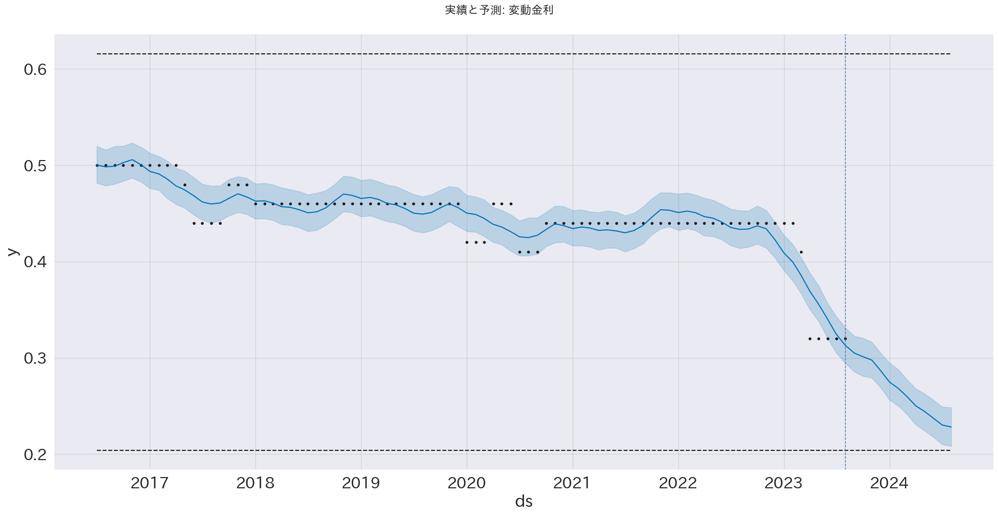

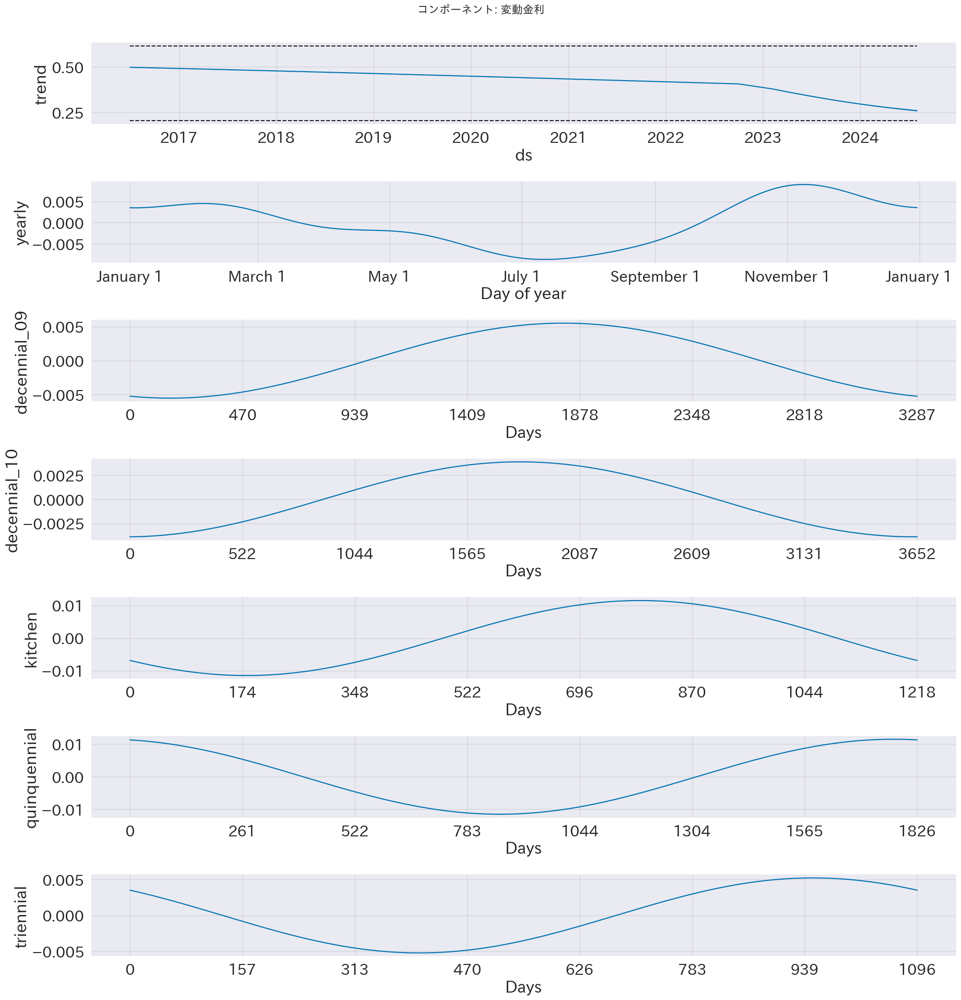

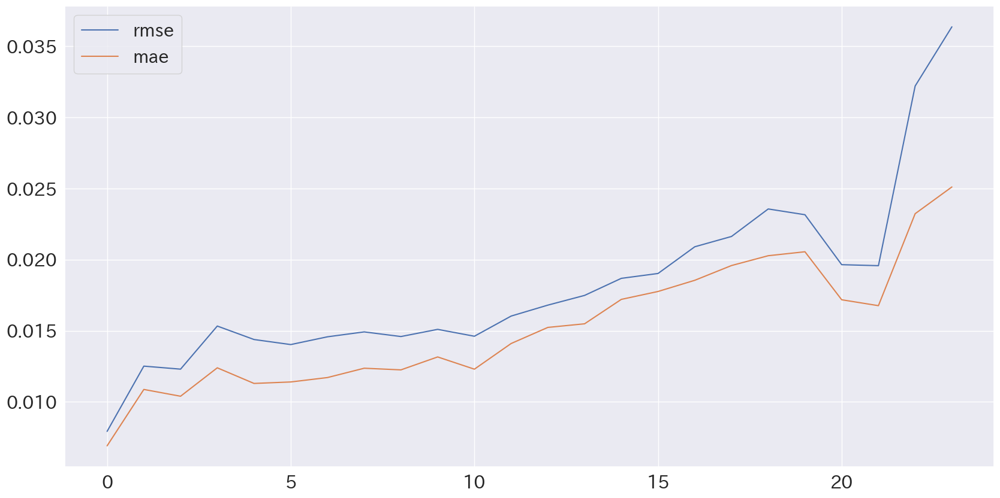

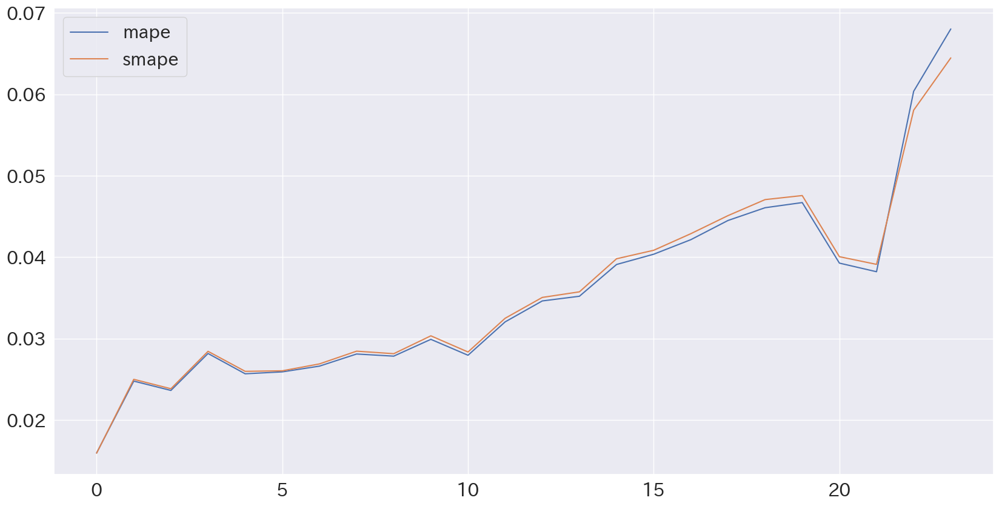

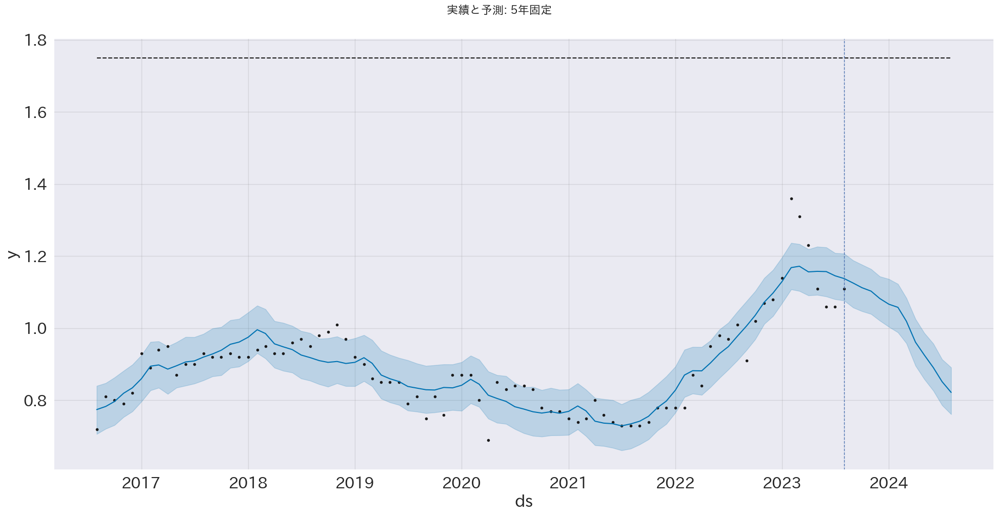

...

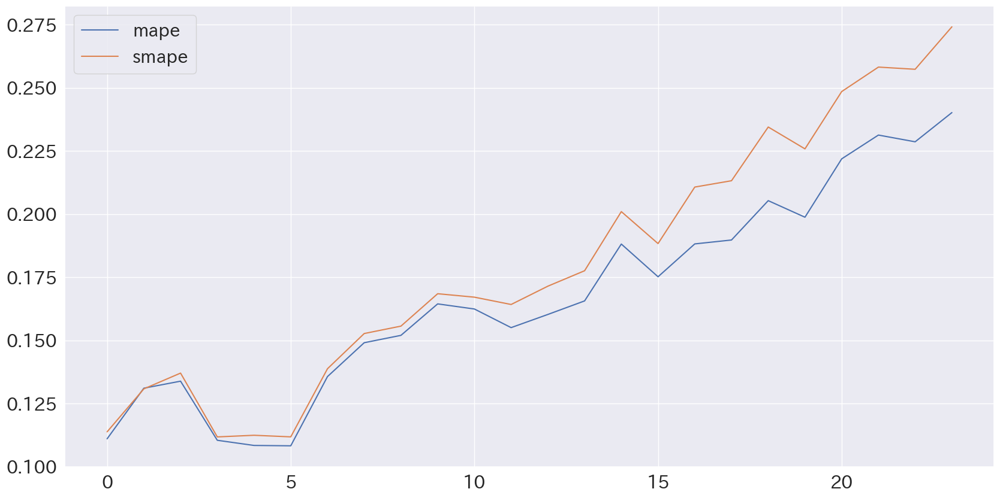

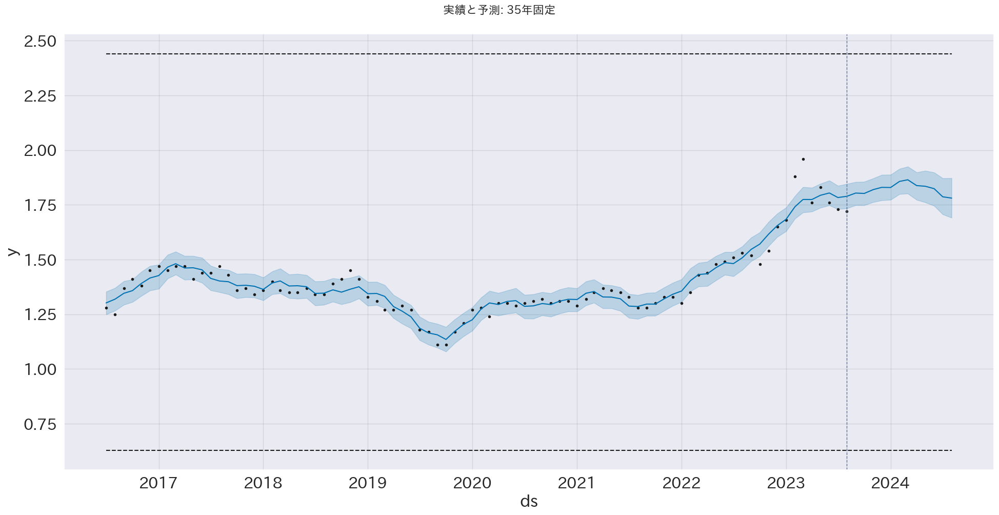

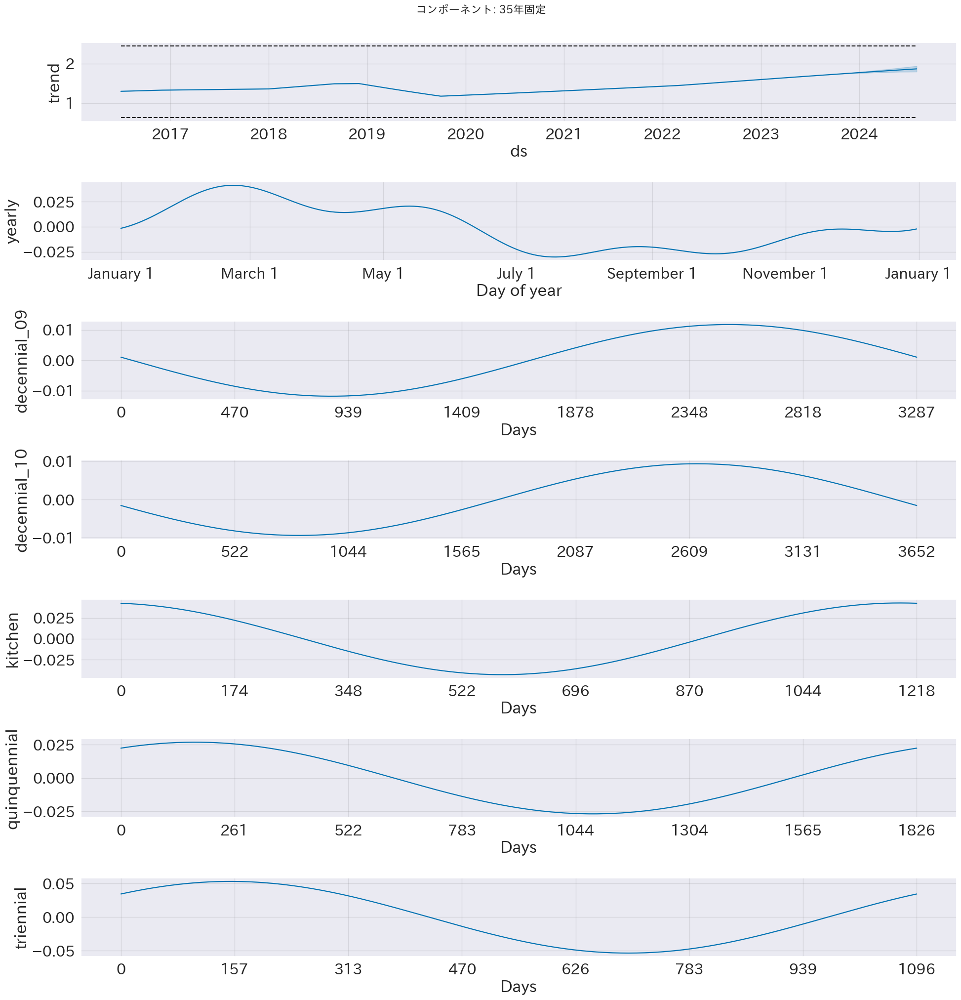

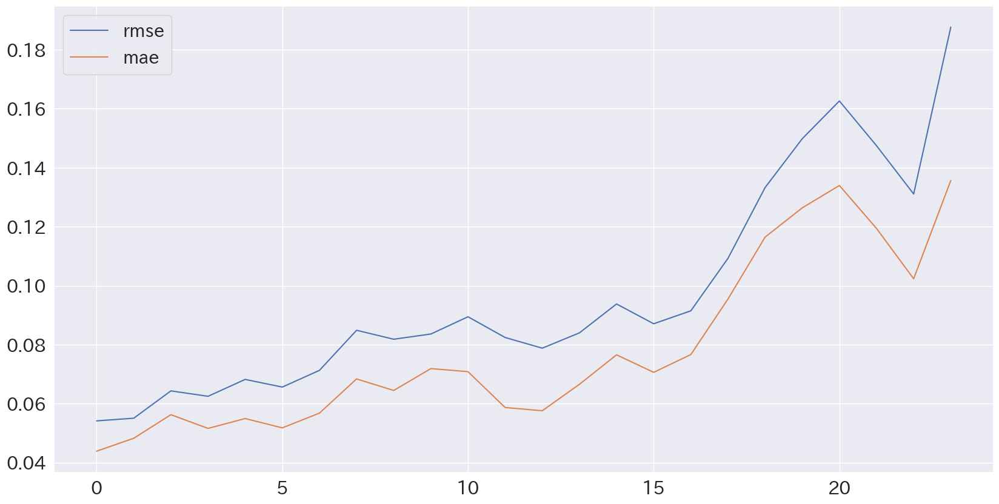

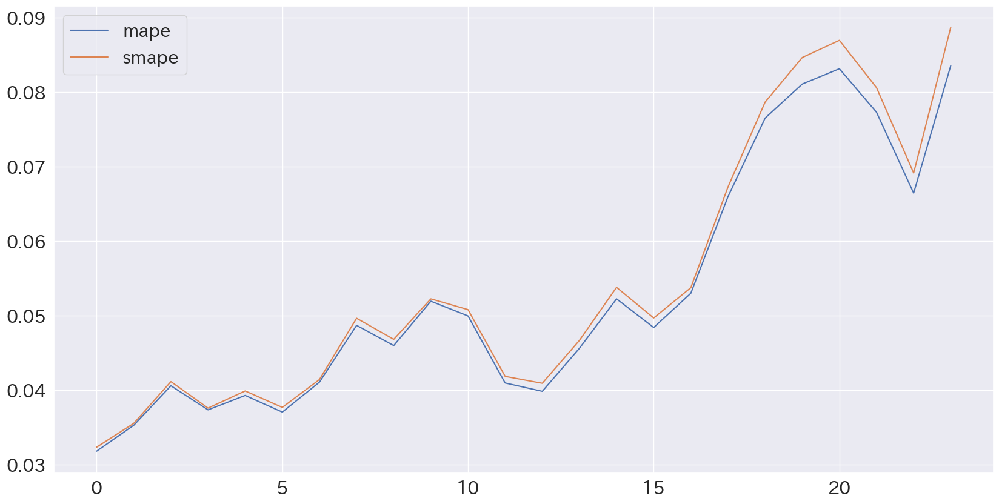

In [18]:
from prophet import Prophet
from prophet.plot import plot_plotly, plot_components_plotly


n_years = 1
n_predicts = 12 * n_years
n_changepoints = len(_df) // 6
print(f"{n_changepoints=}")


for rate_type in g_rate_types:
    bst: BestEstimator = bests[rate_type]

    # df = _df.rename({"年月": "ds", rate_type: "y"}, axis=1)
    # print(bst.study.best_params)

    # predict
    model: Prophet = bst.model
    future = model.make_future_dataframe(periods=n_predicts, freq="MS")

    limitter = Limitter(bst.df)
    future = setup_limit(future, limitter)
    forecast = model.predict(future)

    # plot prediction
    fig1: pyplot.Figure = model.plot(forecast, figsize=(20, 10))
    fig1.suptitle(f"実績と予測: {rate_type}", x=0.5, y=1.02, size=16)
    pyplot.axvline(bst.df.ds.iloc[-1], color='b', linestyle='--', lw=1)
    pyplot.show()

    # plot components
    fig2 = model.plot_components(forecast, figsize=(20, 20))
    fig2.suptitle(f"コンポーネント: {rate_type}", x=0.5, y=1.02, size=16)
    pyplot.show()

    # plot errors
    bst.df_pm[["rmse", "mae"]].plot()
    bst.df_pm[["mape", "smape"]].plot()
    pyplot.show()


In [19]:
# rate_type: str = "変動金利"
# rate_type: str = "5年固定"
rate_type: str = "10年固定"
# rate_type: str = "35年固定"
bst: BestEstimator = bests[rate_type]
bst.df.index = bst.df.ds
model: Prophet = bst.model

future = model.make_future_dataframe(periods=n_predicts, freq="MS")
future = setup_limit(future, Limitter(bst.df))
forecast = model.predict(future)


In [20]:
optuna.visualization.plot_contour(bst.study).show()

In [21]:
optuna.visualization.plot_edf(bst.study).show()

In [22]:
optuna.visualization.plot_optimization_history(bst.study).show()


In [23]:
optuna.visualization.plot_parallel_coordinate(bst.study).show()

In [24]:
pandas.DataFrame({k: [v] for k, v in bst.study.best_params.items()}, index=["VALUE"]).T

,VALUE
growth,flat
changepoint_range,0.950475
n_changepoints,25
changepoint_prior_scale,2.695254
seasonality_prior_scale,0.021787
seasonality_mode,multiplicative


In [25]:
optuna.visualization.plot_param_importances(bst.study).show()

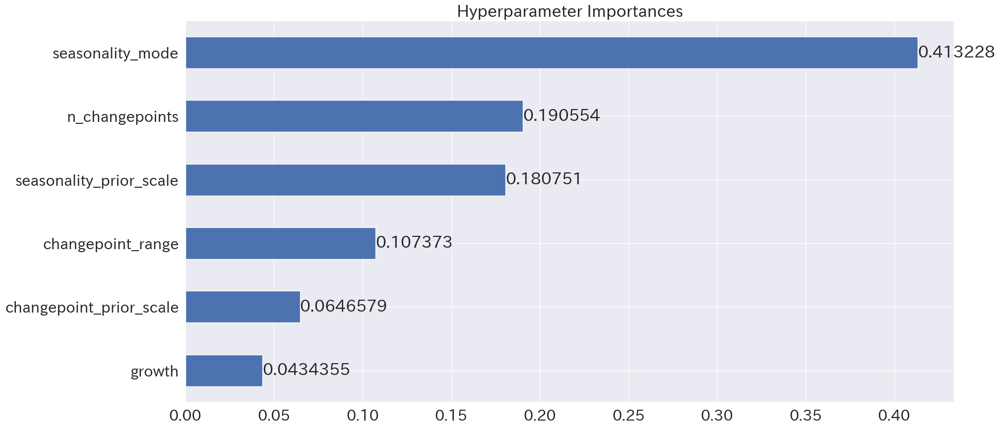

In [26]:
importances = optuna.importance.get_param_importances(study)
importances = dict(reversed(list(importances.items())))

importance_values = list(importances.values())
param_names = list(importances.keys())
importance_labels = [f"{val:.2f}" if val >= 0.01 else "<0.01" for val in importance_values]

# importance_labels
[(p, l) for p, l in zip(param_names, importance_labels)]
ax = pandas.DataFrame({"value": importance_values}, index=param_names).plot.barh(title="Hyperparameter Importances", legend=False)
ax.bar_label(ax.containers[0])
pyplot.show()

In [27]:
optuna.visualization.plot_slice(bst.study).show()


In [28]:
import plotly.graph_objs as go


In [29]:
# changepoint data
changepoints_threshold = 0.01
signif_changepoints = bst.model.changepoints[
    numpy.abs(numpy.nanmean(bst.model.params['delta'], axis=0)) >= changepoints_threshold
]
df_cp = signif_changepoints.reset_index(drop=True)
df_cp.head(3)

Series([], Name: ds, dtype: datetime64[ns])

In [30]:
fig: go.Figure = plot_plotly(model, forecast, trend=True, changepoints=True)
fig.update_layout(title=f"予測 : {rate_type}")

In [31]:
plot_components_plotly(model, forecast).update_layout(title=f"コンポーネント : {rate_type}")

/home/devuser/workspace/backend/.venv/lib/python3.10/site-packages/plotly/io/_json.py:557: UserWarning:

Discarding nonzero nanoseconds in conversion.



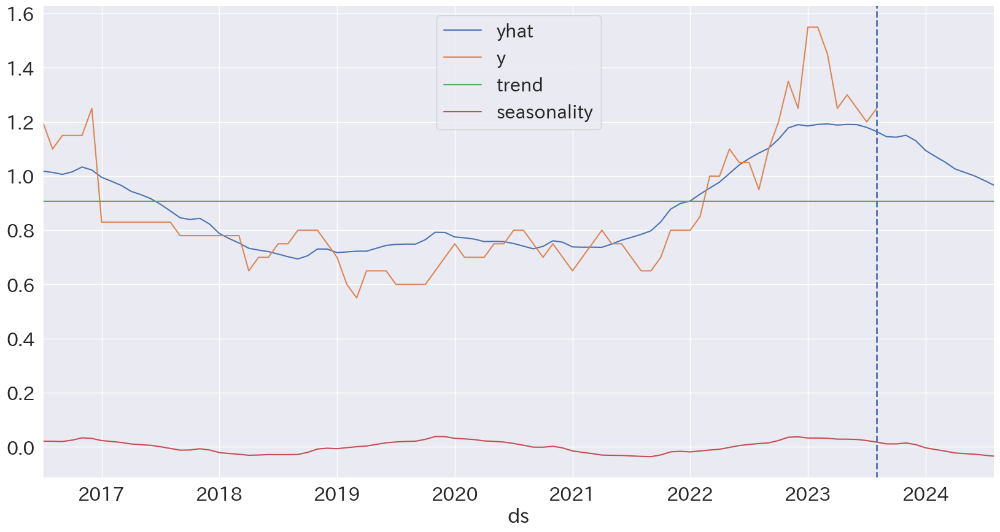

In [32]:
df_forecast = forecast.copy()
df_forecast.index = df_forecast.ds
seasonality_cols = ["yearly", "triennial", "kitchen"]

df_season = df_forecast[seasonality_cols].mean(axis=1).rename("seasonality").to_frame().set_index(df_forecast.ds)
df_season["yhat"] = df_forecast.yhat
df_season["y"] = bst.df.y
df_season["trend"] = df_forecast.trend

ax = df_season[["yhat", "y", "trend"]].plot()
ax = df_season[["seasonality"]].plot(kind="line", ax=ax)
ax.axvline(bst.df.ds.iloc[-1], color='b', linestyle='--', lw=2)
pyplot.show()

In [33]:
df_cv: pandas.DataFrame = bst.df_cv.copy()
df_cv.index = df_cv.ds
df_cv.drop("ds", axis=1, inplace=True)
df_cv.cutoff = df_cv.cutoff.astype(str)

for ctf, grp in df_cv.groupby("cutoff"):
    print(f"cutoff {ctf}: {grp.index[0]} 〜 {grp.index[-1]}")


cutoff 2020-08-01: 2020-09-01 00:00:00 〜 2021-08-01 00:00:00
cutoff 2020-11-01: 2020-12-01 00:00:00 〜 2021-11-01 00:00:00
cutoff 2021-02-01: 2021-03-01 00:00:00 〜 2022-02-01 00:00:00
cutoff 2021-05-01: 2021-06-01 00:00:00 〜 2022-05-01 00:00:00
cutoff 2021-08-01: 2021-09-01 00:00:00 〜 2022-08-01 00:00:00
cutoff 2021-11-01: 2021-12-01 00:00:00 〜 2022-11-01 00:00:00
cutoff 2022-02-01: 2022-03-01 00:00:00 〜 2023-02-01 00:00:00
cutoff 2022-05-01: 2022-06-01 00:00:00 〜 2023-05-01 00:00:00


In [34]:
base_dates = pandas.date_range(start=bst.df.ds.min(), end=df_cv.index.max(), freq="MS", name="ds")
base_dates = base_dates.to_frame().reset_index(drop=True)
base_dates.head(3)

,ds
0,2016-07-01
1,2016-08-01
2,2016-09-01


In [35]:
def setup_df_index(df: pandas.DataFrame, col="ds"):
    df.index = df[col]
    df.drop(col, axis=1, inplace=True)
    return df


In [36]:
bst.df.columns

Index(['ds', 'y', 'floor', 'cap'], dtype='object')

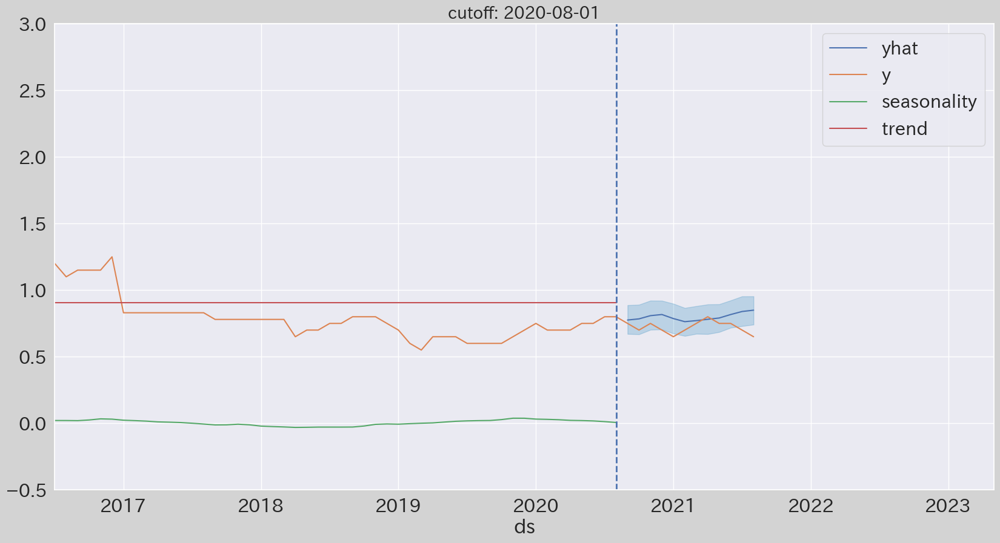

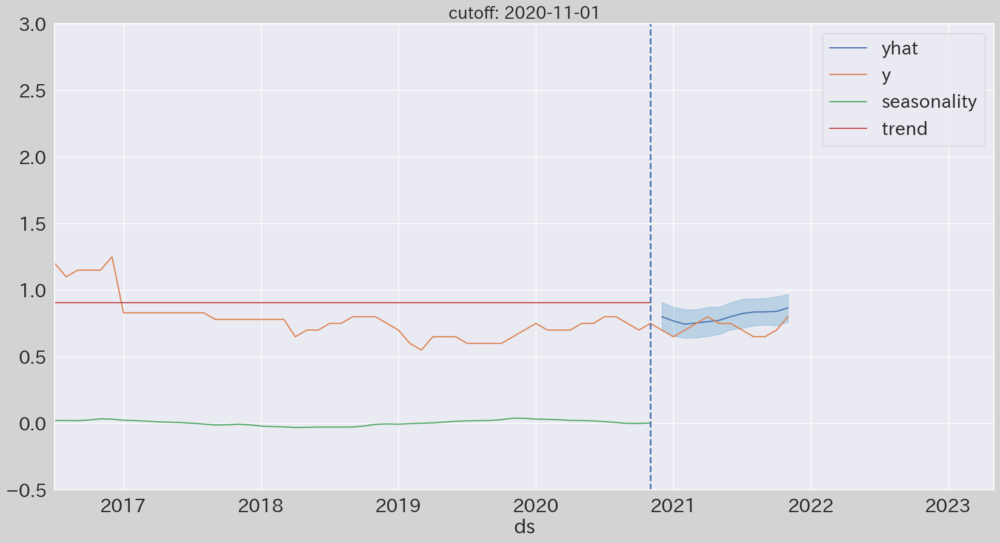

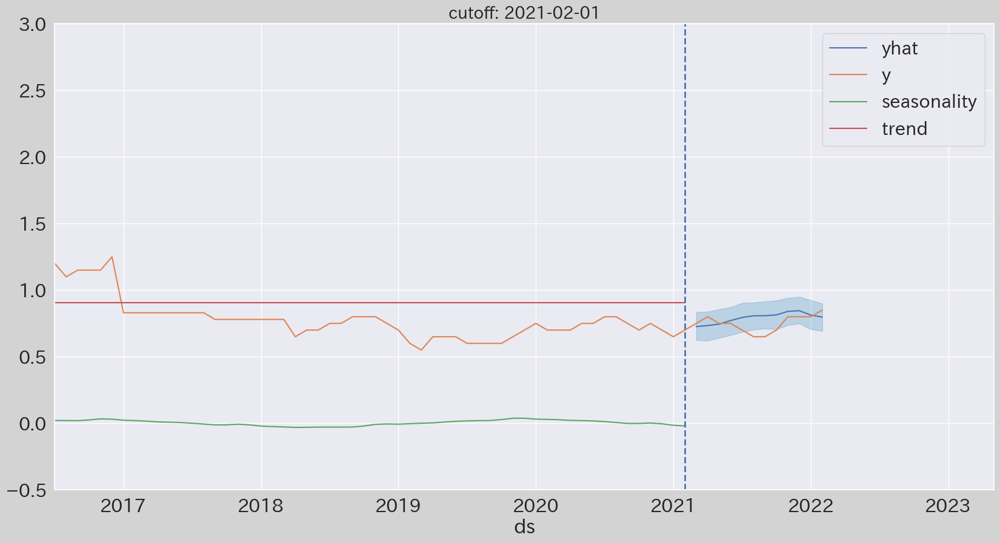

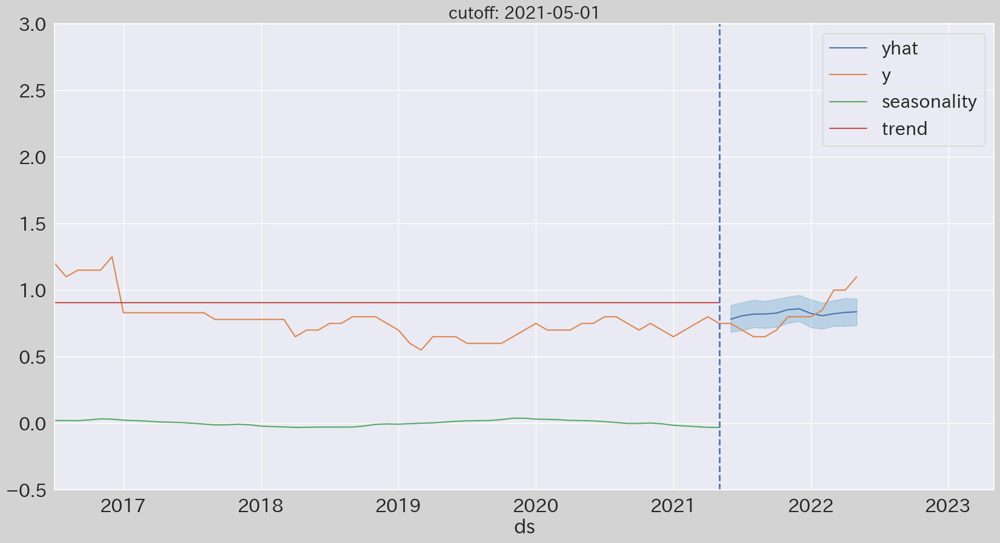

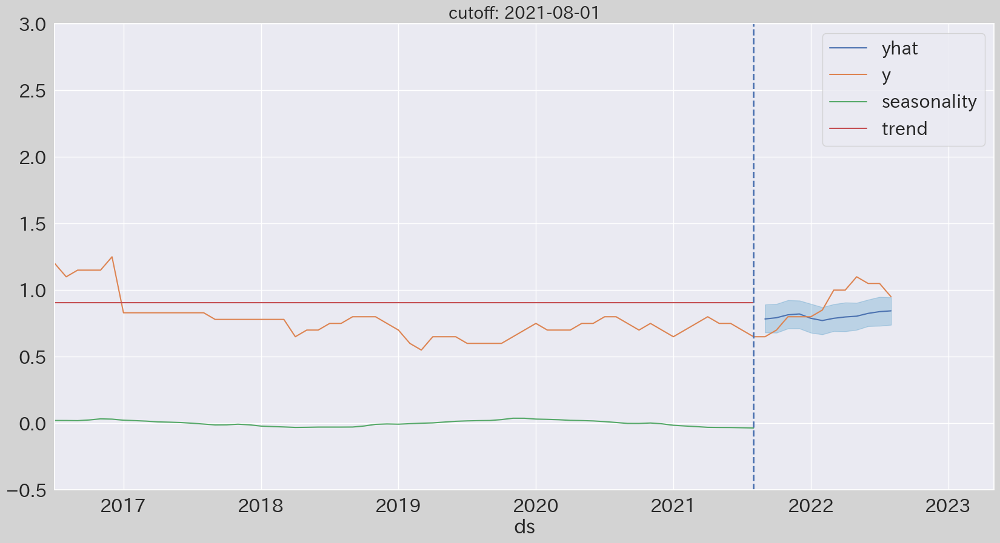

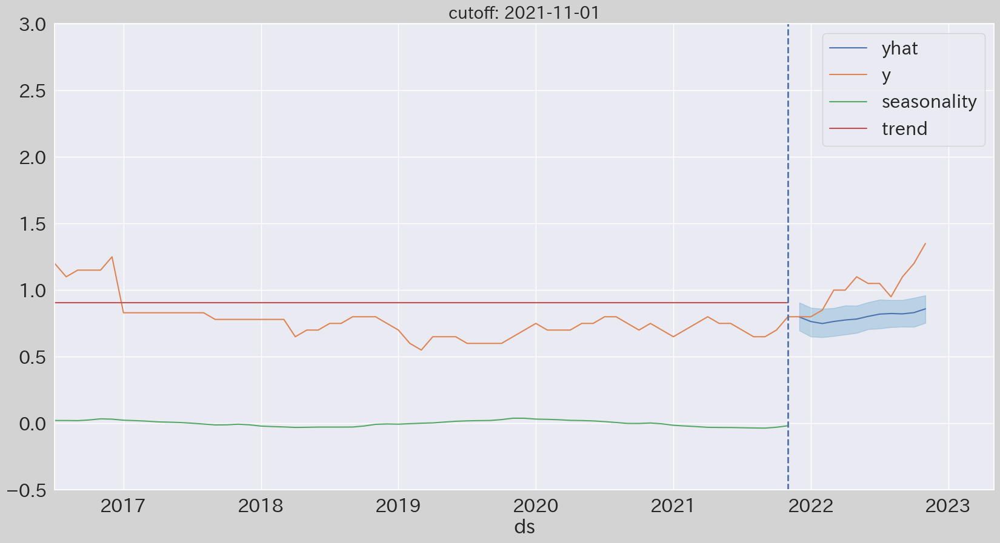

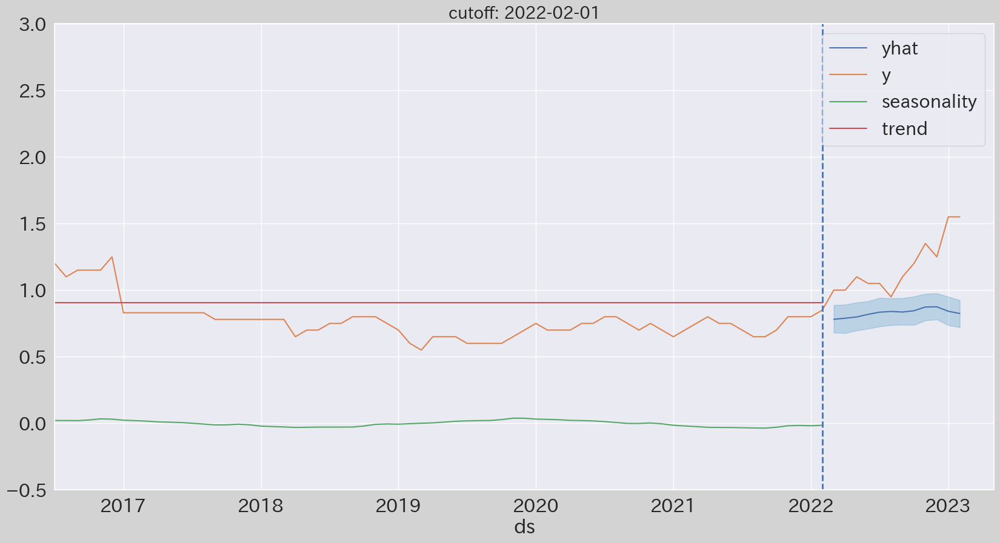

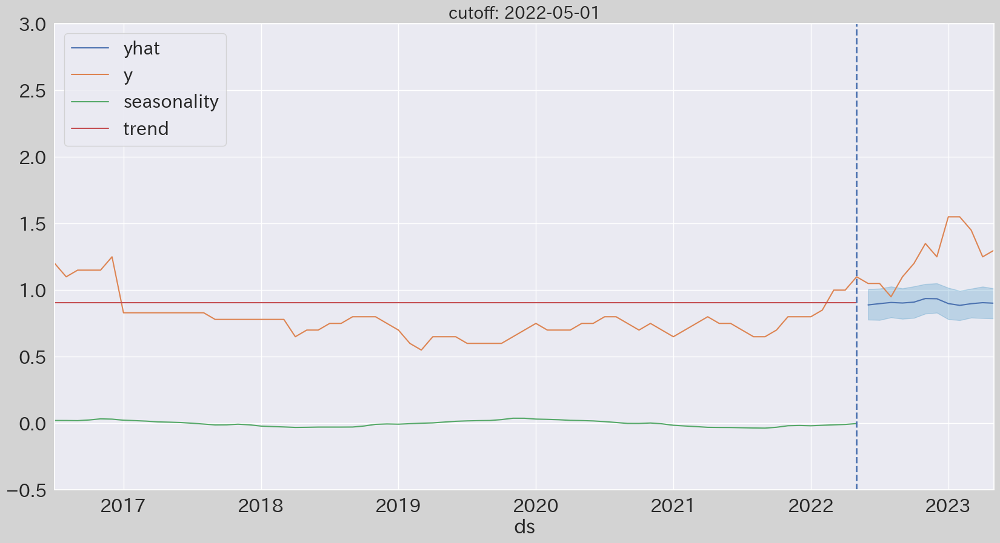

In [37]:
# import matplotlib.dates as mdates
    # ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y/%m'))
    # ax.xaxis.set_minor_formatter(mdates.DateFormatter('%m'))
use_horizon_actual = True

for ctf, grp in df_cv.groupby("cutoff"):
    if not use_horizon_actual:
        grp.drop("y", axis=1, inplace=True)
    df_plotter = pandas.merge(base_dates, grp.reset_index(), on="ds", how="left")
    setup_df_index(df_plotter)
    df_plotter.loc[:ctf, "y"] = bst.df.y.loc[:ctf]
    df_plotter = pandas.merge(df_plotter, df_season[["seasonality", "trend"]].loc[:ctf], on="ds", how="left")
    fig = pyplot.figure(facecolor='lightgrey', figsize=(20, 10))
    ax = fig.add_subplot(111)
    df_plotter[["yhat", "y", "seasonality", "trend"]].plot(ax=ax)
    ax.fill_between(df_plotter.index, df_plotter.yhat_lower, df_plotter.yhat_upper,
                    color='#0072B2', alpha=0.2, label='Uncertainty interval')
    ax.axvline(ctf, color='b', linestyle='--', lw=2)
    ax.set_ylim(-0.5, 3)

    pyplot.title(f"cutoff: {ctf}", fontsize=20)

    pyplot.show()

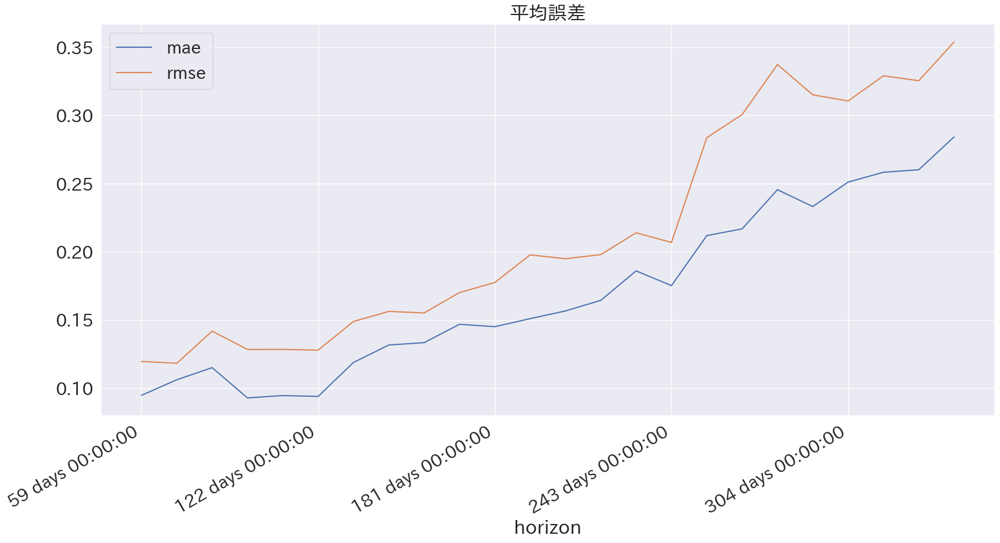

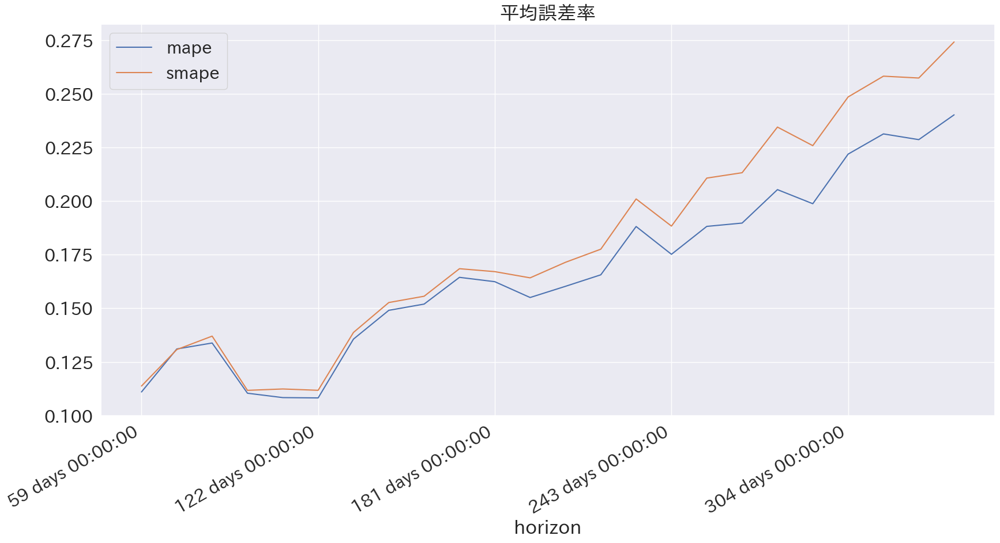

In [38]:
# fig = pyplot.figure(facecolor='lightgrey', figsize=(20, 10))
# ax = fig.add_subplot(111)

bst.df_pm.index = bst.df_pm.horizon
bst.df_pm[["mae", "rmse"]].plot(title="平均誤差")
bst.df_pm[["mape", "smape"]].plot(title="平均誤差率")
pyplot.show()

# 実験管理

In [39]:
for rate_type in g_rate_types:
    bst: BestEstimator = bests[rate_type]


In [40]:
import mlflow

experiment_name = "housing_loan_rate"

tracking_uri = f'sqlite:///../data/experiment.db'
mlflow.set_tracking_uri(tracking_uri)
# Experimentの生成
experiment = mlflow.get_experiment_by_name(name=experiment_name)
if experiment is None:
    experiment_id = mlflow.create_experiment(name=experiment_name)
else:
    experiment_id = experiment.experiment_id


In [41]:
experiment_id

'1'

In [42]:
bst.df_pm.mean().drop(["horizon", "coverage"]).to_dict()

{'mse': 0.010605036618539834,
 'rmse': 0.09666132245410375,
 'mae': 0.07815060355165442,
 'mape': 0.05304685253450242,
 'mdape': 0.046511792469725644,
 'smape': 0.054492425056339944}

In [43]:
g_end_date = datetime.now()
g_end_date


datetime.datetime(2023, 10, 19, 3, 29, 15, 811450)

# 実験結果を記録

In [44]:
from mlflow.models import infer_signature
from mlflow.data.pandas_dataset import PandasDataset


desc = "Predict the interest rate for loan"
with mlflow.start_run(experiment_id=experiment_id, run_name="trial", description=desc) as mlf:
    ds: PandasDataset = mlflow.data.from_pandas(_df, source=csv_file)
    mlflow.log_input(ds, context="simulation")
    for rt in g_rate_types:
        bst: BestEstimator = bests[rt]
        metrics: dict = bst.df_pm.mean().drop(["horizon", "coverage"]).to_dict()
        metrics = {f"{rt}/{k}": v for k, v in metrics.items()}
        mlflow.log_metrics(metrics=metrics)
        mlflow.log_param("start", g_start_date)
        mlflow.log_param("end", g_end_date)
        duration = int((g_end_date - g_start_date).seconds / 60)
        mlflow.log_param("duration", f"{duration} mins")
        signature = infer_signature(bst.df, bst.forecast)
        mlflow.prophet.log_model(bst.model, f"{rt}", signature=signature)


/home/devuser/workspace/backend/.venv/lib/python3.10/site-packages/mlflow/data/dataset_source_registry.py:143: UserWarning:

The specified dataset source can be interpreted in multiple ways: LocalArtifactDatasetSource, LocalArtifactDatasetSource. MLflow will assume that this is a LocalArtifactDatasetSource source.

/home/devuser/workspace/backend/.venv/lib/python3.10/site-packages/_distutils_hack/__init__.py:18: UserWarning:

Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.

/home/devuser/workspace/backend/.venv/lib/python3.10/site-packages/_distutils_hack/__init__.py:33: UserWarning:

Setuptools is replacing distutils.

/home/devuser/workspace/backend/

In [45]:
duration = (g_end_date - g_start_date).seconds / 60
duration

39.016666666666666

In [ ]:
# aaaaaaaaaaaa